# Spatial analytics in esports: data

This is the questionnaire data handling python code for the master's thesis of Timo Ijäs, University of Helsinki.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import string
import scipy.stats as stats
import math
import os
import datetime
import math

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

#from statsmodels.miscmodels.ordinal_model import OrderedModel
from statsmodels.nonparametric.kernel_regression import KernelReg
from statsmodels.discrete.discrete_model import Logit
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.experimental import enable_hist_gradient_boosting
# now you can import normally from ensemble
from sklearn.ensemble import HistGradientBoostingClassifier

from sklearn.model_selection import RandomizedSearchCV

from sklearn.inspection import permutation_importance

from pprint import pprint

from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from numpy import where

import random

warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("C:/Users/tipe_/Documents/Koulu/Gradu/Gradu tiedostoja/Questionnaire/responses_all4.csv", sep = ";")
skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]

In [3]:
def FixNewDf(newDf,qnum,orderA,orderB):
    for index, row in newDf.iterrows():
        i = 0
        ans = str(row[qnum])
        for item in orderA:
            ans = ans.replace(item,orderB[i],1)
            i+=1
        newDf.at[index,qnum]=ans
    return newDf
    

In [4]:
# Mistaken expert answer fix
df.at[2380,'Q2'] = "over 5000 hours"

In [5]:
orderA = ["Good reaction time", "Knowledge of advanced mechanics","Game knowledge (characters, abilities, maps, weapons)",
         "Positioning / movement","Game sense", "Strategy (character pick, playstyle)", "Technical / mechanical skills (precise timing of correct inputs)",
         "Map / spatial awareness", "Teamwork and communication", "Stress management", "Other"]
orderB = ["Reaction", "Knowledge of mechanics","Game knowledge","Position","Game sense", "Strategy", "Technical skills","Spatial awareness", "Teamwork", "Stress management", "Other"]

In [6]:
df2 = FixNewDf(df,'Q7',orderA,orderB)

In [7]:
orderA = ["Thinking about the game", "Studying aspects of the game inside the game",
        "Studying the game from videos", "Studying the game from forum posts, written guides or fanpages",
        "Doing data analysis", "I do not analyze","Other"]
orderB = ["Thinking", "In-game","Game videos","Text guides","Spatial data analysis", "I do not analyze", "Other"]

In [8]:
df2 = FixNewDf(df2,'Q9',orderA,orderB)

In [9]:
def FlagTrolls(df):
    df2 = df.copy()
    sames = 0
    badList = ['testicle','testicles','sexual','sex,''cock','¯\_(ツ)_/¯', 'fuck','penus','penis','anus','anal','okayish','fucking','sucks','balls', 'hack','cheat','hacks','cheats','nigger','nigga','shit','dumb','idiot', "bitch","bitches","gay","ass"]
    df2['trollScore'] = 0
    df2['ones'] = 0
    df2['multis'] = 0
    df2['short']= False
    df2['profanity'] = False
    df2['maliciousFill'] = False
    df2['contradict']= False
    table = str.maketrans("","")
    for index, row in df2.iterrows():
        # Add count of singular answers chosen in multiple-choice questions. More means suspicious.
        # Add count of almost all answers chosen in multiple-choice questions. More means suspicious.

        ones = 0
        multis = 0
        options = len(row['Q6'].split(","))
        if(options==1):
            ones +=1
        elif (options >6):
            multis +=1
            
            options2 = len(row['Q8'].split(","))
        
        options = len(row['Q7'].split(","))
        if(options==1):
            ones +=1
        elif (options >6):
            multis +=1
        if (options>=9) & (row['Q16']=="Would not use"):
            df2.at[index,'maliciousFill']=True
        
        options = len(row['Q8'].split(","))
        if(options==1):
            ones +=1
        elif (options >6):
            multis +=1
        
        options = len(row['Q9'].split(","))
        if(options==1):
            ones +=1
        elif (options >5):
            multis +=1
            
        options = len(row['Q11'].split(","))
        if(len(row['Q11'].split(","))==1):
            ones +=1
        elif (options >6):
            multis +=1
            
        options = len(row['Q12'].split(","))
        if(options==1):
            ones +=1
        elif (options >8):
            multis +=1
        
        df2.at[index,'ones']=ones
        df2.at[index,'multis']=multis
        
        # Find answers with profanity
        hasBad = False
        trollScore = 0
        words = []
        words = str(row['Q14']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        # Find answers that have 0-2 word answers in both open field questions
        if len(words)<3:
            trollScore += 1
        words2 = str(row['Q15']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        if len(words2)<3:
            trollScore += 1
        words.extend(words2)
        
        words2 = str(row['Q13']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q12']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q11']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q9']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q8']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q7']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        words2 = str(row['Q6']).lower().translate(str.maketrans('','',string.punctuation)).split(" ")
        words.extend(words2)
        
        if (row['Q16']=="Would use often"):
            if(row['Q10']=="I never do analysis") or (row['Q8']=="I do not analyze") or (row['Q9']=="I do not analyze") or (row['Q13']=="It's good as it is, no tools needed"):
                df2.at[index,'contradict']=True
        
        for item in badList:
            if item in words:
                hasBad = True
                df2.at[index,'profanity']=True
                #trollScore += 1
                pass
        if trollScore >0:
            df2.at[index,'short']=True
    return df2

In [10]:
flaggedDf= FlagTrolls(df2)

In [11]:
flaggedDf.loc[flaggedDf['multis']>2]

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q14,Q15,Q16,trollScore,ones,multis,short,profanity,maliciousFill,contradict
856,Dota 2,1001 - 2000 hours,11 - 20 hours,0,Advanced beginner,"Competitiveness, Entertainment, Multiplayer, H...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis often,...,Timing. It will make the game more competitive...,Not very helpful.,Would not use,0,0,4,False,False,True,False
1419,Dota 2,201 - 500 hours,11 - 20 hours,0,Competent,"Competitiveness, Entertainment, Multiplayer, H...","Game knowledge, Position, Game sense, Strategy...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis in specific occasions,...,"I don't necessarily aim to improve really, but...",Early and mid game heatmaps do not really tell...,Would use often,0,0,4,False,True,False,False
1431,Dota 2,2001 - 5000 hours,11 - 20 hours,1 - 5,Competent,"Competitiveness, Entertainment, Game genre or ...","Knowledge of mechanics, Game knowledge, Positi...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis in specific occasions,...,Analysis of the best teams is interesting,Not a lot of value,Would not use,0,1,3,False,False,True,False
1446,Dota 2,over 5000 hours,more than 30 hours,Over 20,Expert,"Competitiveness, Entertainment, Single player ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis regularly and systematically,...,Every time,Insufficient,Would not use,0,0,6,True,False,True,False
1584,Dota 2,over 5000 hours,0 - 5 hours,1 - 5,Proficient,"Competitiveness, Entertainment, Multiplayer, H...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis often,...,Discerning the cost/benefit of an item that wo...,"They are interesting, thought-provoking, and a...",Would use sometimes,0,1,3,False,False,False,False
1605,Dota 2,over 5000 hours,more than 30 hours,1 - 5,Proficient,"Competitiveness, Entertainment, Social aspects...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis often,...,Improving gameplay overall. I used to be a coa...,I couldnt load the images,Would use often,0,0,3,False,False,False,False
1856,PlayerUnknown's Battlegrounds,over 5000 hours,more than 30 hours,Over 20,Expert,"Competitiveness, Entertainment, Single player ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I never do analysis,...,"this survey fucking sucks, are you this big of...",cock n balls,Would not use,0,0,4,False,True,True,False
1937,PlayerUnknown's Battlegrounds,2001 - 5000 hours,more than 30 hours,Over 20,Proficient,"Competitiveness, Entertainment, Game genre or ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis regularly and systematically,...,https://twitter.com/Kova1evy/status/1269978163...,It is really well done in a highly competitive...,Would use often,0,0,5,False,False,False,False
2273,Super Smash Bros. Melee,501 - 1000 hours,6 - 10 hours,1 - 5,Competent,"Competitiveness, Entertainment, Single player ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides, S...",I do analysis in specific occasions,...,20xx and unclepunch has helped massively as a ...,This is what I mentioned earlier that I didn't...,Would use sometimes,0,0,3,False,False,Fa

In [12]:
1856, 1446

(1856, 1446)

In [13]:
flaggedDf.loc[flaggedDf['ones']>3].loc[flaggedDf['short']].iloc[120:].drop(['multis','short','trollScore'],axis=1)

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,ones,profanity,maliciousFill,contradict
2386,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,0,Novice,"Entertainment, Game genre or series, Multiplayer","Reaction, Knowledge of mechanics, Game knowled...",I do not analyze,I do not analyze,I never do analysis,None,None,"It's good as it is, no tools needed",Maps,Fascinating,Would not use,4,False,False,False
2399,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,0,Novice,Entertainment,"Reaction, Knowledge of mechanics, Position, Ga...",I do not analyze,I do not analyze,I never do analysis,None,None,Idk,Not really,"Looks pretty cool, not much use to me though",Would not use,5,False,False,False
2402,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,0,Novice,"Competitiveness, Entertainment, Game genre or ...","Reaction, Knowledge of mechanics, Game knowled...",I do not analyze,I do not analyze,I never do analysis,None,None,Better tools for visualizing data,custom stage making,cool,Probably would not use,4,False,False,False
2409,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,0,Novice,"Competitiveness, Entertainment, Single player ...","Reaction, Knowledge of mechanics, Game knowled...",I do not analyze,I do not analyze,I never do analysis,None,None,Better tools for visualizing data,Stage selection,Very interesting and potentially helpful,Would use sometimes,4,False,False,False
2410,Super Smash Bros. Melee,201 - 500 hours,0 - 5 hours,0,Novice,Single player modes,Game knowledge,I do not analyze,I do not analyze,I never do analysis,None,None,"It's good as it is, no tools needed",No,Useful for people who need it,Would not use,6,False,False,False
2411,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,1 - 5,Novice,"Entertainment, Game genre or series, Multiplayer","Reaction, Game knowledge, Position, Technical ...",I do not analyze,I do not analyze,I almost never do analysis,None,None,"It's good as it is, no tools needed",Ledge trapping,It's neat but above my level,Probably would not use,4,False,False,False
2413,Super Smash Bros. Melee,0 - 200 hours,0 - 5 hours,0,Novice,Opportunity for cyber sex,Intimate knowlege of own sexuality,I think about the bodies of other men,Especially their a holes,I never do analysis,Mmmmm dicky dicky do dos,Yummy yummy cummy timmy,Timmy!!!,Insert penis into anus,Large testicles,Would not use,6,True,False,False
2415,Super Smash Bros. Melee,201 - 500 hours,0 - 5 hours,0,Novice,"Competitiveness, Game genre or series, Social ...","Game knowledge, Technical skills",I do not analyze,I do not analyze,I never do analysis,None,None,Better tools for visualizing data,Ledge guards,Looks interesting,Probably would not use,4,False,False,False


In [14]:
check = 1825
print(flaggedDf.iloc[check]['Q8'])
print(flaggedDf.iloc[check]['Q9'])

I do not analyze, Chill and kill. You don't need to analyse shit to be good.
I do not analyze, Chill and kill


In [15]:
print("Q14  " + flaggedDf.iloc[1856]['Q14'])

Q14  this survey fucking sucks, are you this big of a nerd seriously?


In [16]:
flaggedDf.iloc[1856]['Q7']

'Reaction, Knowledge of mechanics, Game knowledge, Position, Game sense, Strategy, Technical skills, Spatial awareness, Teamwork, Stress management, N'

In [17]:
flaggedDf.loc[flaggedDf['profanity']].drop(['profanity','trollScore'],axis=1)

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q12,Q13,Q14,Q15,Q16,ones,multis,short,maliciousFill,contradict
77,Counter-Strike: Global Offensive,201 - 500 hours,6 - 10 hours,0,Advanced beginner,"Competitiveness, Game genre or series, Multipl...","Reaction, Game knowledge, Position, Game sense...","Thinking about gameplay, Conversations about g...","Thinking, Game videos, Text guides",I do analysis in specific occasions,...,Thematic maps (showing information about a cer...,"all of them, the game sucks at the data aspect...",More data analysis is always going to be benef...,In both more data would be nice / needed. \nAi...,Would use often,0,1,False,False,False
135,Counter-Strike: Global Offensive,501 - 1000 hours,more than 30 hours,0,Advanced beginner,"Competitiveness, Entertainment, High skill cei...","Position, Game sense, Strategy, Spatial awaren...","Thinking about gameplay, Reviewing play videos...","Thinking, In-game, Game videos, Text guides, S...",I do analysis often,...,Point / Overlay maps (showing multiple layers ...,Better tools for capturing video,I dont think i understand q. But maybe knowing...,1. Cool but i know my aim sucks 2. Not really ...,Would use sometimes,0,1,False,False,False
391,Counter-Strike: Global Offensive,2001 - 5000 hours,11 - 20 hours,0,Competent,"Competitiveness, Multiplayer, High skill ceili...","Reaction, Knowledge of mechanics, Position, Ga...","Thinking about gameplay, Reviewing play videos...","Thinking, In-game, Game videos, Spatial data a...",I do analysis often,...,Heatmaps,Better tools for visualizing data,Find accurate ranges for guns based on your cu...,"They're good, the aim is ok to determine maybe...",Would use often,1,1,False,False,False
407,Counter-Strike: Global Offensive,over 5000 hours,more than 30 hours,0,Competent,"Competitiveness, Entertainment, Single player ...","Position, Game sense, Strategy, Technical skil...","Thinking about gameplay, Reviewing play videos","Thinking, In-game",I do analysis in specific occasions,...,Thematic maps (showing information about a cer...,Better tools for visualizing data,Most newer players don't fundamentally underst...,"You are an idiot for using cobblestone, and th...",Would use sometimes,0,1,False,False,False
589,Counter-Strike: Global Offensive,2001 - 5000 hours,11 - 20 hours,0,Proficient,"Competitiveness, Entertainment, Social aspects...","Game knowledge, Position, Game sense, Technica...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides",I do analysis in specific occasions,...,Thematic maps (showing information about a cer...,Better tools for acquiring data,Understanding enemy contact timings and their ...,Former depicts accuracy on layer model and vis...,Would use sometimes,0,0,False,False,False
634,Counter-Strike: Global Offensive,over 5000 hours,11 - 20 hours,0,Proficient,"Competitiveness, Social aspects or community, ...","Reaction, Game knowledge, Position",I do not analyze,I do not analyze,I never do analysis,...,None,"It's good as it is, no tools needed",ouihgpouguigpi,okayish,Probably would not use,4,0,True,False,False
646,Counter-Strike: Global Offensive,1001 - 2000 hours,11 - 20 hours,1 - 5,Proficient,"Competitiveness, Entertainment, Social aspects...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","In-game, Game videos, Text guides, Spatial dat...",I do analysis often,...,AAAA,NUGGGGGGER,PENUS,Hauqha,Would use often,2,2,True,False,False
735,Dota 2,2001 - 5000 hours,21 - 30 hours,1 - 5,Advanced beginner,"Competitiveness, Entertainment, High skill cei...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, In-game, Game videos, Text guides",I do analysis often,...,Thematic maps (showing information about a cer...,Better tools for data analysis,Knowing the map and where your enemies are/cou...,Interesting...,Would use sometimes,0,1,True,False,False
961,Dota 2,2001 - 5000 

In [18]:
dropTable = [1856,1446,634,637,646,760,1100,1118,1141,1435,1543,1578,1579,1603,1686,1810,1811,1878,2305,2413]

In [19]:
flaggedDf.loc[flaggedDf['contradict']][60:].drop(['contradict','trollScore','multis'],axis=1)

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,ones,short,profanity,maliciousFill
2328,Super Smash Bros. Melee,1001 - 2000 hours,0 - 5 hours,6 - 10,Competent,"Competitiveness, Entertainment, Game genre or ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Conversations about g...","Thinking, Game videos",I do analysis in specific occasions,"Video tools, Mods",Thematic maps (showing information about a cer...,"It's good as it is, no tools needed",In-game frame data similar to Skullgirls (incl...,Heatmap not useful for Jigglybuff,Would use often,0,False,False,False
2335,Super Smash Bros. Melee,1001 - 2000 hours,more than 30 hours,1 - 5,Competent,"Competitiveness, Social aspects or community, ...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Reviewing play videos...","Thinking, In-game, Game videos, Text guides",I do analysis in specific occasions,"In-game tools, Mods",Spatial buffer analysis,"It's good as it is, no tools needed",Learning spacing and such is a lot easier havi...,Really helpful to get a good understanding of ...,Would use often,1,False,True,False
2456,Super Smash Bros. Melee,2001 - 5000 hours,6 - 10 hours,Over 20,Proficient,"Competitiveness, Game genre or series, High sk...","Reaction, Knowledge of mechanics, Game knowled...","Thinking about gameplay, Writing memos about g...","Thinking, In-game, Game videos",I do analysis in specific occasions,"In-game tools, Video tools, Mods",Distance metrics,"It's good as it is, no tools needed",It helps to visualize the threat bubble of the...,Good tools.,Would use often,1,True,False,False


In [20]:
def DropTrolls(df, dropTable):
    for item in dropTable:
        df = df.drop(item)
    return df
    

In [21]:
df= DropTrolls(df,dropTable)

In [22]:
def FixSkillLevel(df):
    df2 = df.copy()
    skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]
    played = ["0 - 200 hours", "201 - 500 hours", "501 - 1000 hours", "1001 - 2000 hours", "2001 - 5000 hours", "over 5000 hours"]
    play = ["0 - 5 hours", "6 - 10 hours", "11 - 20 hours", "21 - 30 hours", "more than 30 hours"]
    tournaments = ["0", "1 - 5", "6 - 10", "11 - 20", "Over 20"]
        
    df2['Skill'] = df2['Q5']

    badcount = 0
    goodcount = 0

    for index, row in df.iterrows():
        skill = 0
        test = 0
        minexp = 0
        plusexp = 0
        # match exp level to skill level
        for i in range(5):
            if row['Q5'] == skillList[i]:
                skill = i
                test = i
                
        if row['Q2']==played[0]:
            if skill > 0:
                minexp -= 1

    
        # Reduce skill level for lower things    
        for i in range(6):
            if row['Q2']==played[i]:
                if i < test:
                    minexp -= test -i
                elif i > test:
                    minexp += i - test
                plusexp += i - skill
            
        for i in range(5):
            if row['Q3']==play[i]:
                if i < test:
                    minexp -= 1
                else:
                    minexp +=1
                plusexp += i - skill
                    
        for i in range(5):
            if row['Q4']==tournaments[i]:
                if i < (test):
                    minexp -= 1
                else:
                    minexp += 1
                plusexp += i - skill
        
        # Check if exp is smaller than three, reduce skill level
        if plusexp >= 6:
            goodcount +=1
            #print("" + str(row['Q5'])+ " game: " + str(row['Q1']))
            df2.at[index,'Skill'] = skillList[skill+1]
            
        if minexp <=-4:
            df2.at[index,'Skill'] = skillList[skill-1]
            badcount +=1
            
    df2['Q5'] = df2['Skill']
    df2= df2.drop('Skill',axis=1)
    print("skill goes up: "+ str(goodcount)+ " skill goes down: " + str(badcount))
    return df2

In [23]:
df = FixSkillLevel(df)

skill goes up: 30 skill goes down: 86


In [24]:
# Make an ordered skill data type
t = pd.CategoricalDtype(categories=skillList, ordered=True)
ordered = pd.Series(df['Q5'], dtype=t)
df['orderedSkill'] = ordered

In [25]:
#df = df2.copy()

In [26]:
gameList = df['Q1'].unique().tolist()

In [27]:
gameList

['Counter-Strike: Global Offensive',
 'Dota 2',
 "PlayerUnknown's Battlegrounds",
 'Super Smash Bros. Melee']

In [28]:
from scipy import stats
from scipy.stats import wilcoxon
from scipy.stats import mannwhitneyu

def KruskalTest(df, skill, target):    
    stat, p = stats.kruskal(df[skill], df[target])
    print(target +" Kruskal Statistic: " + str(stat) + " p: " + str(p))
    alpha = 0.05
    if p > alpha:
        print('Kruskal failure p=%.3f' % p)
    else:
        print('*** Kruskal success (reject H0) p=%.3f' % p)

In [29]:
def MediansAndMeans(df, skill, target):
    skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]
    for i in range(5):    
        rankmean = df.loc[df[skill]==i][target].mean()
        rankmedian = df.loc[df[skill]==i][target].median()
        print(skillList[i] + " mean: " + str(round(rankmean,2)) + " median: " + str(rankmedian))

In [30]:
def MakeFileName(qnum,figtype,**kwargs):
    t = datetime.datetime.now()
    
    script_dir = "C:/Users/tipe_/Documents/Koulu/Gradu/Gradu tiedostoja"
    results_dir = os.path.join(script_dir, qnum+"/"+figtype+"/")
    
    try:
        kwargs["add"]
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+str(kwargs["add"])+'.png'
    except:
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+'.png'

    if not os.path.isdir(results_dir):
        os.makedirs(results_dir)
    
    return results_dir + sample_file_name
    

In [31]:
def MakeFileNameTxt(qnum,figtype,**kwargs):
    t = datetime.datetime.now()
    
    script_dir = "C:/Users/tipe_/Documents/Koulu/Gradu/Gradu tiedostoja"
    results_dir = os.path.join(script_dir, qnum+"/"+figtype+"/")
    
    try:
        kwargs["add"]
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+str(kwargs["add"])+'.txt'
    except:
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+'.txt'

    if not os.path.isdir(results_dir):
        os.makedirs(results_dir)
    
    return results_dir + sample_file_name

In [66]:
def MakeFileNameCsv(qnum,figtype,**kwargs):
    t = datetime.datetime.now()
    
    script_dir = "C:/Users/tipe_/Documents/Koulu/Gradu/Gradu tiedostoja"
    results_dir = os.path.join(script_dir, qnum+"/"+figtype+"/")
    
    try:
        kwargs["add"]
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+str(kwargs["add"])+'.csv'
    except:
        sample_file_name = qnum+'_'+figtype+'_'+t.strftime("%d%m%y%H%M")+'.csv'

    if not os.path.isdir(results_dir):
        os.makedirs(results_dir)
    
    return results_dir + sample_file_name

## Question 1: Which game will your answers in this questionnaire regard?

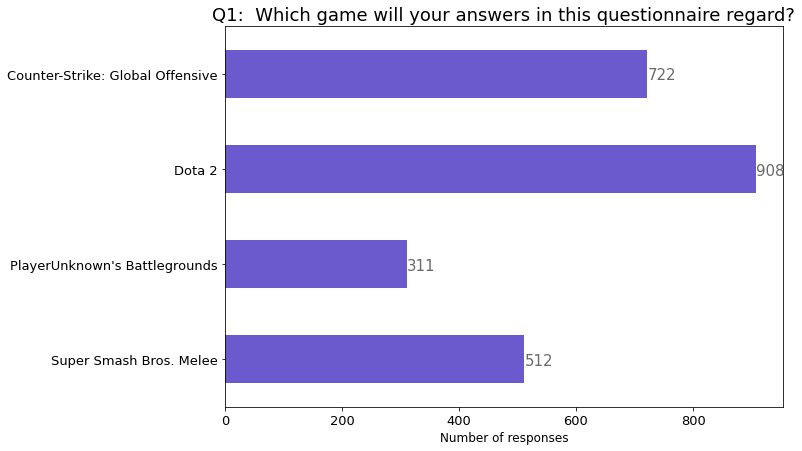

In [32]:
counts = df['Q1'].value_counts().reindex(index = gameList)
ax = counts.plot(kind='barh', figsize=(10,7),color="slateblue", fontsize=13);
ax.set_alpha(0.8)
ax.set_title("Q1:  Which game will your answers in this questionnaire regard?", fontsize=18)
ax.set_xlabel("Number of responses", fontsize=12);
ax.patch.set_facecolor('white')

# set individual bar lables using above list
for i in ax.patches:
    # get_width pulls left or right; get_y pushes up or down
    ax.text(i.get_width()+.1, i.get_y()+.31, \
            str(round((i.get_width()), 2)), fontsize=15, color='dimgrey')

# invert for largest on top 
ax.invert_yaxis()

fname = MakeFileName("Q1","bar1")
        
plt.savefig(fname,quality=0.95, dpi=300)
plt.show()

In [33]:
def DrawOneGraph(suptitle, qnum, order, df, **kwargs):
    ax = df[qnum].value_counts().reindex(index = order).plot(kind='barh', figsize=(12,7),
                                                 color="slateblue", fontsize=13);
    ax.set_alpha(0.8)
    ax.set_title(suptitle, fontsize=18)
    ax.set_xlabel("Number of responses", fontsize=12);
    try:
        ax.set_yticklabels(kwargs["yticklabels"], rotation=0, fontsize=11)
    except:
        pass
    # set individual bar lables using above list
    for i in ax.patches:
        # get_width pulls left or right; get_y pushes up or down
        ax.text(i.get_width()+.1, i.get_y()+.31, \
            str(round((i.get_width()), 2)), fontsize=15, color='dimgrey')
    
    fname = MakeFileName(qnum,"bar1")
    ax.margins(0.1, 0.1)
        
    plt.savefig(fname,quality=0.95, dpi=300)


In [34]:
def MakeNewDf(df, qnum):
    newDf = pd.DataFrame()
    newDf[qnum] = df[qnum]
    newDf['Q5'] = df['Q5']
    newDf['Q1'] = df['Q1']
    return newDf

In [35]:
def CountNewDf(newDf, qnum, orderB):
    # Create a column for each answer, initialize to zero
    for item in orderB:
        newDf[item]=0.0

    # Get count of options chosen in question, give those options 1/optionCount value to normalize
    for index, row in newDf.iterrows():
        test = row[qnum]
        row1= str.split(test, ", ")
        optionCount = 0.0
        noOther = True

        for item in row1:
            if item in orderB:
                optionCount +=1.0
            elif ((item not in row1) & (noOther)):
                optionCount += 1.0
                noOther = False

        if optionCount == 0.0:
            optionCount = 1.0

        for item in row1:
            if item in orderB:
                # make 1
                newDf.at[index,item] = 1.0
                #newDf.at[index, item] = 1.0 / optionCount
            else:
                newDf.at[index,'Other']=1.0
                #newDf.at[index, 'Other'] = 1.0 / optionCount
    return newDf

In [36]:
def SetupDf(df, qnum, orderA,orderB):
    newDf = MakeNewDf(df, qnum)
    newDf = FixNewDf(newDf,qnum,orderA,orderB)
    newDf = CountNewDf(newDf, qnum,orderB)
    newDf.to_csv(path_or_buf="csvdata/"+qnum+".csv", index=False, sep =";")
    return newDf

In [37]:
def PlotBars(qdf,qnum,suptitle, counts):
    fig = plt.figure(figsize=(12,7))
    fig.suptitle(suptitle, fontsize = 16)
    fig.patch.set_facecolor('white')

    ax = fig.add_subplot(111)

    #plt.barh(qdf.drop([qnum,'Q5','Q1'],axis=1).sum(),  color="slateblue", fontsize = 13)
    bar1 = qdf.drop([qnum,'Q5','Q1'],axis=1).sum().plot.barh(
            ax=ax, color="slateblue"
        )
    
    for i in bar1.patches:
        # get_width pulls left or right; get_y pushes up or down
        bar1.text(i.get_width()+1, i.get_y()+0, str(i.get_width())+ "\n (" + str(round((i.get_width()/len(qdf))*100,1)) + "%)", fontsize=10, color='dimgrey')

    ax.margins(0.1, 0.1)
    fname = MakeFileName(qnum,"Bars1")
    plt.gcf().subplots_adjust(left=0.2)
        
    plt.savefig(fname,quality=0.95, dpi=300)
    plt.show()

In [38]:
def IndividualGraphs(suptitle, qnum, xuplim, order, df, gameList, counts, **kwargs):
    fig, axes = plt.subplots(2, 2, figsize=(14, 8),sharex=True)

    fig.suptitle(suptitle,fontsize=16)

    k = 0
    for x in range(2):
      for y in range(2):
        data = df[qnum].loc[df['Q1']==gameList[k]].value_counts().reindex(index = order)
        ax = axes[x][y]
        bar1 = data.plot.barh(
            ax=ax, color="slateblue", title=(gameList[k]+" (n="+str(counts[k])+")")
        )

        ax.tick_params(axis='both', which='both', labelsize=10)

        try:
            kwargs["yticklabels"]
            ax.set_yticklabels(kwargs["yticklabels"], rotation=0, fontsize=11)
        except:
            pass
            
        for i in bar1.patches:
            # get_width pulls left or right; get_y pushes up or down
            bar1.text(i.get_width()+1, i.get_y()+0, str(i.get_width())+ "\n (" + str(round(((i.get_width()/counts[k])*100),2)) + "%)", fontsize=10, color='dimgrey')
        
        ax.margins(0.1, 0.1)
        
        k+=1


    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.3)
    plt.xlim([0,xuplim])
    
    fname = MakeFileName(qnum,"Bars2")
        
    plt.savefig(fname,quality=0.95, dpi=300)
    plt.show()

    plt.show()

In [39]:
def IndividualGraphsB(suptitle, qnum, order, df, gameList, counts, **kwargs):
    #fig, axes = plt.subplots(2, 2, figsize=(14, 8),sharex=True)
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    fig.patch.set_facecolor('white')
    fig.suptitle(suptitle,fontsize=16)

    k = 0
    for x in range(2):
      for y in range(2):
        ax = axes[x][y]
        data = df.drop([qnum,'Q5','Q1'], axis=1).loc[df['Q1']==gameList[k]].sum()

        bar1 = data.plot.barh(
            ax=ax, color="slateblue", title=(gameList[k]+" (n="+str(counts[k])+")")
        )

        ax.tick_params(axis='both', which='both', labelsize=10)

        try:
            kwargs["yticklabels"]
            ax.set_yticklabels(kwargs["yticklabels"], rotation=0, fontsize=11)
        except:
            pass
            
        for i in bar1.patches:
            # get_width pulls left or right; get_y pushes up or down
            bar1.text(i.get_width()+0.2, i.get_y()+0, str(round(i.get_width(),2))+ "\n (" + str(round(((i.get_width()/counts[k])*100),1)) + "%)", fontsize=10, color='dimgrey')
        
        ax.margins(0.2, 0.2)
        k+=1


    plt.subplots_adjust(left=0.15, bottom=None, right=None, top=None, wspace=0.45, hspace=0.3)
    plt.tight_layout()
    fname = MakeFileName(qnum,"Bars2")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    plt.show()

In [40]:
def IndividualGraphsC(suptitle, qnum, order, df, **kwargs):
    #fig, axes = plt.subplots(2, 2, figsize=(14, 8),sharex=True)
    fig, axes = plt.subplots(5, 4, figsize=(25, 20))
    
    gameList = ['Counter-Strike: Global Offensive','Dota 2',"PlayerUnknown's Battlegrounds",'Super Smash Bros. Melee']
    skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]
    counts = MakeCountsC(qdf,skillList,gameList)

    fig.suptitle(suptitle,fontsize=30)
    fig.patch.set_facecolor('white')

    k = 0
    for x in range(5):
        j = 0
        for y in range(4):
            ax = axes[x][y]
            data = df.drop([qnum,'Q5','Q1'], axis=1).loc[df['Q1']==gameList[j]].loc[df['Q5']==skillList[k]].sum()

            bar1 = data.plot.barh(
                #ax=axes[x][y], color="slateblue", title=(gameList[j]+", "+skillList[k])
                ax=ax, color="slateblue"

            )

            ax.tick_params(axis='both', which='both', labelsize=10)

            try:
                kwargs["yticklabels"]
                ax.set_yticklabels(kwargs["yticklabels"], rotation=0, fontsize=11)
            except:
                pass

            for i in bar1.patches:
                # get_width pulls left or right; get_y pushes up or down
                bar1.text(i.get_width()+0, i.get_y()+0, str(round(i.get_width(),2))+"\n (" + str(round(((i.get_width()/counts.at[skillList[x],gameList[y]])*100),1)) + "%)", fontsize=10, color='dimgrey')
            ax.margins(0.3, 0.3)
            j+=1
        
        k +=1

    fsize= 'xx-large'
    fig.text(0.2, 0.9, 'Counter-Strike: Global Offensive', ha='center', va='center', size=fsize)
    fig.text(0.4, 0.9, 'Dota 2', ha='center', va='center',size=fsize)
    fig.text(0.62, 0.9, 'PlayerUnknowns Battlegrounds', ha='center', va='center',size=fsize)
    fig.text(0.82, 0.9, 'Super Smash Bros. Melee', ha='center', va='center',size=fsize)


    vertOffset = 0.07
    fig.text(vertOffset, 0.8, 'Novice', ha='right', va='center',size=fsize)
    fig.text(vertOffset, 0.65, 'Advanced \nbeginner', ha='right', va='center',size=fsize)
    fig.text(vertOffset, 0.5, 'Competent', ha='right', va='center',size=fsize)
    fig.text(vertOffset, 0.35, 'Proficient', ha='right', va='center',size=fsize)
    fig.text(vertOffset, 0.2, 'Expert', ha='right', va='center',size=fsize)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.1)

    fname = MakeFileName(qnum,"Bars3")
        
    plt.savefig(fname,quality=0.95, dpi=300)
    
    plt.show()

In [41]:
def IndividualLines(suptitle, qnum, order, df, **kwargs):
    fig, axes = plt.subplots(4, 1, figsize=(25, 20),sharey=True)
    
    gameList = ['Counter-Strike: Global Offensive','Dota 2',"PlayerUnknown's Battlegrounds",'Super Smash Bros. Melee']
    skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]
    lineColors =['crimson','mediumorchid','slateblue','darkseagreen','black']

    fig.suptitle(suptitle,fontsize=30)
    fig.patch.set_facecolor('white')

    for x in range(4):
        for y in range(5):
            targetRows = df.drop([qnum,'Q5','Q1'], axis=1).loc[df['Q1']==gameList[x]].loc[df['Q5']==skillList[y]]
            data = targetRows.sum()
            data = round((data / len(targetRows))*100,2)


            bar1 = data.plot(
                ax=axes[x], color=lineColors[y], label= skillList[y]

            )

            axes[x].set_xticks(np.arange(len(data)))
            axes[x].tick_params(axis='both', which='both', labelsize=12)

            try:
                kwargs["yticklabels"]
                axes[x].set_yticklabels(kwargs["yticklabels"], rotation=0, fontsize=11)
            except:
                pass

            for i in bar1.patches:
                # get_width pulls left or right; get_y pushes up or down
                bar1.text(i.get_width()+0.1, i.get_y()+0, str(round(i.get_width(),2)), fontsize=10, color='dimgrey')

        #axes[x].legend(loc='upper right', frameon=False)
        axes[x].set_title(gameList[x], fontsize=16)
        axes[x].grid( 'on', axis='x' )
        axes[x].grid( 'on', axis='x', which='minor' )
        axes[x].grid( 'on', axis='y' )
        axes[x].grid( 'on', axis='y', which='minor' )
        
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center',frameon=False,fontsize='x-large', ncol=1,handleheight=2.4, labelspacing=0.05)

    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    
    fname = MakeFileName(qnum,"Lines1")
        
    plt.savefig(fname,quality=0.95, dpi=300)
        #plt.tight_layout()

    plt.show()


In [42]:
def IndividualLinesSkill(suptitle, qnum, order, df, **kwargs):
    # Four games, four subplots
    fig, axes = plt.subplots(4, 1, figsize=(25, 20),sharey=True)
    
    # These are lists that are needed for making every graph
    gameList = ['Counter-Strike: Global Offensive','Dota 2',"PlayerUnknown's Battlegrounds",'Super Smash Bros. Melee']
    skillList = ["Novice", "Advanced beginner", "Competent", "Proficient", "Expert"]
    #lineColors =['crimson','mediumorchid','slateblue','darkseagreen','black', '#000000']
    lineColors =['#000000','#E69F00','#009E73','#0072B2','#D55E00','#CC79A7','#D81B60','#1E88E5','#004D40']
    linestyles = ['-', '--',':']
    fig.patch.set_facecolor('white')
    
    
    # List of column names in the df argument
    columnsList = df.drop([qnum,'Q5','Q1'],axis=1).columns
    
    # Set title of the whole plot
    fig.suptitle(suptitle,fontsize=30, x=0.3)
    
    # Create a subplot for each game individually
    for i in range(len(gameList)):
        
        # Set up dataframe that has skill level as columns and options as rows
        skillColumnDf = pd.DataFrame(columns=skillList, dtype=float)
        
        # Count percentages for each row
        for skill in skillList: 
            k = 0
            for col in columnsList:
                data = df.loc[qdf['Q1']==gameList[i]].loc[df['Q5']==skill][col]
                prop = round(data.sum() / len(data)*100,2)
                skillColumnDf.at[k,skill]=prop
                k+=1
        
        # Add each row (Answer) as a line to the current subplot axes[i]
        for colNum in range(len(columnsList)):
            bar1 = skillColumnDf.iloc[colNum].plot(ax=axes[i], label= columnsList[colNum], color=lineColors[colNum%9],linewidth=2,marker='o',linestyle=linestyles[round(colNum/9)])
            
            # Set ticks for x-axis
            axes[i].set_xticks(np.arange(len(skillList)))
            
            # Set tick parameters for axes
            axes[i].tick_params(axis='both', which='both', labelsize=12)

        # Set legend and grids on for each subplot
        axes[i].set_title(gameList[i], fontsize=16)
        axes[i].grid( 'on', axis='x' )
        axes[i].grid( 'on', axis='x', which='minor' )
        axes[i].grid( 'on', axis='y' )
        axes[i].grid( 'on', axis='y', which='minor' )

    fsize= 'xx-large'
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right',frameon=False,fontsize='xx-large', ncol=2,handleheight=2.4, labelspacing=0.05)

    # Add texts to the right side of each subplot
    #fig.text(0.05, 0.8, 'Counter-Strike: Global Offensive', ha='right', va='center',size=fsize)
    #fig.text(0.05, 0.6, 'Dota 2', ha='right', va='center',size=fsize)
    #fig.text(0.05, 0.4, 'PlayerUnknowns Battlegrounds', ha='right', va='center',size=fsize)
    #fig.text(0.05, 0.2, 'Super Smash Bros. Melee', ha='right', va='center',size=fsize)
    
    # Adjust the locations of subplots
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    fname = MakeFileName(qnum,"Lines2")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    plt.show()

In [43]:
def Q5AnswersToCodes(row):
    if row['Q5'] == "Novice":
        return 0
    elif row['Q5'] == "Advanced beginner":
        return 1
    elif row['Q5'] == "Competent":
        return 2
    elif row['Q5'] == "Proficient":
        return 3
    else:
        return 4

In [44]:
def MakeCountsB(qdf, orderB):
    countsB = {}
    for item in orderB:
        countsB[item]= qdf[item].sum()
    return countsB

In [45]:
def MakeCountsC(qdf,skillList,gameList):
    countsC = pd.DataFrame(0,columns=gameList,index=skillList)
    for game in gameList:
        for skill in skillList:
            countsC.at[skill,game]= len(qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill])
    return countsC

In [69]:
def MakeCountsD(qdf,skillList,gameList,qnum,orderB):
    countsD = pd.DataFrame(0,columns=[""],index=orderB)
    gameAb = [" CS:GO", " Dota 2"," PUBG", " Melee"]
    j=0
    for game in gameList:
        
        for skill in skillList:
            for item in orderB:
                gameCount = len(qdf.loc[qdf['Q1']==game].loc[qdf[qnum]==item])
                thisGame = len(qdf.loc[qdf['Q1']==game])
                countsD.at[item,gameAb[j]]= str(gameCount) + " (" + str(round(gameCount/thisGame*100,1)) + "%)"
                
                thisCount= len(qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill].loc[qdf[qnum]==item])
                thisSkill = len(qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill])
                countsD.at[item,skill+gameAb[j]]= str(thisCount) + " (" + str(round(thisCount/thisSkill*100,1)) + "%)"
        j+=1
    
    for item in orderB:
        thisCount= len(qdf.loc[qdf[qnum]==item])
        countsD.at[item,"sum"]= str(thisCount) + " (" + str(round(thisCount/len(qdf)*100,1)) + "%)"
    
    return countsD

## Question 2: What is your played time in the game?

In [46]:
orderA = ["0 - 200 hours", "201 - 500 hours", "501 - 1000 hours", "1001 - 2000 hours", 
         "2001 - 5000 hours", "over 5000 hours"]
orderB = ["0 - 200", "201 - 500", "501 - 1000", "1001 - 2000", 
         "2001 - 5000", "> 5000 hours"]
suptitle = "Q2: What is your played time in the game?"
qnum = 'Q2'


qdf = SetupDf(df,qnum,orderA,orderB)
countsB = MakeCountsB(qdf, orderB)

In [51]:
qdf

,Q2,Q5,Q1,0 - 200,201 - 500,501 - 1000,1001 - 2000,2001 - 5000,> 5000 hours
0,0 - 200,Novice,Counter-Strike: Global Offensive,1.0,0.0,0.0,0.0,0.0,0.0
1,0 - 200,Advanced beginner,Counter-Strike: Global Offensive,1.0,0.0,0.0,0.0,0.0,0.0
2,501 - 1000,Advanced beginner,Counter-Strike: Global Offensive,0.0,0.0,1.0,0.0,0.0,0.0
3,501 - 1000,Advanced beginner,Counter-Strike: Global Offensive,0.0,0.0,1.0,0.0,0.0,0.0
4,201 - 500,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2468,2001 - 5000,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,0.0,1.0,0.0
2469,> 5000 hours,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,0.0,0.0,1.0
2470,501 - 1000,Proficient,Super Smash Bros. Melee,0.0,0.0,1.0,0.0,0.0,0.0
2471,1001 - 2000,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0,0.0


In [48]:
countsB

{'0 - 200': 184.0,
 '201 - 500': 235.0,
 '501 - 1000': 294.0,
 '1001 - 2000': 480.0,
 '2001 - 5000': 782.0,
 '> 5000 hours': 478.0}

In [70]:
countsDf = MakeCountsD(qdf,skillList,gameList,qnum,orderB)


In [71]:
countsDf

,,CS:GO,Novice CS:GO,Advanced beginner CS:GO,Competent CS:GO,Proficient CS:GO,Expert CS:GO,Dota 2,Novice Dota 2,Advanced beginner Dota 2,...,Competent PUBG,Proficient PUBG,Expert PUBG,Melee,Novice Melee,Advanced beginner Melee,Competent Melee,Proficient Melee,Expert Melee,sum
0 - 200,0,49 (6.8%),29 (63.0%),19 (14.4%),1 (0.3%),0 (0.0%),0 (0.0%),25 (2.8%),20 (58.8%),4 (1.8%),...,2 (1.3%),0 (0.0%),0 (0.0%),81 (15.8%),44 (83.0%),31 (20.8%),6 (2.6%),0 (0.0%),0 (0.0%),184 (7.5%)
201 - 500,0,89 (12.3%),12 (26.1%),44 (33.3%),33 (8.9%),0 (0.0%),0 (0.0%),39 (4.3%),9 (26.5%),24 (10.5%),...,16 (10.5%),1 (1.3%),0 (0.0%),76 (14.8%),5 (9.4%),44 (29.5%),27 (11.5%),0 (0.0%),0 (0.0%),235 (9.6%)
501 - 1000,0,115 (15.9%),4 (8.7%),40 (30.3%),66 (17.8%),5 (3.0%),0 (0.0%),56 (6.2%),2 (5.9%),37 (16.2%),...,26 (17.1%),10 (13.0%),0 (0.0%),80 (15.6%),4 (7.5%),38 (25.5%),36 (15.4%),1 (1.9%),1 (4.3%),294 (12.0%)
1001 - 2000,0,152 (21.1%),1 (2.2%),22 (16.7%),107 (28.8%),22 (13.4%),0 (0.0%),156 (17.2%),1 (2.9%),66 (28.9%),...,52 (34.2%),16 (20.8%),2 (9.5%),91 (17.8%),0 (0.0%),24 (16.1%),61 (26.1%),5 (9.4%),1 (4.3%),480 (19.6%)
2001 - 5000,0,249 (34.5%),0 (0.0%),6 (4.5%),142 (38.3%),100 (61.0%),1 (11.1%),340 (37.4%),2 (5.9%),77 (33.8%),...,50 (32.9%),35 (45.5%),10 (47.6%),96 (18.8%),0 (0.0%),10 (6.7%),64 (27.4%),18 (34.0%),4 (17.4%),782 (31.9%)
> 5000 hours,0,68 (9.4%),0 (0.0%),1 (0.8%),22 (5.9%),37 (22.6%),8 (88.9%),292 (32.2%),0 (0.0%),20 (8.8%),...,6 (3.9%),15 (19.5%),9 (42.9%),88 (17.2%),0 (0.0%),2 (1.3%),40 (17.1%),29 (54.7%),17 (73.9%),478 (19.5%)


In [72]:
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

In [79]:
len(qdf)

2453

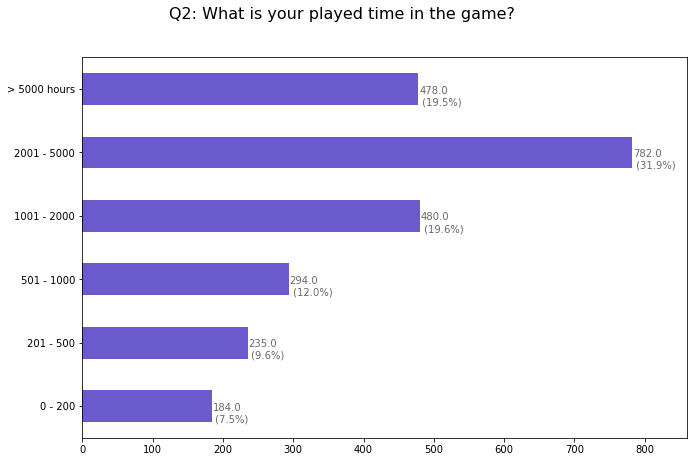

In [240]:
PlotBars(qdf,qnum,suptitle,countsB)

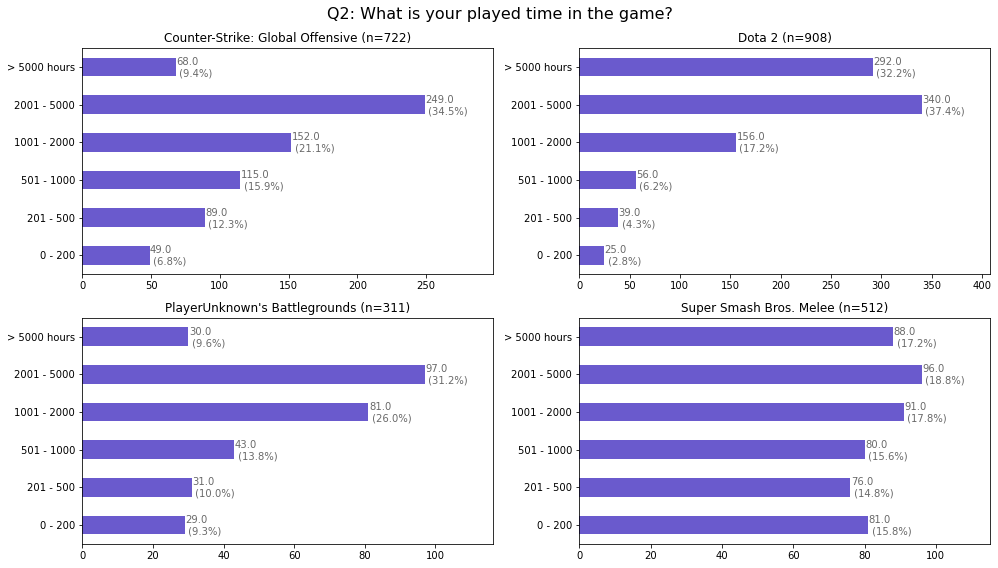

In [241]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

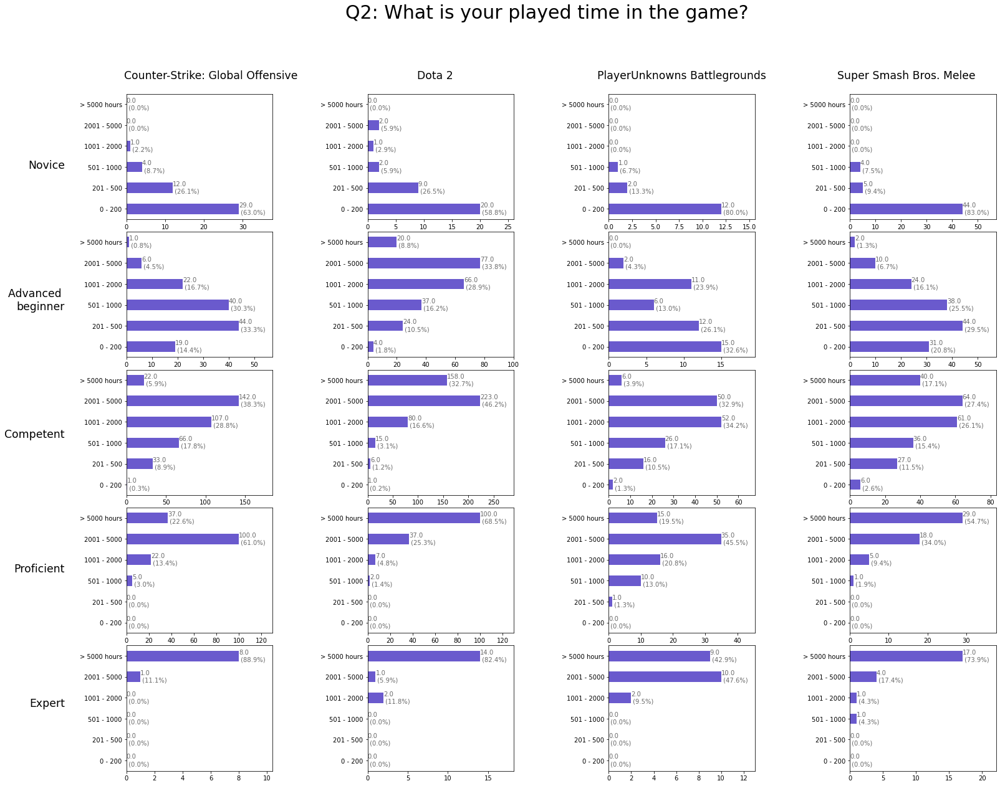

In [242]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

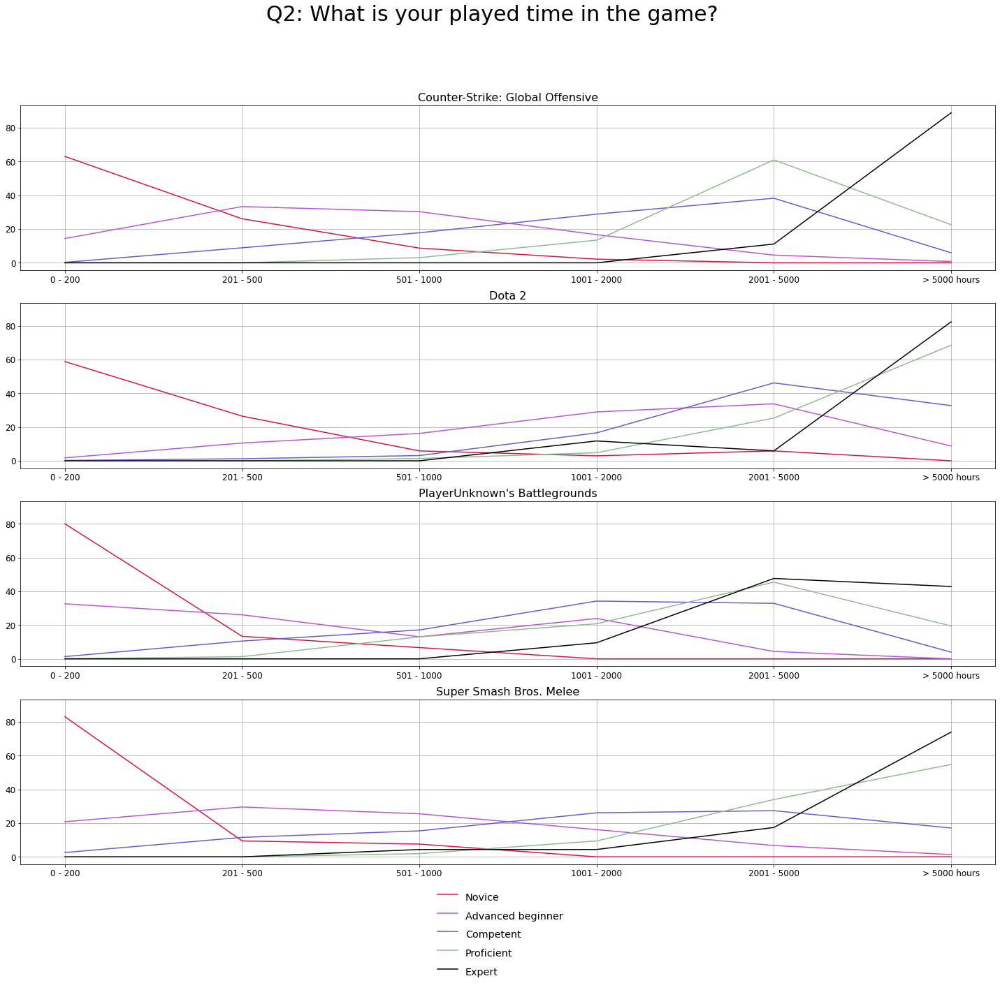

In [243]:
IndividualLines(suptitle,qnum,orderB,qdf)

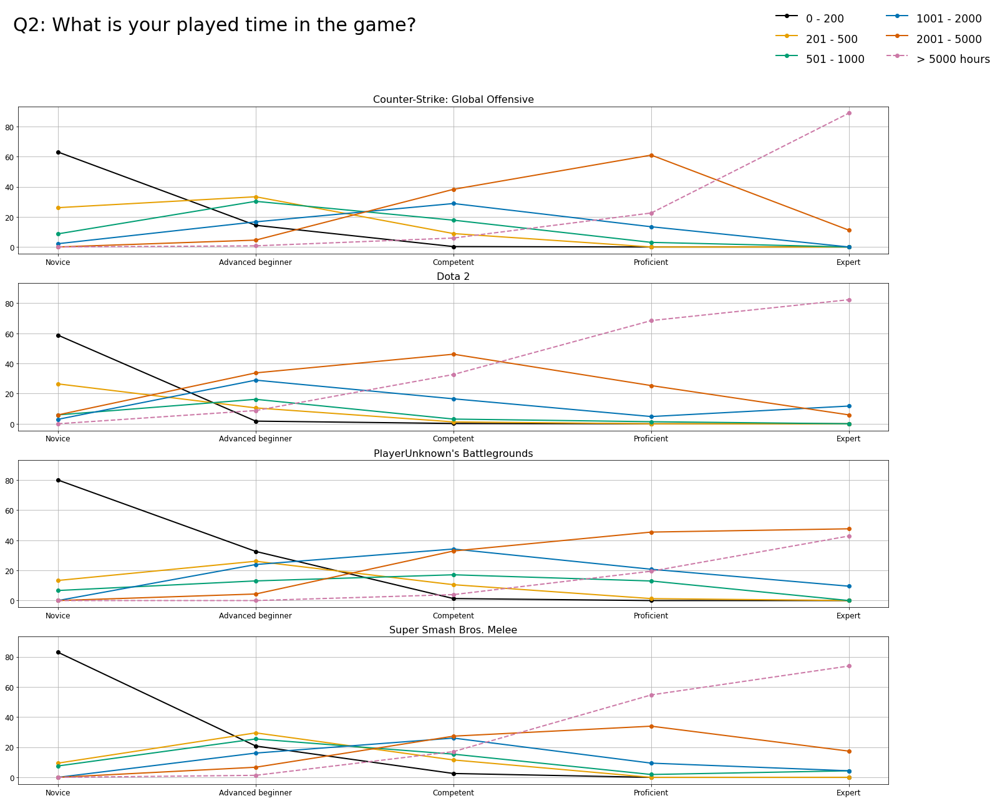

In [244]:
IndividualLinesSkill(suptitle, qnum, orderB, qdf)

In [245]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[1]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [246]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.6043956043956044
[[ 2.68216003  1.43836236 -0.04497286 -1.00678367 -1.16720204 -1.89961671]
 [-0.58360958  0.55251811  0.82993565  0.48528081  0.07460303 -1.36012574]
 [-1.18854483 -0.67842037 -0.10639368  0.54471417  0.98039657  0.44682576]
 [-0.70005148 -0.97561823 -0.2956312  -0.23824104  0.65828385  1.55282331]
 [-0.20995414 -0.33684186 -0.3829379   0.21502974 -0.5460814   1.26009338]]


## Q3: How many hours per week do you spend playing or practicing the game?

In [82]:
orderA = ["0 - 5 hours", "6 - 10 hours", "11 - 20 hours", "21 - 30 hours", 
         "more than 30 hours"]
orderB = ["0 - 5", "6 - 10", "11 - 20", "21 - 30", 
         "> 30 hours"]
suptitle = 'Q3: How many hours per week do you spend playing or practicing the game?'
qnum = 'Q3'



qdf = SetupDf(df,qnum,orderA,orderB)
countsB = MakeCountsB(qdf, orderB)

In [83]:
countsDf = MakeCountsD(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

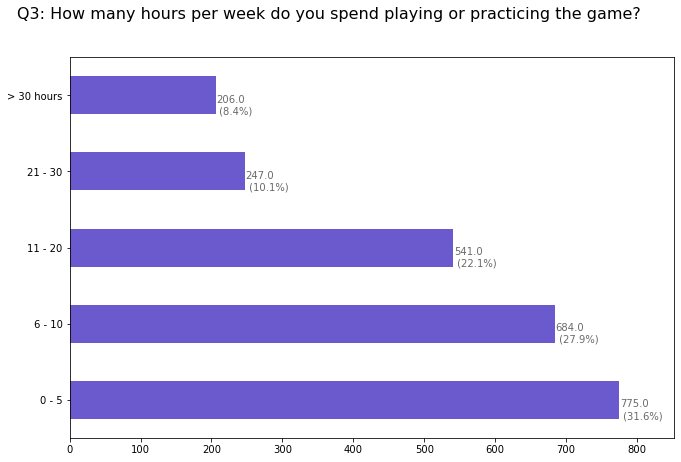

In [248]:
PlotBars(qdf,qnum,suptitle,countsB)

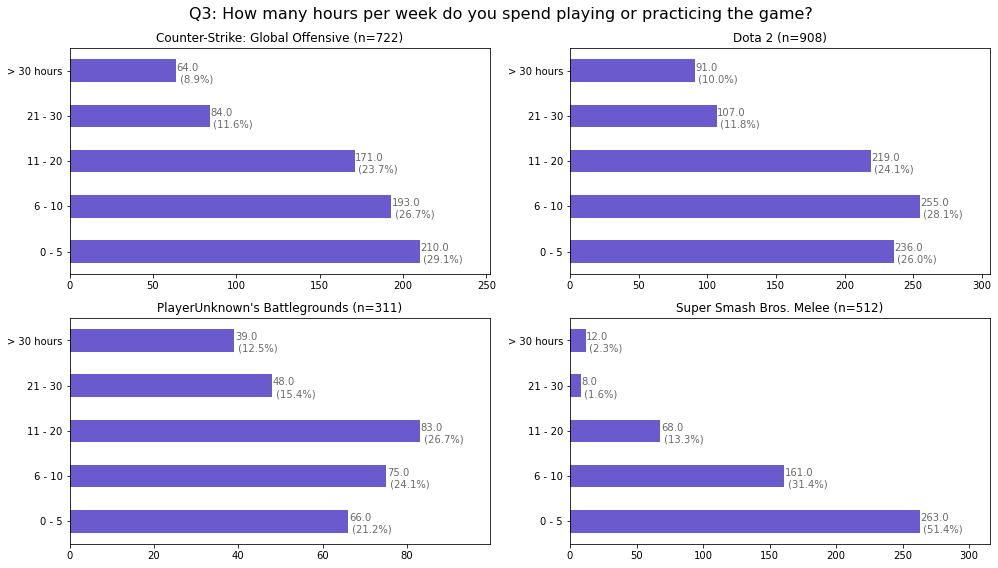

In [249]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

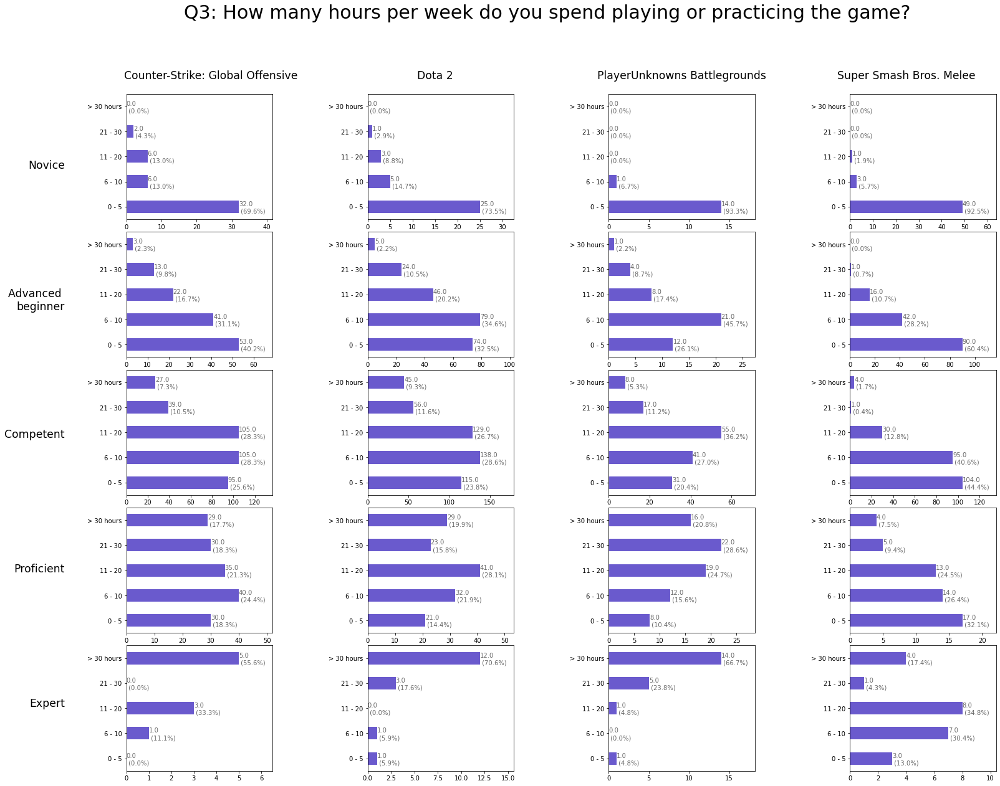

In [250]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

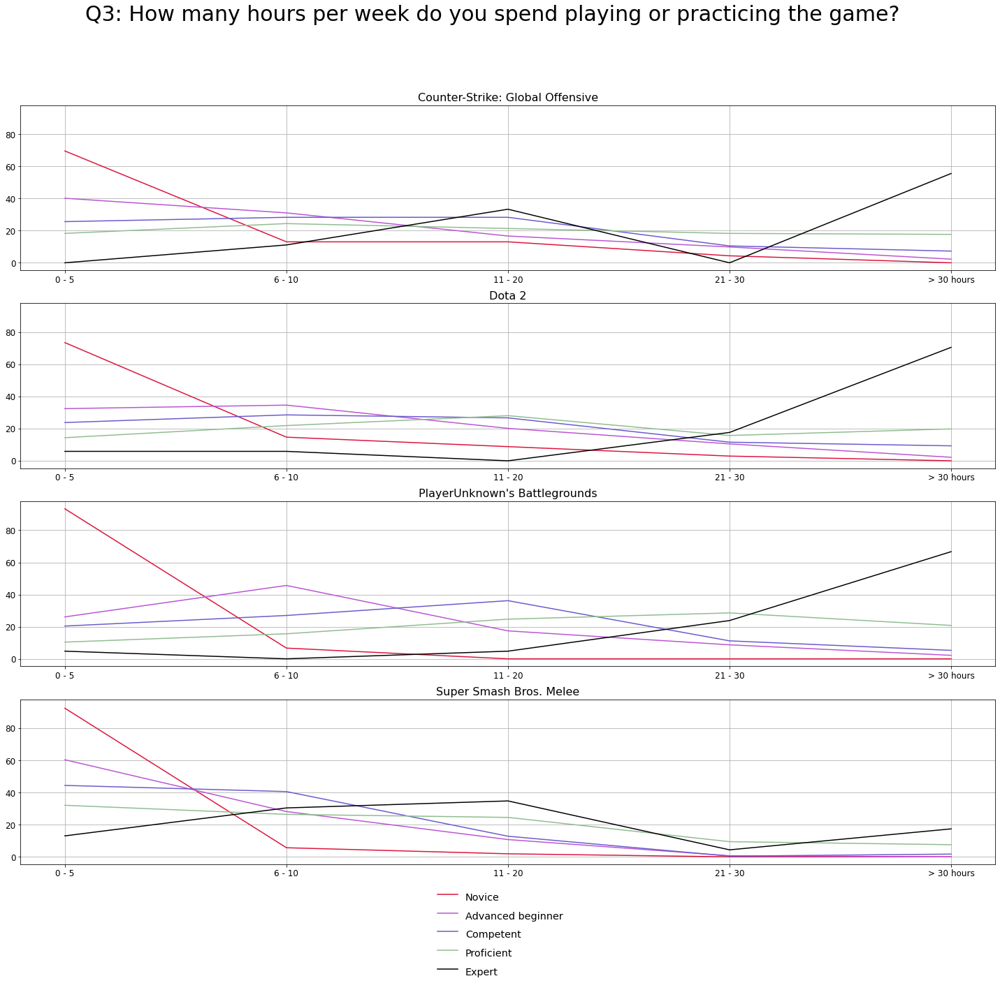

In [251]:
IndividualLines(suptitle,qnum,orderB,qdf)

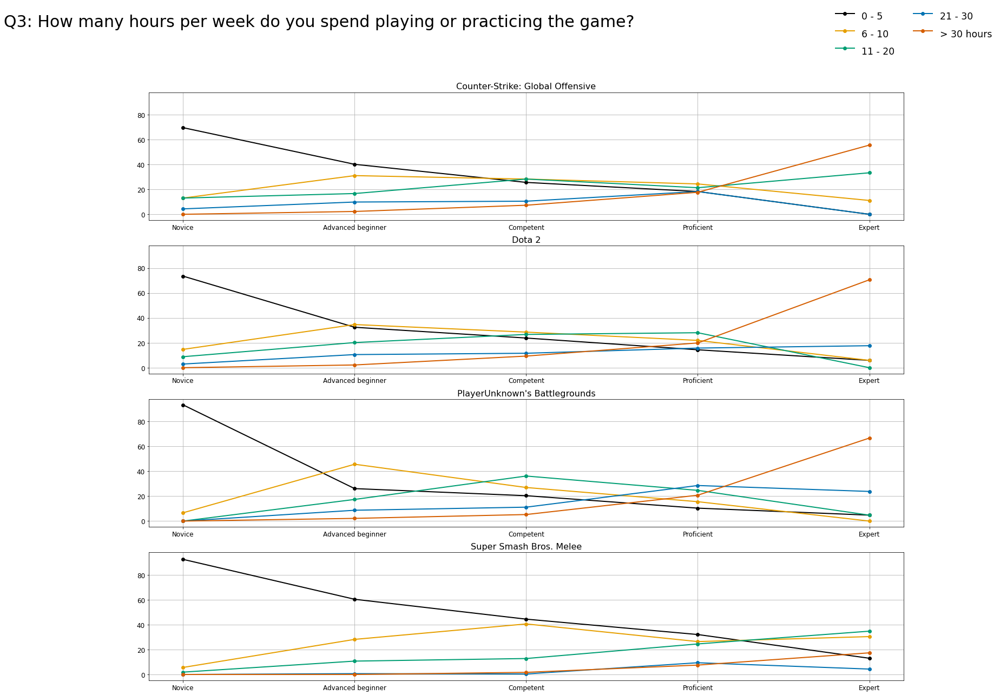

In [252]:
IndividualLinesSkill(suptitle, qnum, orderB, qdf)

In [253]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[1]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [254]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5054945054945055
[[ 1.42089625 -0.02859323 -0.05998087 -0.46013582 -0.86931029]
 [ 0.27591827  0.51646808  0.32473401  0.06299179 -1.18099267]
 [-0.2449389   0.20138071  0.37756954 -0.11615699 -0.2210882 ]
 [-0.70275591 -0.08417765  0.27709023  0.06948234  0.44000578]
 [-0.7491197  -0.60507791 -0.9194129   0.44381869  1.83138539]]


## Q4: How many tournaments have you attended to in the game as a player?

In [84]:
orderA = ["0", "1 - 5", "6 - 10", "11 - 20", 
         "Over 20"]
orderB = ["0", "1 - 5", "6 - 10", "11 - 20", 
         "Over 20"]
suptitle = 'Q4: How many tournaments have you attended to in the game as a player?'
qnum = 'Q4'

qdf = SetupDf(df,qnum,orderA,orderB)
countsB = MakeCountsB(qdf, orderB)
countsDf = MakeCountsD(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

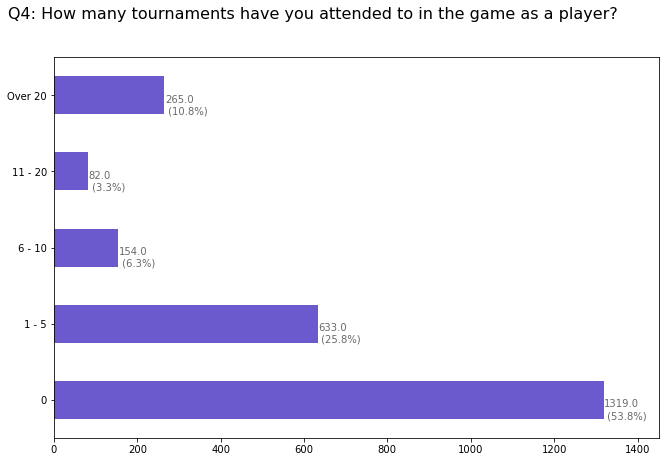

In [256]:
PlotBars(qdf,qnum,suptitle, countsB)

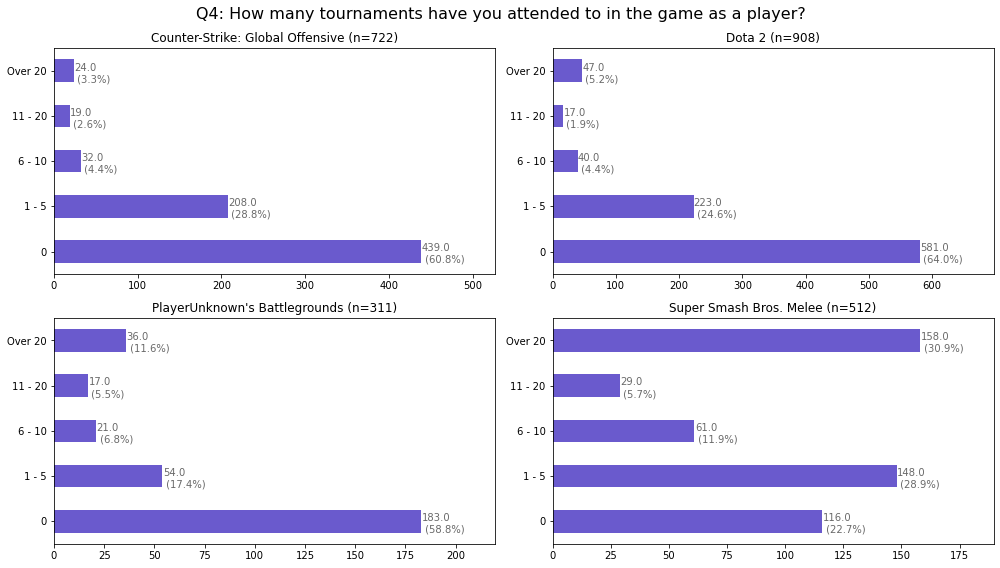

In [257]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

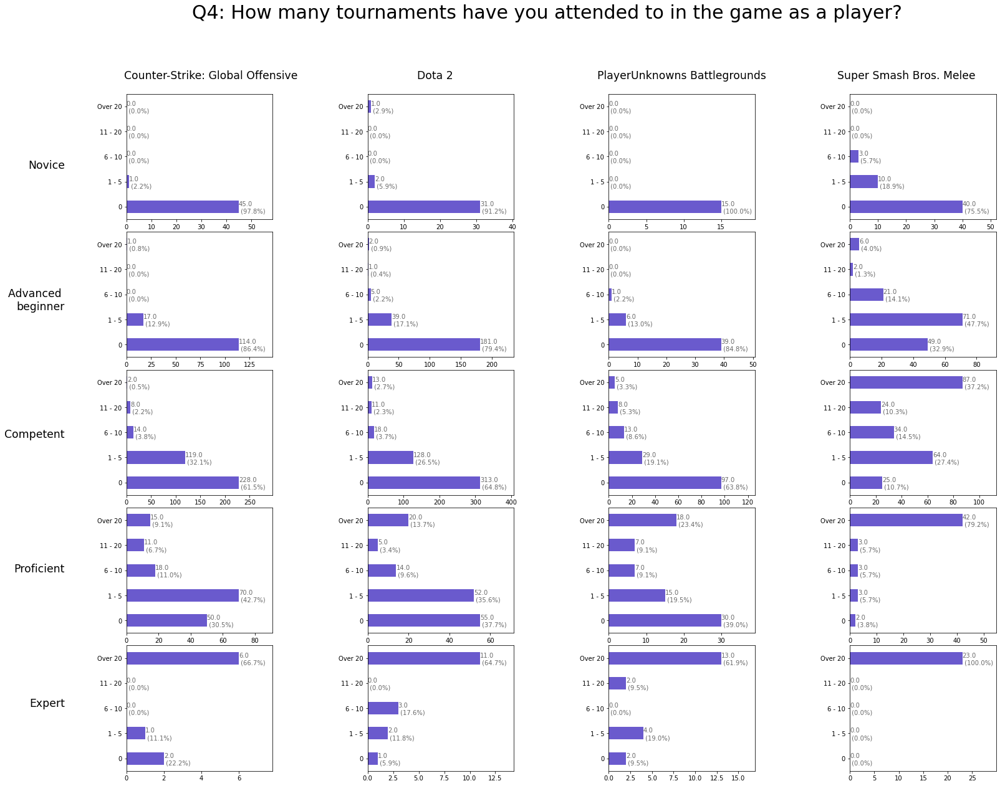

In [258]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

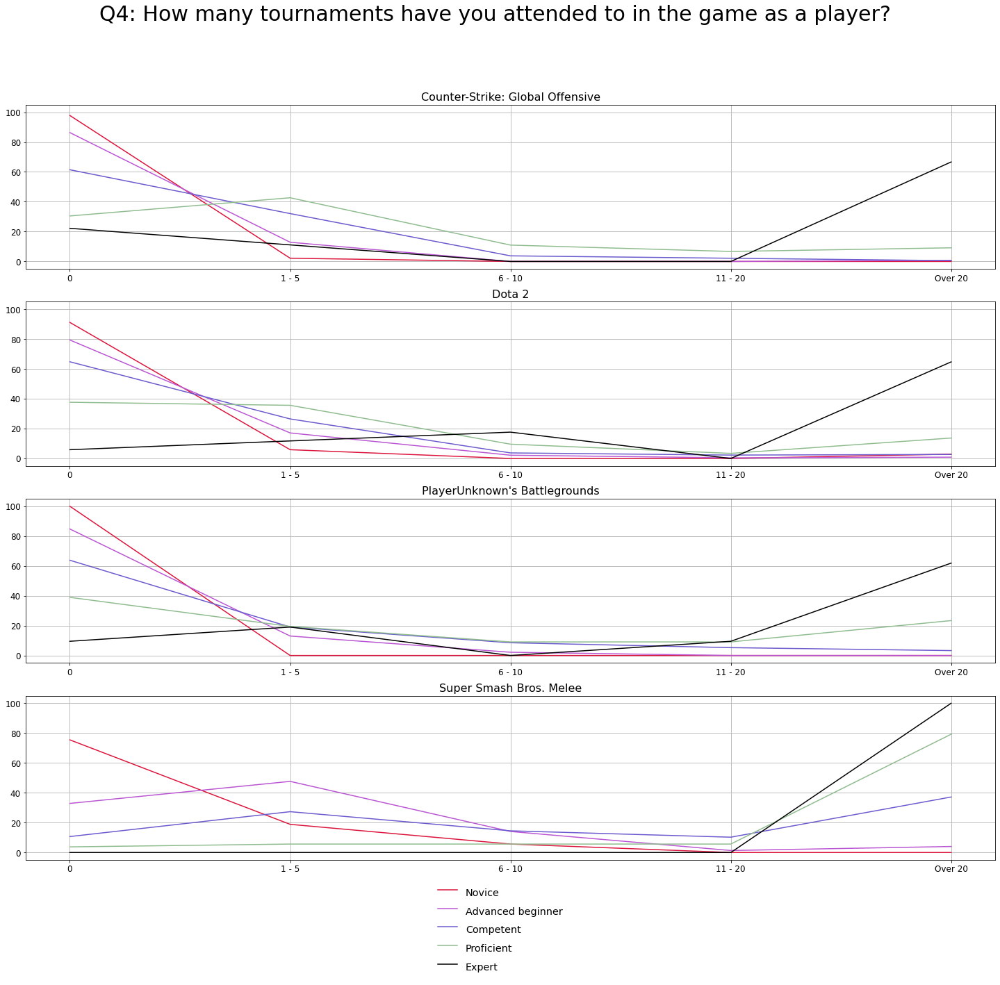

In [259]:
IndividualLines(suptitle,qnum,orderB,qdf)

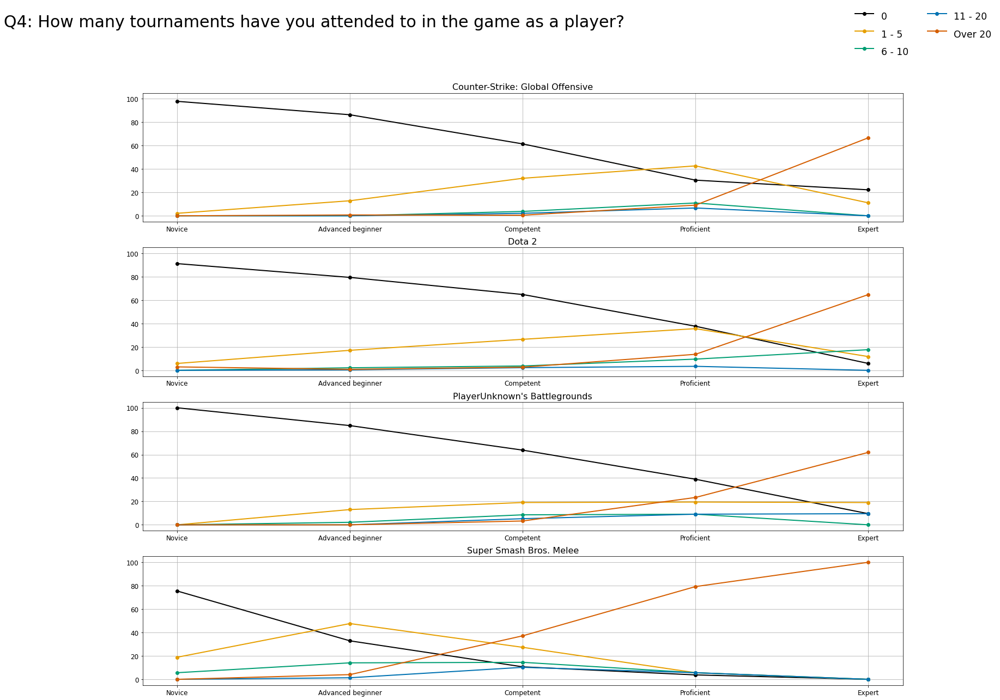

In [260]:
IndividualLinesSkill(suptitle, qnum, orderB, qdf)

## Q5: Please evaluate your skill level in the game.

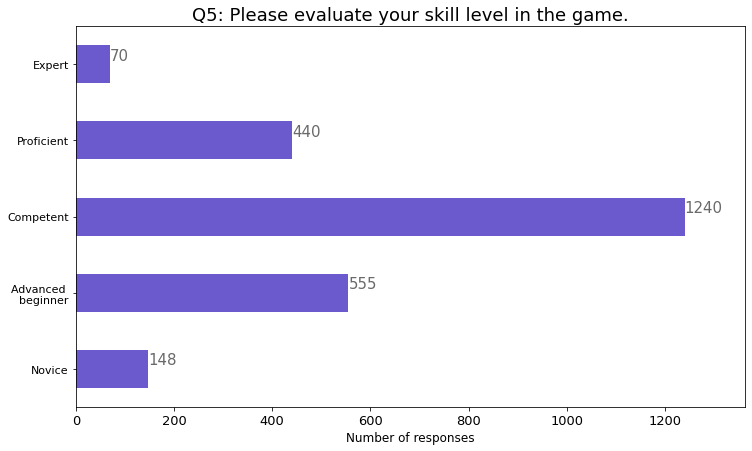

In [261]:
order = ["Novice", 
         "Advanced beginner", 
         "Competent",
         "Proficient", 
         "Expert"]

suptitle = 'Q5: Please evaluate your skill level in the game.'
qnum = 'Q5'
qdf = SetupDf(df,qnum,order,order)
countsB = MakeCountsB(qdf, order)

DrawOneGraph(suptitle,qnum,order,df,yticklabels=["Novice", "Advanced \nbeginner", 
                    "Competent", "Proficient", "Expert"])




In [262]:
qdf

,Q5,Q1,Novice,Advanced beginner,Competent,Proficient,Expert
0,Novice,Counter-Strike: Global Offensive,1.0,0.0,0.0,0.0,0.0
1,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0
2,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0
3,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0
4,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
2468,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0
2469,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0
2470,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0
2471,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0


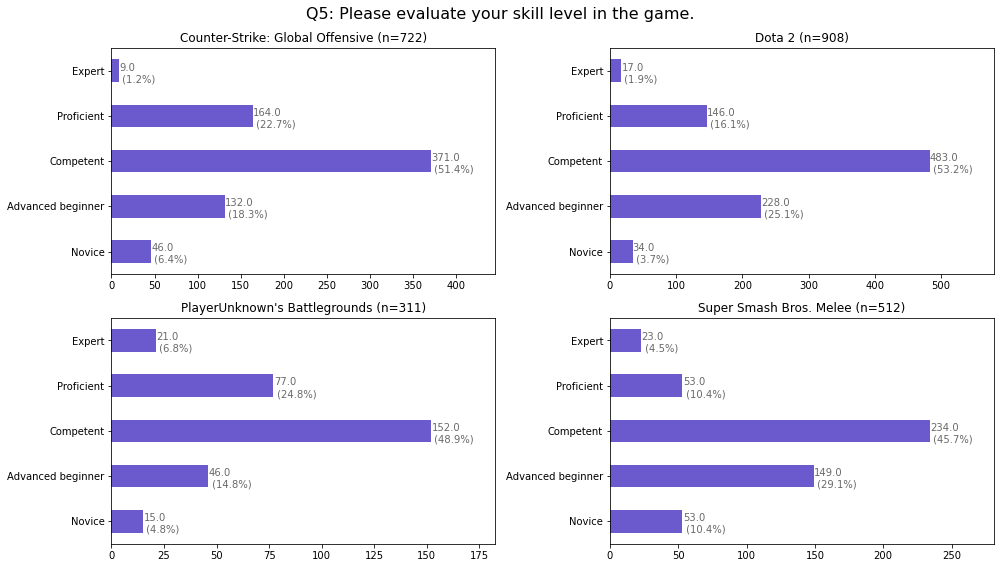

In [263]:
xuplim = 520
IndividualGraphsB(suptitle,qnum, order, qdf, gameList, counts)

In [93]:
def MakeCountsDb(qdf,skillList,gameList,qnum,orderB):
    countsD = pd.DataFrame(0,columns=[""],index=orderB)
    gameAb = [" CS:GO", " Dota 2"," PUBG", " Melee"]
    j=0
    for game in gameList:
        
        for skill in skillList:
            for item in orderB:
                gameCount = int(sum(qdf.loc[qdf['Q1']==game][item]))
                thisGame = len(qdf.loc[qdf['Q1']==game])
                countsD.at[item,gameAb[j]]= str(gameCount) + " (" + str(round(gameCount/thisGame*100,1)) + "%)"
                
                thisCount= int(sum(qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill][item]))
                thisSkill = len(qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill])
                countsD.at[item,skill+gameAb[j]]= str(thisCount) + " (" + str(round(thisCount/thisSkill*100,1)) + "%)"
        j+=1
    
    for item in orderB:
        thisCount= int(sum(qdf[item]))
        countsD.at[item,"sum"]= str(thisCount) + " (" + str(round(thisCount/len(qdf)*100,1)) + "%)"
    
    return countsD

## Question 6: What interests you most in the game?
* Select at least one
 
Linear discriminant analysis
* LDA is closely related to analysis of variance (ANOVA) and regression analysis, which also attempt to express one dependent variable as a linear combination of other features or measurements.[1][2] However, ANOVA uses categorical independent variables and a continuous dependent variable, whereas discriminant analysis has continuous independent variables and a categorical dependent variable (i.e. the class label).[3] 
* Logistic regression and probit regression are more similar to LDA than ANOVA is, as they also explain a categorical variable by the values of continuous independent variables. These other methods are preferable in applications where it is not reasonable to assume that the independent variables are normally distributed, which is a fundamental assumption of the LDA method.

In [87]:
order = ["Competitiveness", 
         "Entertainment", 
         "Single player modes", 
         "Game genre or series",
        "Social aspects or community",
        "Multiplayer",
        "High skill ceiling",
        "Freedom of skill",
        "Popularity",
         "Other"
         ]

orderB = ["Competitiveness", 
         "Entertainment", 
         "Single player", 
         "Genre / Series",
        "Social aspects",
        "Multiplayer",
        "High skill ceiling",
        "Freedom of skill",
        "Popularity",
         "Other"
         ]
suptitle = 'Q6:  What interests you most in the game?'
qnum = 'Q6'
qdf= SetupDf(df,qnum,order,orderB)
countsB = MakeCountsB(qdf, orderB)


In [89]:
qdf

,Q6,Q5,Q1,Competitiveness,Entertainment,Single player,Genre / Series,Social aspects,Multiplayer,High skill ceiling,Freedom of skill,Popularity,Other
0,"Competitiveness, Entertainment, High skill cei...",Novice,Counter-Strike: Global Offensive,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,"Competitiveness, Entertainment, Multiplayer, H...",Advanced beginner,Counter-Strike: Global Offensive,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2,"Entertainment, Social aspects, High skill ceil...",Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
3,"Competitiveness, Entertainment, Genre / Series...",Advanced beginner,Counter-Strike: Global Offensive,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
4,"Entertainment, Multiplayer, Freedom of skill, ...",Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2468,"Competitiveness, Entertainment, Social aspects...",Proficient,Super Smash Bros. Melee,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
2469,"Competitiveness, High skill ceiling, Freedom o...",Proficient,Super Smash Bros. Melee,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
2470,"Competitiveness, Entertainment, Multiplayer, H...",Proficient,Super Smash Bros. Melee,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
2471,"Competitiveness, Multiplayer, High skill ceili...",Proficient,Super Smash Bros. Melee,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0


In [94]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

,,CS:GO,Novice CS:GO,Advanced beginner CS:GO,Competent CS:GO,Proficient CS:GO,Expert CS:GO,Dota 2,Novice Dota 2,Advanced beginner Dota 2,...,Competent PUBG,Proficient PUBG,Expert PUBG,Melee,Novice Melee,Advanced beginner Melee,Competent Melee,Proficient Melee,Expert Melee,sum
Competitiveness,0,622 (86.1%),26 (56.5%),105 (79.5%),328 (88.4%),154 (93.9%),9 (100.0%),672 (74.0%),14 (41.2%),148 (64.9%),...,109 (71.7%),69 (89.6%),20 (95.2%),394 (77.0%),29 (54.7%),115 (77.2%),183 (78.2%),46 (86.8%),21 (91.3%),1921 (78.3%)
Entertainment,0,405 (56.1%),32 (69.6%),94 (71.2%),207 (55.8%),68 (41.5%),4 (44.4%),577 (63.5%),19 (55.9%),148 (64.9%),...,88 (57.9%),38 (49.4%),9 (42.9%),374 (73.0%),43 (81.1%),112 (75.2%),171 (73.1%),35 (66.0%),13 (56.5%),1531 (62.4%)
Single player,0,38 (5.3%),2 (4.3%),5 (3.8%),23 (6.2%),7 (4.3%),1 (11.1%),41 (4.5%),3 (8.8%),9 (3.9%),...,12 (7.9%),3 (3.9%),1 (4.8%),49 (9.6%),9 (17.0%),16 (10.7%),21 (9.0%),2 (3.8%),1 (4.3%),151 (6.2%)
Genre / Series,0,134 (18.6%),12 (26.1%),27 (20.5%),68 (18.3%),27 (16.5%),0 (0.0%),161 (17.7%),3 (8.8%),49 (21.5%),...,45 (29.6%),27 (35.1%),7 (33.3%),148 (28.9%),21 (39.6%),46 (30.9%),68 (29.1%),8 (15.1%),5 (21.7%),538 (21.9%)
Social aspects,0,309 (42.8%),17 (37.0%),59 (44.7%),160 (43.1%),69 (42.1%),4 (44.4%),231 (25.4%),9 (26.5%),58 (25.4%),...,52 (34.2%),27 (35.1%),4 (19.0%),307 (60.0%),27 (50.9%),76 (51.0%),146 (62.4%),39 (73.6%),19 (82.6%),952 (38.8%)
Multiplayer,0,472 (65.4%),31 (67.4%),82 (62.1%),259 (69.8%),93 (56.7%),7 (77.8%),498 (54.8%),14 (41.2%),123 (53.9%),...,96 (63.2%),51 (66.2%),11 (52.4%),270 (52.7%),30 (56.6%),75 (50.3%),122 (52.1%),26 (49.1%),17 (73.9%),1437 (58.6%)
High skill ceiling,0,545 (75.5%),22 (47.8%),90 (68.2%),284 (76.5%),143 (87.2%),6 (66.7%),711 (78.3%),14 (41.2%),160 (70.2%),...,77 (50.7%),51 (66.2%),15 (71.4%),410 (80.1%),26 (49.1%),112 (75.2%),202 (86.3%),48 (90.6%),22 (95.7%),1835 (74.8%)
Freedom of skill,0,371 (51.4%),19 (41.3%),67 (50.8%),196 (52.8%),87 (53.0%),2 (22.2%),517 (56.9%),14 (41.2%),129 (56.6%),...,47 (30.9%),30 (39.0%),10 (47.6%),420 (82.0%),34 (64.2%),116 (77.9%),203 (86.8%),47 (88.7%),20 (87.0%),1419 (57.8%)
Popularity,0,115 (15.9%),10 (21.7%),15 (11.4%),68 (18.3%),22 (13.4%),0 (0.0%),79 (8.7%),2 (5.9%),20 (8.8%),...,8 (5.3%),9 (11.7%),1 (4.8%),71 (13.9%),15 (28.3%),14 (9.4%),27 (11.5%),10 (18.9%),5 (21.7%),288 (11.7%)
Other,0,64 (8.9%),3 (6.5%),13 (9.8%),32 (8.6%),13 (7.9%),3 (33.3%),84 (9.3%),8 (23.5%),20 (8.8%),...,18 (11.8%),8 (10.4%),1 (4.8%),56 (10.9%),3 (5.7%),10 (6.7%),32 (13.7%),8 (15.1%),3 (13.0%),241 (9.8%)


In [95]:
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

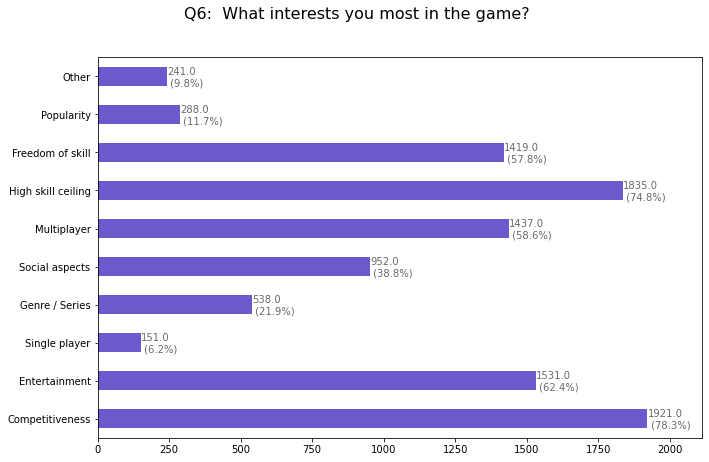

In [265]:
PlotBars(qdf,qnum,suptitle,countsB)

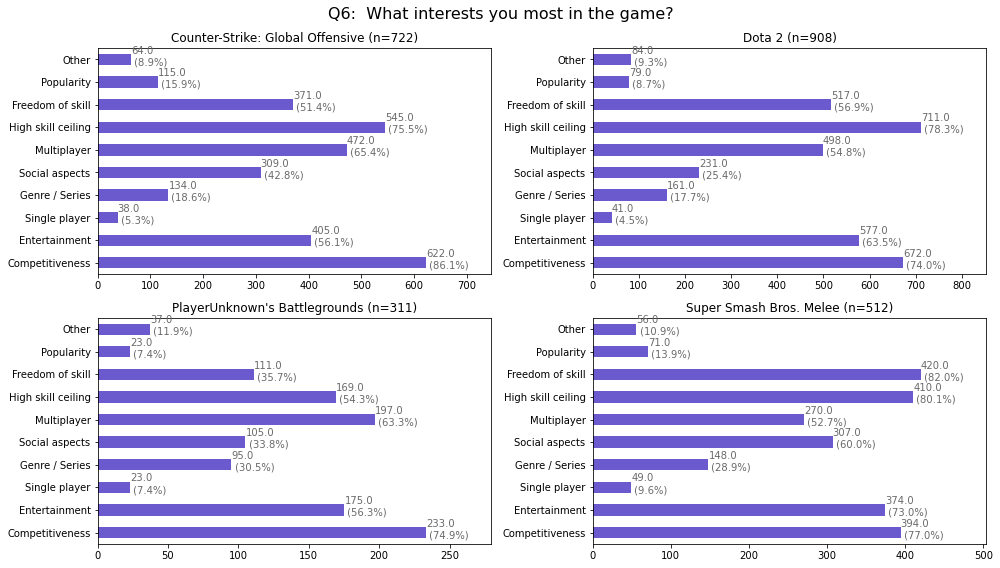

In [266]:
IndividualGraphsB(suptitle, qnum, order, qdf, gameList, counts)

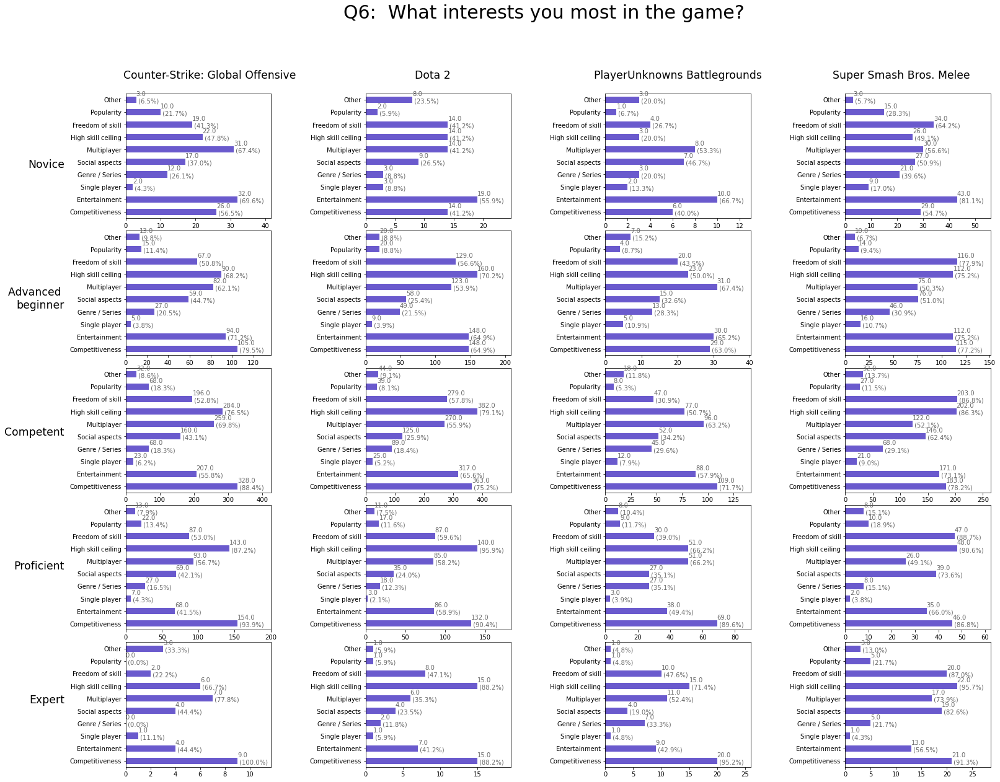

In [267]:
xuplim = 25
IndividualGraphsC(suptitle, qnum, order, qdf)

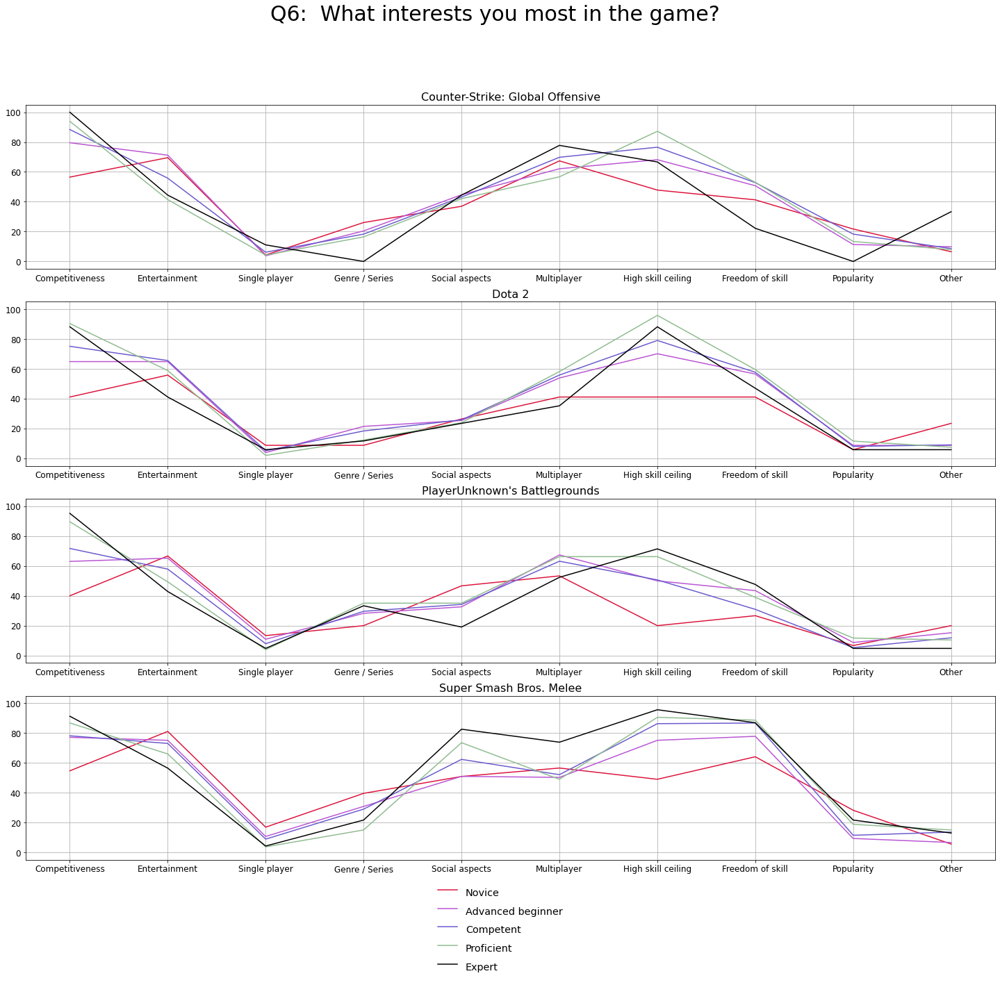

In [268]:
IndividualLines(suptitle,qnum,orderB,qdf)

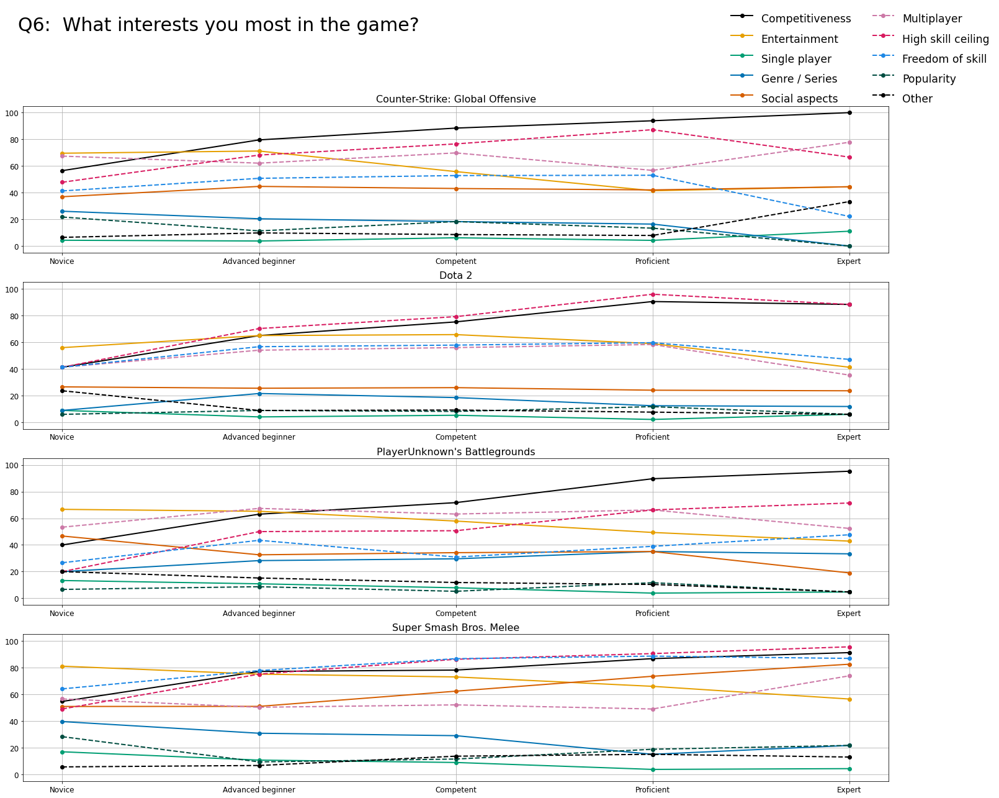

In [269]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

In [270]:
def PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList):
    best_model = HistGradientBoostingClassifier(**modelParams)
    fig, axs = plt.subplots(1, 1, figsize=(10, 10),sharex=True)
    fig.suptitle(qnum + ": Permutation Importances in a \nhistogram-based Gradient Boosting Classification Tree", fontsize = 18)    
    testDf= qdf.copy()
    testDf['game'] = 0
    fig.patch.set_facecolor('white')
    
    for index, row in testDf.iterrows():
        for i in range(4):
            if row['Q1']==gameList[i]:
                testDf.at[index,'game']=i

                    
    # Create a split of the data
    X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['game'].astype(int), 
                                                            train_size=0.8, test_size=0.2, random_state=8)

    best_model.fit(X_train, y_train)
    result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
    sorted_idx = result.importances_mean.argsort()
    thisAx = axs
    thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
    #plt.boxplot(result.importances[sorted_idx].T,vert=False, labels=np.array(X_train.columns)[sorted_idx])
    thisAx.set_title("Model accuracy: " + str(round(best_model.score(X_test, y_test),2)))
    thisAx.grid( 'on', axis='x' )
    thisAx.grid( 'on', axis='x', which='minor' )

    #fig.tight_layout()
    plt.subplots_adjust(left=0.2, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    fname = MakeFileName(qnum,"boxAll")
        
    plt.savefig(fname,quality=0.95, dpi=300)
    plt.show()


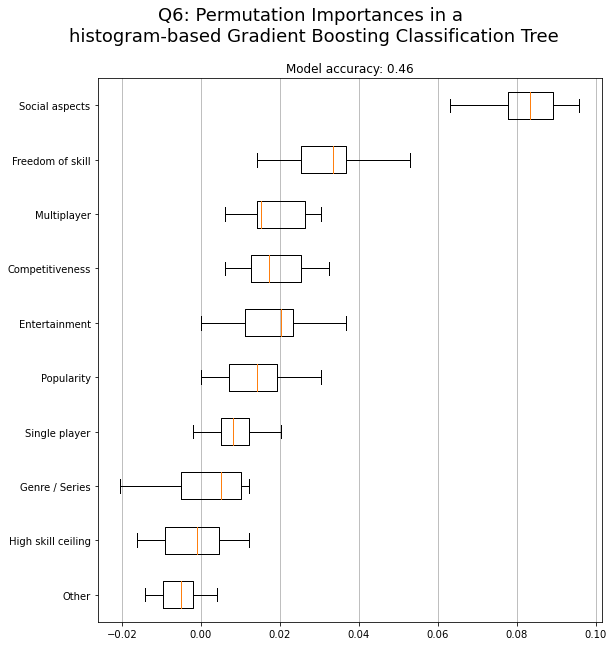

In [271]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':20, 'max_iter':10, 'min_samples_leaf':2}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [272]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [273]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.46153846153846156
[[-0.64462862  0.46814535  0.43503782  0.28598671 -0.32307457  0.18624363
  -1.00465944 -0.38582139  0.58449836 -0.37570266]
 [ 0.0909581   0.40096997  0.28975388  0.32194883 -0.61620716 -0.32053084
  -0.25753966 -0.13231018 -0.74186245 -0.3549446 ]
 [-0.04734609  0.23094457  0.16557567  0.1309548  -0.09519848 -0.31853225
   0.28085038  0.26095366 -0.40922093  0.28459469]
 [ 0.32161563 -0.12382595 -0.25792356 -0.48088918  0.41596687 -0.21919464
   0.40092837  0.29958462  0.28937918  0.13165596]
 [ 0.27940097 -0.97623395 -0.63244381 -0.25800116  0.61851334  0.6720141
   0.58042035 -0.04240672  0.27720585  0.31439661]]


In [79]:
allDf = qdf[['orderedSkill','Q1','Q5Code']]
for item in orderB:
    allDf[(item + " " + qnum)]= qdf[item]
allDf

KeyError: "['Q5Code'] not in index"

In [274]:
from scipy.stats import spearmanr

def SpearmanTest(skill, target):
    # calculate spearman's correlation
    coef, p = spearmanr(target, skill)
    print('Spearmans correlation coefficient: %.3f' % coef)
    # interpret the significance
    alpha = 0.05
    if p > alpha:
        print('Samples are uncorrelated (fail to reject H0) p=%.3f' % p)
    else:
        print('*** Samples are correlated (reject H0) p=%.3f' % p)


In [275]:
from scipy.stats import kendalltau
def KendallTest(skill, target):
    # calculate kendall's correlation
    coef, p = kendalltau(target, skill)
    print('Kendall correlation coefficient: %.3f' % coef)
    # interpret the significance
    alpha = 0.05
    if p > alpha:
        print('Samples are uncorrelated (fail to reject H0) p=%.3f' % p)
    else:
        print('*** Samples are correlated (reject H0) p=%.3f' % p)


In [276]:
def NonParametricCorrelations(skill, target):
    SpearmanTest(skill, target)
    KendallTest(skill, target)
    

In [277]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Competitiveness
Spearmans correlation coefficient: 0.223
*** Samples are correlated (reject H0) p=0.000
Kendall correlation coefficient: 0.209
*** Samples are correlated (reject H0) p=0.000
# Entertainment
Spearmans correlation coefficient: -0.203
*** Samples are correlated (reject H0) p=0.000
Kendall correlation coefficient: -0.189
*** Samples are correlated (reject H0) p=0.000
# Single player
Spearmans correlation coefficient: 0.012
Samples are uncorrelated (fail to reject H0) p=0.740
Kendall correlation coefficient: 0.012
Samples are uncorrelated (fail to reject H0) p=0.739
# Genre / Series
Spearmans correlation coefficient: -0.062
Samples are uncorrelated (fail to reject H0) p=0.098
Kendall correlation coefficient: -0.058
Samples are uncorrelated (fail to reject H0) p=0.098
# Social aspects
Spearmans correlation coefficient: 0.000
Samples are uncorrelated (fail to reject H0) p=0.994
K

In [278]:
from statsmodels.discrete.discrete_model import Logit
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [111]:
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary()) 

Optimization terminated successfully.
         Current function value: 0.604722
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  512
Model:                          Logit   Df Residuals:                      502
Method:                           MLE   Df Model:                            9
Date:                Mon, 22 Feb 2021   Pseudo R-squ.:                 -0.4109
Time:                        00:32:56   Log-Likelihood:                -309.62
converged:                       True   LL-Null:                       -219.44
Covariance Type:            nonrobust   LLR p-value:                     1.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Competitiveness       -0.1197      0.232     -0.517      0.605      -0.574       0.334
Enter

In [279]:
def NonParametricRegressions(skill, target):
    SpearmanTest(skill, target)
    KendallTest(skill, target)

In [764]:
def OverUnderSample(Xfirst, yfirst):
    # summarize class distribution
    counter = Counter(yfirst)
    #print("Skill 0 first: "+ str(counter))
    #print("Ratio: " + str(counter[0]/counter[1]))
    
    # Find ratios for oversampling and undersampling
    if (counter[0]<counter[1]):
        ratio = counter[0] / counter[1]
    else:
        ratio = counter[1] / counter[0]
    #print("Ratio first: " + str(ratio))
    ratio1 = round(ratio + ((1-ratio)*0.9),2)
    if ratio1 > ratio*5:
        ratio1 = ratio*5
    
    ratio2 = ratio1 + (1-ratio1)*0.9
    #print("Ratio after: "+ str(ratio))
    


    # define pipeline for oversampling and undersampling
    over = SMOTE(sampling_strategy=ratio1)
    under = RandomUnderSampler(sampling_strategy=ratio2)
    steps = [('o', over), ('u', under)]
    pipeline = Pipeline(steps=steps)

    # transform the dataset
    X, y = pipeline.fit_resample(Xfirst, yfirst)
    

    return X, y

In [281]:
def LogRegCoeffs(testDf, orderB, skillList):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])

    for i in range(4):
        print("Skill levels: "+ str(skillList[i]) + " and " +str(skillList[i+1]))

        for iterator in range(100):
            notBest = True
            regDf = pd.DataFrame()
            regDf['skill']=testDf['skill'].copy()
            for item in range(len(orderB)-1):
                regDf[orderB[item]] = testDf[orderB[item]]

            regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
            regDf['skill']=regDf['skill']-i


            while(notBest):
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                # Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()
                
                
                # do something illegal
                # 1 , 1
                x1_row = pd.DataFrame(1.0,columns = Xtrain.columns, index= [len(Xtrain)])
                Xtrain = pd.concat([Xtrain,x1_row],ignore_index=True)
                
                
                # 0 , 0
                x0_row= pd.DataFrame(0.0,columns = Xtrain.columns,index= [len(Xtrain)])
                Xtrain = pd.concat([Xtrain,x0_row],ignore_index=True)
                

                # 1 , 0
                x1_row = pd.DataFrame(1.0,columns = Xtrain.columns, index= [len(Xtrain)])
                Xtrain = pd.concat([Xtrain,x1_row],ignore_index=True)
                
                
                # 0 , 1
                x0_row= pd.DataFrame(0.0,columns = Xtrain.columns,index= [len(Xtrain)])
                Xtrain = pd.concat([Xtrain,x0_row],ignore_index=True)
                
                s2 = pd.Series([0, 0, 1, 1])
                ytrain = ytrain.append(s2,ignore_index=True)
                
                
                #print(ytrain)
                
                #print(Xtrain)
                
                #break
                try:
                    # building the model and fitting the data 
                    log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0)
                except:
                    continue
                
                results_summary = log_reg.summary()

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                if (resultDf['P>|z|'].max() >= 0.05):
                    regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                else:        
                    notBest=False

                if(len(regDf.columns)<=1):
                    notBest = False
                    results_summary = "EVERYTHING IS BAD"

            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            for index, row in resultDf.iterrows():
                q8RegDf.at[index, i] += row['coef']
                averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [318]:
def LogRegCoeffs2(testDf, orderB, skillList):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])

    for i in range(4):
        print("Skill levels: "+ str(skillList[i]) + " and below vs " +str(skillList[i+1]) + " and above")
        
        
        for iterator in range(100):
            notBest = True
            stuck = 0
            while(notBest):
                stuck+=1
                regDf = pd.DataFrame()
                regDf['skill']=testDf['skill'].copy()
                for item in range(len(orderB)-1):
                    regDf[orderB[item]] = testDf[orderB[item]]
            
                # Divide skill class into two, normalize to 0 and 1 so it fits binary logistic regression assumption
                regDf.loc[regDf['skill'] <= i, 'skill'] = 0
                regDf.loc[regDf['skill'] != 0, 'skill'] = 1
                
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                # Transform the dataset using over- and undersampling
                #X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                #Xtrain = X.drop('skill',axis=1).copy().astype(int)
                #ytrain = X['skill'].copy()
                
                Xtrain = Xfirst.drop('skill',axis=1).copy()
                ytrain = yfirst.copy()
                
                
                # building the model and fitting the data 
                log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0, method='bfgs')
                
                results_summary = log_reg.summary()
                if stuck >20:
                    print(results_summary)
                    return None
                    break

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                #if (resultDf['P>|z|'].max() >= 0.05):
                    #regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                #else:        
                notBest=False

                if(len(regDf.columns)<=1):
                    notBest = False
                    results_summary = "EVERYTHING IS BAD"

            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            for index, row in resultDf.iterrows():
                if row['P>|z|']<=0.1:
                    q8RegDf.at[index, i] += row['coef']
                    averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [632]:
def LogRegCoeffs2b(testDf, orderB, skillList, game, separations):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])
    variables = orderB.copy()
    separations = separations.loc[separations['Question']!= 'Other']
    sign = 1

    for i in range(4):
        # Reset orderB
        orderB = variables.copy()
        print("Skill levels: "+ str(skillList[i]) + " and below vs " +str(skillList[i+1]) + " and above")
        
        # Check if perfect separation causes problems for this split, remove those variables
        sepsGame = separations.loc[separations['Q1']==game]
        
        drops = []
        
        for index,row in sepsGame.iterrows():
            # Check if there's a row in the perfect separations with this skill level, or the next
            if row['Q5']==skillList[i] or row['Q5']==skillList[i+1]:
                badForAllBelow = True
                badForAllAbove = True
                testVar = row['Question']
                
                # Check if there are no perfect separations for this skill level AND all below
                for k in range(i+1):
                    #Separate rows with this skill into another dataframe
                    shitdf = sepsGame.loc[sepsGame['Q5']==skillList[k]].reset_index(drop=True)
                    # Check if the separated dataframe contains ANY rows
                    if len(shitdf)>0:
                        badFound = False
                        # The separated dataframe contains rows, loop through them 
                        # to see if the rows contain the variable at hand
                        for index2, row2 in shitdf.iterrows():
                            if testVar == row2['Question']:
                                badFound = True
                        # After looping through the skills, check if there was a match and save it in badForAllBelow
                        badForAllBelow = badFound
                    # If there aren't any perfect separation under this skill level, 
                    # Then there can't be perfect separation for this particular variable
                    else:
                        badForAllBelow = False
                    if not badForAllBelow:
                        break
    
                            
                
                # Check if there are no perfect separations for the next skill level AND all above
                for o in range(i+1, 5):
                    shitdf = sepsGame.loc[sepsGame['Q5']==skillList[o]].reset_index(drop=True)
                    if len(shitdf)>0:
                        badFound = False
                        for index2, row2 in shitdf.iterrows():
                            if testVar == row2['Question']:
                                badFound = True
                        badForAllAbove = badFound
                    else:
                        badForAllAbove = False

                
                # If there exists perfect separations for this skill level and all below
                # OR for the next skill level and all above, add the variable to the list of variables to be dropped
                if badForAllBelow or badForAllAbove:
                    if not testVar in drops:
                        drops.append(testVar)
        if len(drops)>0:
            print("These will be dropped: " + str(drops))
        # Remove all the variables for this round of regression that would cause a perfect separation error
        for item in drops:
            orderB.remove(item)
        
        for iterator in range(10):
            notBest = True
            stuck = 0
            while(notBest):
                stuck+=1
                regDf = pd.DataFrame()
                regDf['skill']=testDf['skill'].copy()
                for item in range(len(orderB)-1):
                    regDf[orderB[item]] = testDf[orderB[item]]
            
                # Divide skill class into two, normalize to 0 and 1 so it fits binary logistic regression assumption
                regDf.loc[regDf['skill'] <= i, 'skill'] = 0
                regDf.loc[regDf['skill'] > i, 'skill'] = 1
                
                
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                #Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()
                
                #Xtrain = Xfirst.drop('skill',axis=1).copy().astype(int)
                #ytrain = yfirst.copy().astype(int)
            
                
                # building the model and fitting the data 
                log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0, method='bfgs', maxiter = 200)
                
                results_summary = log_reg.summary()
                if stuck >20:
                    print(results_summary)
                    return None
                    break

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

    
                notBest=False


            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            
            for index, row in resultDf.iterrows():
                if row['P>|z|']<=0.1:
                    q8RegDf.at[index, i] += row['coef']
                    averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [489]:
def LogRegCoeffs2bOrig(testDf, orderB, skillList, game, separations):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])
    variables = orderB.copy()
    separations = separations.loc[separations['Question']!= 'Other']

    for i in range(4):
        # Reset orderB
        orderB = variables.copy()
        print("Skill levels: "+ str(skillList[i]) + " and below vs " +str(skillList[i+1]) + " and above")
        
        # Check if perfect separation causes problems for this split, remove those variables
        sepsGame = separations.loc[separations['Q1']==game]
        
        drops = []
        
        for index,row in sepsGame.iterrows():
            # Check if there's a row in the perfect separations with this skill level, or the next
            if row['Q5']==skillList[i] or row['Q5']==skillList[i+1]:
                badForAllBelow = True
                badForAllAbove = True
                testVar = row['Question']
                
                # Check if there are no perfect separations for this skill level AND all below
                for k in range(i+1):
                    #Separate rows with this skill into another dataframe
                    shitdf = sepsGame.loc[sepsGame['Q5']==skillList[k]].reset_index(drop=True)
                    # Check if the separated dataframe contains ANY rows
                    if len(shitdf)>0:
                        badFound = False
                        # The separated dataframe contains rows, loop through them 
                        # to see if the rows contain the variable at hand
                        for index2, row2 in shitdf.iterrows():
                            if testVar == row2['Question']:
                                badFound = True
                        # After looping through the skills, check if there was a match and save it in badForAllBelow
                        badForAllBelow = badFound
                    # If there aren't any perfect separation under this skill level, 
                    # Then there can't be perfect separation for this particular variable
                    else:
                        badForAllBelow = False
                    if not badForAllBelow:
                        break
    
                            
                
                # Check if there are no perfect separations for the next skill level AND all above
                for o in range(i+1, 5):
                    shitdf = sepsGame.loc[sepsGame['Q5']==skillList[o]].reset_index(drop=True)
                    if len(shitdf)>0:
                        badFound = False
                        for index2, row2 in shitdf.iterrows():
                            if testVar == row2['Question']:
                                badFound = True
                        badForAllAbove = badFound
                    else:
                        badForAllAbove = False

                
                # If there exists perfect separations for this skill level and all below
                # OR for the next skill level and all above, add the variable to the list of variables to be dropped
                if badForAllBelow or badForAllAbove:
                    if not testVar in drops:
                        drops.append(testVar)
        if len(drops)>0:
            print("These will be dropped: " + str(drops))
        # Remove all the variables for this round of regression that would cause a perfect separation error
        for item in drops:
            orderB.remove(item)
        
        for iterator in range(100):
            notBest = True
            stuck = 0
            while(notBest):
                stuck+=1
                regDf = pd.DataFrame()
                regDf['skill']=testDf['skill'].copy()
                for item in range(len(orderB)-1):
                    regDf[orderB[item]] = testDf[orderB[item]]
            
                # Divide skill class into two, normalize to 0 and 1 so it fits binary logistic regression assumption
                regDf.loc[regDf['skill'] <= i, 'skill'] = 0
                regDf.loc[regDf['skill'] != 0, 'skill'] = 1
                
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                #Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()
                
                #Xtrain = Xfirst.drop('skill',axis=1).copy()
                #ytrain = yfirst.copy()
                
                
                # building the model and fitting the data 
                log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0, method='bfgs')
                
                results_summary = log_reg.summary()
                if stuck >20:
                    print(results_summary)
                    return None
                    break

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                #if (resultDf['P>|z|'].max() >= 0.05):
                    #regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                #else:        
                notBest=False

                if(len(regDf.columns)<=1):
                    notBest = False
                    results_summary = "EVERYTHING IS BAD"

            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            for index, row in resultDf.iterrows():
                if row['P>|z|']<=0.1:
                    q8RegDf.at[index, i] += row['coef']
                    averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [311]:
def LogRegCoeffs3(testDf, orderB, skillList):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])

    for i in range(4):
        print("Skill levels: "+ str(skillList[i]) + " and below vs " +str(skillList[i+1]) + " and above")
        
        
        for iterator in range(100):
            notBest = True
            stuck = 0
            while(notBest):
                stuck+=1
                regDf = pd.DataFrame()
                regDf['skill']=testDf['skill'].copy()
                for item in range(len(orderB)-1):
                    regDf[orderB[item]] = testDf[orderB[item]]
            
                # Divide skill class into two, normalize to 0 and 1 so it fits binary logistic regression assumption
                regDf.loc[regDf['skill'] <= i, 'skill'] = 0
                regDf.loc[regDf['skill'] != 0, 'skill'] = 1
                
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                # Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()

                # building the model and fitting the data 
                log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0, method='bfgs')
                
                results_summary = log_reg.summary()
                if stuck >20:
                    print(results_summary)
                    return None
                    break

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                #if (resultDf['P>|z|'].max() >= 0.05):
                    #regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                #else:        
                notBest=False

                if(len(regDf.columns)<=1):
                    notBest = False
                    results_summary = "EVERYTHING IS BAD"

            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            for index, row in resultDf.iterrows():
                if row['P>|z|']<=0.05:
                    q8RegDf.at[index, i] += row['coef']
                    averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [704]:
def LogRegCollection(qdf,orderB,skillList,gameList):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffs(inpDf, orderB, skillList)

    for game in gameList:
        print(game)
        print(q8Collection[game])
    
    return q8Collection


In [705]:
def LogRegCollection2(qdf,orderB,skillList,gameList):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffs2(inpDf, orderB, skillList)

    for game in gameList:
        print(game)
        print(q8Collection[game])
        
    
    return q8Collection

In [398]:
def LogRegCollection2b(qdf,orderB,skillList,gameList, separations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffs2b(inpDf, orderB, skillList, game, separations)

    for game in gameList:
        print(game)
        print(q8Collection[game])
        
    
    return q8Collection


In [493]:
def LogRegCollection2bOrig(qdf,orderB,skillList,gameList, separations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffs2bOrig(inpDf, orderB, skillList, game, separations)

    for game in gameList:
        print(game)
        print(q8Collection[game])
        
    
    return q8Collection


In [364]:
def PerfectSeparations(qdf, qnum, orderB, gameList, skillList):
    # Find perfect separations
    noneAll = ["None", "All"]
    cols = ['Q1','Q5','qnum','Question','AllNone']
    perf_seps = []

    for game in gameList:
        for skill in skillList:
            for q in orderB:
                uniques = qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill][q].unique()
                if len(uniques)==1:
                    perf_seps.append([game, skill,qnum, q, noneAll[int(uniques[0])]])
    perf_sep_df= pd.DataFrame(perf_seps, columns=cols)
    return perf_sep_df

In [286]:
def LogRegCollection3(qdf,orderB,skillList,gameList):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffs3(inpDf, orderB, skillList)

    for game in gameList:
        print(game)
        print(q8Collection[game])
    
    return q8Collection

In [287]:
def PermutationImportancesPlot(qdf, qnum, modelParams, gameList, skillList):
    best_model = HistGradientBoostingClassifier(**modelParams)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10),sharex=True)
    fig.suptitle(qnum + ": Permutation Importances in a histogram-based Gradient Boosting Classification Tree")
    for j in range(4):    
        testDf= qdf.loc[qdf['Q1']==gameList[j]]
        testDf['skill'] = 0
        for index, row in testDf.iterrows():
            for i in range(5):
                if row['Q5']==skillList[i]:
                    testDf.at[index,'skill']=i

        # Create a split of the data
        X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                            train_size=0.8, test_size=0.2, random_state=8)

        best_model.fit(X_train, y_train)
        result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
        sorted_idx = result.importances_mean.argsort()
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        #plt.boxplot(result.importances[sorted_idx].T,vert=False, labels=np.array(X_train.columns)[sorted_idx])
        thisAx.set_title(gameList[j] + " (n= " + str(len(testDf))+")")
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )

    #fig.tight_layout()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    plt.show()


In [288]:
def PermutationImportancesPlot2(qdf, qnum, modelParams, gameList, skillList):
    best_model = HistGradientBoostingClassifier(**modelParams)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10),sharex=True)
    fig.suptitle(qnum + ": Permutation Importances in a histogram-based Gradient Boosting Classification Tree")
    for j in range(4):    
        testDf= qdf.loc[qdf['Q1']==gameList[j]]

        # Create a split of the data
        X_train, X_test, y_train, y_test = train_test_split(testDf.drop(['skill','Q1'],axis=1).astype(int), testDf['skill'].astype(int), 
                                                            train_size=0.9, test_size=0.1, random_state=9)

        best_model.fit(X_train, y_train)
        result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
        sorted_idx = result.importances_mean.argsort()
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        #plt.boxplot(result.importances[sorted_idx].T,vert=False, labels=np.array(X_train.columns)[sorted_idx])
        thisAx.set_title(gameList[j] + " (n= " + str(len(testDf))+")")
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        
        #ind = x_tick_labels.index(0)  # find index of value 0
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 3

        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)

    #fig.tight_layout()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    plt.show()


In [289]:
def FeatureImportancesPlot(qdf, qnum, modelParams, gameList, skillList):
    best_model = RandomForestClassifier(n_estimators=100,random_state = 2)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10),sharex=True)
    fig.suptitle(qnum + ": Feature importances in a Random Forest Classifier")
    for j in range(4):    
        testDf= qdf.loc[qdf['Q1']==gameList[j]]

        # Create a split of the data
        X_train, X_test, y_train, y_test = train_test_split(testDf.drop(['skill','Q1'],axis=1).astype(int), testDf['skill'].astype(int), 
                                                            train_size=0.9, test_size=0.1, random_state=8)

        best_model.fit(X_train, y_train)
        result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
        sorted_idx = result.importances_mean.argsort()
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        #plt.boxplot(result.importances[sorted_idx].T,vert=False, labels=np.array(X_train.columns)[sorted_idx])
        thisAx.set_title(gameList[j] + " (n= " + str(len(testDf))+")")
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        
        #ind = x_tick_labels.index(0)  # find index of value 0
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 3
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)

    #fig.tight_layout()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    plt.show()


In [290]:
def FeatureImportancesPlot_balance(qdf, qnum, orderB, modelParams, gameList, skillList,skillPair, iterations):
    best_model = RandomForestClassifier(n_estimators=100,random_state = 2)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle(qnum + ": Feature importances in a Random Forest Classifier \n" + skillList[skillPair] + " and " +skillList[skillPair+1], fontsize = 14)
    #csImps = pd.DataFrame(0.0,columns = orderB,index=[0])
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [skillPair],index=orderB)
    
    for j in range(4):    
        regDf= qdf.loc[qdf['Q1']==gameList[j]]
        
        Xfirst = regDf.drop('Q1',axis=1).astype(int)
        yfirst = regDf['skill'].astype(int)

        # summarize class distribution
        counter = Counter(yfirst)
        print("Skill 0 first: "+ str(counter))
        print("Ratio: " + str(counter[0]/counter[1]))
        
        if (counter[0]<counter[1]):
            ratio = counter[0] / counter[1]
        else:
            ratio = counter[1] / counter[0]
        print("Ratio first: " + str(ratio))
        ratio = round(ratio + ((1-ratio)*0.75),2)
        print("Ratio after: "+ str(ratio))
        ratio2 = ratio + (1-ratio)*0.9

        # define pipeline
        over = SMOTE(sampling_strategy=ratio)
        under = RandomUnderSampler(sampling_strategy=ratio2)
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)

        # transform the dataset
        X, y = pipeline.fit_resample(Xfirst, yfirst)

        # summarize the new class distribution
        counter = Counter(y)
        print("Skill 0 after: "+ str(counter))
        
        for itcount in range(iterations):
            # Create a split of the data
            X_train, X_test, y_train, y_test = train_test_split(X.drop(['skill'],axis=1).astype(int), X['skill'].astype(int), 
                                                                train_size=0.9, test_size=0.1, random_state=8)

            best_model.fit(X_train, y_train)
            result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
            sorted_idx = result.importances_mean.argsort()

            # Save results into a dataframe for returning it
            gameDf = pd.DataFrame(0.0,columns = [skillPair],index=orderB[:len(orderB)-1])
            varIndex = 0
            for index, row in gameDf.iterrows():
                if (result.importances_mean[varIndex]>0):
                    gameDf.at[index,skillPair]= round(result.importances_mean[varIndex],3)
                else: 
                    gameDf.at[index,skillPair]= 0.0
                varIndex+=1
            importancesCollection[gameList[j]]+= gameDf
        
        importancesCollection[gameList[j]] /= iterations
        
        # Plot one
        
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        
        thisAx.set_title(gameList[j] + "\n (n= " + str(len(testDf))+") acc: " + str(round(best_model.score(X_test,y_test),2)))
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.set_xticks([-0.2,-0.1,0,0.1,0.2,0.3,0.4])
        
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 2
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        

    #fig.tight_layout()
    plt.subplots_adjust(left=0.25, bottom=None, right=None, top=None, wspace=0.8, hspace=0.2)
    
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"BoxPlot",add = skillPair)
        
    plt.savefig(fname,quality=0.95, dpi=300)
    
    plt.show()
    
    return importancesCollection


In [763]:
def FeatureImportancesPlot_balance2(qdf, qnum, orderB, modelParams, gameList, skillList,skillPair, iterations):
    #best_model = RandomForestClassifier(n_estimators=100,random_state = 2)
    best_model = HistGradientBoostingClassifier(**modelParams)
    
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle(qnum + ": Feature importances in a Histogram-based Gradient Boosting Regression Tree \n" + skillList[skillPair] + " and below vs " +skillList[skillPair+1] + " and above", fontsize = 14)
    #csImps = pd.DataFrame(0.0,columns = orderB,index=[0])
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [skillPair],index=orderB)
    
    for j in range(4):    
        regDf= qdf.loc[qdf['Q1']==gameList[j]]
        
        Xfirst = regDf.drop('Q1',axis=1).astype(int)
        yfirst = regDf['skill'].astype(int)

        # summarize class distribution
        counter = Counter(yfirst)
        print("Skill 0 first: "+ str(counter))
        print("Ratio: " + str(counter[0]/counter[1]))
        
        if (counter[0]<counter[1]):
            ratio = counter[0] / counter[1]
        else:
            ratio = counter[1] / counter[0]
        print("Ratio first: " + str(ratio))
        ratio1 = round(ratio + ((1-ratio)*0.75),2)
        ratio2 = ratio1 + (1-ratio1)*0.9
        # put a cap on oversampling
        if ratio1 > ratio*5:
            ratio1 = ratio*5
        
        print("Ratio after: "+ str(ratio1))

        # define pipeline
        over = SMOTE(sampling_strategy=ratio1)
        under = RandomUnderSampler(sampling_strategy=ratio2)
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)

        # transform the dataset
        X, y = pipeline.fit_resample(Xfirst, yfirst)

        # summarize the new class distribution
        counter = Counter(y)
        print("Skill 0 after: "+ str(counter))
        
        for itcount in range(iterations):
            # Create a split of the data
            X_train, X_test, y_train, y_test = train_test_split(X.drop(['skill'],axis=1).astype(int), X['skill'].astype(int), 
                                                                train_size=0.9, test_size=0.1, random_state=8)

            best_model.fit(X_train, y_train)
            result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
            sorted_idx = result.importances_mean.argsort()

            # Save results into a dataframe for returning it
            gameDf = pd.DataFrame(0.0,columns = [skillPair],index=orderB[:len(orderB)-1])
            varIndex = 0
            for index, row in gameDf.iterrows():
                if (result.importances_mean[varIndex]>0):
                    gameDf.at[index,skillPair]= round(result.importances_mean[varIndex],3)
                else: 
                    gameDf.at[index,skillPair]= 0.0
                varIndex+=1
            importancesCollection[gameList[j]]+= gameDf
        
        importancesCollection[gameList[j]] /= iterations
        
        # Plot one
        
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        
        thisAx.set_title(gameList[j] + "\n (n= " + str(len(qdf.loc[qdf['Q1']==gameList[j]]))+") acc: " + str(round(best_model.score(X_test,y_test),2)))
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.set_xticks([-0.2,-0.1,0,0.1,0.2,0.3,0.4])
        
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 2
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        

    #fig.tight_layout()
    plt.subplots_adjust(left=0.25, bottom=None, right=None, top=None, wspace=0.8, hspace=0.2)
    
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"BoxPlot",add = skillPair)
        
    plt.savefig(fname,quality=0.95, dpi=300)
    
    plt.show()
    
    return importancesCollection


In [292]:
def getImportances(qdf, qnum, orderB, q8Params, gameList, skillList, iterations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i
    
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [0],index=orderB[:len(orderB)-1])
        
    for i in range(4):
        regDf = pd.DataFrame()
        regDf['skill']=testDf['skill'].copy()
        regDf['Q1']=testDf['Q1'].copy()

        for item in orderB:
            regDf[item] = testDf[item]

        regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
        regDf['skill']=regDf['skill']-i

        # building the model and fitting the data 
        #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
        #regressor.fit(Xtrain,ytrain)


        #FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)
        oneCollection = FeatureImportancesPlot_balance(regDf, qnum, orderB, q8Params,gameList,skillList,i,iterations)
        for game in gameList:
            importancesCollection[game][i]= oneCollection[game][i]
        
    
    for game in gameList:
        print(importancesCollection[game])
            
    return importancesCollection


In [768]:
def getImportances2(qdf, qnum, orderB, q8Params, gameList, skillList, iterations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i
    
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [0],index=orderB[:len(orderB)-1])
        
    for i in range(4):
        regDf = pd.DataFrame()
        regDf['skill']=testDf['skill'].copy()
        regDf['Q1']=testDf['Q1'].copy()

        for item in orderB:
            regDf[item] = testDf[item]

        regDf.loc[(regDf['skill']<=i,'skill')]=0
        regDf.loc[(regDf['skill']>i,'skill')]=1
        

        # building the model and fitting the data 
        #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
        #regressor.fit(Xtrain,ytrain)


        #FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)
        oneCollection = FeatureImportancesPlot_balance2(regDf, qnum, orderB, q8Params,gameList,skillList,i,iterations)
        for game in gameList:
            importancesCollection[game][i]= oneCollection[game][i]
        
    
    for game in gameList:
        print(importancesCollection[game])
            
    return importancesCollection


In [564]:
def ScatterPlotImportances(suptitle, orderB, qnum, logRegCollection, importancesCollection,gameList):
    fig = plt.figure()
    fig, axes = plt.subplots(nrows = int(math.floor(len(orderB)/3)+1), ncols = 3,  figsize=(15, 12))
    fig.suptitle(suptitle + "\n(significant logistic regression coefficients for each split)", fontsize= 18, wrap = True)
    colorList =['crimson','slateblue','darkseagreen','black']
    alpha = 0.5
    colorList =[[[0.86,0.1,0.24,alpha]],[[0.25,0.23,0.51,alpha]],[[0.3, 0.753, 0.796,alpha]],[[0.6044,0.3259,0.069,alpha]]]
    #colorList =[[[0, 0, 0.502,alpha]],[[0.3, 0.753, 0.796,alpha]],[[0.100, 0.843, 0.0,alpha]],[[0.89, 0.259, 0.204,alpha]]]
    xlabels= ["1 vs 2-5", "1-2 vs 3-5", "1-3 vs 4-5", "1-4 vs 5"]


    for x in range(len(orderB)-1):
        thisAx = axes[int(math.floor(x/3))][x%3]

        for i in range(len(gameList)):
            skillPlaces = (pd.Series([0,1,2,3])-0.05) + (i*0.05)
            values = logRegCollection[gameList[i]].T[orderB[x]]
            sizes = (pow(importancesCollection[gameList[i]].T[orderB[x]]*200+8,2))
            thisAx.scatter(skillPlaces,
                           values,
                           s=sizes,
                           label=gameList[i],
                           color=colorList[i])

            thisAx.set_title(orderB[x])
            thisAx.set_xticks(np.arange(4))
            thisAx.set_xticklabels(xlabels, rotation=10, fontsize=10)
            
            for j, txt in enumerate(values):
                annoPosX = (skillPlaces[j] -0.3+ (0.2*j))
                annoPosX = skillPlaces[j]
                annoPosY = values[j] -0.6 + 0.4*j
                annoPosY = values[j]
                #thisAx.annotate(txt, (annoPosX, annoPosY))

        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.grid( 'on', axis='y' )
        thisAx.grid( 'on', axis='y', which='minor' )
        thisAx.set_yticks([-3,-2.0,-1.0,0.0,1.0,2.0,3.0])
        gridlines = thisAx.yaxis.get_gridlines()
        ind = 3
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        thisAx.set_axisbelow(True)

    handles, labels = axes[0][0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower right',frameon=False,fontsize='x-large', ncol=2,handleheight=2.4, labelspacing=0.05)
    
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=0.3)
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"Scatter")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    #plt.savefig("/"+qnum+"/"+qnum+'_Scatter_'+t.strftime("%d%m%y%H%M")+'.png',quality=0.95, dpi=300)
    plt.show()

In [295]:
def ScatterPlotImportances2(suptitle, orderB, qnum, logRegCollection, importancesCollection,gameList):
    fig = plt.figure()
    fig, axes = plt.subplots(nrows = int(math.floor(len(orderB)/3)+1), ncols = 3,  figsize=(15, 12))
    fig.suptitle(suptitle + "\n(significant logistic regression coefficients for consecutive skill levels)", fontsize= 18, wrap = True)
    colorList =['crimson','slateblue','darkseagreen','black']
    alpha = 0.5
    colorList =[[[0.86,0.1,0.24,alpha]],[[0.25,0.23,0.51,alpha]],[[0.3, 0.753, 0.796,alpha]],[[0.6044,0.3259,0.069,alpha]]]
    #colorList =[[[0, 0, 0.502,alpha]],[[0.3, 0.753, 0.796,alpha]],[[0.100, 0.843, 0.0,alpha]],[[0.89, 0.259, 0.204,alpha]]]
    xlabels= ["0 -> 1", "1 -> 2", "2 -> 3", "3 -> 4"]


    for x in range(len(orderB)-1):
        thisAx = axes[int(math.floor(x/3))][x%3]

        for i in range(len(gameList)):
            skillPlaces = (pd.Series([0,1,2,3])-0.05) + (i*0.05)
            values = logRegCollection[gameList[i]].T[orderB[x]]
            sizes = (pow(importancesCollection[gameList[i]].T[orderB[x]]*200+8,2))
            thisAx.scatter(skillPlaces,
                           values,
                           s=sizes,
                           label=gameList[i],
                           color=colorList[i])

            thisAx.set_title(orderB[x])
            thisAx.set_xticks(np.arange(4))
            thisAx.set_xticklabels(xlabels, rotation=10, fontsize=10)
            
            for j, txt in enumerate(values):
                annoPosX = (skillPlaces[j] -0.3+ (0.2*j))
                annoPosX = skillPlaces[j]
                annoPosY = values[j] -0.6 + 0.4*j
                annoPosY = values[j]
                #thisAx.annotate(txt, (annoPosX, annoPosY))

        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.grid( 'on', axis='y' )
        thisAx.grid( 'on', axis='y', which='minor' )
        thisAx.set_yticks([-3,-2.0,-1.0,0.0,1.0,2.0,3.0])
        gridlines = thisAx.yaxis.get_gridlines()
        ind = 3
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        thisAx.set_axisbelow(True)

    handles, labels = axes[0][0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower right',frameon=False,fontsize='x-large', ncol=2,handleheight=2.4, labelspacing=0.05)
    
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=0.3)
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"Scatter")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    #plt.savefig("/"+qnum+"/"+qnum+'_Scatter_'+t.strftime("%d%m%y%H%M")+'.png',quality=0.95, dpi=300)
    plt.show()

In [637]:
def TablePlotImportances(suptitle, orderB, qnum, logRegCollection, importancesCollection,gameList):
    fig = plt.figure()
    fig, axes = plt.subplots(nrows = int(math.floor(len(orderB)/2)), ncols = 2,  figsize=(10, 15))
    fig.suptitle(suptitle + "\n(logistic regression coefficients for each consecutive skill level)", fontsize= 18,wrap=True)

    xlabels= ["1 vs 2-5", "1-2 vs 3-5", "1-3 vs 4-5", "1-4 vs 5"]

    for x in range(len(orderB)-1):
        thisAx = axes[int(math.floor(x/2))][x%2]
        itemDf = pd.DataFrame(columns = [0,1,2,3], index = gameList)
        colorDf = pd.DataFrame(columns = [0,1,2,3], index = gameList)

        for i in range(len(gameList)):
            itemDf.loc[gameList[i]] = logRegCollection[gameList[i]].iloc[x]
            colorDf.loc[gameList[i]] = importancesCollection[gameList[i]].iloc[x]

        colorDfB = pd.DataFrame(columns = [0,1,2,3], index = gameList)
        # Set colors
        for i in range(4):
            for index, row in colorDf.iterrows():
                # Make white if NaN
                if np.isnan(itemDf[i][index]):
                    colorDfB.at[index,i] = [1,1,1]
                # make red if under 0
                elif itemDf[i][index] < 0:
                    colorDfB.at[index,i] = [1,(0.9-2*colorDf.at[index,i]),(0.9-2.5*colorDf.at[index,i])]
                # make green if over 0
                else:
                    colorDfB.at[index,i] = [(0.9-2.5*colorDf.at[index, i]),1,(0.9-2*colorDf.at[index, i])]

        cell_text = []
        for row in range(len(itemDf)):
            cell_text.append(itemDf.iloc[row])

        cell_colors = []
        for row in range(len(colorDfB)):
            cell_colors.append(colorDfB.iloc[row])

        for i in range(len(gameList)):
            the_table = thisAx.table(cellText=cell_text,
                                     colLabels=xlabels,
                                     loc='center',
                                     cellColours=cell_colors, 
                                     rowLabels = ["CS:GO", "Dota 2", "PUBG", "SSBM"],
                                     colWidths= [0.2,0.2,0.2,0.2],
                                     fontsize=20)
            thisAx.set_title(orderB[x])

        thisAx.axis('tight')
        thisAx.axis('off')
        
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=0.2)
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"Table")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    plt.show()

In [673]:
def ScatterPlotImportancesOne(suptitle, orderB, qnum, logRegCollection, importancesCollection,gameList):
    fig = plt.figure()
    fig, axes = plt.subplots(nrows = 1, ncols = 1,  figsize=(8, 6))
    fig.suptitle(suptitle + "\n(significant logistic regression coefficients for consecutive skill levels)", fontsize= 12,wrap=True)
    colorList =['crimson','slateblue','darkseagreen','black']
    alpha = 0.5
    colorList =[[[0.86,0.1,0.24,alpha]],[[0.25,0.23,0.51,alpha]],[[0.3, 0.753, 0.796,alpha]],[[0.6044,0.3259,0.069,alpha]]]
    xlabels= ["1 vs 2-5", "1-2 vs 3-5", "1-3 vs 4-5", "1-4 vs 5"]


    for x in range(len(orderB)):
        thisAx = axes

        for i in range(len(gameList)):
            skillPlaces = (pd.Series([0,1,2,3])-0.05) + (i*0.05)
            values = logRegCollection[gameList[i]].T[orderB[x]]
            sizes = (pow(importancesCollection[gameList[i]].T[orderB[x]]*200+8,2))
            thisAx.scatter(skillPlaces,
                           values,
                           s=sizes,
                           label=gameList[i],
                           color=colorList[i])

            thisAx.set_title(orderB[x])
            thisAx.set_xticks(np.arange(4))
            thisAx.set_xticklabels(xlabels, rotation=10, fontsize=10)
            
            for j, txt in enumerate(values):
                annoPosX = (skillPlaces[j] -0.3+ (0.2*j))
                annoPosX = skillPlaces[j]
                annoPosY = values[j] -0.6 + 0.4*j
                annoPosY = values[j]
                #thisAx.annotate(txt, (annoPosX, annoPosY))

        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.grid( 'on', axis='y' )
        thisAx.grid( 'on', axis='y', which='minor' )
        thisAx.set_yticks([-3,-2.0,-1.0,0.0,1.0,2.0,3.0])
        gridlines = thisAx.yaxis.get_gridlines()
        ind = 3
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        thisAx.set_axisbelow(True)

    handles, labels = thisAx.get_legend_handles_labels()
    #fig.legend(handles, labels, loc='center right',frameon=False,fontsize='medium', ncol=2,handleheight=2, labelspacing=0.05)
    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"Scatter")
        
    plt.savefig(fname,quality=0.95, dpi=300)

    plt.show()

In [717]:
def TablePlotImportancesOne(suptitle, orderB, qnum, logRegCollection, importancesCollection,gameList):
    fig = plt.figure()
    fig, axes = plt.subplots(nrows = 1, ncols = 1,  figsize=(10, 15))
    fig.suptitle(suptitle + "\n(logistic regression coefficients for each consecutive skill level)", fontsize= 16, wrap = True)

    xlabels= ["1 vs 2-5", "1-2 vs 3-5", "1-3 vs 4-5", "1-4 vs 5"]

    for x in range(len(orderB)):
        thisAx = axes
        itemDf = pd.DataFrame(columns = [0,1,2,3], index = gameList)
        colorDf = pd.DataFrame(columns = [0,1,2,3], index = gameList)

        for i in range(len(gameList)):
            itemDf.loc[gameList[i]] = logRegCollection[gameList[i]].iloc[x]
            colorDf.loc[gameList[i]] = importancesCollection[gameList[i]].iloc[x]

        colorDfB = pd.DataFrame(columns = [0,1,2,3], index = gameList)
        # Set colors
        for i in range(4):
            for index, row in colorDf.iterrows():
                # Make white if NaN
                if np.isnan(itemDf[i][index]):
                    colorDfB.at[index,i] = [1,1,1]
                # make red if under 0
                elif itemDf[i][index] < 0:
                    colorDfB.at[index,i] = [1,(0.9-2*colorDf.at[index,i]),(0.9-2.3*colorDf.at[index,i])]
                # make green if over 0
                else:                    
                    colorDfB.at[index,i] = [(0.9-2.3*colorDf.at[index, i]),1,(0.9-2*colorDf.at[index, i])]

        cell_text = []
        for row in range(len(itemDf)):
            cell_text.append(itemDf.iloc[row])

        cell_colors = []
        for row in range(len(colorDfB)):
            cell_colors.append(colorDfB.iloc[row])

        for i in range(len(gameList)):
            the_table = thisAx.table(cellText=cell_text,
                                     colLabels=xlabels,
                                     loc='center',
                                     cellColours=cell_colors, 
                                     rowLabels = ["CS:GO", "Dota 2", "PUBG", "SSBM"],
                                     colWidths= [0.2,0.2,0.2,0.2],
                                     fontsize=20)
            thisAx.set_title(orderB[x])

        thisAx.axis('tight')
        thisAx.axis('off')

    fig.patch.set_facecolor('white')
        
    fname = MakeFileName(qnum,"Table")
        
    plt.savefig(fname,quality=0.95, dpi=300)
    
    plt.show()

In [546]:
def GetOddRatios(logRegCollection, gameList):
    oddRatios = {}
    for game in gameList:
        oddRatios[game] = np.exp(logRegCollection[game])
    return oddRatios

## Question 7: What kind of knowledge and skills are most needed for succeeding in the matches you have played?
* Choose at least one

In [96]:
orderA = ["Good reaction time", "Knowledge of advanced mechanics","Game knowledge (characters, abilities, maps, weapons)",
         "Positioning / movement","Game sense", "Strategy (character pick, playstyle)", "Technical / mechanical skills (precise timing of correct inputs)",
         "Map / spatial awareness", "Teamwork and communication", "Stress management", "Other"]
orderB = ["Reaction", "Knowledge of mechanics","Game knowledge","Position","Game sense", "Strategy", "Technical skills","Spatial awareness", "Teamwork", "Stress management", "Other"]


suptitle = 'Q7: What kind of knowledge and skills are most needed for succeeding in the matches you have played?'
qnum = 'Q7'
qdf = SetupDf(df,qnum,orderA,orderB)
countsB = MakeCountsB(qdf, orderB)

In [97]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

In [541]:
qdf.head()

,Q7,Q5,Q1,Reaction,Knowledge of mechanics,Game knowledge,Position,Game sense,Strategy,Technical skills,Spatial awareness,Teamwork,Stress management,Other
0,"Reaction, Knowledge of mechanics, Position, Ga...",Novice,Counter-Strike: Global Offensive,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0
1,"Reaction, Game knowledge, Position, Game sense...",Advanced beginner,Counter-Strike: Global Offensive,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
2,"Reaction, Knowledge of mechanics, Game knowled...",Advanced beginner,Counter-Strike: Global Offensive,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
3,"Reaction, Game knowledge, Position",Advanced beginner,Counter-Strike: Global Offensive,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"Reaction, Game knowledge, Position, Game sense...",Advanced beginner,Counter-Strike: Global Offensive,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0


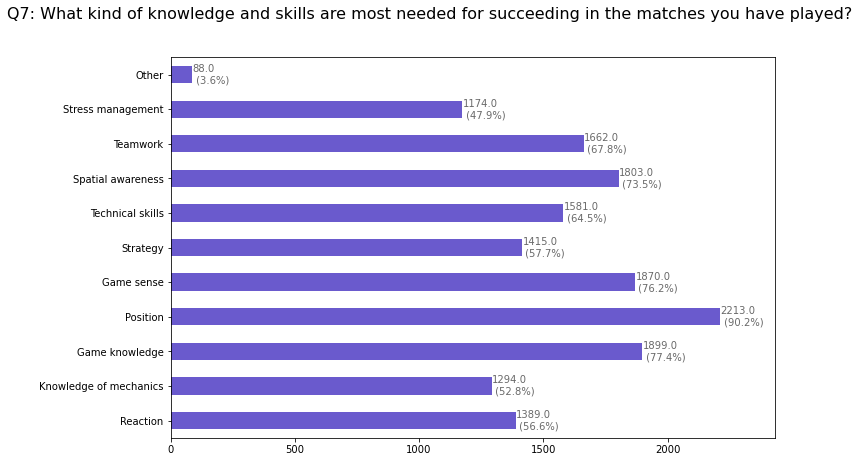

In [301]:
PlotBars(qdf,qnum,suptitle, countsB)

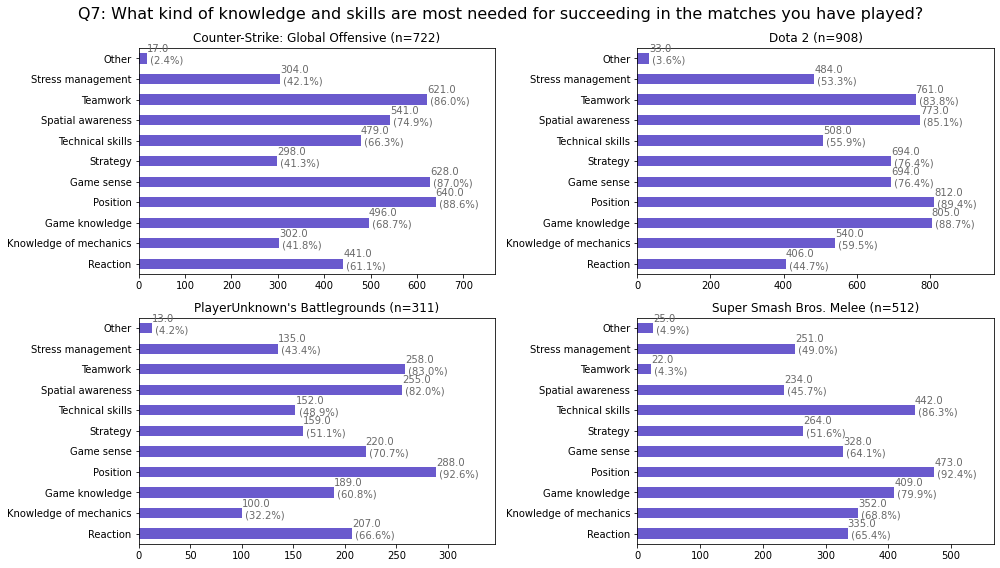

In [302]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

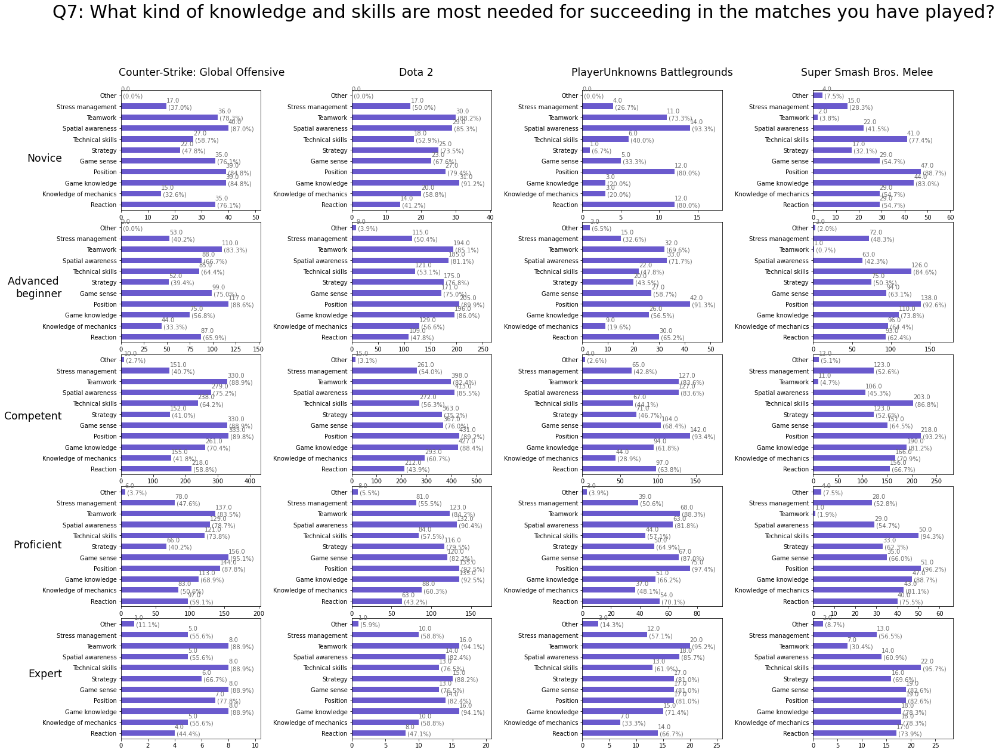

In [303]:
IndividualGraphsC(suptitle, qnum, order, qdf)

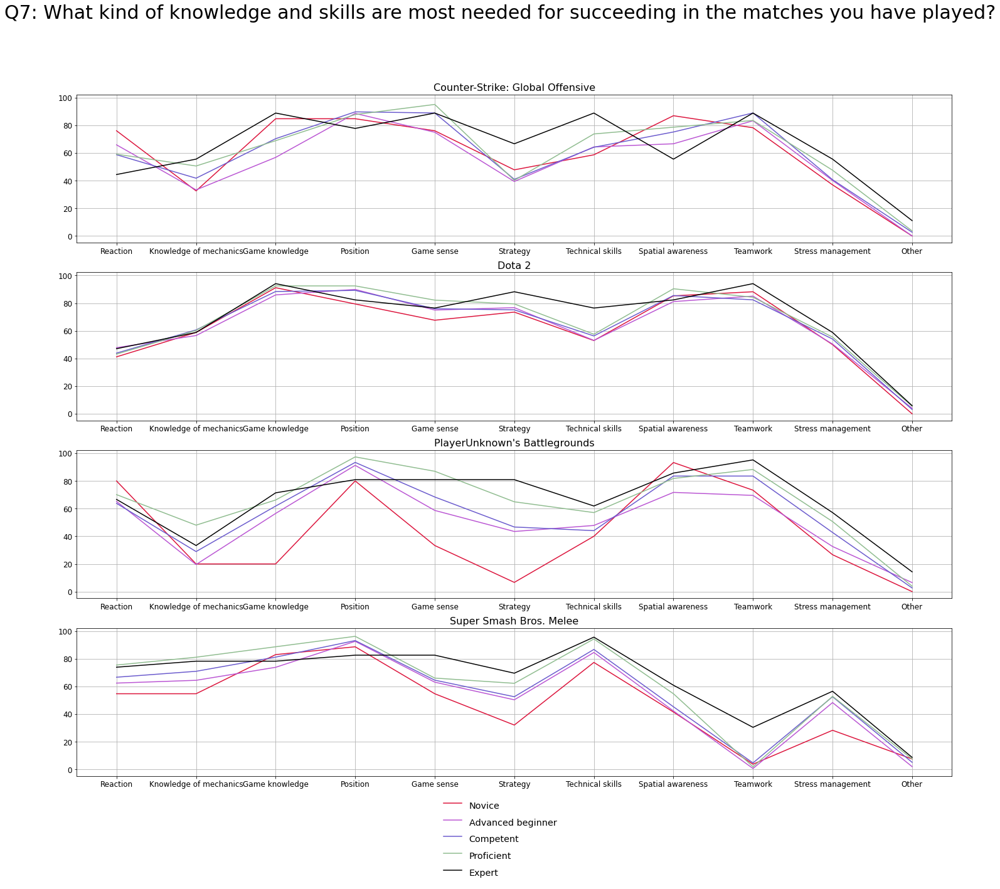

In [304]:
IndividualLines(suptitle,qnum,orderB,qdf)

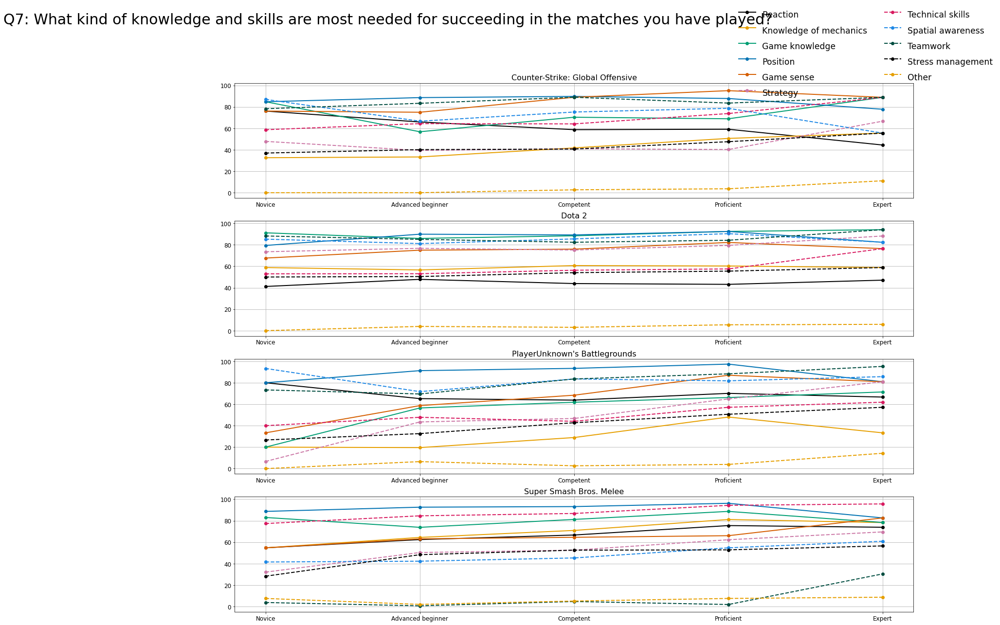

In [305]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

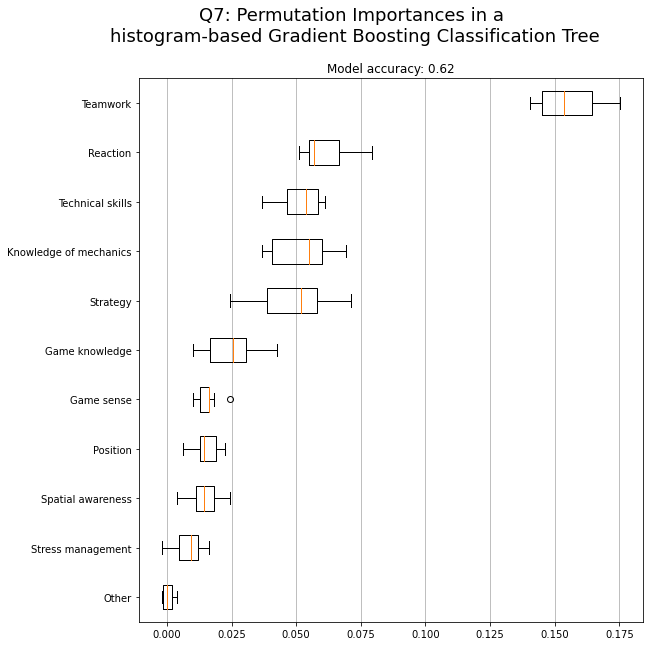

In [306]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':30, 'max_iter':10, 'min_samples_leaf':2}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [728]:
# Check for perfect separations in question data
q7PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q7PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Novice,Q7,Other,None
1,Counter-Strike: Global Offensive,Advanced beginner,Q7,Other,None
2,Dota 2,Novice,Q7,Other,None
3,PlayerUnknown's Battlegrounds,Novice,Q7,Other,None


In [769]:
q7LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList, q7PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros. Melee
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
S

In [730]:
q7oddRatios = GetOddRatios(q7LogRegCollection, gameList)

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.34023668639053256
Skill 0 after: Counter({1: 235, 0: 230})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.19450800915331806
Skill 0 after: Counter({1: 174, 0: 170})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.2533783783783784
Skill 0 after: Counter({1: 76, 0: 75})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.5773420479302832
Skill 0 after: Counter({1: 270, 0: 265})


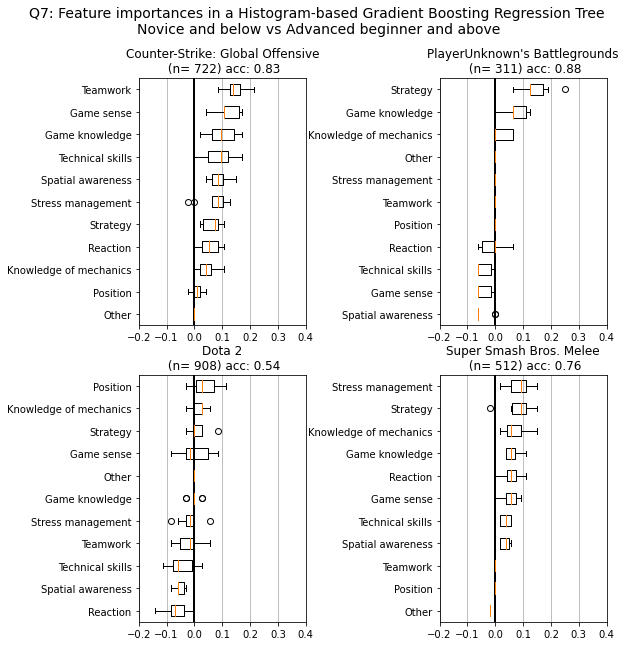

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


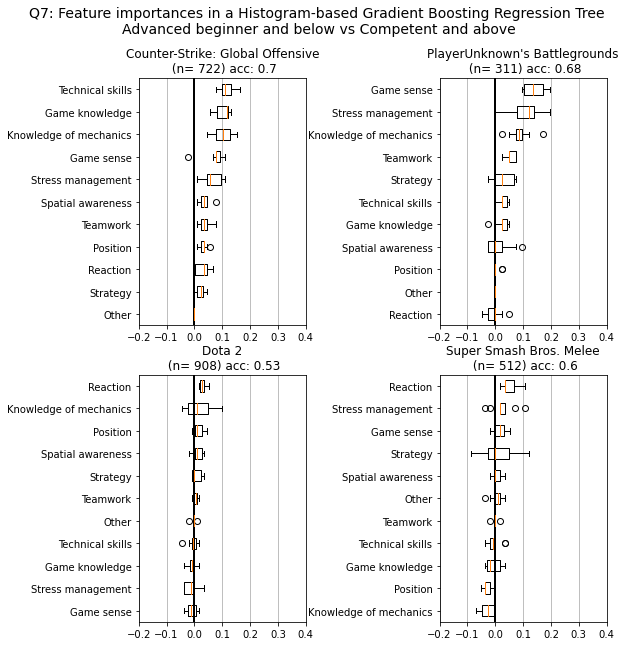

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


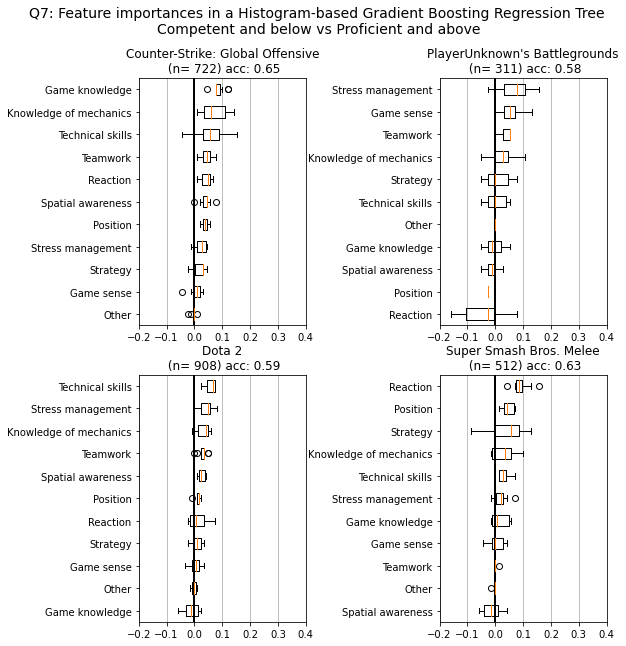

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.06311360448807854
Skill 0 after: Counter({0: 46, 1: 45})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.09539842873176206
Skill 0 after: Counter({0: 87, 1: 85})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.36206896551724144
Skill 0 after: Counter({0: 107, 1: 105})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.23517382413087934
Skill 0 after: Counter({0: 117, 1: 115})


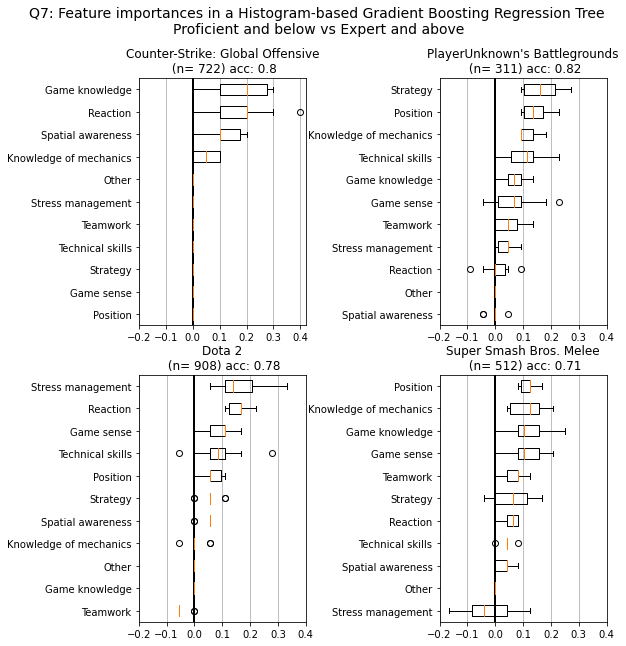

                            0      1      2     3
Reaction                0.057  0.029  0.042  0.17
Knowledge of mechanics  0.043  0.101  0.072  0.05
Game knowledge          0.100  0.104  0.084  0.17
Position                0.011  0.031  0.038  0.00
Game sense              0.119  0.074  0.005  0.00
Strategy                0.066  0.022  0.018  0.00
Technical skills        0.089  0.113  0.058  0.00
Spatial awareness       0.087  0.035  0.039  0.11
Teamwork                0.145  0.035  0.043  0.00
Stress management       0.070  0.064  0.023  0.00
                            0      1      2      3
Reaction                0.000  0.031  0.012  0.156
Knowledge of mechanics  0.017  0.018  0.031  0.006
Game knowledge          0.000  0.000  0.000  0.000
Position                0.037  0.015  0.013  0.061
Game sense              0.006  0.000  0.005  0.094
Strategy                0.014  0.007  0.008  0.056
Technical skills        0.000  0.000  0.060  0.089
Spatial awareness       0.000  0.012  0.02

In [770]:
q7Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':15}
q7importances = getImportances2(qdf, qnum, orderB, q7Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

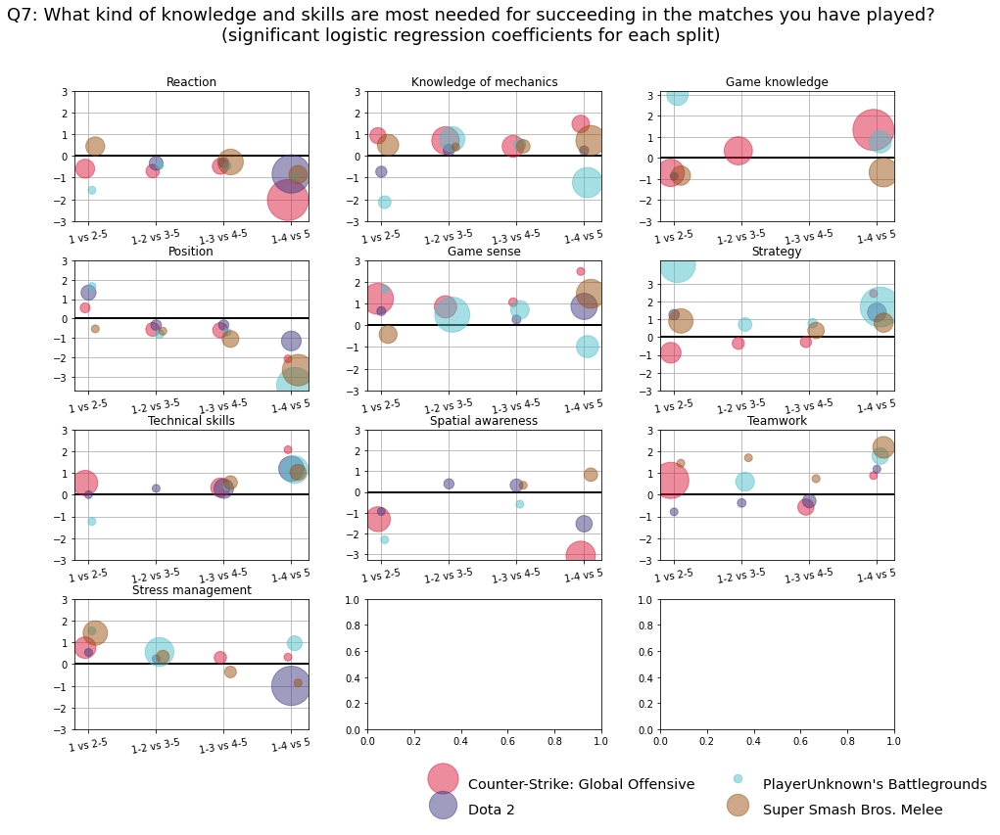

In [771]:
ScatterPlotImportances(suptitle, orderB, qnum, q7LogRegCollection, q7importances,gameList)

<Figure size 432x288 with 0 Axes>

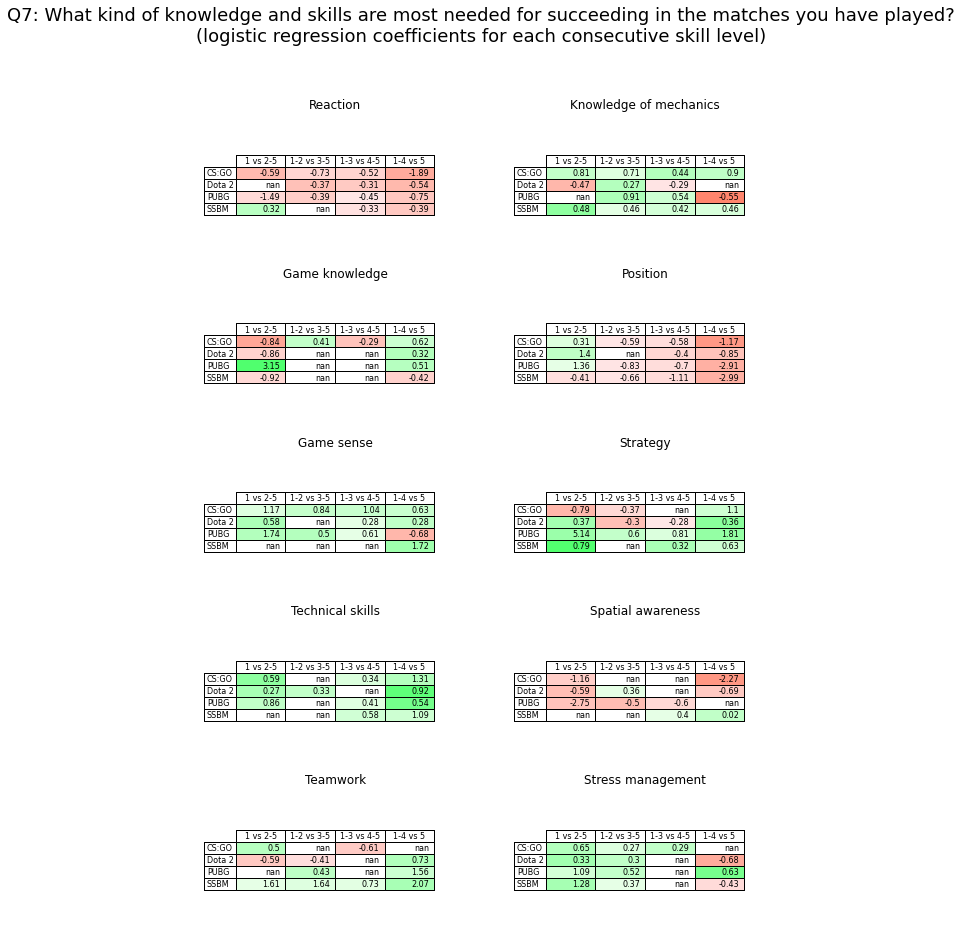

In [761]:
TablePlotImportances(suptitle, orderB, qnum, q7LogRegCollection, q7importances,gameList)

In [94]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[0]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [95]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.4931506849315068
[[ 0.64896112 -0.56848383  0.79894168  0.12185664 -0.74686865  0.24438949
  -0.19224409  0.61770295 -0.32499108 -0.21634975 -0.44438385]
 [ 0.25806495 -0.00581539 -0.81343813  0.35893006 -0.64343184  0.01495082
  -0.37092853 -0.28315545  0.01513975 -0.13695154 -0.7074714 ]
 [-0.14226645  0.15697677 -0.1096676   0.25059193  0.28411563 -0.23232114
  -0.30063473 -0.03406528  0.46070667 -0.05056862  0.54816223]
 [-0.24199007  0.42093649 -0.32763092 -0.09979699  1.06345075 -0.3811365
  -0.07524384  0.29464011 -0.25471621  0.10688915  0.72474679]
 [-0.52276954 -0.00361405  0.45179498 -0.63158164  0.04273411  0.35411733
   0.93905119 -0.59512233  0.10386086  0.29698076 -0.12105377]]


In [96]:
for game in gameList:
    tempdf = qdf.loc[qdf['Q1']==game]
    for item in skillList:
        tempdf2 = tempdf.loc[tempdf['orderedSkill']==item]
        for item2 in orderB:
            if tempdf2[item2].nunique() <2:
                print(game + " "+item + " "+item2)
        

Counter-Strike: Global Offensive Novice Other
Counter-Strike: Global Offensive Advanced beginner Other
Dota 2 Novice Other
PlayerUnknown's Battlegrounds Novice Other


In [97]:
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary()) 

Optimization terminated successfully.
         Current function value: 0.644325
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  722
Model:                          Logit   Df Residuals:                      711
Method:                           MLE   Df Model:                           10
Date:                Mon, 15 Feb 2021   Pseudo R-squ.:                 -0.2781
Time:                        15:50:34   Log-Likelihood:                -465.20
converged:                       True   LL-Null:                       -363.97
Covariance Type:            nonrobust   LLR p-value:                     1.000
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Reaction                  -0.2305      0.169     -1.367      0.172      -0.561      

In [98]:
# Binary logistic regressions!


In [99]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
testDf['triSkill']= 0

for index, row in testDf.iterrows():
    if row['skill']<= 1:
        testDf.at[index,'triSkill']=0
    elif row['skill']>2:
        testDf.at[index,'triSkill']=2
    else:
        testDf.at[index,'triSkill']=1
        

In [100]:
csGoodVars = [0,1,4,6,7,8,9]
meleeGoodVars = [0,7]
pubgGoodVars = [2,5,9]
csGoodVars = meleeGoodVars

for i in range(4):
    regDf = pd.DataFrame()
    regDf['skill']=testDf['triSkill'].copy()
    for item in csGoodVars:
        regDf[orderB[item]] = testDf[orderB[item]]
    regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
    regDf['skill']=regDf['skill']-i

    # defining the dependent and independent variables 
    Xtrain = regDf.drop('skill',axis=1).astype(int)
    ytrain = regDf['skill']

    # building the model and fitting the data 
    log_reg = sm.Logit(ytrain, Xtrain).fit()
    print("Skill levels: "+ str(i) + " and " +str(i+1))
    print(log_reg.summary()) 

Optimization terminated successfully.
         Current function value: 0.688245
         Iterations 4
Skill levels: 0 and 1
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  436
Model:                          Logit   Df Residuals:                      434
Method:                           MLE   Df Model:                            1
Date:                Mon, 15 Feb 2021   Pseudo R-squ.:                0.003195
Time:                        15:50:40   Log-Likelihood:                -300.07
converged:                       True   LL-Null:                       -301.04
Covariance Type:            nonrobust   LLR p-value:                    0.1654
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Reaction              0.2149      0.154      1.397      0.162      -0.08

PerfectSeparationError: Perfect separation detected, results not available

In [101]:
for item in orderB:
    allDf[(item + " " + qnum)]= qdf[item]
allDf

NameError: name 'allDf' is not defined

In [102]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Reaction
Spearmans correlation coefficient: -0.079
*** Samples are correlated (reject H0) p=0.034
Kendall correlation coefficient: -0.074
*** Samples are correlated (reject H0) p=0.034
# Knowledge of mechanics
Spearmans correlation coefficient: 0.125
*** Samples are correlated (reject H0) p=0.001
Kendall correlation coefficient: 0.117
*** Samples are correlated (reject H0) p=0.001
# Game knowledge
Spearmans correlation coefficient: 0.034
Samples are uncorrelated (fail to reject H0) p=0.367
Kendall correlation coefficient: 0.031
Samples are uncorrelated (fail to reject H0) p=0.367
# Position
Spearmans correlation coefficient: -0.002
Samples are uncorrelated (fail to reject H0) p=0.948
Kendall correlation coefficient: -0.002
Samples are uncorrelated (fail to reject H0) p=0.948
# Game sense
Spearmans correlation coefficient: 0.200
*** Samples are correlated (reject H0) p=0.000
Kendall correl

In [103]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator, ZeroCount

from tpot import TPOTClassifier
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(pd.np.array(testDf[orderB].astype(int)), pd.np.array(testDf['skill'].astype(int)).ravel(),
                                                    train_size=0.9, test_size=0.1, random_state=42)



In [104]:
#Create a Gaussian Classifier
clf=RandomForestClassifier()

#Train the model using the training sets
clf.fit(X_train,y_train)

Y_pred=clf.predict(X_test)

In [105]:
# Use score method to get accuracy of model
score = clf.score(X_test, y_test)
print(score)

0.4423076923076923


In [106]:


# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(clf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [106]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 200)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [1, 2, 3, 5,8,10,15,20]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,5,8,10]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 4, 5, 8, 10],
 'min_samples_split': [1, 2, 3, 5, 8, 10, 15, 20],
 'n_estimators': [10,
                  10,
                  11,
                  12,
                  13,
                  14,
                  15,
                  16,
                  17,
                  18,
                  19,
                  20,
                  21,
                  22,
                  23,
                  24,
                  25,
                  26,
                  27,
                  28,
                  29,
                  30,
                  31,
                  31,
                  32,
                  33,
                  34,
                  35,
                  36,
                  37,
                  38,
                  39,
                  40,
                  41,
                  4

In [108]:
X_train, X_test1, Y_train, Y_test1 = train_test_split(pd.np.array(testDf[orderB].astype(int)), pd.np.array(testDf['skill'].astype(int)).ravel(), test_size=0.2, random_state=4)
X_test, X_valid, Y_test, Y_valid = train_test_split(X_test1,Y_test1,test_size=0.5,random_state=3)

In [108]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune

results, names = list(), list()
    
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model = RandomForestClassifier()

model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model

model_random.fit(X_train,Y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 5, 8, 10],
                                        'min_samples_split': [1, 2, 3, 5, 8, 10,
                                                              15, 20],
                                        'n_estimators': [10, 10, 11, 12, 13, 14,
                                                         15, 16, 17, 18, 19, 20,
                                                         21, 22, 23, 24, 25, 26,

In [109]:
def evaluate2(model, test_features, test_labels):
    predictions = model.predict(test_features)
    rights=0.0
    for i in range(len(test_labels)):
        print("True: " + str(test_labels[i]) + " Predicted: " + str(predictions[i]))
        if (test_labels[i]==predictions[i]):
            print("NICE!!")
            rights +=1
        
    accuracy = rights / len(test_labels)

    print('Model Performance')
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

In [110]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.8, test_size=0.2, random_state=2)

reg = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)
reg.fit(X_train, y_train)
preds = reg.predict(X_test)
y = pd.np.array(y_test)
#for i in range(len(preds)):
#    print("True: " + str(round(preds[i])) +", Predicted: "+  str(y[i]))
#    if round(preds[i])==y[i]:
#        print("NICEEE")

In [113]:
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(reg.get_params())

Parameters currently in use:

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'ls',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 0,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}


In [114]:
# Try different criterion
criterion = ['friedman_mse', 'mse', 'mae']

# Try different learning rates
learning_rate = [0.01, 0.05, 0.1, 0.2, 0.5, 0.75, 0.9 ,1.0]

# Loss functions
loss = ['ls', 'lad', 'huber', 'quantile']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 1, stop = 200, num = 21)]

# Try with warm start
warm_start = [False, True]

# Create the random grid
random_grid = {'criterion': criterion,
               'learning_rate': learning_rate,
               'loss': loss,
               'max_depth': max_depth,
               'n_estimators': n_estimators,
               'max_features': max_features,
               'warm_start': warm_start
              }
pprint(random_grid)

{'criterion': ['friedman_mse', 'mse', 'mae'],
 'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5, 0.75, 0.9, 1.0],
 'loss': ['ls', 'lad', 'huber', 'quantile'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt', 'log2'],
 'n_estimators': [1,
                  10,
                  20,
                  30,
                  40,
                  50,
                  60,
                  70,
                  80,
                  90,
                  100,
                  110,
                  120,
                  130,
                  140,
                  150,
                  160,
                  170,
                  180,
                  190,
                  200],
 'warm_start': [False, True]}


In [115]:
from sklearn.model_selection import RandomizedSearchCV
model_random = RandomizedSearchCV(estimator = GradientBoostingRegressor(), param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

In [111]:
def BoostEvaluate(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    rights = 0.0
    for i in range(len(y_test)):
        true = pd.np.array(y_test)[i]
        pred = round(predictions[i])
        if true == pred:
            rights +=1

    #print("Accuracy: " + str(rights/len(y_test)))
    return rights/len(y_test)

In [139]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.4min finished


Best model: 
Reaction: 0.09
Knowledge of mechanics: 0.06
Game knowledge: 0.13
Position: 0.1
Game sense: 0.13
Strategy: 0.09
Technical skills: 0.08
Spatial awareness: 0.09
Teamwork: 0.12
Stress management: 0.09
Other: 0.02


In [150]:
best_random

GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber',
                          max_depth=70, max_features='log2', n_estimators=40)

In [140]:
predictions_best = best_random.predict(X_test)
y = pd.np.array(y_test)
predictions_best

array([1.66897176, 2.04811646, 1.90632011, 1.50924057, 2.        ,
       1.90632011, 2.16551412, 2.03490337, 1.83448588, 2.11034275,
       1.84902105, 1.72607078, 1.94482863, 1.84902105, 1.95074336,
       2.03490337, 1.89607847, 2.03490337, 2.00775716, 1.93920395,
       1.91579721, 2.        , 2.16551412, 1.72607078, 1.72607078,
       1.83448588, 2.03490337, 2.03490337, 2.01947225, 1.83448588,
       2.01947225, 2.07835104, 1.85813075, 2.        , 1.82587539,
       1.69250942, 2.06620565, 2.03490337, 1.78341379, 2.        ,
       2.12454241, 2.11034275, 2.05517137, 2.03490337, 2.03490337,
       1.50924057, 1.66897176, 2.00289147, 2.07356183, 1.72607078,
       2.03490337, 1.93920424, 2.03490337, 1.92465961, 2.        ,
       1.66897176, 2.04728975, 1.66897176, 1.91579721, 2.03490337,
       2.33102824, 1.84902105, 2.03490337, 1.84902105, 2.08922899,
       1.66897176, 2.03490337, 2.        , 1.85813075, 2.14186925,
       2.07227674, 1.90632011, 2.03194624])

In [480]:
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)


Accuracy: 0.38461538461538464


In [481]:
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

Accuracy: 0.46153846153846156


In [482]:
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Reaction: 0.13
Knowledge of mechanics: 0.15
Game knowledge: 0.08
Position: 0.06
Game sense: 0.11
Strategy: 0.13
Technical skills: 0.04
Spatial awareness: 0.09
Teamwork: 0.06
Stress management: 0.1
Other: 0.05


In [745]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [1259]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.3698630136986301


In [738]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[-0.025     0.028125 -0.01875   0.003125 -0.0125    0.00625   0.03125
 -0.04375   0.003125 -0.0125    0.      ]
[0.04145781 0.0451776  0.05077524 0.009375   0.03479853 0.02338536
 0.0369755  0.05266344 0.03262596 0.025      0.        ]


In [739]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],2)))
    i+=1

Reaction: -0.02
Knowledge of mechanics: 0.03
Game knowledge: -0.02
Position: 0.0
Game sense: -0.01
Strategy: 0.01
Technical skills: 0.03
Spatial awareness: -0.04
Teamwork: 0.0
Stress management: -0.01
Other: 0.0


In [740]:
best_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# l2_regularization lambda from gxboost
l2_regularization = [0.2, 0.5, 0.9]

# Try different learning rates
max_iter= [5, 10, 25, 50]

# Maximum number of levels in tree
max_depth = [2,5,10,None]

# Min samples leaf, recommended below 20
min_samples_leaf = [2,5,10,15]

# Find the base model predictions and print the accuracy with train data
best_pred = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(best_pred)

for i in range(10):
    for depth in max_depth:
        j =0
        for reg in l2_regularization:
            for iters in max_iter:
                for min_leaf in min_samples_leaf:
                    test_model = HistGradientBoostingClassifier(min_samples_leaf = min_leaf,max_iter= iters,learning_rate = (0.3*i)+0.05,max_depth = depth, l2_regularization = reg)
                    test_pred = BoostEvaluate(test_model, X_train, y_train,X_test,y_test)
                    if test_pred > best_pred:
                        best_pred = test_pred
                        best_model = test_model
                        print(best_model.score(X_test, y_test))
                        print(best_pred)
                    print("min_leaf: "+ str(min_leaf))
                print("Iters: "+ str(iters) + " (" + str(j)+"/4)")
            j+=1
        print("depth: "+ str(depth))
    print("completion: " + str((i+1)*10)+"%")

0.4375
0.59375
0.59375
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (2/4)
depth: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
0.625
0.6

min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (2/4)
depth: 10
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
mi

min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (2/4)
depth: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters

min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (1/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (2/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (2/4)
depth: 10
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 5 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 10 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 25 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iters: 50 (0/4)
min_leaf: 5
min_leaf: 10
min_leaf: 15
min_leaf: 20
Iter

In [741]:
besthist7= best_model

In [742]:
besthist7.score(X_test, y_test)

0.625

In [743]:
besthist7

HistGradientBoostingClassifier(l2_regularization=0.2, learning_rate=0.05,
                               max_depth=5, max_iter=25, min_samples_leaf=15)

In [1320]:
q7cs = {'l2_regularization':0.2, 'learning_rate':1.25, 'max_depth':5, 'max_iter':25, 'min_samples_leaf':5}

q7dota = {'l2_regularization': 0.2, 'learning_rate':0.05, 'max_depth':10, 'max_iter':25, 'min_samples_leaf':10}

q7pubg = {'l2_regularization':0.2, 'learning_rate':0.05, 'max_depth':5, 'max_iter':25, 'min_samples_leaf':15}

q7Melee = {'l2_regularization':0.5, 'learning_rate':2.7499999999999996, 'max_depth':10,  'max_iter':5, 'min_samples_leaf':15}

# FUCK I OVERFIT
# THese are probably okay:
q7cs= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':10}


In [1397]:
q7cs= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':10}
best_model = HistGradientBoostingClassifier(**q7cs)

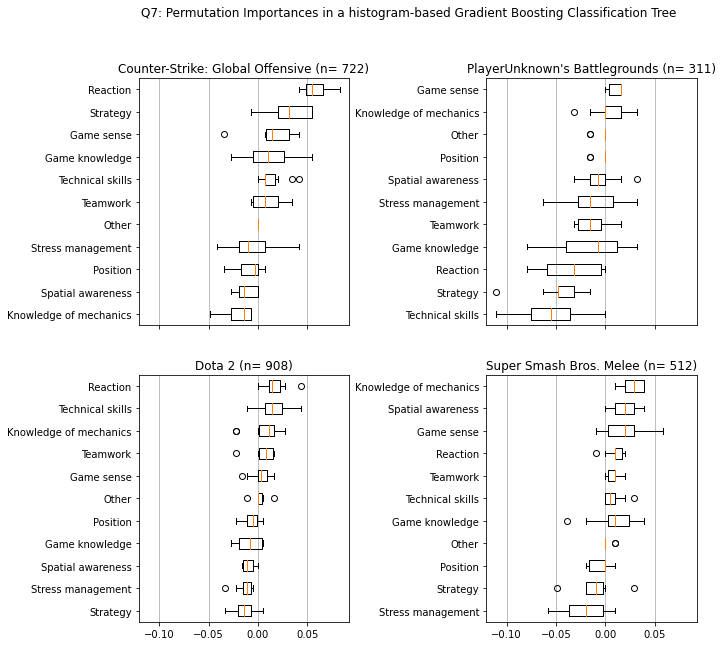

In [1422]:
q7Params= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':10}
PermutationImportancesPlot(qdf,qnum,q7Params,gameList,skillList)

## Question 8: How do you study and analyze the SPATIAL aspects of gameplay?
* Select at least one


In [98]:
orderA = ["Thinking about gameplay", "Conversations about gameplay", 
            "Writing memos about gameplay", "Reviewing play videos",
            "Gathering and viewing spatial data about gameplay", 
            "Doing statistical spatial data analysis of gameplay", 
            "I do not analyze", "Other"]
orderB = ["Thinking", "Conversations","Memos","Play videos","View spatial data", "Spatial data analysis", "I do not analyze", "Other"]


suptitle = 'Q8: How do you study and analyze the SPATIAL aspects of gameplay?'
qnum = 'Q8'

qdf = SetupDf(df,qnum,orderA,orderB)
countsB = MakeCountsB(qdf, orderB)

In [99]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

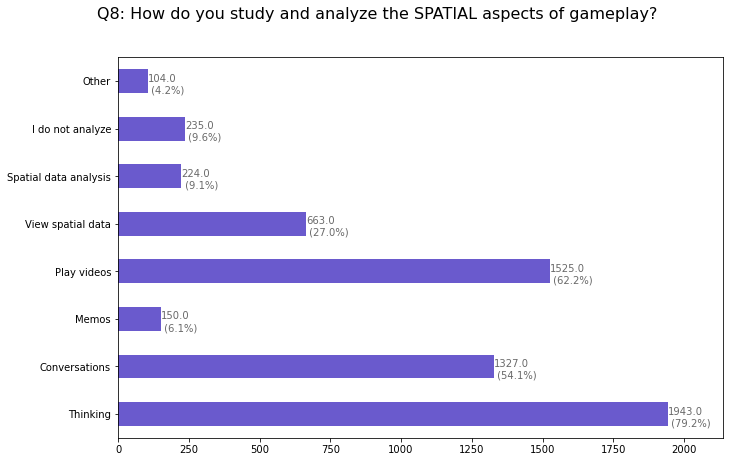

In [669]:
PlotBars(qdf,qnum,suptitle,countsB)

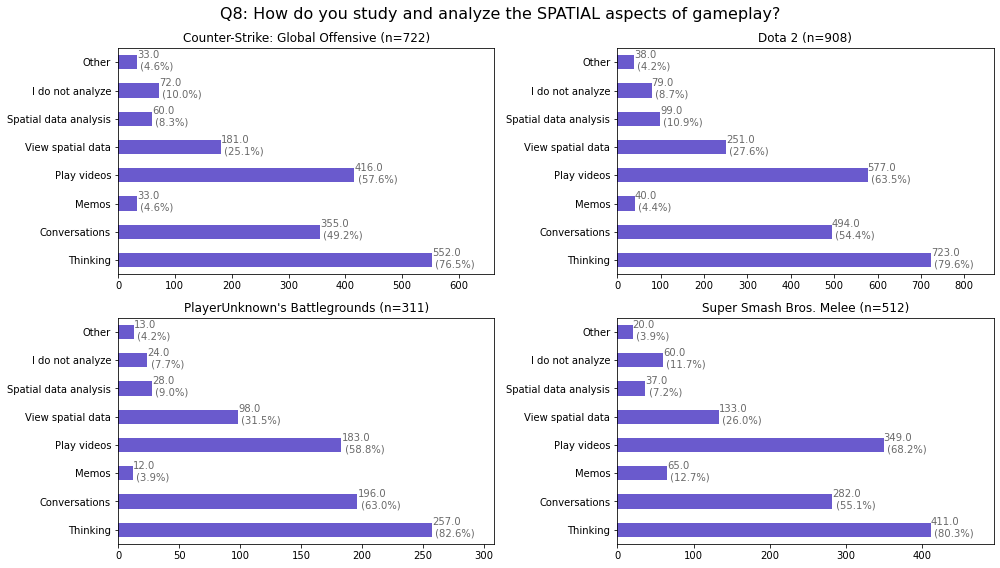

In [670]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

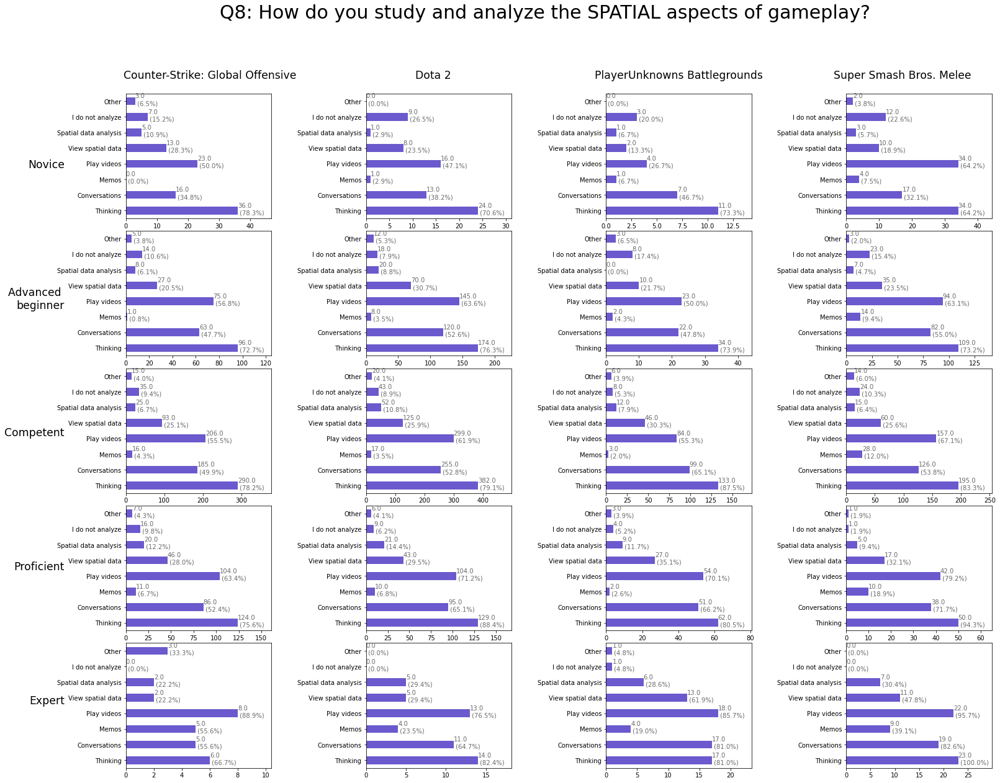

In [671]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

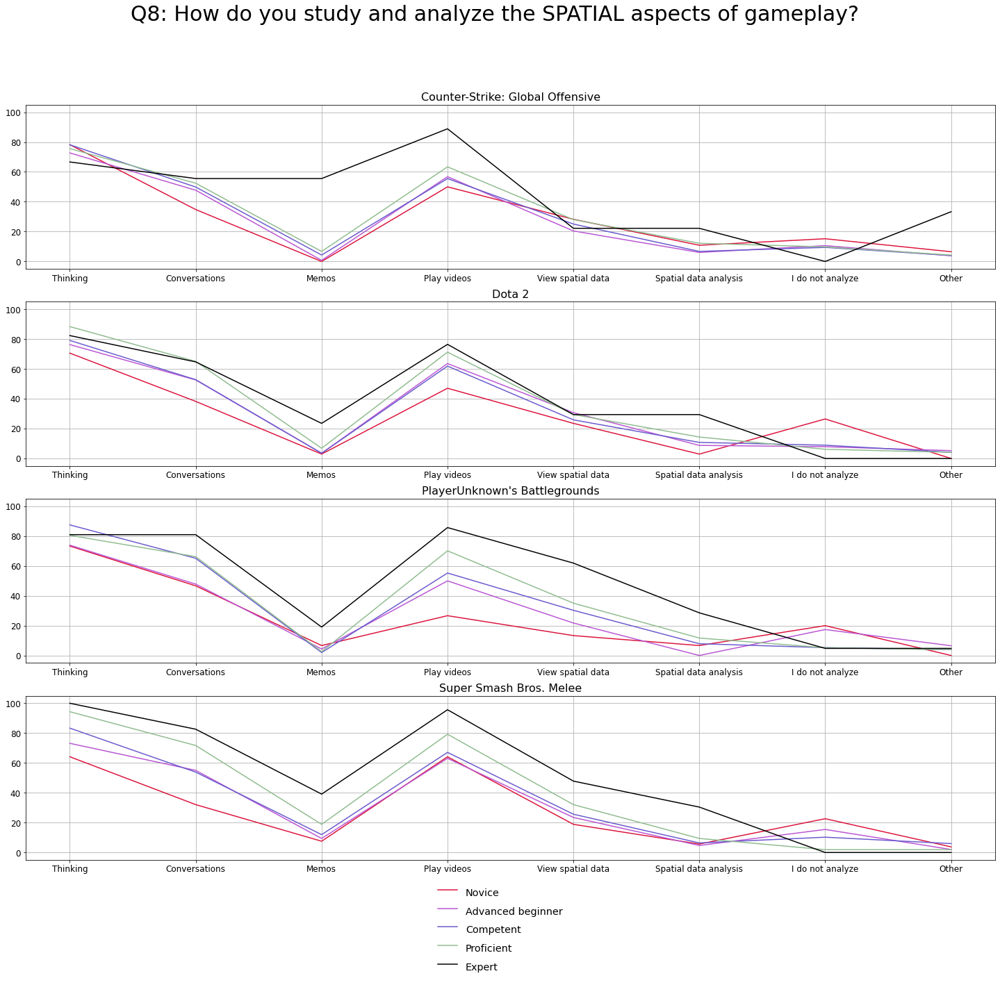

In [672]:
IndividualLines(suptitle,qnum,orderB,qdf)

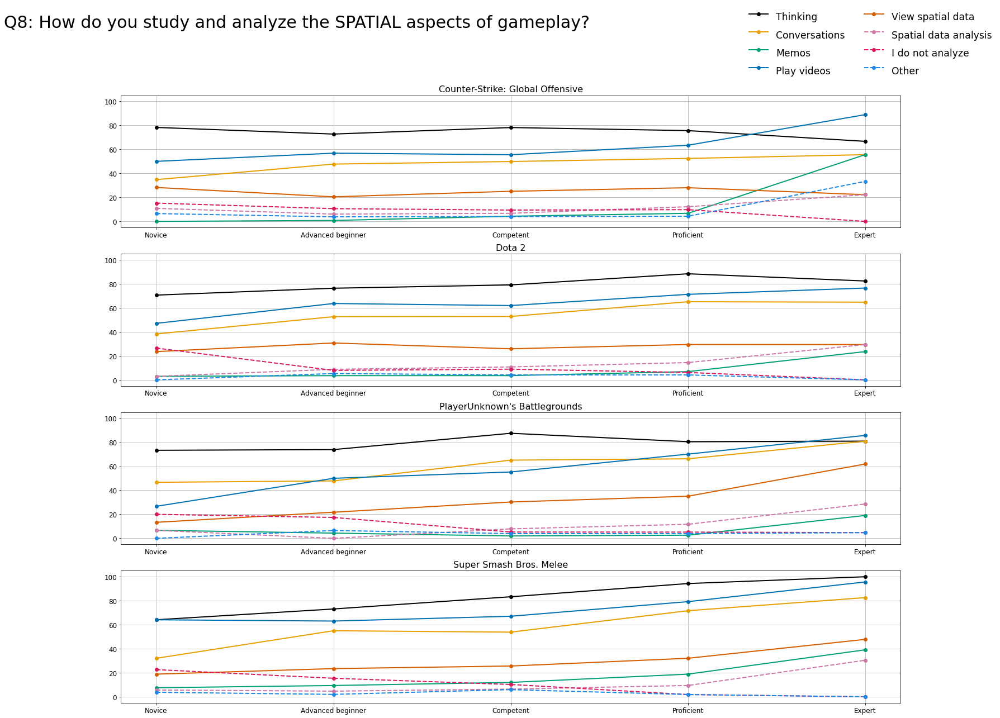

In [673]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

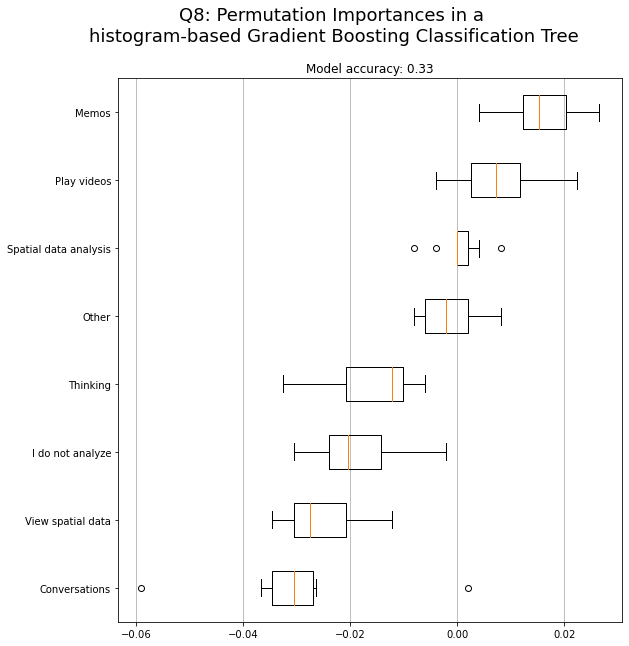

In [674]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.5, 'max_depth':5, 'max_iter':10, 'min_samples_leaf':10}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [754]:
q8PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q8PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Novice,Q8,Memos,None
1,Counter-Strike: Global Offensive,Expert,Q8,I do not analyze,None
2,Dota 2,Novice,Q8,Other,None
3,Dota 2,Expert,Q8,I do not analyze,None
4,Dota 2,Expert,Q8,Other,None
5,PlayerUnknown's Battlegrounds,Novice,Q8,Other,None
6,PlayerUnknown's Battlegrounds,Advanced beginner,Q8,Spatial data analysis,None
7,Super Smash Bros. Melee,Expert,Q8,Thinking,All
8,Super Smash Bros. Melee,Expert,Q8,I do not analyze,None
9,Super Smash Bros. Melee,Expert,Q8,Other,None


In [778]:
q8LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList,q8PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Memos']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['I do not analyze']
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['I do not analyze']
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros. Melee
Skill levels: Novice and below vs Advanced beginner and above
Ski

In [602]:
q8oddRatios = GetOddRatios(q8LogRegCollection, gameList)

In [567]:
q8oddRatios

{'Counter-Strike: Global Offensive':                               0         1         2          3
 Thinking               4.526731  1.954237  0.371577   0.030807
 Conversations          3.095657  1.390968       NaN   0.269820
 Memos                       NaN  9.974182  3.095657  63.434000
 Play videos            3.560853  1.404948       NaN   0.107528
 View spatial data           NaN       NaN       NaN   0.115325
 Spatial data analysis       NaN       NaN       NaN        NaN
 I do not analyze       8.084915  2.225541  0.316637        NaN,
 'Dota 2':                               0         1         2         3
 Thinking               6.889510  1.915541  0.379083  0.066537
 Conversations          3.189933       NaN       NaN  0.360595
 Memos                       NaN       NaN  2.339647  7.242743
 Play videos            4.953032  1.349859  0.588605  0.148080
 View spatial data           NaN       NaN  0.663650  0.336216
 Spatial data analysis       NaN  1.698932  1.568312  3.320117


Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.34023668639053256
Skill 0 after: Counter({1: 235, 0: 230})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.19450800915331806
Skill 0 after: Counter({1: 174, 0: 170})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.2533783783783784
Skill 0 after: Counter({1: 76, 0: 75})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.5773420479302832
Skill 0 after: Counter({1: 270, 0: 265})


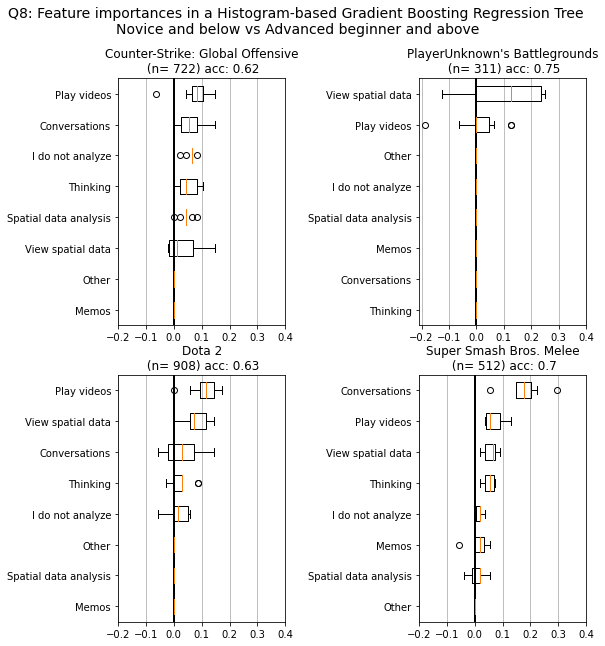

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


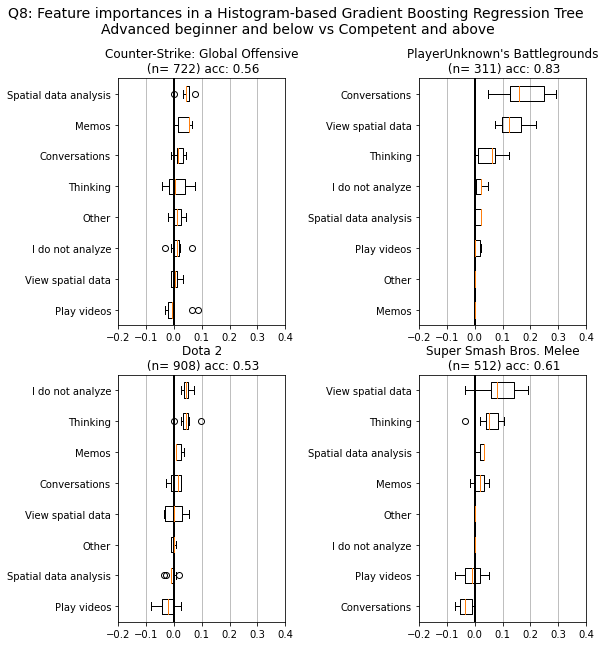

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


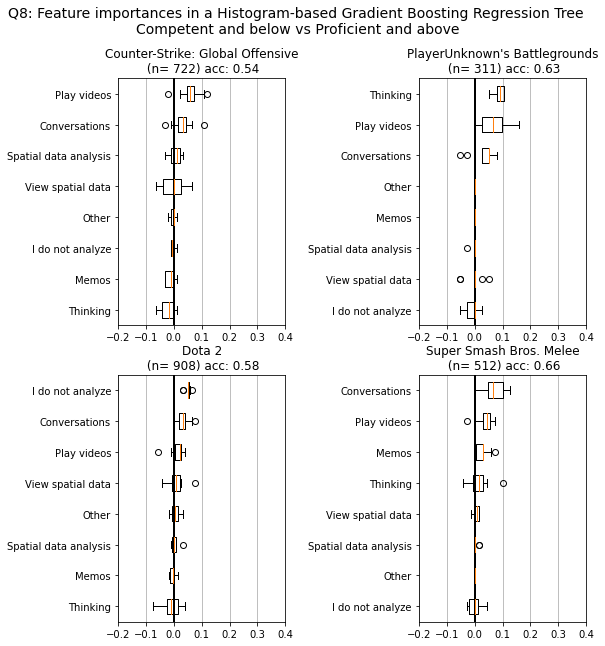

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.06311360448807854
Skill 0 after: Counter({0: 46, 1: 45})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.09539842873176206
Skill 0 after: Counter({0: 87, 1: 85})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.36206896551724144
Skill 0 after: Counter({0: 107, 1: 105})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.23517382413087934
Skill 0 after: Counter({0: 117, 1: 115})


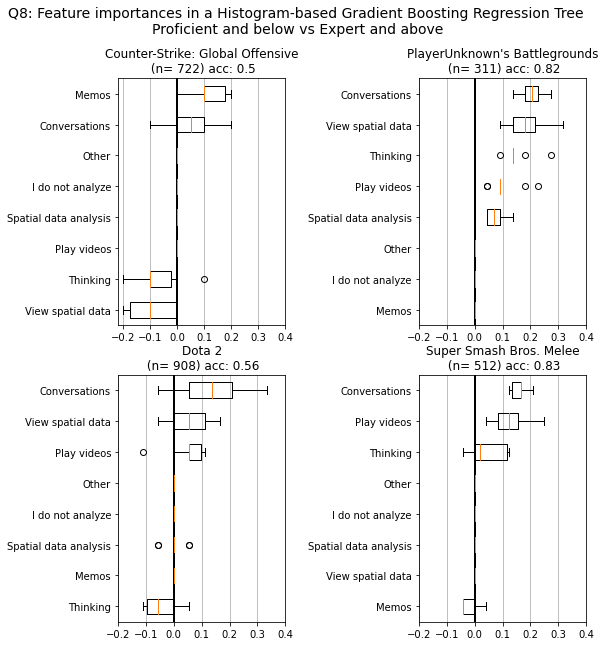

                           0      1      2     3
Thinking               0.053  0.011  0.000  0.00
Conversations          0.062  0.021  0.032  0.06
Memos                  0.000  0.040  0.000  0.11
Play videos            0.077  0.004  0.059  0.00
View spatial data      0.030  0.005  0.000  0.00
Spatial data analysis  0.043  0.045  0.004  0.00
I do not analyze       0.060  0.010  0.000  0.00
                           0      1      2      3
Thinking               0.026  0.044  0.000  0.000
Conversations          0.031  0.007  0.034  0.133
Memos                  0.000  0.016  0.000  0.000
Play videos            0.111  0.000  0.012  0.050
View spatial data      0.080  0.002  0.009  0.056
Spatial data analysis  0.000  0.000  0.003  0.000
I do not analyze       0.011  0.047  0.050  0.000
                           0      1      2      3
Thinking               0.000  0.054  0.087  0.150
Conversations          0.000  0.180  0.034  0.200
Memos                  0.000  0.000  0.000  0.000
Play vid

In [779]:
q8Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':15}
q8importances = getImportances2(qdf, qnum, orderB, q8Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

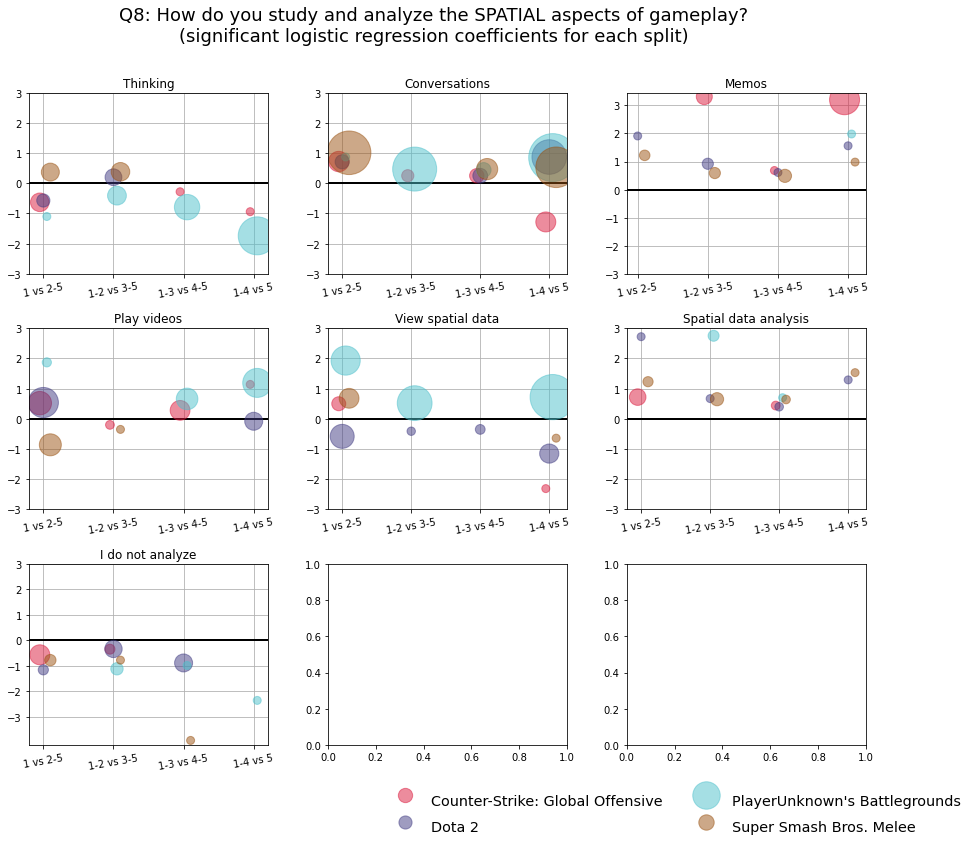

In [780]:
ScatterPlotImportances(suptitle, orderB, qnum, q8LogRegCollection, q8importances,gameList)

<Figure size 432x288 with 0 Axes>

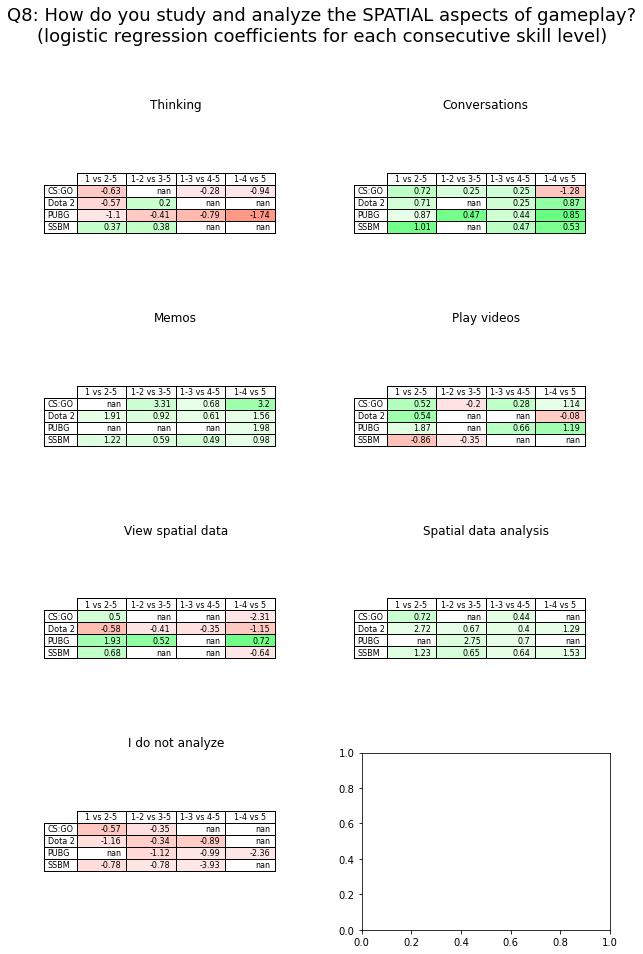

In [781]:
TablePlotImportances(suptitle, orderB,qnum, q8LogRegCollection, q8importances,gameList)

In [492]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[2]]
#testDf = qdf.copy()
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
testDf['triSkill']= 0

for index, row in testDf.iterrows():
    if row['skill']<= 1:
        testDf.at[index,'triSkill']=0
    elif row['skill']>2:
        testDf.at[index,'triSkill']=2
    else:
        testDf.at[index,'triSkill']=1
        

In [719]:
q8Collection1 = LogRegCollection(qdf,orderB,skillList,gameList)


Counter-Strike: Global Offensive
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Dota 2
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
PlayerUnknown's Battlegrounds
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Super Smash Bros. Melee
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Counter-Strike: Global Offensive
                          0     1     2     3
Thinking              -0.52  0.26 -0.31 -0.59
Conversations          0.75   NaN   NaN -1.08
Memos                   NaN  2.09   NaN  2.78
Play videos            0.57 -0.33

In [424]:

q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)-1])
averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)-1])

for i in range(4):
    print("Skill levels: "+ str(skillList[i]) + " and " +str(skillList[i+1]))

    for iterator in range(50):
        notBest = True
        regDf = pd.DataFrame()
        regDf['skill']=testDf['skill'].copy()
        for item in range(len(orderB)-1):
            regDf[orderB[item]] = testDf[orderB[item]]

        regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
        regDf['skill']=regDf['skill']-i


        while(notBest):
            # Read dataframe for another iteration
            Xfirst = regDf.astype(int)
            yfirst = regDf['skill'].astype(int)

            # Transform the dataset using over- and undersampling
            X, y = OverUnderSample(Xfirst, yfirst)

            # defining the dependent and independent variables 
            Xtrain = X.drop('skill',axis=1).astype(int)
            ytrain = X['skill']

            # building the model and fitting the data 
            log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0)

            results_summary = log_reg.summary()

            # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
            results_as_html = results_summary.tables[1].as_html()
            resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

            # Check if df contains a variable with p > alpha, drop the column
            # If not, there are only statistifically significant columns left and iteration can be stopped
            if (resultDf['P>|z|'].max() >= 0.05):
                regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
            else:        
                notBest=False

            if(len(regDf.columns)<=1):
                notBest = False
                results_summary = "EVERYTHING IS BAD"

        # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
        if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
            continue
        for index, row in resultDf.iterrows():
            q8RegDf.at[index, i] += row['coef']
            averagerDf.at[index, i] += 1


Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert


In [306]:
csGoodVars = [0,4,6,7,8]
meleeGoodVars = [0,1,2,3,4,5,6]
pubgGoodVars = [2,5,9]
csGoodVars = meleeGoodVars

for i in range(4):
    regDf = pd.DataFrame()
    regDf['skill']=testDf['skill'].copy()
    for item in csGoodVars:
        regDf[orderB[item]] = testDf[orderB[item]]
        
    regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
    regDf['skill']=regDf['skill']-i

    # defining the dependent and independent variables 
    Xtrain = regDf.drop('skill',axis=1).astype(int)
    ytrain = regDf['skill']

    # building the model and fitting the data 
    log_reg = sm.Logit(ytrain, Xtrain).fit()
    print("Skill levels: "+ str(i) + " and " +str(i+1))
    print(log_reg.summary()) 
    
    
results_summary = log_reg.summary()

# Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
results_as_html = results_summary.tables[1].as_html()
pd.read_html(results_as_html, header=0, index_col=0)[0]

Optimization terminated successfully.
         Current function value: 0.518655
         Iterations 6
Skill levels: 0 and 1
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  703
Model:                          Logit   Df Residuals:                      696
Method:                           MLE   Df Model:                            6
Date:                Tue, 16 Feb 2021   Pseudo R-squ.:               -0.007776
Time:                        16:48:08   Log-Likelihood:                -364.61
converged:                       True   LL-Null:                       -361.80
Covariance Type:            nonrobust   LLR p-value:                     1.000
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Thinking                  0.6011      0.161      3.745      0.00

,coef,std err,z,P>|z|,[0.025,0.975]
Thinking,-1.5658,0.236,-6.622,0.000,-2.029,-1.102
Conversations,-0.1655,0.264,-0.627,0.531,-0.683,0.352
Memos,1.5800,0.339,4.664,0.000,0.916,2.244
Play videos,-0.6299,0.254,-2.480,0.013,-1.128,-0.132
View spatial data,-0.1722,0.291,-0.592,0.554,-0.742,0.398
Spatial data analysis,0.6507,0.357,1.823,0.068,-0.049,1.350
I do not analyze,-3.2381,1.019,-3.179,0.001,-5.235,-1.242


Skill 0 first: Counter({1: 132, 0: 46})
Ratio: 0.3484848484848485
Ratio first: 0.3484848484848485
Ratio after: 0.84
Skill 0 after: Counter({1: 111, 0: 110})
Skill 0 first: Counter({1: 228, 0: 34})
Ratio: 0.14912280701754385
Ratio first: 0.14912280701754385
Ratio after: 0.79
Skill 0 after: Counter({1: 183, 0: 180})
Skill 0 first: Counter({1: 46, 0: 15})
Ratio: 0.32608695652173914
Ratio first: 0.32608695652173914
Ratio after: 0.83
Skill 0 after: Counter({0: 38, 1: 38})
Skill 0 first: Counter({1: 149, 0: 53})
Ratio: 0.35570469798657717
Ratio first: 0.35570469798657717
Ratio after: 0.84
Skill 0 after: Counter({1: 127, 0: 125})


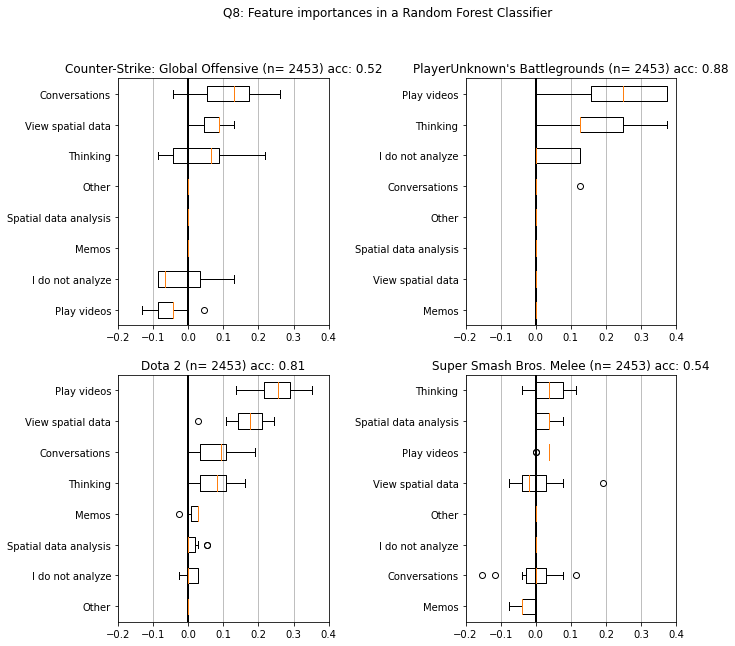

Skill 0 first: Counter({1: 371, 0: 132})
Ratio: 0.3557951482479784
Ratio first: 0.3557951482479784
Ratio after: 0.84
Skill 0 after: Counter({1: 316, 0: 311})
Skill 0 first: Counter({1: 483, 0: 228})
Ratio: 0.4720496894409938
Ratio first: 0.4720496894409938
Ratio after: 0.87
Skill 0 after: Counter({1: 425, 0: 420})
Skill 0 first: Counter({1: 152, 0: 46})
Ratio: 0.3026315789473684
Ratio first: 0.3026315789473684
Ratio after: 0.83
Skill 0 after: Counter({1: 128, 0: 126})
Skill 0 first: Counter({1: 234, 0: 149})
Ratio: 0.6367521367521367
Ratio first: 0.6367521367521367
Ratio after: 0.91
Skill 0 after: Counter({1: 213, 0: 212})


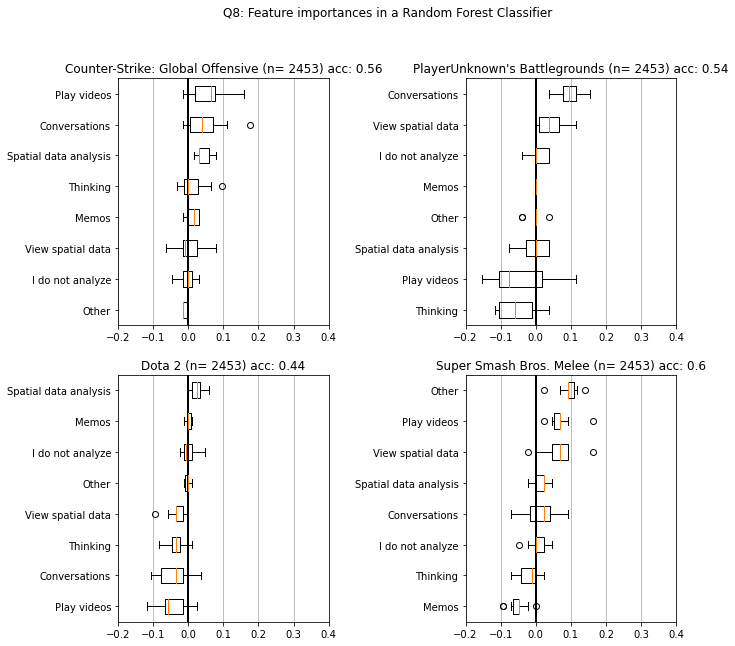

Skill 0 first: Counter({0: 371, 1: 164})
Ratio: 2.2621951219512195
Ratio first: 0.4420485175202156
Ratio after: 0.86
Skill 0 after: Counter({0: 323, 1: 319})
Skill 0 first: Counter({0: 483, 1: 146})
Ratio: 3.308219178082192
Ratio first: 0.3022774327122153
Ratio after: 0.83
Skill 0 after: Counter({0: 406, 1: 400})
Skill 0 first: Counter({0: 152, 1: 77})
Ratio: 1.974025974025974
Ratio first: 0.506578947368421
Ratio after: 0.88
Skill 0 after: Counter({0: 134, 1: 133})
Skill 0 first: Counter({0: 234, 1: 53})
Ratio: 4.415094339622642
Ratio first: 0.2264957264957265
Ratio after: 0.81
Skill 0 after: Counter({0: 192, 1: 189})


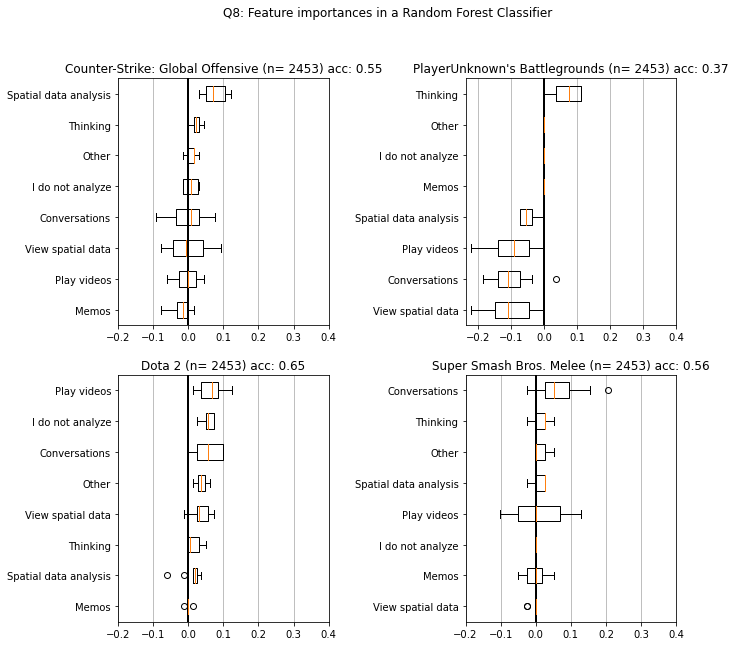

Skill 0 first: Counter({0: 164, 1: 9})
Ratio: 18.22222222222222
Ratio first: 0.054878048780487805
Ratio after: 0.76
Skill 0 after: Counter({0: 127, 1: 124})
Skill 0 first: Counter({0: 146, 1: 17})
Ratio: 8.588235294117647
Ratio first: 0.11643835616438356
Ratio after: 0.78
Skill 0 after: Counter({0: 115, 1: 113})
Skill 0 first: Counter({0: 77, 1: 21})
Ratio: 3.6666666666666665
Ratio first: 0.2727272727272727
Ratio after: 0.82
Skill 0 after: Counter({0: 64, 1: 63})
Skill 0 first: Counter({0: 53, 1: 23})
Ratio: 2.3043478260869565
Ratio first: 0.4339622641509434
Ratio after: 0.86
Skill 0 after: Counter({0: 45, 1: 45})


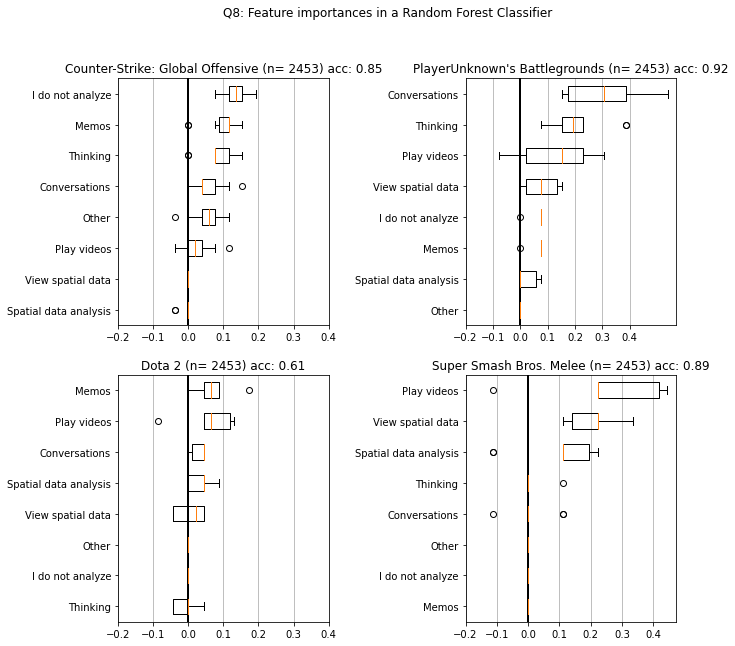

In [709]:
q8Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':15}
importancesCollection = getImportances(qdf, qnum, orderB, q8Params, gameList, skillList, 10)

In [710]:
for game in gameList:
    print(game)
    print(importancesCollection[game])

Counter-Strike: Global Offensive
                           0      1      2      3
Thinking               0.039  0.014  0.022  0.081
Conversations          0.113  0.049  0.002  0.062
Memos                  0.000  0.014  0.000  0.092
Play videos            0.000  0.057  0.000  0.023
View spatial data      0.074  0.003  0.000  0.000
Spatial data analysis  0.000  0.041  0.074  0.000
I do not analyze       0.000  0.000  0.006  0.135
Dota 2
                           0      1      2      3
Thinking               0.073  0.000  0.015  0.000
Conversations          0.081  0.000  0.057  0.030
Memos                  0.016  0.002  0.000  0.070
Play videos            0.254  0.000  0.064  0.065
View spatial data      0.168  0.000  0.035  0.004
Spatial data analysis  0.014  0.025  0.010  0.030
I do not analyze       0.005  0.000  0.058  0.000
PlayerUnknown's Battlegrounds
                           0      1     2      3
Thinking               0.188  0.000  0.07  0.208
Conversations          0.012  0.

Skill 0 first: Counter({1: 132, 0: 46})
Ratio: 0.3484848484848485
Ratio first: 0.3484848484848485
Ratio after: 0.84
Skill 0 after: Counter({1: 111, 0: 110})
Skill 0 first: Counter({1: 228, 0: 34})
Ratio: 0.14912280701754385
Ratio first: 0.14912280701754385
Ratio after: 0.79
Skill 0 after: Counter({1: 183, 0: 180})
Skill 0 first: Counter({1: 46, 0: 15})
Ratio: 0.32608695652173914
Ratio first: 0.32608695652173914
Ratio after: 0.83
Skill 0 after: Counter({0: 38, 1: 38})
Skill 0 first: Counter({1: 149, 0: 53})
Ratio: 0.35570469798657717
Ratio first: 0.35570469798657717
Ratio after: 0.84
Skill 0 after: Counter({1: 127, 0: 125})


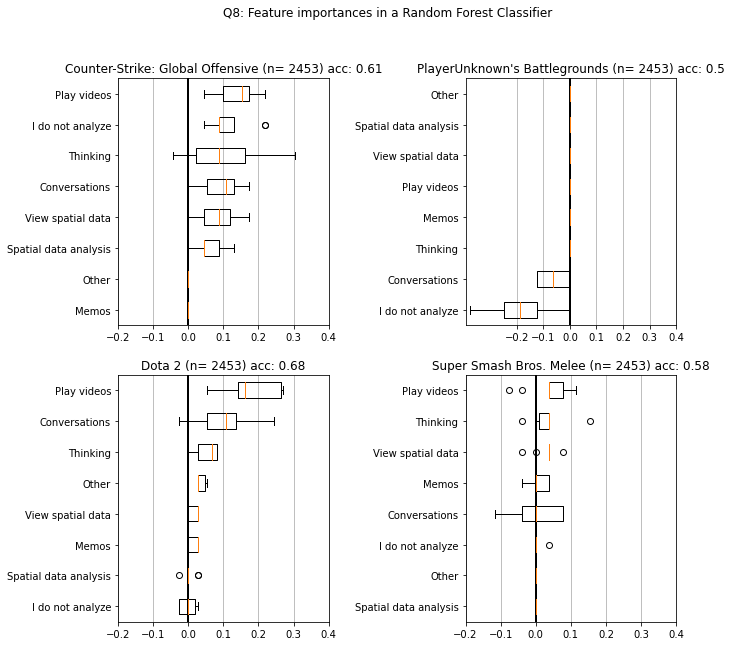

Skill 0 first: Counter({1: 371, 0: 132})
Ratio: 0.3557951482479784
Ratio first: 0.3557951482479784
Ratio after: 0.84
Skill 0 after: Counter({1: 316, 0: 311})
Skill 0 first: Counter({1: 483, 0: 228})
Ratio: 0.4720496894409938
Ratio first: 0.4720496894409938
Ratio after: 0.87
Skill 0 after: Counter({1: 425, 0: 420})
Skill 0 first: Counter({1: 152, 0: 46})
Ratio: 0.3026315789473684
Ratio first: 0.3026315789473684
Ratio after: 0.83
Skill 0 after: Counter({1: 128, 0: 126})
Skill 0 first: Counter({1: 234, 0: 149})
Ratio: 0.6367521367521367
Ratio first: 0.6367521367521367
Ratio after: 0.91
Skill 0 after: Counter({1: 213, 0: 212})


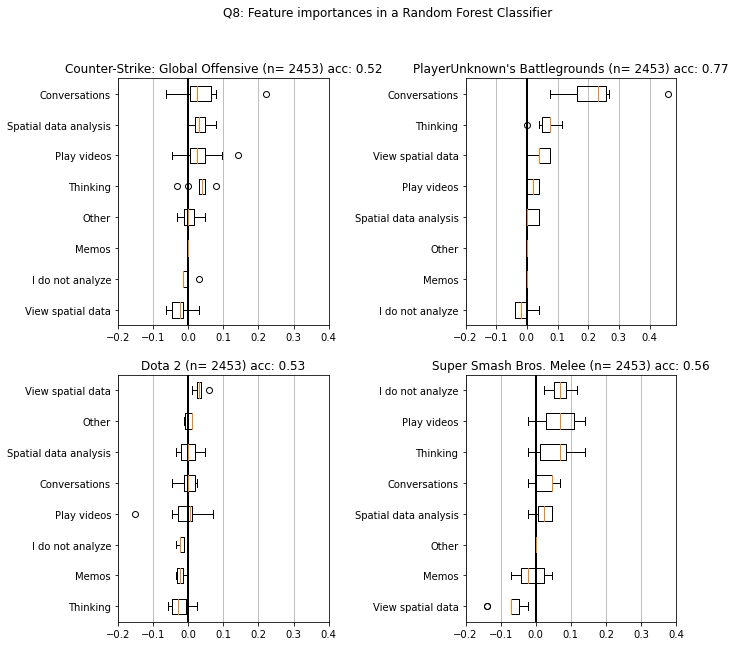

Skill 0 first: Counter({0: 371, 1: 164})
Ratio: 2.2621951219512195
Ratio first: 0.4420485175202156
Ratio after: 0.86
Skill 0 after: Counter({0: 323, 1: 319})
Skill 0 first: Counter({0: 483, 1: 146})
Ratio: 3.308219178082192
Ratio first: 0.3022774327122153
Ratio after: 0.83
Skill 0 after: Counter({0: 406, 1: 400})
Skill 0 first: Counter({0: 152, 1: 77})
Ratio: 1.974025974025974
Ratio first: 0.506578947368421
Ratio after: 0.88
Skill 0 after: Counter({0: 134, 1: 133})
Skill 0 first: Counter({0: 234, 1: 53})
Ratio: 4.415094339622642
Ratio first: 0.2264957264957265
Ratio after: 0.81
Skill 0 after: Counter({0: 192, 1: 189})


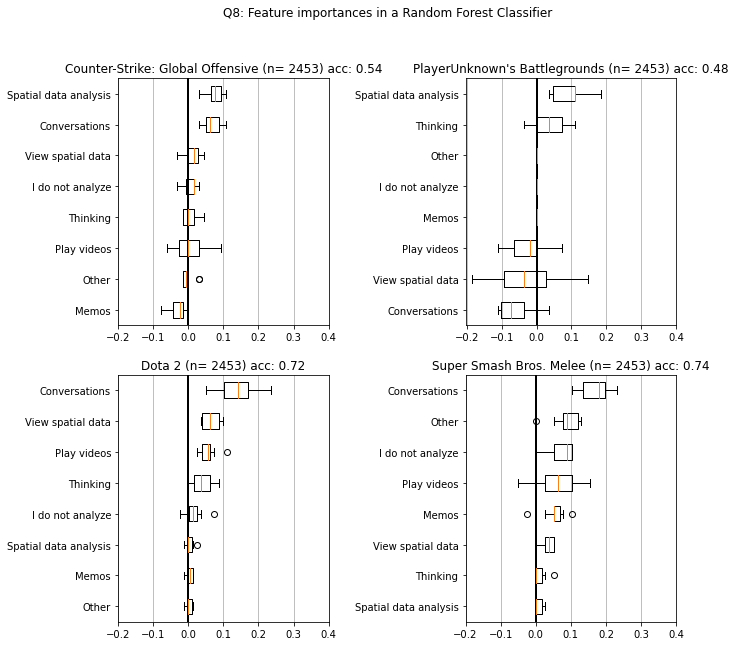

Skill 0 first: Counter({0: 164, 1: 9})
Ratio: 18.22222222222222
Ratio first: 0.054878048780487805
Ratio after: 0.76
Skill 0 after: Counter({0: 127, 1: 124})
Skill 0 first: Counter({0: 146, 1: 17})
Ratio: 8.588235294117647
Ratio first: 0.11643835616438356
Ratio after: 0.78
Skill 0 after: Counter({0: 115, 1: 113})
Skill 0 first: Counter({0: 77, 1: 21})
Ratio: 3.6666666666666665
Ratio first: 0.2727272727272727
Ratio after: 0.82
Skill 0 after: Counter({0: 64, 1: 63})
Skill 0 first: Counter({0: 53, 1: 23})
Ratio: 2.3043478260869565
Ratio first: 0.4339622641509434
Ratio after: 0.86
Skill 0 after: Counter({0: 45, 1: 45})


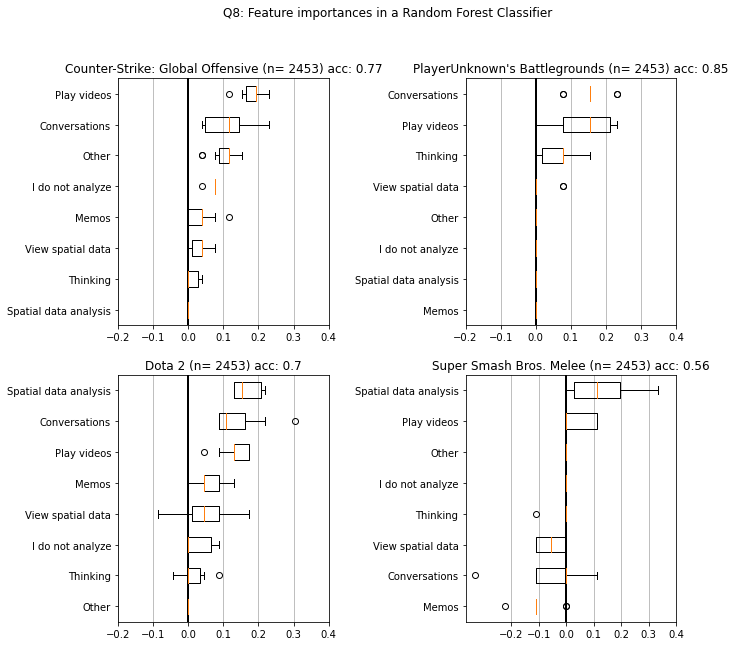

                           0      1      2      3
Thinking               0.104  0.033  0.005  0.012
Conversations          0.091  0.041  0.068  0.112
Memos                  0.000  0.000  0.000  0.035
Play videos            0.143  0.035  0.003  0.185
View spatial data      0.083  0.000  0.014  0.031
Spatial data analysis  0.065  0.038  0.075  0.000
I do not analyze       0.117  0.000  0.008  0.073
                           0      1      2      3
Thinking               0.051  0.000  0.042  0.009
Conversations          0.100  0.000  0.135  0.139
Memos                  0.016  0.000  0.004  0.061
Play videos            0.181  0.000  0.057  0.135
View spatial data      0.016  0.029  0.065  0.048
Spatial data analysis  0.003  0.002  0.004  0.165
I do not analyze       0.000  0.000  0.017  0.026
                         0      1      2      3
Thinking               0.0  0.069  0.037  0.069
Conversations          0.0  0.219  0.000  0.154
Memos                  0.0  0.000  0.000  0.000
Play vid

In [700]:
importancesCollection = {}
for game in gameList:
    importancesCollection[game] = pd.DataFrame(0.0,columns = [0],index=orderB[:len(orderB)-1])


for i in range(4):
    regDf = pd.DataFrame()
    regDf['skill']=testDf['skill'].copy()
    regDf['Q1']=testDf['Q1'].copy()
    
    for item in orderB:
        regDf[item] = testDf[item]
    
    regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
    regDf['skill']=regDf['skill']-i

    # building the model and fitting the data 
    #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
    #regressor.fit(Xtrain,ytrain)
    
    
    q8Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':15}
    #FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)
    oneCollection = FeatureImportancesPlot_balance(regDf, qnum, orderB, q8Params,gameList,skillList,i,5)
    for game in gameList:
        importancesCollection[game][i]= oneCollection[game][i]

In [701]:
for game in gameList:
    print(game)
    print(importancesCollection[game])

Counter-Strike: Global Offensive
                           0      1      2      3
Thinking               0.104  0.033  0.005  0.012
Conversations          0.091  0.041  0.068  0.112
Memos                  0.000  0.000  0.000  0.035
Play videos            0.143  0.035  0.003  0.185
View spatial data      0.083  0.000  0.014  0.031
Spatial data analysis  0.065  0.038  0.075  0.000
I do not analyze       0.117  0.000  0.008  0.073
Dota 2
                           0      1      2      3
Thinking               0.051  0.000  0.042  0.009
Conversations          0.100  0.000  0.135  0.139
Memos                  0.016  0.000  0.004  0.061
Play videos            0.181  0.000  0.057  0.135
View spatial data      0.016  0.029  0.065  0.048
Spatial data analysis  0.003  0.002  0.004  0.165
I do not analyze       0.000  0.000  0.017  0.026
PlayerUnknown's Battlegrounds
                         0      1      2      3
Thinking               0.0  0.069  0.037  0.069
Conversations          0.0  0.219 

In [ ]:
csGoodVars = [0,4,6,7,8]
meleeGoodVars = [0,1,2,3,4,5,6]
pubgGoodVars = [2,5,9]
csGoodVars = meleeGoodVars

for i in range(2):
    regDf = pd.DataFrame()
    regDf['skill']=testDf['triSkill'].copy()
    regDf['Q1']=testDf['Q1'].copy()
    
    for item in csGoodVars:
        regDf[orderB[item]] = testDf[orderB[item]]
    
    regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
    regDf['skill']=regDf['skill']-i

    # building the model and fitting the data 
    #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
    #regressor.fit(Xtrain,ytrain)
    q8Params = {'l2_regularization':0.2, 'learning_rate':0.95, 'max_depth':5, 'max_iter':10, 'min_samples_leaf':5}
    FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)

In [590]:
for item in orderB:
    allDf[(item + " " + qnum)]= qdf[item]
allDf

,orderedSkill,Q1,Q5Code,Competitiveness Q6,Entertainment Q6,Single player Q6,Genre / Series Q6,Social aspects Q6,Multiplayer Q6,High skill ceiling Q6,...,Stress management Q7,Other Q7,Thinking Q8,Conversations Q8,Memos Q8,Play videos Q8,View spatial data Q8,Spatial data analysis Q8,I do not analyze Q8,Other Q8
0,Novice,Counter-Strike: Global Offensive,0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Advanced beginner,Counter-Strike: Global Offensive,1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,Advanced beginner,Counter-Strike: Global Offensive,1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Advanced beginner,Counter-Strike: Global Offensive,1,1.0,1.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4,Advanced beginner,Counter-Strike: Global Offensive,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2468,Proficient,Super Smash Bros. Melee,3,1.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2469,Proficient,Super Smash Bros. Melee,3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
2470,Proficient,Super Smash Bros. Melee,3,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
2471,Proficient,Super Smash Bros. Melee,3,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [591]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Thinking
Spearmans correlation coefficient: 0.005
Samples are uncorrelated (fail to reject H0) p=0.901
Kendall correlation coefficient: 0.004
Samples are uncorrelated (fail to reject H0) p=0.901
# Conversations
Spearmans correlation coefficient: 0.063
Samples are uncorrelated (fail to reject H0) p=0.090
Kendall correlation coefficient: 0.059
Samples are uncorrelated (fail to reject H0) p=0.090
# Memos
Spearmans correlation coefficient: 0.157
*** Samples are correlated (reject H0) p=0.000
Kendall correlation coefficient: 0.147
*** Samples are correlated (reject H0) p=0.000
# Play videos
Spearmans correlation coefficient: 0.073
*** Samples are correlated (reject H0) p=0.050
Kendall correlation coefficient: 0.068
*** Samples are correlated (reject H0) p=0.050
# View spatial data
Spearmans correlation coefficient: 0.037
Samples are uncorrelated (fail to reject H0) p=0.315
Kendall correlation 

In [494]:
X_train, X_test, y_train, y_test = train_test_split(allDf[['Competitiveness Q6','Entertainment Q6',
                                    'Genre / Series Q6','High skill ceiling Q6','Game sense Q7',
                                    'Teamwork Q7','Conversations Q8','Memos Q8','Spatial data analysis Q8']].astype(int), allDf['Q5Code'],
                                                    train_size=0.9, test_size=0.1, random_state=3)
reg = GradientBoostingRegressor(n_estimators=50, learning_rate=0.2, max_depth=5, random_state=0)
reg.fit(X_train, y_train)
preds = reg.predict(X_test)
y = pd.np.array(y_test)
correct =0.0
for i in range(len(preds)):
    print("Predicted: " + str(round(preds[i],2)) +", True: "+  str(y[i]))
    if round(preds[i])==y[i]:
        correct+=1.0
        print("NICEEE")
        
print("Right: "+ str(correct/len(preds)))

Predicted: 1.03, True: 1
NICEEE
Predicted: 1.9, True: 2
NICEEE
Predicted: 1.9, True: 2
NICEEE
Predicted: 1.55, True: 1
Predicted: 1.81, True: 0
Predicted: 1.91, True: 3
Predicted: 1.84, True: 2
NICEEE
Predicted: 1.41, True: 1
NICEEE
Predicted: 1.89, True: 3
Predicted: 2.92, True: 2
Predicted: 2.15, True: 2
NICEEE
Predicted: 1.72, True: 1
Predicted: 1.14, True: 1
NICEEE
Predicted: 1.77, True: 3
Predicted: 1.56, True: 2
NICEEE
Predicted: 1.53, True: 3
Predicted: 2.21, True: 2
NICEEE
Predicted: 2.28, True: 3
Predicted: 2.05, True: 2
NICEEE
Predicted: 1.65, True: 2
NICEEE
Predicted: 3.11, True: 4
Predicted: 0.81, True: 2
Predicted: 2.67, True: 2
Predicted: 1.74, True: 2
NICEEE
Predicted: 2.28, True: 4
Predicted: 1.95, True: 1
Predicted: 2.21, True: 2
NICEEE
Predicted: 1.68, True: 1
Predicted: 1.59, True: 2
NICEEE
Predicted: 1.89, True: 2
NICEEE
Predicted: 1.77, True: 2
NICEEE
Predicted: 2.05, True: 2
NICEEE
Predicted: 2.21, True: 2
NICEEE
Predicted: 2.28, True: 2
NICEEE
Predicted: 1.71, Tr

In [495]:
## imps = reg.feature_importances_
i = 0
for item in imps:
    print(orderB[i]+ ": " + str(round(item,2)))
    i+=1

Thinking: 0.13
Conversations: 0.15
Memos: 0.08
Play videos: 0.06
View spatial data: 0.11
Spatial data analysis: 0.13
I do not analyze: 0.04
Other: 0.09


IndexError: list index out of range

In [497]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Accuracy: 0.6164383561643836
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best model: 
Accuracy: 0.6438356164383562
Thinking: 0.07
Conversations: 0.27
Memos: 0.18
Play videos: 0.18
View spatial data: 0.06
Spatial data analysis: 0.05
I do not analyze: 0.05
Other: 0.15


In [500]:
best8 = best_random
best8

GradientBoostingRegressor(criterion='mae', learning_rate=0.01, max_depth=None,
                          max_features='auto', n_estimators=30,
                          warm_start=True)

In [745]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [792]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.4807692307692308


In [793]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[-0.01730769  0.          0.00192308 -0.03076923 -0.02115385 -0.00384615
  0.          0.        ]
[0.02643794 0.         0.00576923 0.02307692 0.02007751 0.00769231
 0.         0.        ]


In [794]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],2)))
    i+=1

Thinking: -0.02
Conversations: 0.0
Memos: 0.0
Play videos: -0.03
View spatial data: -0.02
Spatial data analysis: -0.0
I do not analyze: 0.0
Other: 0.0


In [795]:
best_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# l2_regularization lambda from gxboost
l2_regularization = [0.2, 0.5, 0.9]

# Try different learning rates
max_iter= [5, 10, 25, 50]

# Maximum number of levels in tree
max_depth = [2,5,10,None]

# Min samples leaf, recommended below 20
min_samples_leaf = [2,5,10,15]

# Find the base model predictions and print the accuracy with train data
best_pred = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(best_pred)

for i in range(10):
    for depth in max_depth:
        j =0
        for reg in l2_regularization:
            for iters in max_iter:
                for min_leaf in min_samples_leaf:
                    test_model = HistGradientBoostingClassifier(min_samples_leaf = min_leaf,max_iter= iters,learning_rate = (0.3*i)+0.05,max_depth = depth, l2_regularization = reg)
                    test_pred = BoostEvaluate(test_model, X_train, y_train,X_test,y_test)
                    if test_pred > best_pred:
                        best_pred = test_pred
                        best_model = test_model
                        print(best_model.score(X_test, y_test))
                        print(best_pred)
                    print("min_leaf: "+ str(min_leaf))
                print("Iters: "+ str(iters) + " (" + str(j)+"/4)")
            j+=1
        print("depth: "+ str(depth))
    print("completion: " + str((i+1)*10)+"%")

0.4807692307692308
0.5192307692307693
0.5192307692307693
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
mi

min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min

min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_

In [796]:
besthist8= best_model

In [797]:
besthist8.score(X_test, y_test)

0.5384615384615384

In [798]:
besthist8

HistGradientBoostingClassifier(l2_regularization=0.2, learning_rate=0.65,
                               max_depth=2, max_iter=5, min_samples_leaf=5)

In [ ]:
q8cs =[l2_regularization=0.9,learning_rate=1.8499999999999999, max_depth=2, max_iter=10, min_samples_leaf=5]

q8dota = [l2_regularization=0.9, learning_rate=0.05, max_depth=10, max_iter=50, min_samples_leaf=5]

q8pubg = [l2_regularization=0.2, learning_rate=1.25, max_depth=2, max_iter=25, min_samples_leaf=15]

q8Melee = [l2_regularization=0.2, learning_rate=0.65, max_depth=2, max_iter=5, min_samples_leaf=5]
                               
q8Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':2, 'max_iter':10, 'min_samples_leaf':5}

In [695]:
imps = permutation_importance(besthist7, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)

[0.02884615 0.06346154 0.06730769 0.00192308 0.00769231 0.02115385
 0.00769231 0.00384615 0.         0.01730769 0.        ]
[0.01550434 0.02587235 0.03964525 0.00576923 0.00942111 0.01814227
 0.00942111 0.02242674 0.         0.02184196 0.        ]


In [696]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],2)))
    i+=1

Reaction: 0.03
Knowledge of mechanics: 0.06
Game knowledge: 0.07
Position: 0.0
Game sense: 0.01
Strategy: 0.02
Technical skills: 0.01
Spatial awareness: 0.0
Teamwork: 0.0
Stress management: 0.02
Other: 0.0


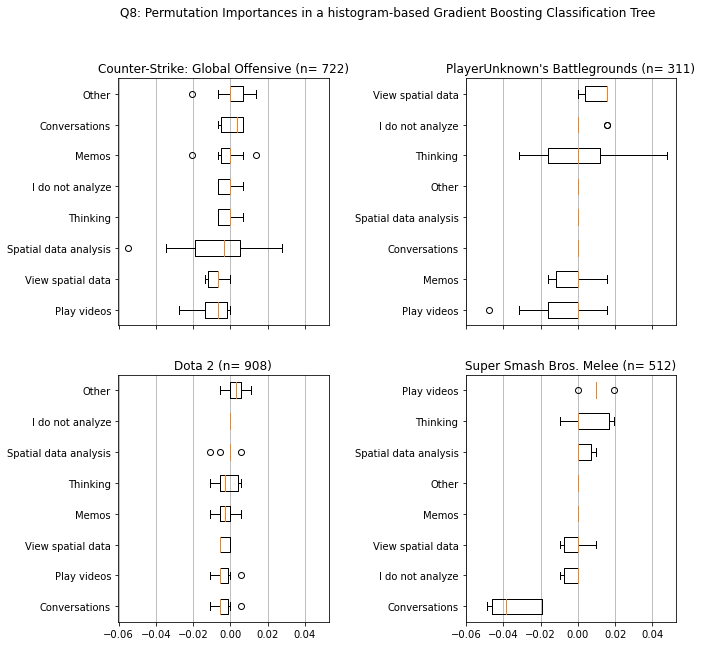

In [1428]:
q8Params = {'l2_regularization':0.5, 'learning_rate':0.4, 'max_depth':2, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot(qdf,qnum,q8Params,gameList,skillList)

## Question 9: How do you study and analyze the SPATIAL aspects of the game itself?
* Choose at least one

In [100]:
orderA = ["Thinking about the game", "Studying aspects of the game inside the game",
        "Studying the game from videos", "Studying the game from forum posts, written guides or fanpages",
        "Doing data analysis", "I do not analyze","Other"]
orderB = ["Thinking", "In-game","Game videos","Text guides","Spatial data analysis", "I do not analyze", "Other"]


suptitle = 'Q9: How do you study and analyze the SPATIAL aspects of the game itself?'
qnum = 'Q9'
qdf = SetupDf(df,qnum,orderA,orderB)
countsB=MakeCountsB(qdf, orderB)

In [101]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

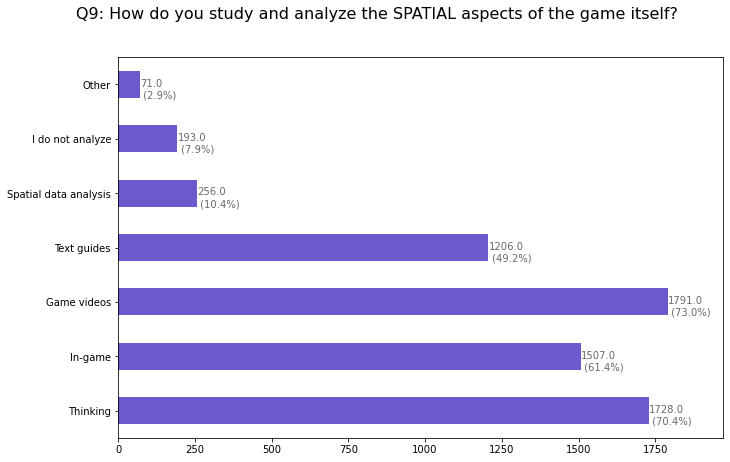

In [679]:
PlotBars(qdf,qnum,suptitle,countsB)

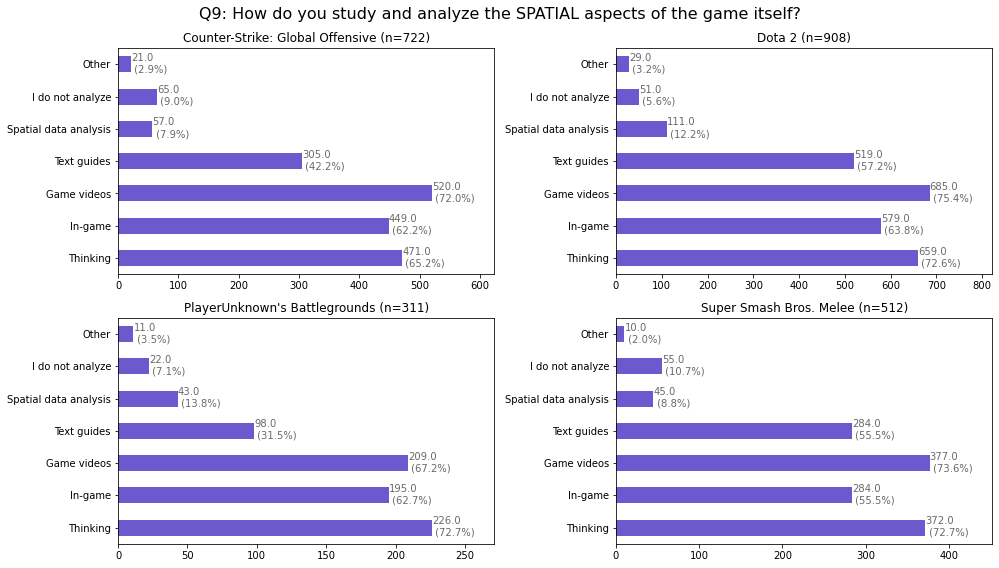

In [680]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

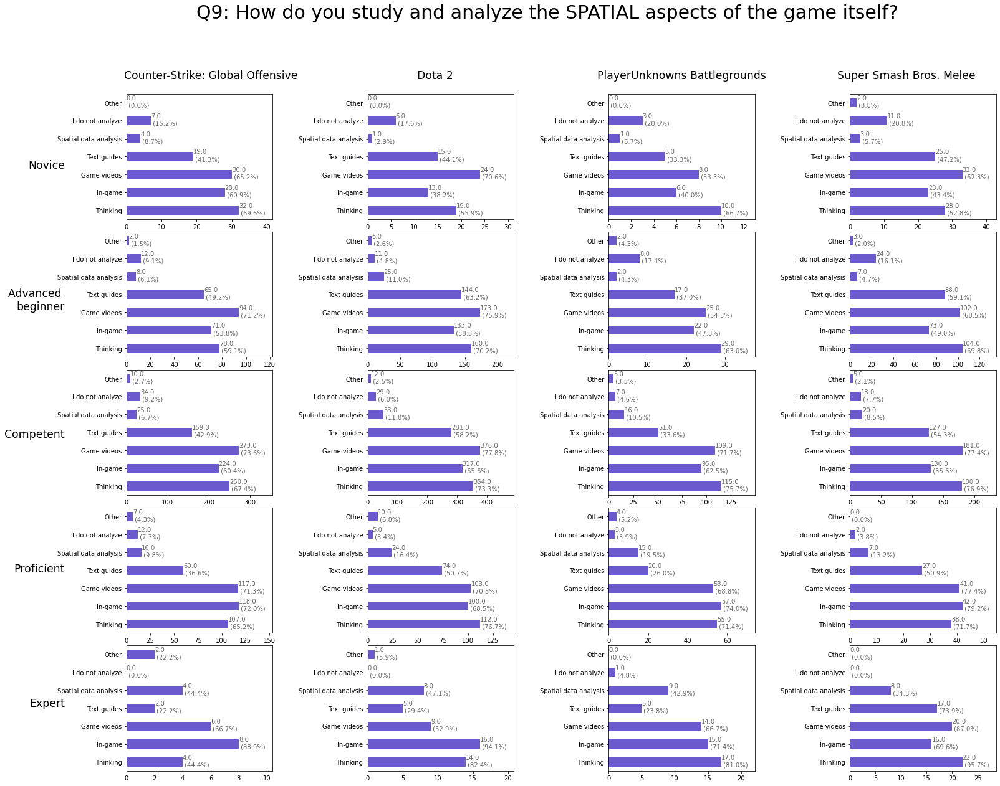

In [681]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)


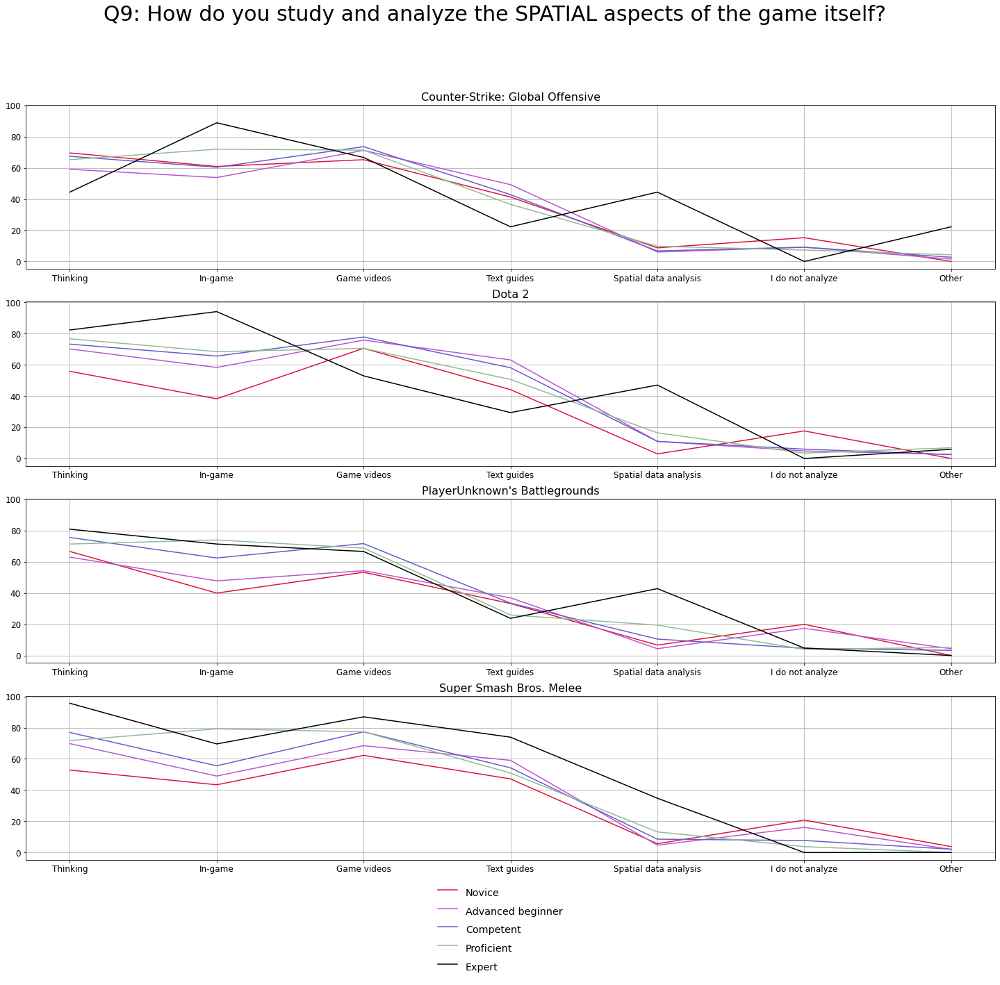

In [682]:
IndividualLines(suptitle,qnum,orderB,qdf)

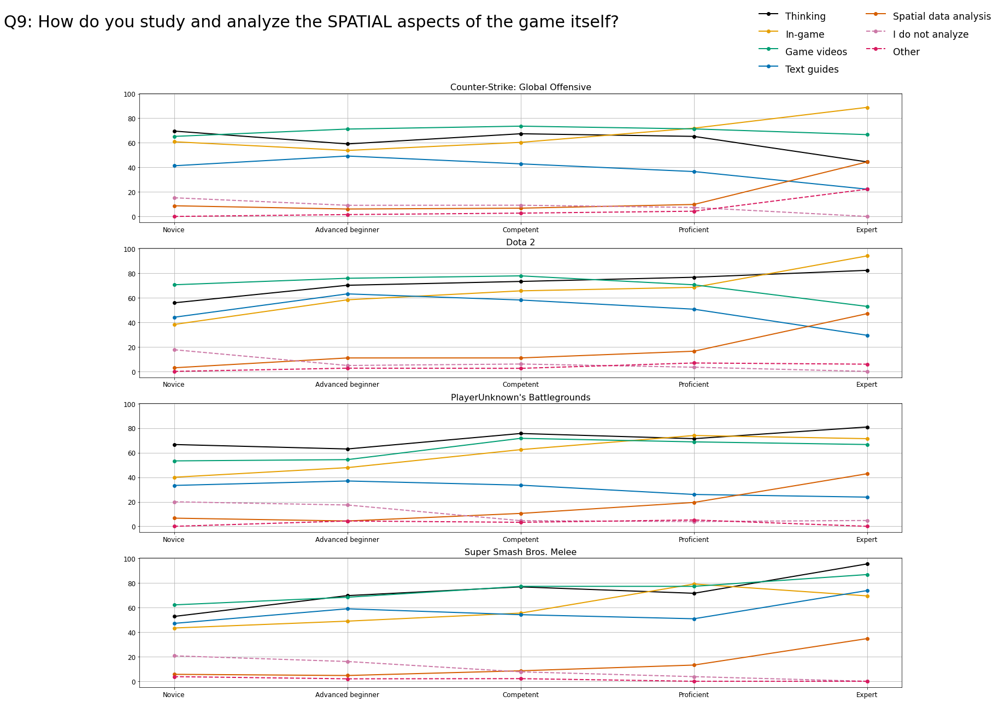

In [683]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

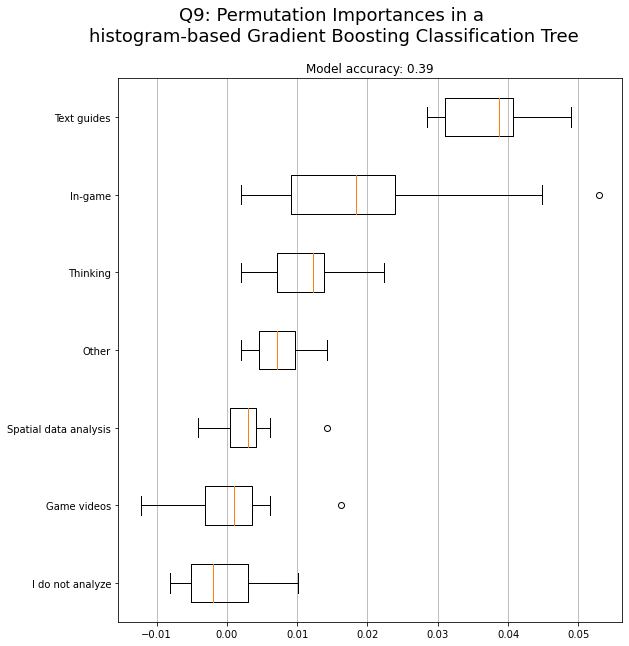

In [684]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':5, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [722]:
q9PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q9PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Novice,Q9,Other,None
1,Counter-Strike: Global Offensive,Expert,Q9,I do not analyze,None
2,Dota 2,Novice,Q9,Other,None
3,Dota 2,Expert,Q9,I do not analyze,None
4,PlayerUnknown's Battlegrounds,Novice,Q9,Other,None
5,PlayerUnknown's Battlegrounds,Expert,Q9,Other,None
6,Super Smash Bros. Melee,Proficient,Q9,Other,None
7,Super Smash Bros. Melee,Expert,Q9,I do not analyze,None
8,Super Smash Bros. Melee,Expert,Q9,Other,None


In [723]:
q9LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList,q9PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['I do not analyze']
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['I do not analyze']
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros. Melee
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and 

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


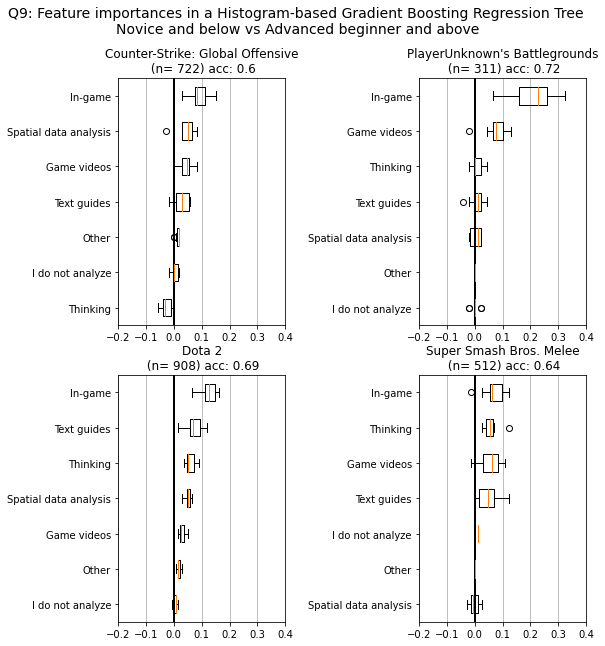

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


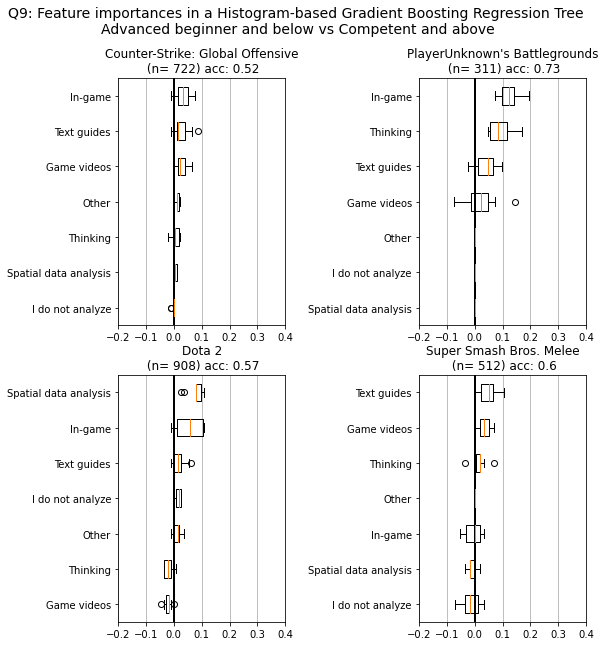

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


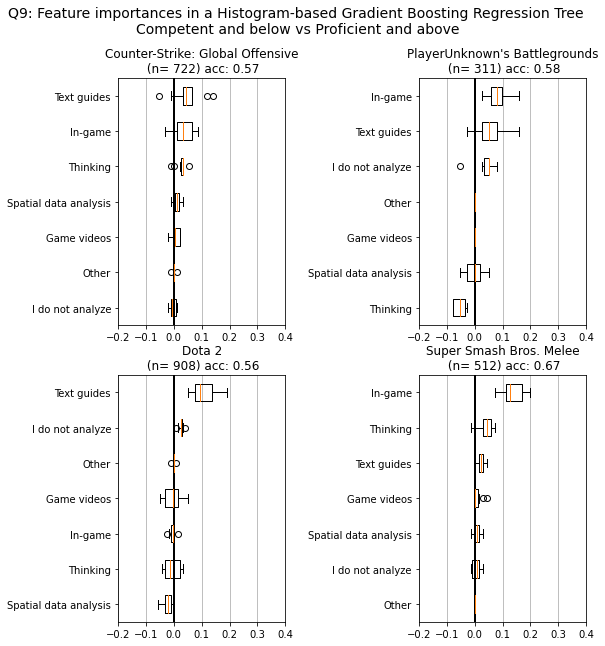

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


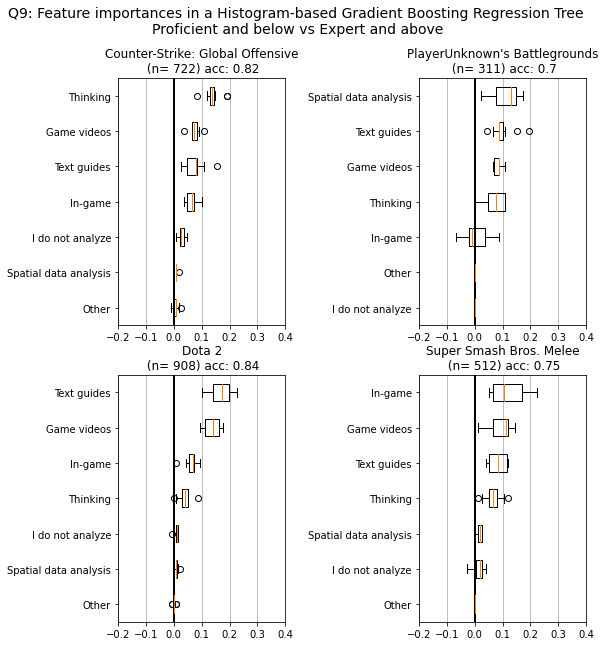

                           0      1      2      3
Thinking               0.000  0.007  0.026  0.141
In-game                0.092  0.035  0.032  0.064
Game videos            0.043  0.025  0.007  0.075
Text guides            0.027  0.026  0.048  0.074
Spatial data analysis  0.046  0.005  0.011  0.010
I do not analyze       0.004  0.000  0.000  0.028
                           0      1      2      3
Thinking               0.059  0.000  0.000  0.040
In-game                0.125  0.055  0.000  0.063
Game videos            0.029  0.000  0.000  0.137
Text guides            0.073  0.017  0.103  0.169
Spatial data analysis  0.050  0.080  0.000  0.009
I do not analyze       0.004  0.015  0.026  0.009
                           0      1      2      3
Thinking               0.009  0.093  0.000  0.072
In-game                0.213  0.124  0.082  0.004
Game videos            0.074  0.024  0.000  0.085
Text guides            0.007  0.041  0.063  0.100
Spatial data analysis  0.004  0.000  0.000  0.111


In [724]:
q9Params = {'l2_regularization':0.2, 'learning_rate':0.4, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':15}
q9importances = getImportances2(qdf, qnum, orderB, q9Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

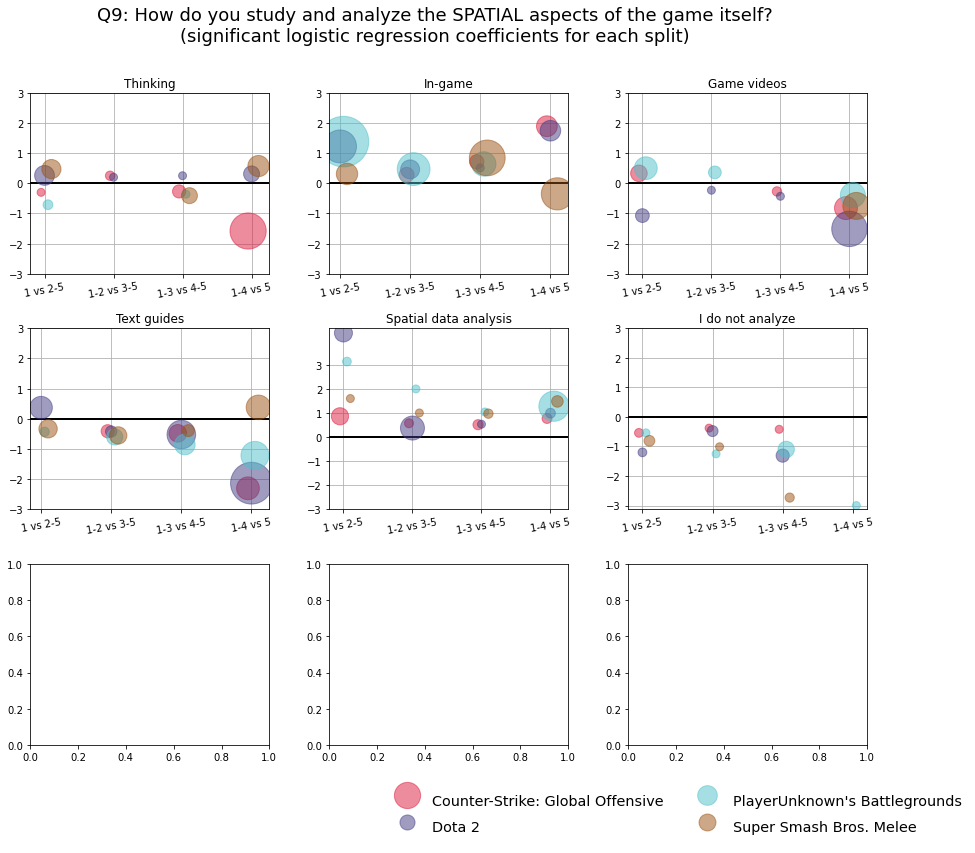

In [725]:
ScatterPlotImportances(suptitle, orderB, qnum, q9LogRegCollection, q9importances,gameList)

<Figure size 432x288 with 0 Axes>

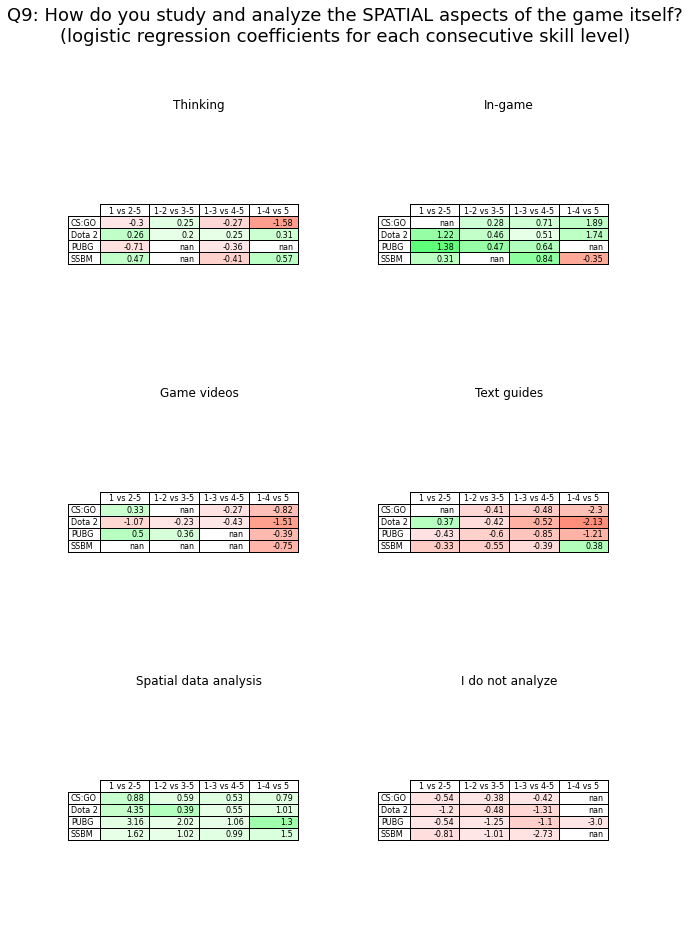

In [726]:
TablePlotImportances(suptitle, orderB, qnum, q9LogRegCollection, q9importances,gameList)

In [1468]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[0]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [1469]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5342465753424658
[[ 0.35500715  0.01986628  0.04792965  0.27591052  0.00179225  0.84553177
  -0.58986906]
 [-0.19966784 -0.58384213 -0.17822175  0.43528666 -0.53739692 -0.52034253
  -0.52421653]
 [ 0.26522241 -0.33849823  0.20485325  0.16266832 -0.46314457  0.10086569
   0.05402982]
 [ 0.11273571  0.33950043 -0.05005226 -0.10123773 -0.15447044  0.00991091
   0.4269496 ]
 [-0.53329744  0.56297365 -0.02450889 -0.77262777  1.15321969 -0.43596584
   0.63310616]]


In [1470]:
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary()) 

Optimization terminated successfully.
         Current function value: 0.648405
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  722
Model:                          Logit   Df Residuals:                      715
Method:                           MLE   Df Model:                            6
Date:                Thu, 11 Feb 2021   Pseudo R-squ.:                 -0.2862
Time:                        15:31:07   Log-Likelihood:                -468.15
converged:                       True   LL-Null:                       -363.97
Covariance Type:            nonrobust   LLR p-value:                     1.000
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Thinking                 -0.2251      0.149     -1.511      0.131      -0.517       0.

In [1471]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[1]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary()) 

Optimization terminated successfully.
         Current function value: 0.635746
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  908
Model:                          Logit   Df Residuals:                      901
Method:                           MLE   Df Model:                            6
Date:                Thu, 11 Feb 2021   Pseudo R-squ.:                 -0.4217
Time:                        15:31:41   Log-Likelihood:                -577.26
converged:                       True   LL-Null:                       -406.03
Covariance Type:            nonrobust   LLR p-value:                     1.000
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Thinking                 -0.1380      0.138     -1.002      0.317      -0.408       0.

In [1472]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[2]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.664880
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  311
Model:                          Logit   Df Residuals:                      304
Method:                           MLE   Df Model:                            6
Date:                Thu, 11 Feb 2021   Pseudo R-squ.:                -0.07201
Time:                        15:32:16   Log-Likelihood:                -206.78
converged:                       True   LL-Null:                       -192.89
Covariance Type:            nonrobust   LLR p-value:                     1.000
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Thinking                 -0.2156      0.218     -0.990      0.322      -0.643       0.

In [1473]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.600461
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  512
Model:                          Logit   Df Residuals:                      505
Method:                           MLE   Df Model:                            6
Date:                Thu, 11 Feb 2021   Pseudo R-squ.:                 -0.4010
Time:                        15:32:34   Log-Likelihood:                -307.44
converged:                       True   LL-Null:                       -219.44
Covariance Type:            nonrobust   LLR p-value:                     1.000
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Thinking                 -0.2176      0.202     -1.076      0.282      -0.614       0.

In [807]:
# Ordinal logistic regression

In [1293]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='probit')

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

Optimization terminated successfully.
         Current function value: 1.288198
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -659.56
Model:                   OrderedModel   AIC:                             1341.
Method:            Maximum Likelihood   BIC:                             1388.
Date:                Tue, 02 Feb 2021                                         
Time:                        10:11:09                                         
No. Observations:                 512                                         
Df Residuals:                     501                                         
Df Model:                          11                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Thinking                        0.1589      0.124      1.285      0.199      -0.083       0.401
In-game                         0.1816      0.107      1.699      0.089      -0.028       0.391
Game videos                     0.0868      0.132      0.658      0.510      -0.172       0.345
Text guides                    -0.1732      0.107     -1.624      0.104      -0.382       0.036
Spatial data analysis           0.5342      0.173      3.089      0.002       0.195       0.873
I do not analyze               -0.4145      0.209     -1.981      0.048      -0.825      -0.004
Other                          -0.3703      0.353     -1.048      0.295      -1.063       0.322
Novice/Advanced beginner       -1.1346      0.172     -6.610      0.000      -1.471      -0.798
Advanced beginner/Competent     0.0314      0.073      0.433      0.665      -0.111       0.173
Competent/Proficient            0.3148      0.055      5.707      0.000       0.207       0.423
Proficient/Expert              -0.3723      0.129     -2.885      0.004      -0.625      -0.119
===============================================================================================
"""

In [1294]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='logit')

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -659.68
Model:                   OrderedModel   AIC:                             1341.
Method:            Maximum Likelihood   BIC:                             1388.
Date:                Tue, 02 Feb 2021                                         
Time:                        10:11:09                                         
No. Observations:                 512                                         
Df Residuals:                     501                                         
Df Model:                          11                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Thinking                        0.2235      0.217      1.029      0.304      -0.202       0.649
In-game                         0.3347      0.187      1.792      0.073      -0.031       0.701
Game videos                     0.1431      0.232      0.617      0.537      -0.312       0.598
Text guides                    -0.3823      0.187     -2.041      0.041      -0.749      -0.015
Spatial data analysis           0.9797      0.320      3.059      0.002       0.352       1.607
I do not analyze               -0.7769      0.361     -2.150      0.032      -1.485      -0.069
Other                          -0.5956      0.591     -1.007      0.314      -1.754       0.563
Novice/Advanced beginner       -2.0407      0.311     -6.555      0.000      -2.651      -1.431
Advanced beginner/Competent     0.5903      0.078      7.611      0.000       0.438       0.742
Competent/Proficient            0.8296      0.059     14.125      0.000       0.714       0.945
Proficient/Expert               0.2977      0.138      2.155      0.031       0.027       0.568
===============================================================================================
"""

In [1295]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

Fraction of correct skill predictions
0.466796875


In [814]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Thinking
Spearmans correlation coefficient: 0.011
Samples are uncorrelated (fail to reject H0) p=0.775
Kendall correlation coefficient: 0.010
Samples are uncorrelated (fail to reject H0) p=0.775
# In-game
Spearmans correlation coefficient: 0.121
*** Samples are correlated (reject H0) p=0.001
Kendall correlation coefficient: 0.113
*** Samples are correlated (reject H0) p=0.001
# Game videos
Spearmans correlation coefficient: 0.014
Samples are uncorrelated (fail to reject H0) p=0.709
Kendall correlation coefficient: 0.013
Samples are uncorrelated (fail to reject H0) p=0.708
# Text guides
Spearmans correlation coefficient: -0.077
*** Samples are correlated (reject H0) p=0.037
Kendall correlation coefficient: -0.072
*** Samples are correlated (reject H0) p=0.038
# Spatial data analysis
Spearmans correlation coefficient: 0.066
Samples are uncorrelated (fail to reject H0) p=0.076
Kendall correl

In [810]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

In [517]:
best9 = best_random
best9

GradientBoostingRegressor(criterion='mae', learning_rate=0.01, max_depth=None,
                          max_features='auto', n_estimators=30,
                          warm_start=True)

In [829]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [853]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.5384615384615384


In [854]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[ 0.04230769  0.04038462  0.02307692  0.04423077 -0.00384615  0.03653846
  0.        ]
[0.01884223 0.01035609 0.05217177 0.02440111 0.00769231 0.01035609
 0.        ]


In [855]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],3)))
    i+=1

Thinking: 0.042
In-game: 0.04
Game videos: 0.023
Text guides: 0.044
Spatial data analysis: -0.004
I do not analyze: 0.037
Other: 0.0


In [856]:
best_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# l2_regularization lambda from gxboost
l2_regularization = [0.2, 0.5, 0.9]

# Try different learning rates
max_iter= [5, 10, 25, 50]

# Maximum number of levels in tree
max_depth = [2,5,10,None]

# Min samples leaf, recommended below 20
min_samples_leaf = [2,5,10,15]

# Find the base model predictions and print the accuracy with train data
best_pred = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(best_pred)

for i in range(10):
    for depth in max_depth:
        j =0
        for reg in l2_regularization:
            for iters in max_iter:
                for min_leaf in min_samples_leaf:
                    test_model = HistGradientBoostingClassifier(min_samples_leaf = min_leaf,max_iter= iters,learning_rate = (0.3*i)+0.05,max_depth = depth, l2_regularization = reg)
                    test_pred = BoostEvaluate(test_model, X_train, y_train,X_test,y_test)
                    if test_pred > best_pred:
                        best_pred = test_pred
                        best_model = test_model
                        print(best_model.score(X_test, y_test))
                        print(best_pred)
                    print("min_leaf: "+ str(min_leaf))
                print("Iters: "+ str(iters) + " (" + str(j)+"/4)")
            j+=1
        print("depth: "+ str(depth))
    print("completion: " + str((i+1)*10)+"%")

0.5384615384615384
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
0.5576923076923077
0.5576923076923077
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
mi

min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_

min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_

min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_

In [857]:
besthist9= best_model

In [858]:
besthist9.score(X_test, y_test)

0.5576923076923077

In [859]:
besthist9

HistGradientBoostingClassifier(l2_regularization=0.2, learning_rate=0.05,
                               max_depth=5, max_iter=10, min_samples_leaf=10)

In [ ]:
q9cs =[l2_regularization=0.2, learning_rate=0.95, max_depth=5, max_iter=10, min_samples_leaf=2]

q9dota = [l2_regularization=0.2, learning_rate=0.95, max_depth=5, max_iter=10, min_samples_leaf=5]

q9pubg = [l2_regularization=0.5, learning_rate=1.25, max_depth=10, max_iter=50, min_samples_leaf=15]

q9Melee = [l2_regularization=0.2, learning_rate=0.05, max_depth=5, max_iter=10, min_samples_leaf=10]
                               


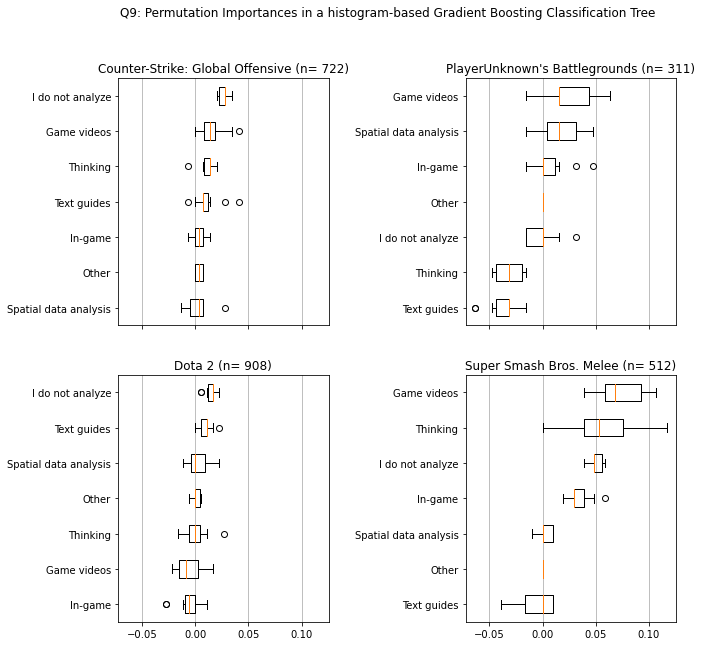

In [1437]:
q9Params = {'l2_regularization':0.3, 'learning_rate':0.8, 'max_depth':5, 'max_iter':10, 'min_samples_leaf':10}
PermutationImportancesPlot(qdf,qnum,q9Params,gameList,skillList)

In [213]:
def LogRegCoeffOne(testDf, orderB, skillList):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)])

    for i in range(4):
        print("Skill levels: "+ str(skillList[i]) + " and " +str(skillList[i+1]))

        for iterator in range(10):
            notBest = True
            regDf = pd.DataFrame()
            regDf['skill']=testDf['skill'].copy()
            for item in range(len(orderB)):
                regDf[orderB[item]] = testDf[orderB[item]]

            regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
            regDf['skill']=regDf['skill']-i


            while(notBest):
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                # Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()
                
                
                #break
                try:
                    # building the model and fitting the data 
                    log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0)
                except:
                    continue
                
                results_summary = log_reg.summary()

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                if (resultDf['P>|z|'].max() >= 0.05):
                    regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                else:        
                    notBest=False

                if(len(regDf.columns)<=1):
                    notBest = False
                    results_summary = "EVERYTHING IS BAD"
                #print(results_summary)

            # Check if the iterative optimization resulted only in poor results, then don't add the results to the coefficient dfs
            if ((len(resultDf)<=1) & (resultDf['P>|z|'][0]>0.05)):
                continue
            for index, row in resultDf.iterrows():
                q8RegDf.at[index, i] += row['coef']
                averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [681]:
def LogRegCoeffOne2(testDf, orderB, skillList):
    q8RegDf = pd.DataFrame(0.0,columns= [0,1,2,3], index=orderB[:len(orderB)])
    averagerDf = pd.DataFrame(0.0,columns= [0,1,2,3],index=orderB[:len(orderB)])

    for i in range(4):
        print("Skill levels: "+ str(skillList[i]) + " and " +str(skillList[i+1]))

        for iterator in range(10):
            notBest = True
            regDf = pd.DataFrame()
            regDf['skill']=testDf['skill'].copy()
            for item in range(len(orderB)):
                regDf[orderB[item]] = testDf[orderB[item]]
            
            # Divide skill class into two, normalize to 0 and 1 so it fits binary logistic regression assumption
            regDf.loc[regDf['skill'] <= i, 'skill'] = 0
            regDf.loc[regDf['skill'] > i, 'skill'] = 1
            
            while(notBest):
                # Read dataframe for another iteration
                Xfirst = regDf.astype(int)
                yfirst = regDf['skill'].astype(int)

                # Transform the dataset using over- and undersampling
                X, y = OverUnderSample(Xfirst, yfirst)

                # defining the dependent and independent variables 
                Xtrain = X.drop('skill',axis=1).copy().astype(int)
                ytrain = X['skill'].copy()
                
                
                #break
                #try:
                    # building the model and fitting the data 
                    #log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0)
                #except:
                    #continue
                    
                # building the model and fitting the data 
                log_reg = sm.Logit(ytrain, Xtrain).fit(disp=0, method='bfgs', maxiter = 200)
                
                results_summary = log_reg.summary()

                # Note that tables is a list. The table at index 1 is the "core" table. Additionally, read_html puts dfs in a list, so we want index 0
                results_as_html = results_summary.tables[1].as_html()
                resultDf = pd.read_html(results_as_html, header=0, index_col=0)[0]

                # Check if df contains a variable with p > alpha, drop the column
                # If not, there are only statistifically significant columns left and iteration can be stopped
                #if (resultDf['P>|z|'].max() >= 0.05):
                    #regDf = regDf.drop(resultDf['P>|z|'].idxmax(),axis=1)
                #else:        
                notBest=False

                #if(len(regDf.columns)<=1):
                    #notBest = False
                    #results_summary = "EVERYTHING IS BAD"
                #print(results_summary)

            for index, row in resultDf.iterrows():
                if row['P>|z|']<=0.1:
                    q8RegDf.at[index, i] += row['coef']
                    averagerDf.at[index, i] += 1
    
    return round(q8RegDf / averagerDf,2)

In [706]:
def LogRegCollectionOne2(qdf,orderB,skillList,gameList):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffOne(inpDf, orderB, skillList)

    for game in gameList:
        print(game)
        print(q8Collection[game])
    
    return q8Collection

In [707]:
def LogRegCollectionOne(qdf,orderB,skillList,gameList):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i

    q8Collection = {}
    for game in gameList:
        print(game)
        inpDf= testDf.loc[qdf['Q1']==game]
        q8Collection[game] = LogRegCoeffOne2(inpDf, orderB, skillList)

    for game in gameList:
        print(game)
        print(q8Collection[game])
    
    return q8Collection

In [650]:
def FeatureImportancesPlot_balanceOne(qdf, qnum, orderB, modelParams, gameList, skillList,skillPair, iterations):
    best_model = RandomForestClassifier(n_estimators=100,random_state = 2)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle(qnum + ": Feature importances in a Random Forest Classifier")
    #csImps = pd.DataFrame(0.0,columns = orderB,index=[0])
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [skillPair],index=orderB)
    
    for j in range(4):    
        regDf= qdf.loc[qdf['Q1']==gameList[j]]
        
        Xfirst = regDf.drop('Q1',axis=1).astype(int)
        yfirst = regDf['skill'].astype(int)

        # summarize class distribution
        counter = Counter(yfirst)
        print("Skill 0 first: "+ str(counter))
        print("Ratio: " + str(counter[0]/counter[1]))
        
        if (counter[0]<counter[1]):
            ratio = counter[0] / counter[1]
        else:
            ratio = counter[1] / counter[0]
        print("Ratio first: " + str(ratio))
        ratio = round(ratio + ((1-ratio)*0.75),2)
        print("Ratio after: "+ str(ratio))
        ratio2 = ratio + (1-ratio)*0.9

        # define pipeline
        over = SMOTE(sampling_strategy=ratio)
        under = RandomUnderSampler(sampling_strategy=ratio2)
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)

        # transform the dataset
        X, y = pipeline.fit_resample(Xfirst, yfirst)

        # summarize the new class distribution
        counter = Counter(y)
        print("Skill 0 after: "+ str(counter))
        
        for itcount in range(iterations):
            # Create a split of the data
            X_train, X_test, y_train, y_test = train_test_split(X.drop(['skill'],axis=1).astype(int), X['skill'].astype(int), 
                                                                train_size=0.9, test_size=0.1, random_state=8)

            best_model.fit(X_train, y_train)
            result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
            sorted_idx = result.importances_mean.argsort()

            # Save results into a dataframe for returning it
            gameDf = pd.DataFrame(0.0,columns = [skillPair],index=orderB[:len(orderB)])
            varIndex = 0
            for index, row in gameDf.iterrows():
                if (result.importances_mean[varIndex]>0):
                    gameDf.at[index,skillPair]= round(result.importances_mean[varIndex],3)
                else: 
                    gameDf.at[index,skillPair]= 0.0
                varIndex+=1
            importancesCollection[gameList[j]]+= gameDf
        
        importancesCollection[gameList[j]] /= iterations
        
        # Plot one
        
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        
        thisAx.set_title(gameList[j] + " (n= " + str(len(testDf))+") acc: " + str(round(best_model.score(X_test,y_test),2)))
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.set_xticks([-0.2,-0.1,0,0.1,0.2,0.3,0.4])
        
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 2
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        

    #fig.tight_layout()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    plt.show()
    
    return importancesCollection


In [700]:
def FeatureImportancesPlot_balanceOne2(qdf, qnum, orderB, modelParams, gameList, skillList,skillPair, iterations):
    #best_model = RandomForestClassifier(n_estimators=100,random_state = 2)
    best_model = HistGradientBoostingClassifier(**modelParams)
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    fig.suptitle(qnum + ": Feature importances in a Random Forest Classifier")
    #csImps = pd.DataFrame(0.0,columns = orderB,index=[0])
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [skillPair],index=orderB)
    
    for j in range(4):    
        regDf= qdf.loc[qdf['Q1']==gameList[j]]
        
        Xfirst = regDf.drop('Q1',axis=1).astype(int)
        yfirst = regDf['skill'].astype(int)

        # summarize class distribution
        counter = Counter(yfirst)
        print("Skill 0 first: "+ str(counter))
        print("Ratio: " + str(counter[0]/counter[1]))
        
        if (counter[0]<counter[1]):
            ratio = counter[0] / counter[1]
        else:
            ratio = counter[1] / counter[0]
        print("Ratio first: " + str(ratio))
        ratio = round(ratio + ((1-ratio)*0.75),2)
        print("Ratio after: "+ str(ratio))
        ratio2 = ratio + (1-ratio)*0.9

        # define pipeline
        over = SMOTE(sampling_strategy=ratio)
        under = RandomUnderSampler(sampling_strategy=ratio2)
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)

        # transform the dataset
        X, y = pipeline.fit_resample(Xfirst, yfirst)

        # summarize the new class distribution
        counter = Counter(y)
        print("Skill 0 after: "+ str(counter))
        
        for itcount in range(iterations):
            # Create a split of the data
            X_train, X_test, y_train, y_test = train_test_split(X.drop(['skill'],axis=1).astype(int), X['skill'].astype(int), 
                                                                train_size=0.9, test_size=0.1, random_state=8)

            best_model.fit(X_train, y_train)
            result = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=35, n_jobs=-1)
            sorted_idx = result.importances_mean.argsort()

            # Save results into a dataframe for returning it
            gameDf = pd.DataFrame(0.0,columns = [skillPair],index=orderB[:len(orderB)])
            varIndex = 0
            for index, row in gameDf.iterrows():
                if (result.importances_mean[varIndex]>0):
                    gameDf.at[index,skillPair]= round(result.importances_mean[varIndex],3)
                else: 
                    gameDf.at[index,skillPair]= 0.0
                varIndex+=1
            importancesCollection[gameList[j]]+= gameDf
        
        importancesCollection[gameList[j]] /= iterations
        
        # Plot one
        
        thisAx = axs[j%2, round(j/3)]
        thisAx.boxplot(result.importances[sorted_idx].T,
                    vert=False, labels=np.array(X_train.columns)[sorted_idx])
        
        thisAx.set_title(gameList[j] + " (n= " + str(len(qdf.loc[qdf['Q1']==gameList[j]]))+") acc: " + str(round(best_model.score(X_test,y_test),2)))
        thisAx.grid( 'on', axis='x' )
        thisAx.grid( 'on', axis='x', which='minor' )
        thisAx.set_xticks([-0.2,-0.1,0,0.1,0.2,0.3,0.4])
        
        gridlines = thisAx.xaxis.get_gridlines()
        ind = 2
        gridlines[ind].set_color("k")
        gridlines[ind].set_linewidth(2)
        

    #fig.tight_layout()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.65, hspace=0.2)
    plt.show()
    
    return importancesCollection


In [693]:
def getImportancesOne(qdf, qnum, orderB, q8Params, gameList, skillList, iterations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i
    
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [0],index=orderB[:len(orderB)-1])
        
    for i in range(4):
        regDf = pd.DataFrame()
        regDf['skill']=testDf['skill'].copy()
        regDf['Q1']=testDf['Q1'].copy()

        for item in orderB:
            regDf[item] = testDf[item]

        regDf.loc[(regDf['skill']<=i,'skill')]=0
        regDf.loc[(regDf['skill']!=0,'skill')]=1
        

        # building the model and fitting the data 
        #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
        #regressor.fit(Xtrain,ytrain)


        #FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)
        oneCollection = FeatureImportancesPlot_balanceOne2(regDf, qnum, orderB, q8Params,gameList,skillList,i,iterations)
        for game in gameList:
            importancesCollection[game][i]= oneCollection[game][i]
        
    
    for game in gameList:
        print(importancesCollection[game])
            
    return importancesCollection


In [691]:
def getImportancesOneorig(qdf, qnum, orderB, q8Params, gameList, skillList, iterations):
    testDf = qdf.copy()
    testDf['skill'] = 0
    for index, row in testDf.iterrows():
        for i in range(5):
            if row['Q5']==skillList[i]:
                testDf.at[index,'skill']=i
    
    importancesCollection = {}
    for game in gameList:
        importancesCollection[game] = pd.DataFrame(0.0,columns = [0],index=orderB[:len(orderB)-1])
        
    for i in range(4):
        regDf = pd.DataFrame()
        regDf['skill']=testDf['skill'].copy()
        regDf['Q1']=testDf['Q1'].copy()

        for item in orderB:
            regDf[item] = testDf[item]

        regDf = regDf.loc[(regDf['skill']>=i)&(regDf['skill']<=i+1)]
        regDf['skill']=regDf['skill']-i

        # building the model and fitting the data 
        #regressor = GradientBoostingRegressor(criterion='mse', learning_rate=0.01, loss='huber', max_depth=70, max_features='log2', n_estimators=40)
        #regressor.fit(Xtrain,ytrain)


        #FeatureImportancesPlot(regDf,qnum,q8Params,gameList,skillList)
        oneCollection = FeatureImportancesPlot_balanceOne(regDf, qnum, orderB, q8Params,gameList,skillList,i,iterations)
        for game in gameList:
            importancesCollection[game][i]= oneCollection[game][i]
        
    
    for game in gameList:
        print(importancesCollection[game])
            
    return importancesCollection


## Question 10: How systematic is the analysis of spatial aspects of your gameplay?
* Rank-sum
* n1: there is a correlation for values
* n0: there is no correlation for values
* In statistics, the Mann–Whitney U test (also called the Mann–Whitney–Wilcoxon (MWW), Wilcoxon rank-sum test, or Wilcoxon–Mann–Whitney test) is a nonparametric test of the null hypothesis that, for randomly selected values X and Y from two populations, the probability of X being greater than Y is equal to the probability of Y being greater than X.

Kruskal-Wallis test: 
* The Kruskal-Wallis H-test tests the null hypothesis that the population median of all of the groups are equal. It is a non-parametric version of ANOVA. The test works on 2 or more independent samples, which may have different sizes. Note that rejecting the null hypothesis does not indicate which of the groups differs. Post hoc comparisons between groups are required to determine which groups are different.

A similar nonparametric test used on dependent samples is the Wilcoxon signed-rank test.
* The Wilcoxon signed-rank test is a non-parametric statistical hypothesis test used to compare two related samples, matched samples, or repeated measurements on a single sample to assess whether their population mean ranks differ (i.e. it is a paired difference test).
* https://en.wikipedia.org/wiki/Wilcoxon_signed-rank_test
* Spearman and Kendall correlation between skill level (q5) and frequency of analysis (q10)

In [102]:
qnum = 'Q10'
suptitle = "Q10: How often do you analyze the spatial aspects of your gameplay?"

orderA = ["I never do analysis","I almost never do analysis","I do analysis in specific occasions","I do analysis often","I do analysis regularly and systematically"]
orderB = ["Never", "Almost never", "Specific occasions", "Often", "Systematically"]
qdf = SetupDf(df,qnum,orderA,orderB)
countsB=MakeCountsB(qdf, orderB)

In [104]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

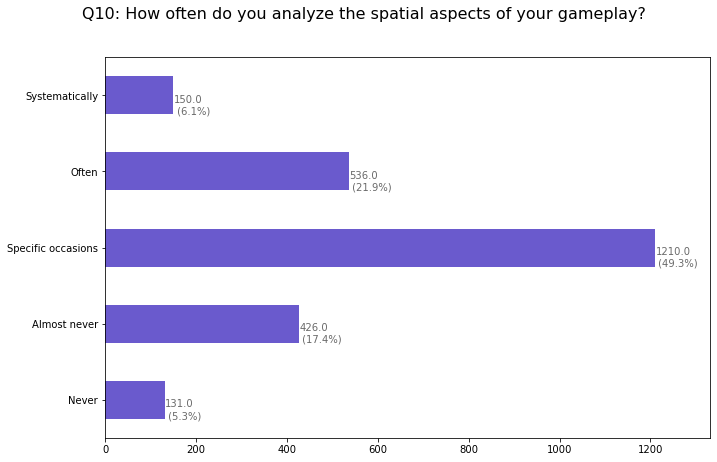

In [689]:
PlotBars(qdf,qnum,suptitle,countsB)

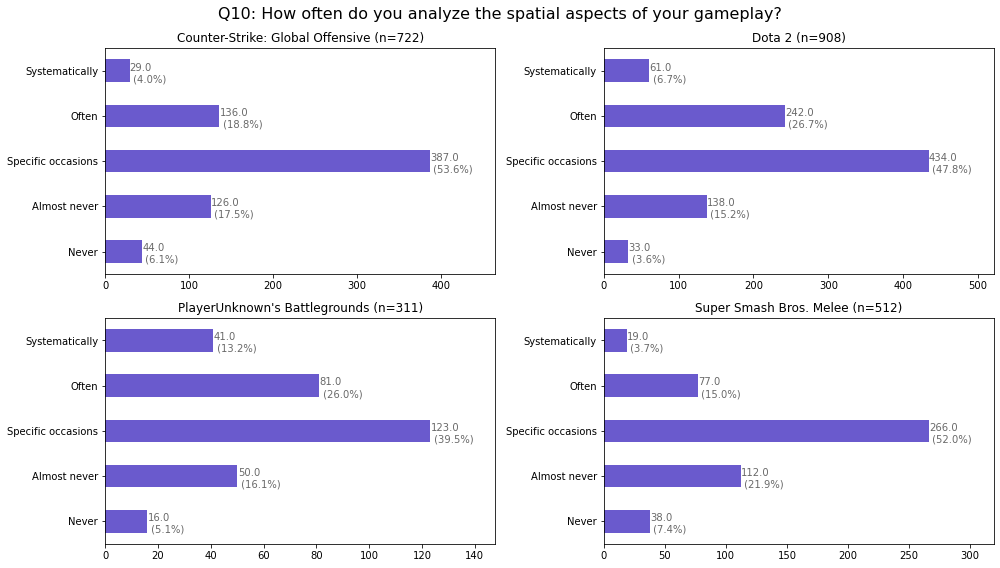

In [690]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

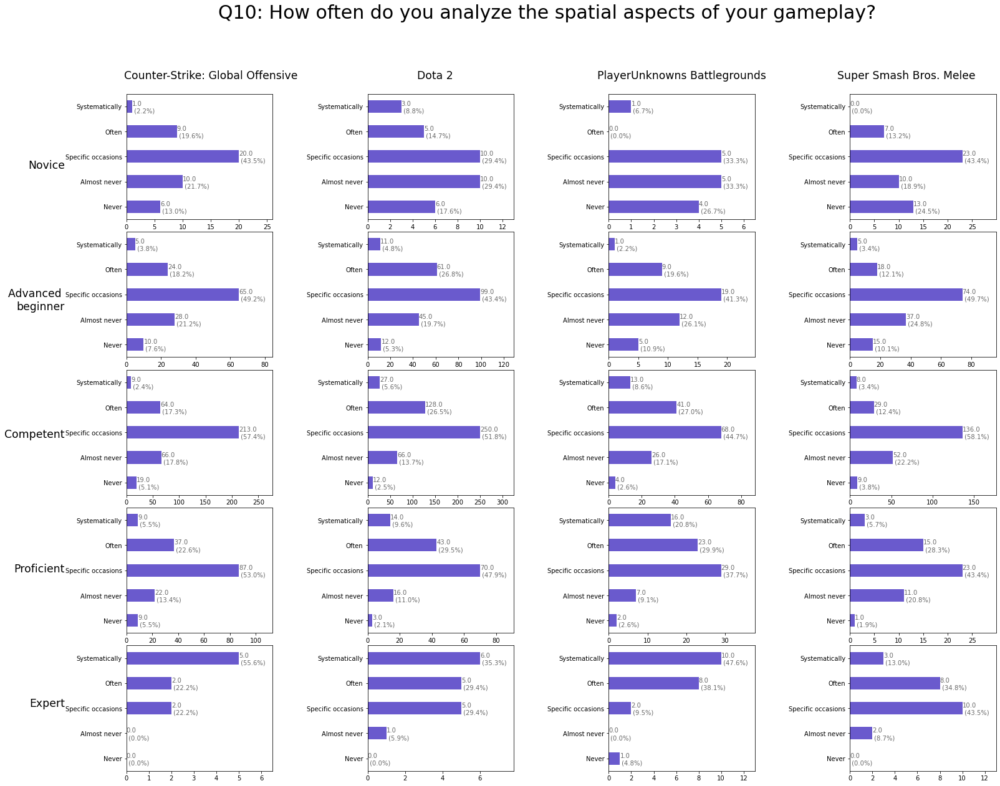

In [691]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

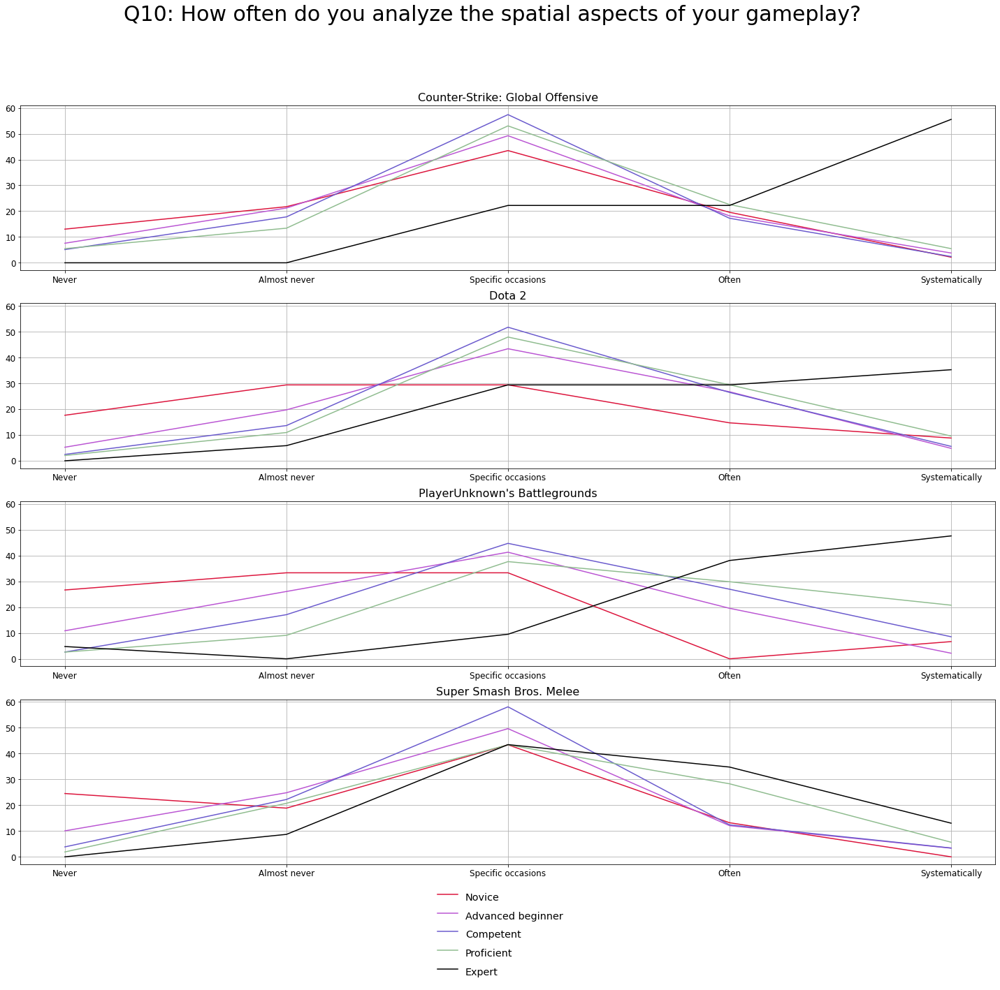

In [692]:
IndividualLines(suptitle,qnum,orderB,qdf)

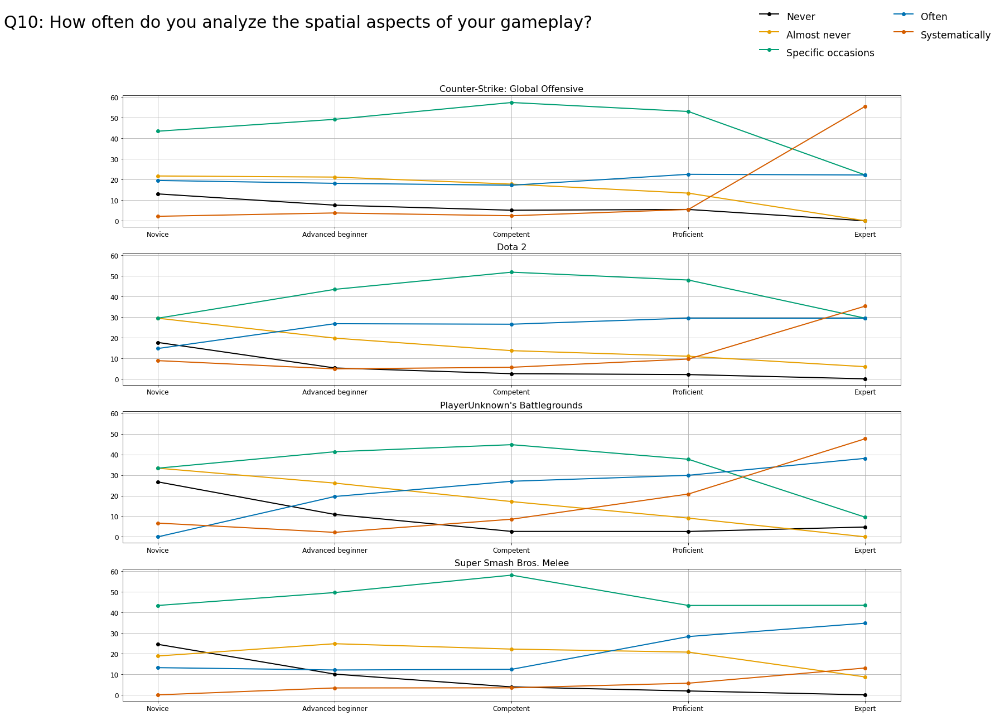

In [693]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

In [694]:
qdf

,Q10,Q5,Q1,Never,Almost never,Specific occasions,Often,Systematically
0,Specific occasions,Novice,Counter-Strike: Global Offensive,0.0,0.0,1.0,0.0,0.0
1,Often,Advanced beginner,Counter-Strike: Global Offensive,0.0,0.0,0.0,1.0,0.0
2,Specific occasions,Advanced beginner,Counter-Strike: Global Offensive,0.0,0.0,1.0,0.0,0.0
3,Almost never,Advanced beginner,Counter-Strike: Global Offensive,0.0,1.0,0.0,0.0,0.0
4,Specific occasions,Advanced beginner,Counter-Strike: Global Offensive,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2468,Specific occasions,Proficient,Super Smash Bros. Melee,0.0,0.0,1.0,0.0,0.0
2469,Often,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,1.0,0.0
2470,Systematically,Proficient,Super Smash Bros. Melee,0.0,0.0,0.0,0.0,1.0
2471,Specific occasions,Proficient,Super Smash Bros. Melee,0.0,0.0,1.0,0.0,0.0


In [644]:
q10df = pd.DataFrame()
q10df['Q10'] = df['Q10'].copy()
q10df['Q5'] = df['Q5'].copy()
q10df['Q1'] = df['Q1']
q10df['Q10'].unique().tolist()


['I do analysis in specific occasions',
 'I do analysis often',
 'I almost never do analysis',
 'I never do analysis',
 'I do analysis regularly and systematically']

In [645]:
def Q10AnswersToCodes(row):
    if row['Q10'] == "I never do analysis":
        return 0
    elif row['Q10'] == "I almost never do analysis":
        return 1
    elif row['Q10'] == "I do analysis in specific occasions":
        return 2
    elif row['Q10'] == "I do analysis often":
        return 3
    else:
        return 4
    

In [646]:
q10df['Q10Code'] = q10df.apply(lambda row: Q10AnswersToCodes(row), axis=1)
q10df['Q5Code'] = q10df.apply(lambda row: Q5AnswersToCodes(row), axis=1)
q10df

,Q10,Q5,Q1,Q10Code,Q5Code
0,I do analysis in specific occasions,Novice,Counter-Strike: Global Offensive,2,0
1,I do analysis often,Advanced beginner,Counter-Strike: Global Offensive,3,1
2,I do analysis in specific occasions,Advanced beginner,Counter-Strike: Global Offensive,2,1
3,I almost never do analysis,Advanced beginner,Counter-Strike: Global Offensive,1,1
4,I do analysis in specific occasions,Advanced beginner,Counter-Strike: Global Offensive,2,1
...,...,...,...,...,...
2468,I do analysis in specific occasions,Proficient,Super Smash Bros. Melee,2,3
2469,I do analysis often,Proficient,Super Smash Bros. Melee,3,3
2470,I do analysis regularly and systematically,Proficient,Super Smash Bros. Melee,4,3
2471,I do analysis in specific occasions,Proficient,Super Smash Bros. Melee,2,3


In [708]:
q10LogRegCollection=LogRegCollectionOne(q10df,['Q10Code'],skillList,gameList)

Counter-Strike: Global Offensive
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Dota 2
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
PlayerUnknown's Battlegrounds
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Super Smash Bros. Melee
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Counter-Strike: Global Offensive
            0   1     2     3
Q10Code  0.06 NaN  0.05  0.16
Dota 2
            0     1     2     3
Q10Code  0.13  0.04  0.04  0.09
PlayerUnknown's Battlegrounds
            0     1    2     3
Q10Code  0.34  0.16  0.1 

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


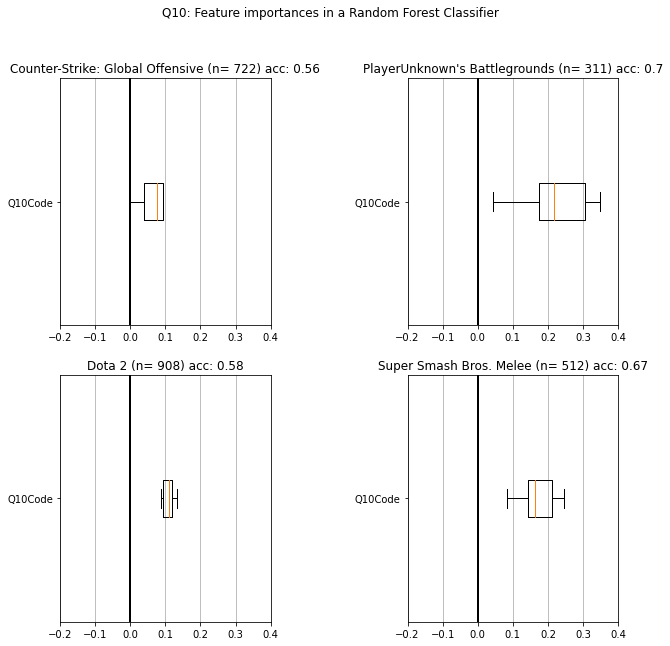

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


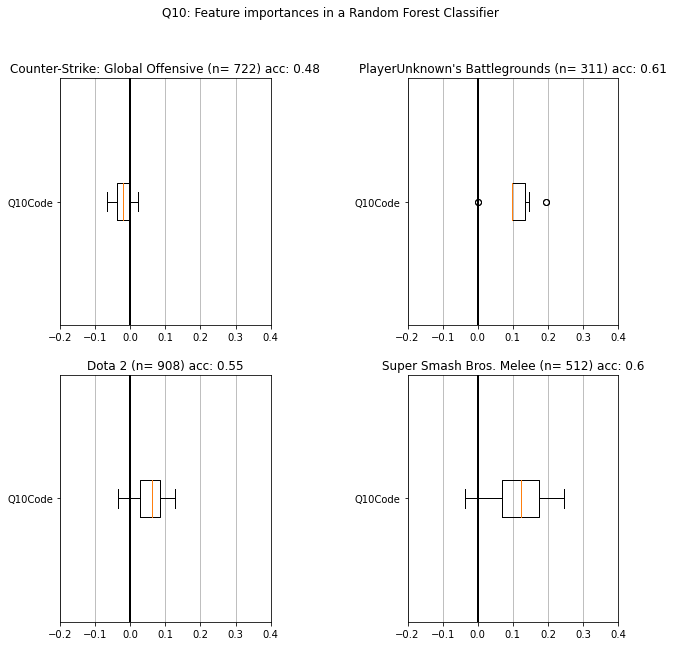

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


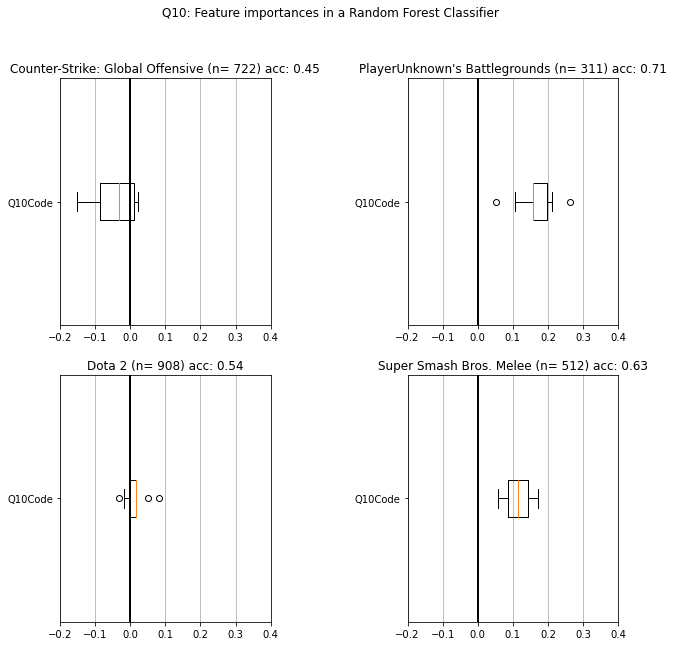

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


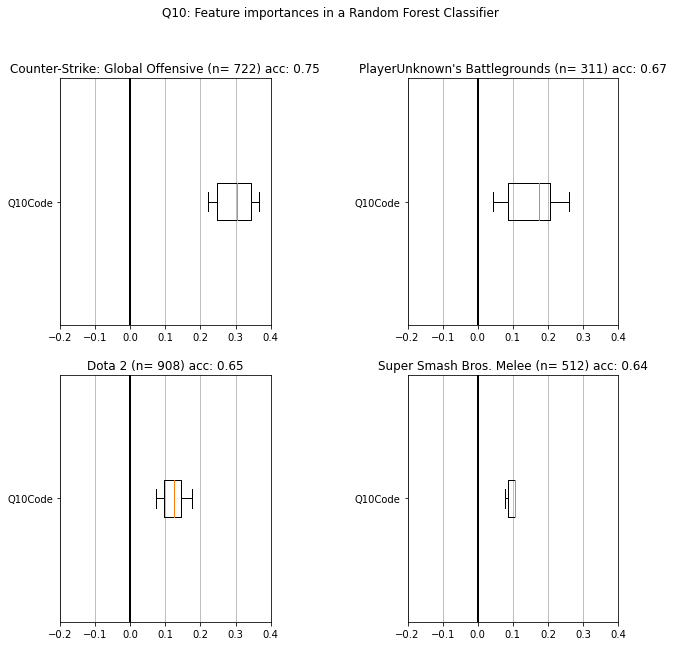

             0    1    2      3
Q10Code  0.064  0.0  0.0  0.295
            0      1      2      3
Q10Code  0.11  0.052  0.015  0.122
             0      1      2      3
Q10Code  0.222  0.102  0.163  0.152
             0      1      2      3
Q10Code  0.175  0.116  0.114  0.097


In [701]:
q10Params = {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':5}
q10importances= getImportancesOne(q10df, qnum, ['Q10Code'], q10Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

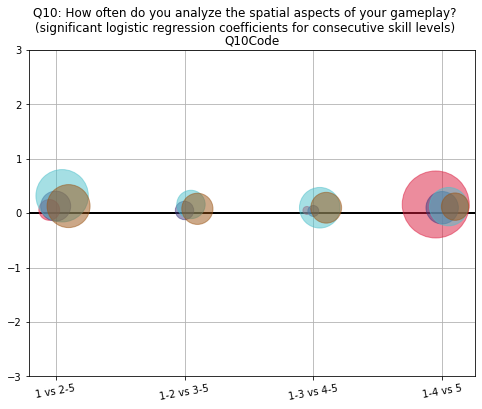

In [702]:
ScatterPlotImportancesOne(suptitle, ['Q10Code'],qnum, q10LogRegCollection, q10importances, gameList)

<Figure size 432x288 with 0 Axes>

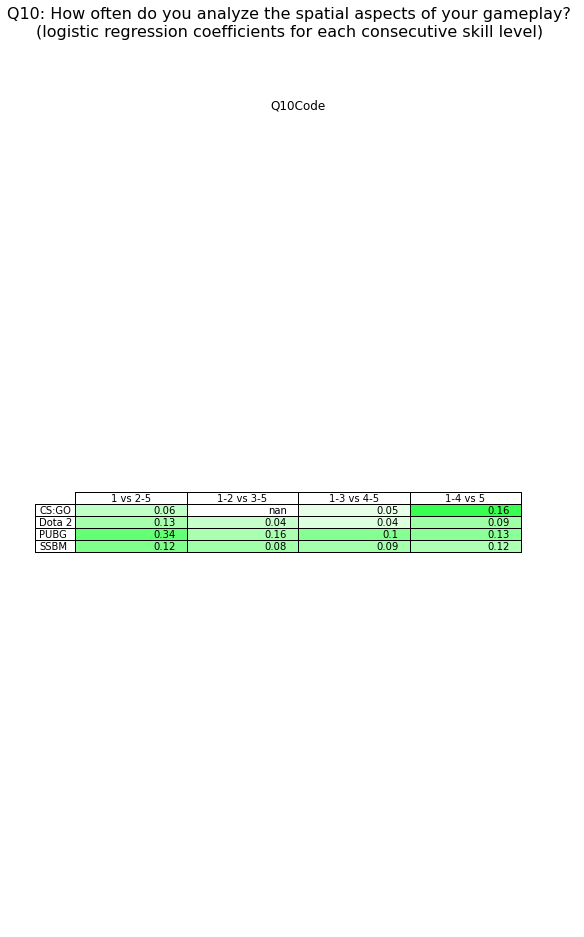

In [720]:
TablePlotImportancesOne(suptitle, ['Q10Code'],qnum, q10LogRegCollection, q10importances,gameList)

In [653]:
from scipy import stats
from scipy.stats import wilcoxon
from scipy.stats import mannwhitneyu

def NonParametricStats(df, skill, target):
    for i in range(5):    
        rankmean = df.loc[df[skill]==i][target].mean()
        rankmedian = df.loc[df[skill]==i][target].median()
        print("Rank " + str(i) + " mean: " + str(round(rankmean,2)) + " median: " + str(rankmedian))
    
    stat, p = stats.kruskal(df[skill], df[target])
    print("Kruskal Statistic: " + str(stat) + " p: " + str(p))
    alpha = 0.05
    if p > alpha:
        print('Kruskal failure p=%.3f' % p)
    else:
        print('*** Kruskal success (reject H0) p=%.3f' % p)

    stat, p = wilcoxon(df[skill], df[target])
    print("Wilcoxon Statistic: " + str(stat) + " p: " + str(p))
    if p > alpha:
        print('Wilcoxon failure p=%.3f' % p)
    else:
        print('*** Wilcoxon success (reject H0) p=%.3f' % p)
        
    stat, p = mannwhitneyu(df[skill], df[target])
    print("Mann-Whitney U Statistic: " + str(stat) + " p: " + str(p))
    if p > alpha:
        print('Mann-Whitney U failure p=%.3f' % p)
    else:
        print('*** Mann-Whitney U success (reject H0) p=%.3f' % p)

In [654]:
def NonParametricStatsCross(df, skill, target):
    for i in range(5):    
        rankmean = df.loc[df[skill]==i][target].mean()
        rankmedian = df.loc[df[skill]==i][target].median()
        print("Rank " + str(i) + " mean: " + str(round(rankmean,2)) + " median: " + str(rankmedian))
    
    for i in range(5):
        for j in range(5):
            if j <= i:
                pass
            else:
                skillA = df.loc[df[skill]==i][target]
                skillB = df.loc[df[skill]==j][target]
                stat, p = stats.kruskal(skillA, skillB)
                print("Kruskal, skills: " + str(i) + "/" + str(j) + ". Stat: " + str(stat) + " p: " + str(p))
                alpha = 0.05
                if p > alpha:
                    print('Kruskal failure p=%.3f' % p)
                else:
                    print('*** Kruskal success (reject H0) p=%.3f' % p)
                
                # Wilcoxon can't be done, samples must have same length
        
                stat, p = mannwhitneyu(skillA, skillB)
                print("Mann-Whitney U Statistic: " + str(stat) + " p: " + str(p))
                if p > alpha:
                    print('Mann-Whitney U failure p=%.3f' % p)
                else:
                    print('*** Mann-Whitney U success (reject H0) p=%.3f' % p)

In [655]:
from scipy.stats import wilcoxon
# Wilcoxon rank-sum test
# Also for bigger datasets, but too strong?

wilcoxon(q10df['Q5Code'], q10df['Q10Code'])

WilcoxonResult(statistic=438485.0, pvalue=5.1426194308771043e-14)

In [656]:
from scipy.stats import mannwhitneyu
# Mann-Whitney U test
# Only for smaller datasets?
mannwhitneyu(q10df['Q5Code'], q10df['Q10Code'])

MannwhitneyuResult(statistic=2703354.0, pvalue=1.585367338120839e-11)

In [657]:
skill, target = 'Q5Code','Q10Code'
NonParametricStats(q10df,skill, target)

Rank 0 mean: 1.58 median: 2.0
Rank 1 mean: 1.91 median: 2.0
Rank 2 mean: 2.06 median: 2.0
Rank 3 mean: 2.26 median: 2.0
Rank 4 mean: 2.94 median: 3.0
Kruskal Statistic: 44.06870200604618 p: 3.170500826212049e-11
*** Kruskal success (reject H0) p=0.000
Wilcoxon Statistic: 438485.0 p: 5.1426194308771043e-14
*** Wilcoxon success (reject H0) p=0.000
Mann-Whitney U Statistic: 2703354.0 p: 1.585367338120839e-11
*** Mann-Whitney U success (reject H0) p=0.000


In [658]:
NonParametricStatsCross(q10df, skill, target)

Rank 0 mean: 1.58 median: 2.0
Rank 1 mean: 1.91 median: 2.0
Rank 2 mean: 2.06 median: 2.0
Rank 3 mean: 2.26 median: 2.0
Rank 4 mean: 2.94 median: 3.0
Kruskal, skills: 0/1. Stat: 11.919385922671221 p: 0.0005555279002571792
*** Kruskal success (reject H0) p=0.001
Mann-Whitney U Statistic: 33916.0 p: 0.0002780124792088745
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 0/2. Stat: 31.309693106531157 p: 2.1997859273677048e-08
*** Kruskal success (reject H0) p=0.000
Mann-Whitney U Statistic: 68077.5 p: 1.1006422054937573e-08
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 0/3. Stat: 46.11834945228805 p: 1.1132093771091648e-11
*** Kruskal success (reject H0) p=0.000
Mann-Whitney U Statistic: 21115.5 p: 5.577506905509382e-12
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 0/4. Stat: 60.715247609402084 p: 6.595728285061598e-15
*** Kruskal success (reject H0) p=0.000
Mann-Whitney U Statistic: 1899.5 p: 3.329013660535969e-15
*** Mann-Whitney U succe

In [659]:
NonParametricCorrelations(q10df[skill], q10df[target])

Spearmans correlation coefficient: 0.196
*** Samples are correlated (reject H0) p=0.000
Kendall correlation coefficient: 0.171
*** Samples are correlated (reject H0) p=0.000


In [122]:
for game in gameList:
    print(game)
    print("")
    NonParametricStats(q10df.loc[q10df['Q1']==game],skill,target)
    
    print("")
    NonParametricCorrelations(q10df.loc[q10df['Q1']==game][skill],q10df.loc[q10df['Q1']==game][target])
    
    print("")

Counter-Strike: Global Offensive

Rank 0 mean: 1.76 median: 2.0
Rank 1 mean: 1.89 median: 2.0
Rank 2 mean: 1.94 median: 2.0
Rank 3 mean: 2.09 median: 2.0
Rank 4 mean: 3.33 median: 4.0
Kruskal Statistic: 0.06005940025739487 p: 0.8064020806184351
Kruskal failure p=0.806
Wilcoxon Statistic: 45238.5 p: 0.4817315897157989
Wilcoxon failure p=0.482
Mann-Whitney U Statistic: 258862.0 p: 0.4032276912470449
Mann-Whitney U failure p=0.403

Spearmans correlation coefficient: 0.121
*** Samples are correlated (reject H0) p=0.001
Kendall correlation coefficient: 0.106
*** Samples are correlated (reject H0) p=0.001

Dota 2

Rank 0 mean: 1.68 median: 2.0
Rank 1 mean: 2.06 median: 2.0
Rank 2 mean: 2.19 median: 2.0
Rank 3 mean: 2.34 median: 2.0
Rank 4 mean: 2.94 median: 3.0
Kruskal Statistic: 60.235607762869414 p: 8.415592831085946e-15
*** Kruskal success (reject H0) p=0.000
Wilcoxon Statistic: 48674.5 p: 5.588070782090326e-16
*** Wilcoxon success (reject H0) p=0.000
Mann-Whitney U Statistic: 332134.5 p:

In [123]:
for game in gameList:
    print(game)
    print("")
    NonParametricStatsCross(q10df.loc[q10df['Q1']==game], skill, target)
    
    print("")

Counter-Strike: Global Offensive

Rank 0 mean: 1.76 median: 2.0
Rank 1 mean: 1.89 median: 2.0
Rank 2 mean: 1.94 median: 2.0
Rank 3 mean: 2.09 median: 2.0
Rank 4 mean: 3.33 median: 4.0
Kruskal, skills: 0/1. Stat: 0.4631149670069033 p: 0.4961717761709611
Kruskal failure p=0.496
Mann-Whitney U Statistic: 2844.5 p: 0.24864855830564087
Mann-Whitney U failure p=0.249
Kruskal, skills: 0/2. Stat: 1.2882508918330455 p: 0.2563705393721767
Kruskal failure p=0.256
Mann-Whitney U Statistic: 7743.5 p: 0.12833591831118907
Mann-Whitney U failure p=0.128
Kruskal, skills: 0/3. Stat: 3.930868176135482 p: 0.04740746413061982
*** Kruskal success (reject H0) p=0.047
Mann-Whitney U Statistic: 3105.0 p: 0.023786920156114257
*** Mann-Whitney U success (reject H0) p=0.024
Kruskal, skills: 0/4. Stat: 13.260652122750091 p: 0.00027103534757055267
*** Kruskal success (reject H0) p=0.000
Mann-Whitney U Statistic: 53.5 p: 0.00014189947248815263
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 1/2. Stat

Kruskal, skills: 1/4. Stat: 13.580438867961993 p: 0.00022855479380008787
*** Kruskal success (reject H0) p=0.000
Mann-Whitney U Statistic: 950.5 p: 0.00011536580330129497
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 2/3. Stat: 4.268408894343505 p: 0.038827270882253934
*** Kruskal success (reject H0) p=0.039
Mann-Whitney U Statistic: 5183.0 p: 0.019461591924921456
*** Mann-Whitney U success (reject H0) p=0.019
Kruskal, skills: 2/4. Stat: 11.868911361946166 p: 0.0005707876734835234
*** Kruskal success (reject H0) p=0.001
Mann-Whitney U Statistic: 1640.0 p: 0.00028712927010696946
*** Mann-Whitney U success (reject H0) p=0.000
Kruskal, skills: 3/4. Stat: 2.555121805066655 p: 0.10993734109646011
Kruskal failure p=0.110
Mann-Whitney U Statistic: 476.5 p: 0.055640070782422196
Mann-Whitney U failure p=0.056



In [1341]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[0]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [1342]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5342465753424658
[[ 0.40962043  0.19321937 -0.13939529  0.03472026 -0.49770107]
 [ 0.13846912  0.37086523  0.09250689 -0.04105121 -0.56021553]
 [-0.0720578   0.27237696  0.33472801  0.06596253 -0.60067952]
 [-0.10377209 -0.17582125  0.13233446  0.16479492 -0.01701204]
 [-0.37225965 -0.66064031 -0.42017407 -0.2244265   1.67560816]]


In [1347]:
for game in gameList:
    tempdf = qdf.loc[qdf['Q1']==game]
    for item in skillList:
        tempdf2 = tempdf.loc[tempdf['orderedSkill']==item]
        for item2 in orderB:
            if tempdf2[item2].nunique() <2:
                print(game + " "+item + " "+item2)
        

Counter-Strike: Global Offensive Expert Never
Counter-Strike: Global Offensive Expert Almost never
Dota 2 Expert Never
PlayerUnknown's Battlegrounds Novice Often
PlayerUnknown's Battlegrounds Expert Almost never
Super Smash Bros. Melee Novice Systematically
Super Smash Bros. Melee Expert Never


In [1338]:
# Ordinal logistic regression

In [1339]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='probit')

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

Optimization terminated successfully.
         Current function value: 1.205951
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -870.70
Model:                   OrderedModel   AIC:                             1759.
Method:            Maximum Likelihood   BIC:                             1801.
Date:                Tue, 02 Feb 2021                                         
Time:                        10:23:26                                         
No. Observations:                 722                                         
Df Residuals:                     713                                         
Df Model:                           9                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Never                          -0.3361     28.484     -0.012      0.991     -56.165      55.492
Almost never                   -0.2425     28.484     -0.009      0.993     -56.070      55.585
Specific occasions             -0.0259     28.484     -0.001      0.999     -55.853      55.802
Often                           0.0270     28.484      0.001      0.999     -55.801      55.855
Systematically                  0.6402     28.484      0.022      0.982     -55.188      56.468
Novice/Advanced beginner       -1.5872     28.491     -0.056      0.956     -57.429      54.255
Advanced beginner/Competent    -0.1670      0.080     -2.085      0.037      -0.324      -0.010
Competent/Proficient            0.3422      0.043      8.015      0.000       0.258       0.426
Proficient/Expert               0.4702      0.085      5.515      0.000       0.303       0.637
===============================================================================================
"""

In [1340]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='logit',
                       hasconst= False)

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -872.54
Model:                   OrderedModel   AIC:                             1763.
Method:            Maximum Likelihood   BIC:                             1804.
Date:                Tue, 02 Feb 2021                                         
Time:                        10:23:34                                         
No. Observations:                 722                                         
Df Residuals:                     713                                         
Df Model:                           9                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Never                          -0.5703     26.765     -0.021      0.983     -53.029      51.888
Almost never                   -0.4102     26.764     -0.015      0.988     -52.867      52.046
Specific occasions             -0.0376     26.764     -0.001      0.999     -52.493      52.418
Often                           0.0570     26.764      0.002      0.998     -52.399      52.513
Systematically                  1.0682     26.766      0.040      0.968     -51.392      53.529
Novice/Advanced beginner       -2.7950     26.771     -0.104      0.917     -55.265      49.675
Advanced beginner/Competent     0.4575      0.087      5.268      0.000       0.287       0.628
Competent/Proficient            0.8345      0.045     18.658      0.000       0.747       0.922
Proficient/Expert               1.1793      0.102     11.604      0.000       0.980       1.378
===============================================================================================
"""

In [1149]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

ValueError: matrices are not aligned

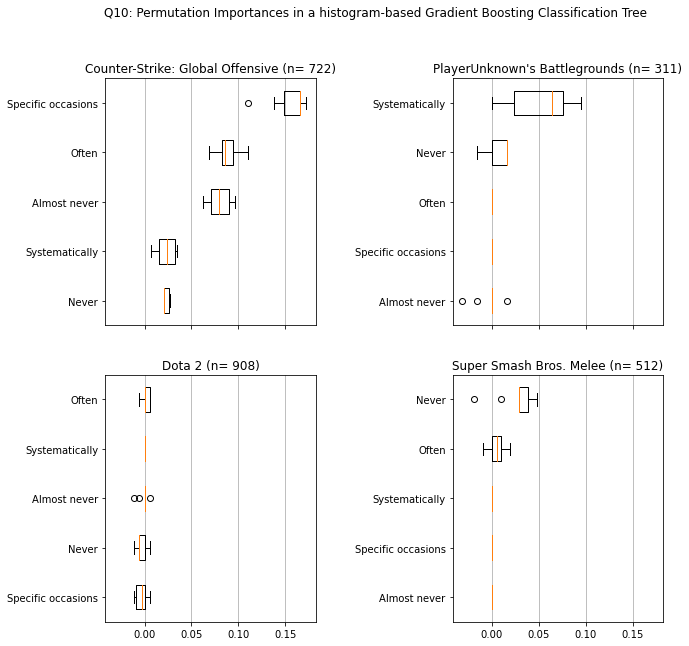

In [1446]:
q10Params = {'l2_regularization':0.2, 'learning_rate':0.95, 'max_depth':10, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot(qdf,qnum,q10Params,gameList,skillList)

## Question 11: What tools have you used for SPATIAL analysis? 
* Choose at least one

In [105]:
orderA = ["In-game tools", "Video tools", "Literary / text editing software", "Mods", 
        "Data visualization tools", "Data analysis tools", "None","Other"]
orderB = ["In-game tools", "Video tools","Text tools","Mods","Data visualization tools","Data analysis tools", "None", "Other"]


suptitle = 'Q11: What tools have you used for SPATIAL analysis?'
qnum = 'Q11'
qdf = SetupDf(df,qnum,orderA,orderB)

countsB=MakeCountsB(qdf, orderB)

In [106]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

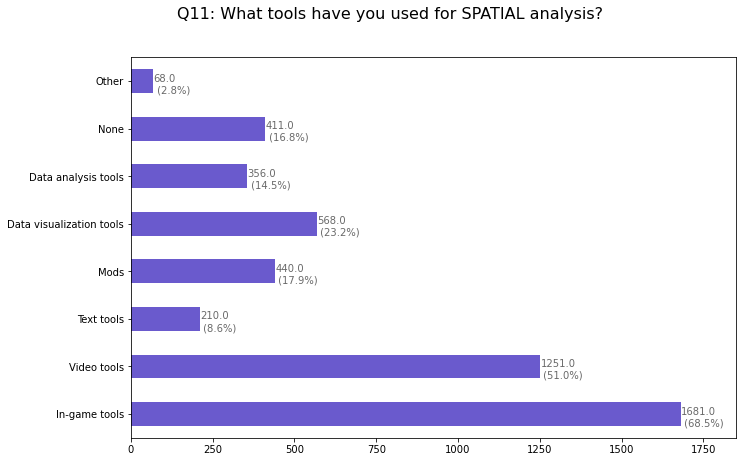

In [702]:
PlotBars(qdf,qnum,suptitle,countsB)

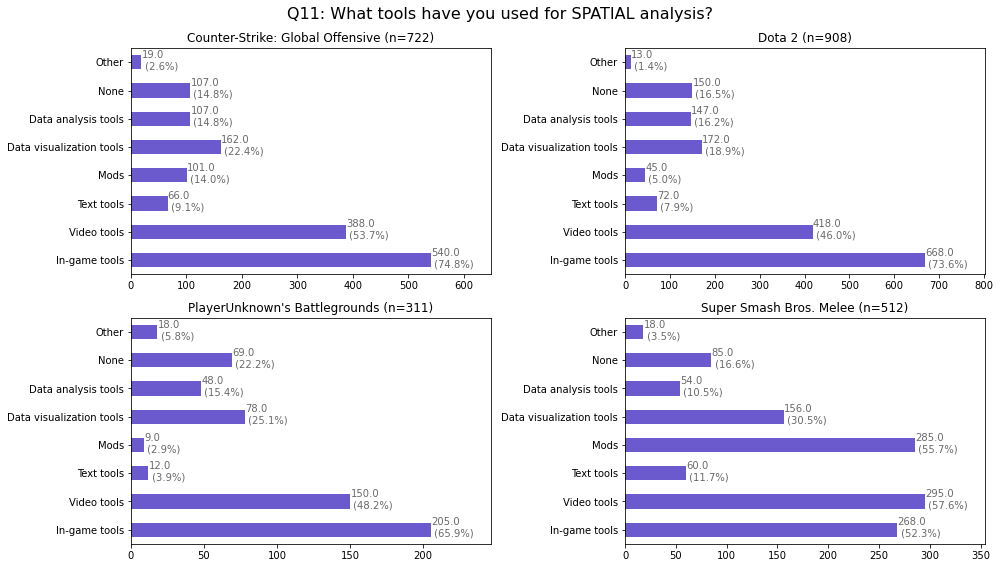

In [703]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

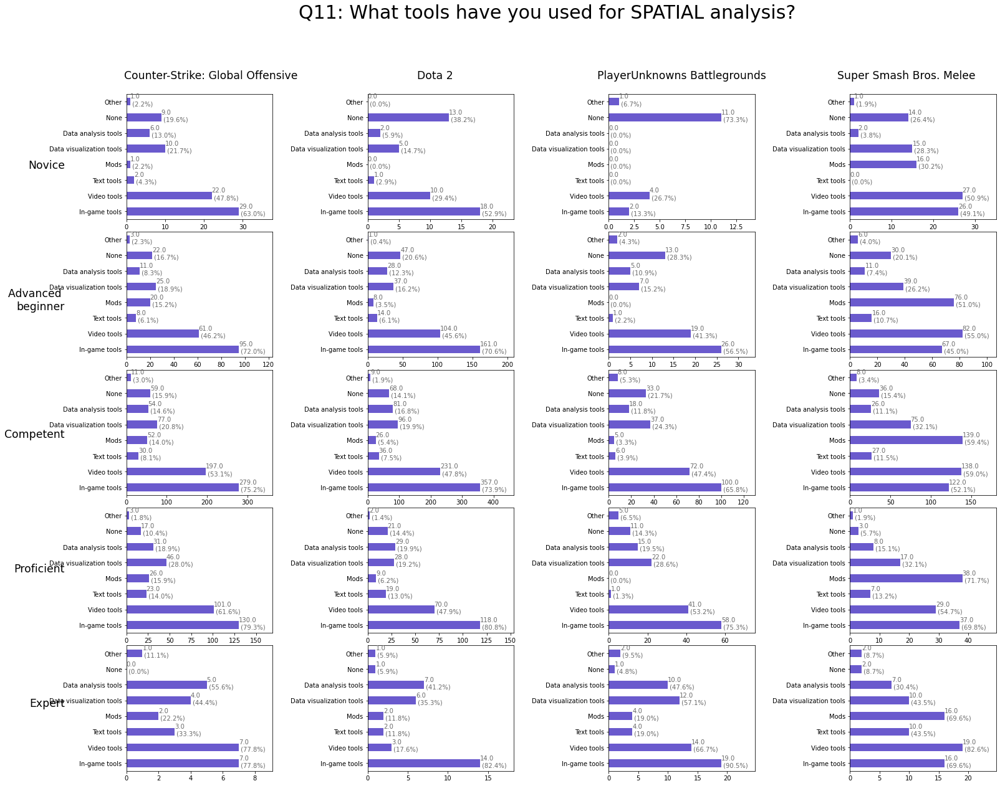

In [704]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

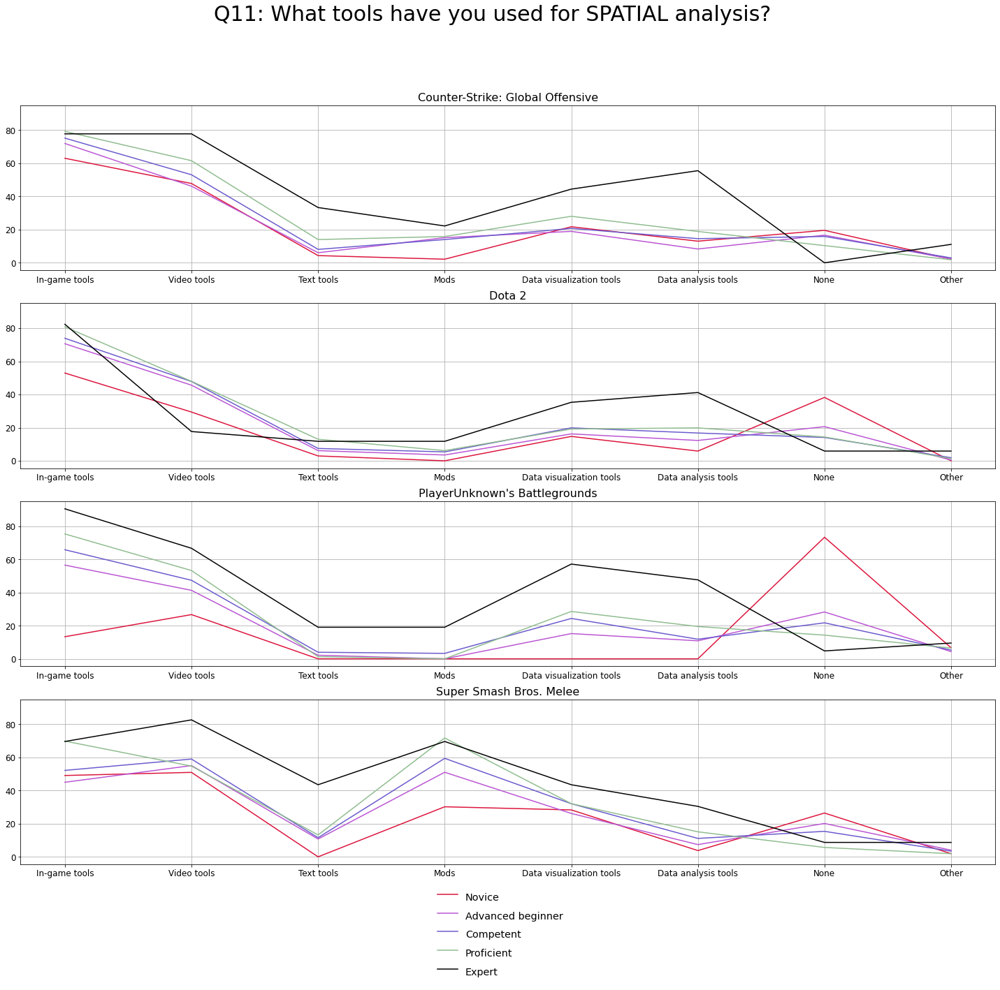

In [705]:
IndividualLines(suptitle,qnum,orderB,qdf)

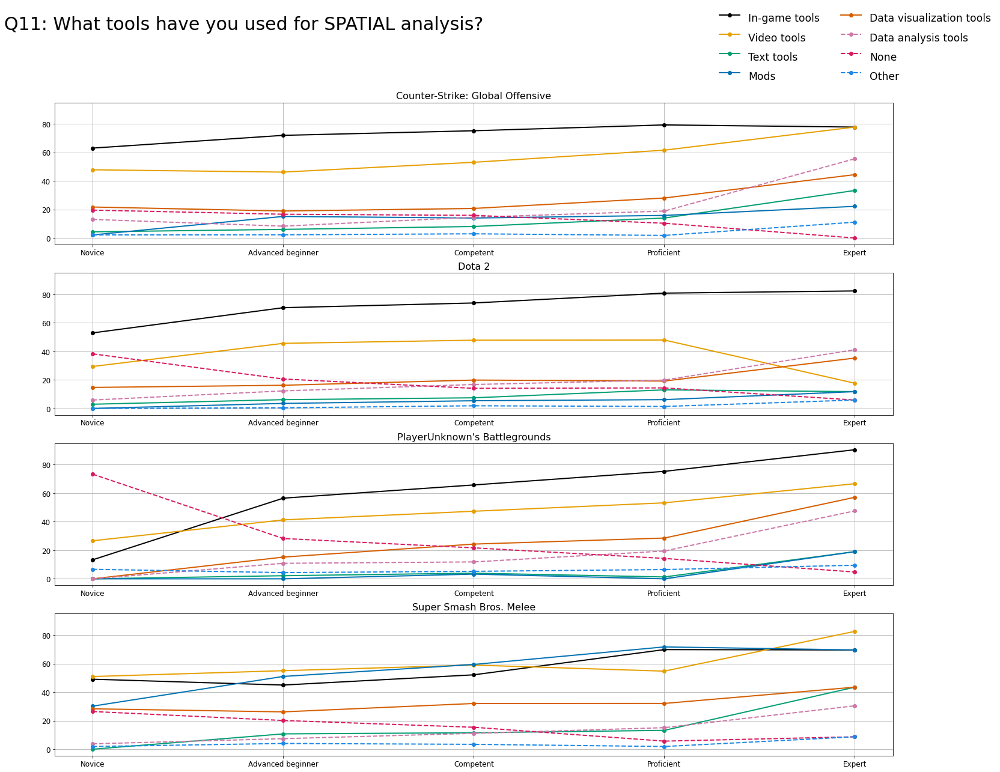

In [706]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

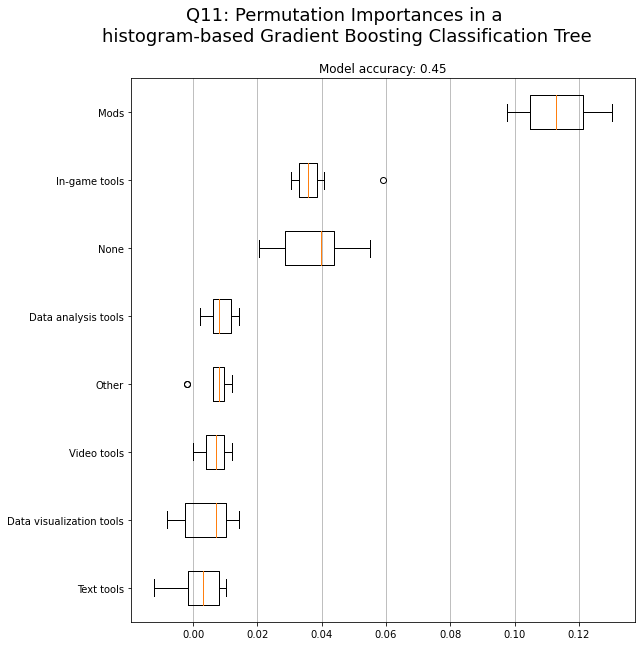

In [707]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [736]:
q11PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q11PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Expert,Q11,None,None
1,Dota 2,Novice,Q11,Mods,None
2,Dota 2,Novice,Q11,Other,None
3,PlayerUnknown's Battlegrounds,Novice,Q11,Text tools,None
4,PlayerUnknown's Battlegrounds,Novice,Q11,Mods,None
5,PlayerUnknown's Battlegrounds,Novice,Q11,Data visualization tools,None
6,PlayerUnknown's Battlegrounds,Novice,Q11,Data analysis tools,None
7,PlayerUnknown's Battlegrounds,Advanced beginner,Q11,Mods,None
8,PlayerUnknown's Battlegrounds,Proficient,Q11,Mods,None
9,Super Smash Bros. Melee,Novice,Q11,Text tools,None


In [737]:
q11LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList,q11PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['None']
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Mods']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Text tools', 'Mods', 'Data visualization tools', 'Data analysis tools']
Skill levels: Advanced beginner and below vs Competent and above
These will be dropped: ['Mods']
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros.

In [164]:
q11LogRegCollection[gameList[0]].T[orderB[2]]

0     NaN
1    0.74
2    0.58
3    0.87
Name: Text tools, dtype: float64

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


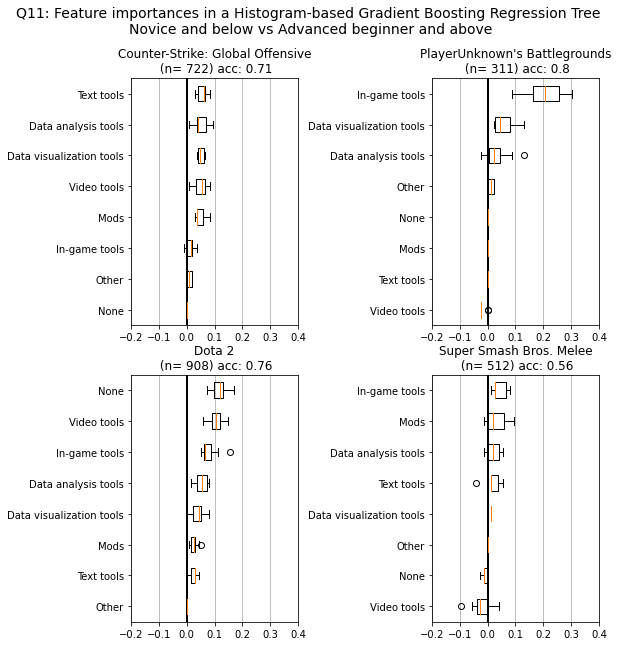

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


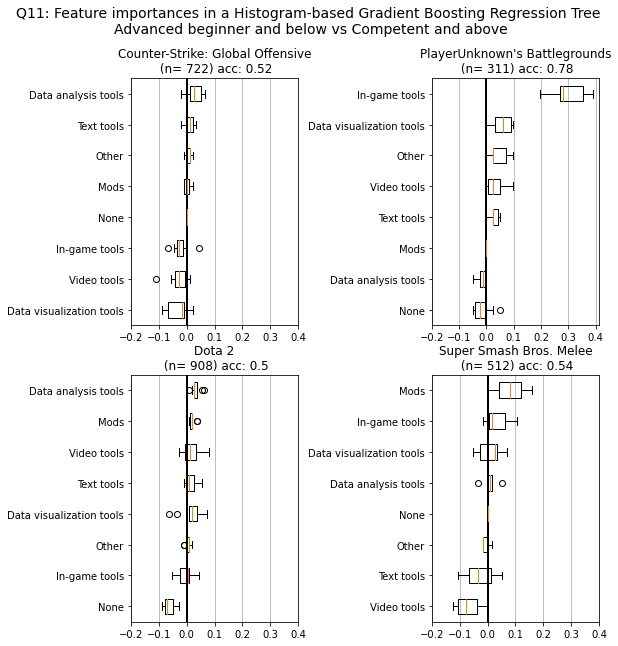

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


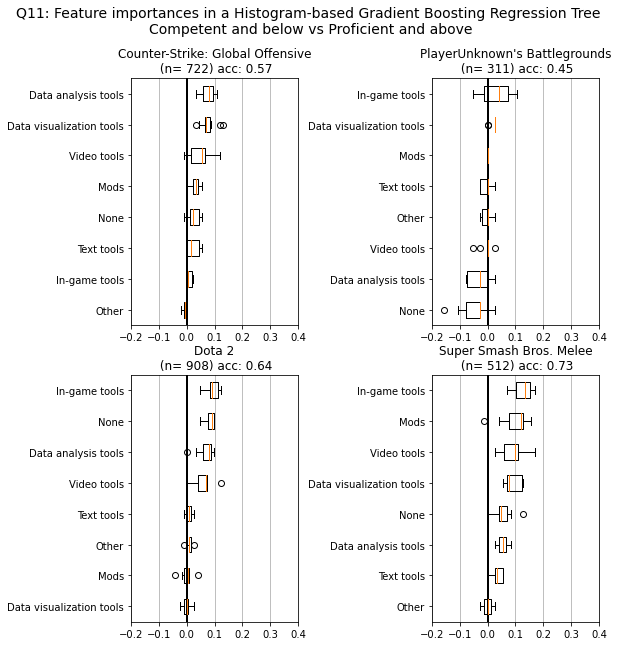

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


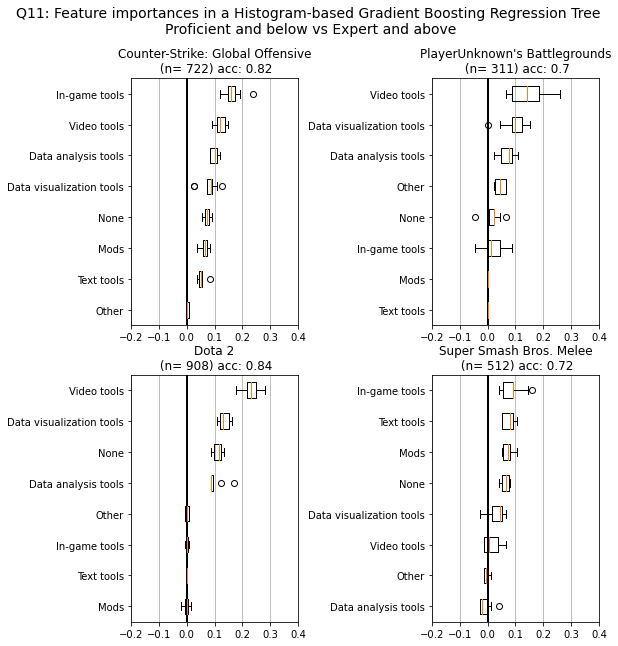

                              0      1      2      3
In-game tools             0.013  0.000  0.009  0.167
Video tools               0.050  0.000  0.049  0.123
Text tools                0.057  0.011  0.023  0.051
Mods                      0.048  0.002  0.030  0.065
Data visualization tools  0.050  0.000  0.076  0.080
Data analysis tools       0.050  0.029  0.077  0.098
None                      0.000  0.000  0.025  0.072
                              0      1      2      3
In-game tools             0.081  0.000  0.094  0.001
Video tools               0.105  0.018  0.061  0.230
Text tools                0.024  0.016  0.009  0.000
Mods                      0.026  0.019  0.000  0.000
Data visualization tools  0.038  0.015  0.000  0.135
Data analysis tools       0.055  0.032  0.069  0.101
None                      0.116  0.000  0.086  0.112
                              0      1      2      3
In-game tools             0.202  0.298  0.032  0.017
Video tools               0.000  0.032  0.000 

In [738]:
q11Params = {'l2_regularization':0.2, 'learning_rate':0.2, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':5}
q11importances = getImportances2(qdf, qnum, orderB, q11Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

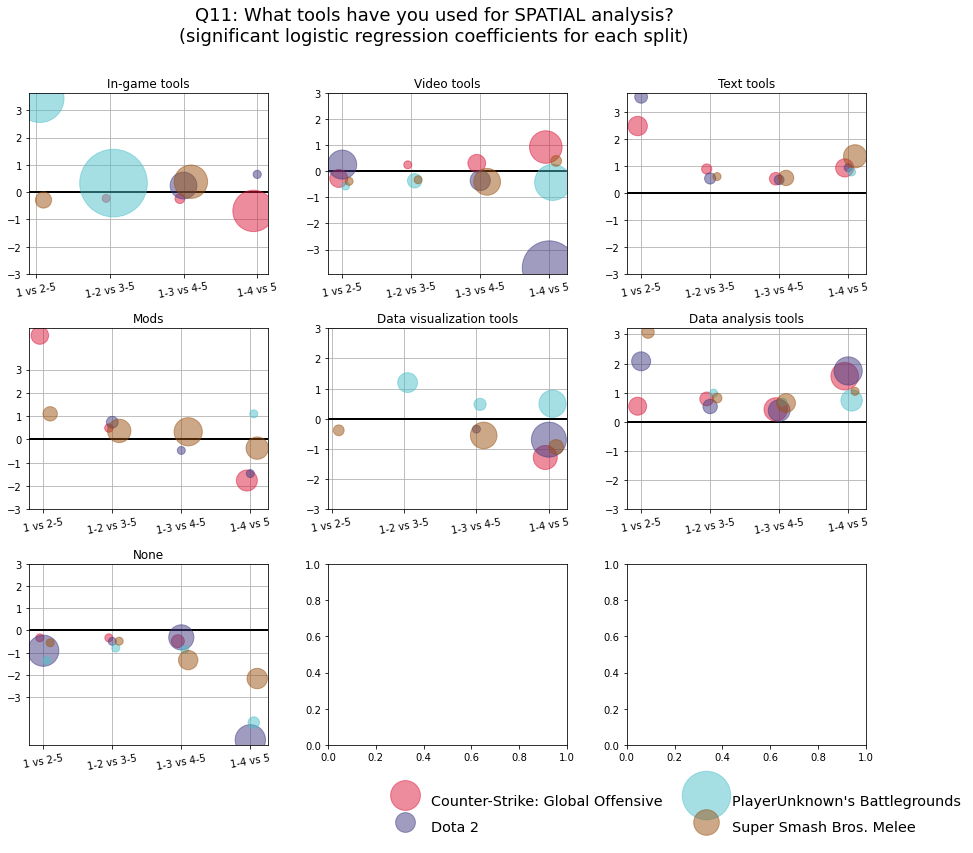

In [739]:
ScatterPlotImportances(suptitle, orderB, qnum, q11LogRegCollection, q11importances, gameList)

<Figure size 432x288 with 0 Axes>

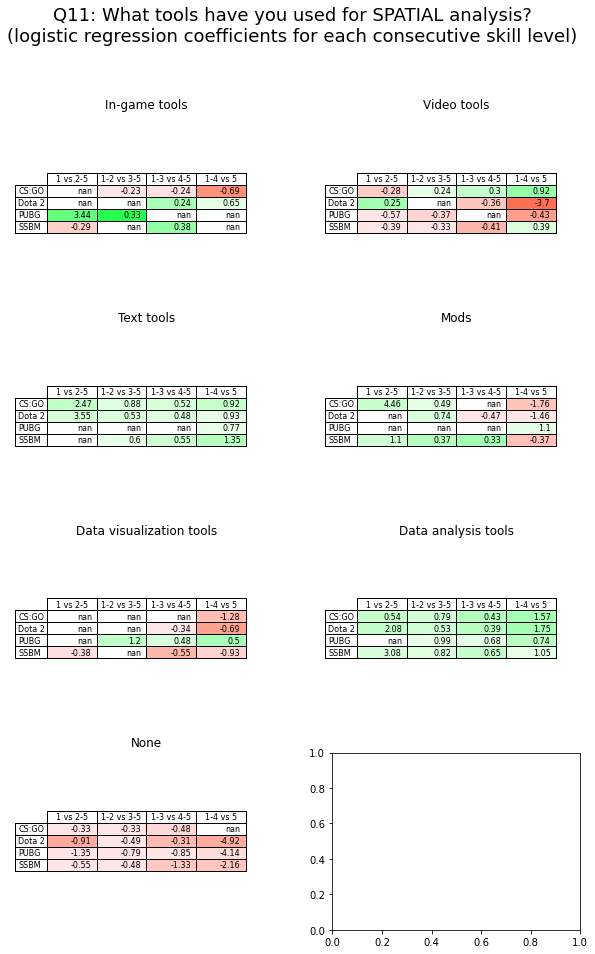

In [740]:
TablePlotImportances(suptitle, orderB, qnum, q11LogRegCollection, q11importances,gameList)

In [896]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [897]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5192307692307693
[[-1.15396693e-01 -2.24639808e-02 -1.31068074e+00 -8.24963276e-01
   2.54949507e-01 -6.73633818e-01  2.39769986e-01 -4.40411345e-01]
 [-4.28804170e-01 -4.86746942e-02  7.23566638e-02 -1.57608125e-02
  -1.14676523e-01 -3.09123399e-01  5.17271233e-02  4.54976832e-02]
 [-1.84450804e-01  4.65445892e-03 -4.21314552e-02  2.43955216e-01
  -1.07122723e-03 -7.02510345e-02  2.37199924e-01  1.63269799e-03]
 [ 6.51742195e-01 -4.88377840e-01  6.06893540e-02  6.19873338e-01
  -9.12187740e-02  2.04281826e-01 -4.33385615e-01 -2.60158199e-01]
 [ 7.69094717e-02  5.54862056e-01  1.21976618e+00 -2.31044661e-02
  -4.79829827e-02  8.48726425e-01 -9.53114184e-02  6.53439163e-01]]


In [879]:
# Ordinal logistic regression

In [1120]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='probit')

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

Optimization terminated successfully.
         Current function value: 1.237109
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -384.74
Model:                   OrderedModel   AIC:                             793.5
Method:            Maximum Likelihood   BIC:                             838.4
Date:                Tue, 02 Feb 2021                                         
Time:                        09:40:54                                         
No. Observations:                 311                                         
Df Residuals:                     299                                         
Df Model:                          12                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
In-game tools                   0.4240      0.181      2.346      0.019       0.070       0.778
Video tools                     0.0767      0.145      0.531      0.596      -0.207       0.360
Text tools                      0.1576      0.350      0.450      0.653      -0.529       0.844
Mods                            0.4226      0.401      1.053      0.293      -0.364       1.209
Data visualization tools        0.2785      0.163      1.705      0.088      -0.042       0.598
Data analysis tools             0.3629      0.198      1.829      0.067      -0.026       0.752
None                           -0.1428      0.236     -0.604      0.546      -0.606       0.320
Other                           0.1799      0.265      0.679      0.497      -0.339       0.699
Novice/Advanced beginner       -1.3593      0.231     -5.877      0.000      -1.813      -0.906
Advanced beginner/Competent    -0.1221      0.138     -0.887      0.375      -0.392       0.148
Competent/Proficient            0.3527      0.068      5.221      0.000       0.220       0.485
Proficient/Expert               0.1023      0.104      0.984      0.325      -0.101       0.306
===============================================================================================
"""

In [1121]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='logit')

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -387.11
Model:                   OrderedModel   AIC:                             798.2
Method:            Maximum Likelihood   BIC:                             843.1
Date:                Tue, 02 Feb 2021                                         
Time:                        09:40:55                                         
No. Observations:                 311                                         
Df Residuals:                     299                                         
Df Model:                          12                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
In-game tools                   0.7525      0.324      2.325      0.020       0.118       1.387
Video tools                     0.1614      0.251      0.643      0.520      -0.330       0.653
Text tools                      0.3652      0.610      0.599      0.549      -0.830       1.561
Mods                            0.6439      0.702      0.917      0.359      -0.732       2.020
Data visualization tools        0.4912      0.286      1.719      0.086      -0.069       1.051
Data analysis tools             0.6295      0.345      1.823      0.068      -0.047       1.306
None                           -0.1554      0.420     -0.370      0.711      -0.979       0.668
Other                           0.4585      0.460      0.997      0.319      -0.443       1.360
Novice/Advanced beginner       -2.3406      0.430     -5.442      0.000      -3.184      -1.498
Advanced beginner/Competent     0.4957      0.148      3.351      0.001       0.206       0.786
Competent/Proficient            0.8573      0.072     11.939      0.000       0.717       0.998
Proficient/Expert               0.6849      0.112      6.096      0.000       0.465       0.905
===============================================================================================
"""

In [1115]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

Fraction of correct skill predictions
0.451171875


In [867]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# In-game tools
Spearmans correlation coefficient: 0.080
*** Samples are correlated (reject H0) p=0.031
Kendall correlation coefficient: 0.075
*** Samples are correlated (reject H0) p=0.031
# Video tools
Spearmans correlation coefficient: 0.111
*** Samples are correlated (reject H0) p=0.003
Kendall correlation coefficient: 0.103
*** Samples are correlated (reject H0) p=0.003
# Text tools
Spearmans correlation coefficient: 0.117
*** Samples are correlated (reject H0) p=0.002
Kendall correlation coefficient: 0.110
*** Samples are correlated (reject H0) p=0.002
# Mods
Spearmans correlation coefficient: 0.053
Samples are uncorrelated (fail to reject H0) p=0.155
Kendall correlation coefficient: 0.050
Samples are uncorrelated (fail to reject H0) p=0.155
# Data visualization tools
Spearmans correlation coefficient: 0.077
*** Samples are correlated (reject H0) p=0.039
Kendall correlation coefficien

In [527]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Accuracy: 0.53125
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best model: 
Accuracy: 0.59375
In-game tools: 0.4
Video tools: 0.15
Text tools: 0.02
Mods: 0.02
Data visualization tools: 0.08
Data analysis tools: 0.18
None: 0.08
Other: 0.07


In [528]:
best11 = best_random
best11

GradientBoostingRegressor(learning_rate=0.01, max_depth=90, max_features='auto',
                          n_estimators=40)

In [829]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [898]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.40384615384615385


In [899]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[-0.01538462 -0.04038462 -0.00769231  0.04230769 -0.04615385 -0.00576923
 -0.02884615  0.        ]
[0.03418536 0.0369411  0.02141448 0.03076923 0.04726233 0.00881265
 0.02150065 0.        ]


In [900]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],3)))
    i+=1

In-game tools: -0.015
Video tools: -0.04
Text tools: -0.008
Mods: 0.042
Data visualization tools: -0.046
Data analysis tools: -0.006
None: -0.029
Other: 0.0


In [903]:
best_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# l2_regularization lambda from gxboost
l2_regularization = [0.2, 0.5, 0.9]

# Try different learning rates
max_iter= [5, 10, 25, 50]

# Maximum number of levels in tree
max_depth = [2,5,10,None]

# Min samples leaf, recommended below 20
min_samples_leaf = [2,5,10,15]

# Find the base model predictions and print the accuracy with train data
best_pred = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(best_pred)

for i in range(10):
    for depth in max_depth:
        j =0
        for reg in l2_regularization:
            for iters in max_iter:
                for min_leaf in min_samples_leaf:
                    test_model = HistGradientBoostingClassifier(min_samples_leaf = min_leaf,max_iter= iters,learning_rate = (0.3*i)+0.05,max_depth = depth, l2_regularization = reg)
                    test_pred = BoostEvaluate(test_model, X_train, y_train,X_test,y_test)
                    if test_pred > best_pred:
                        best_pred = test_pred
                        best_model = test_model
                        print(best_model.score(X_test, y_test))
                        print(best_pred)
                    print("min_leaf: "+ str(min_leaf))
                print("Iters: "+ str(iters) + " (" + str(j)+"/4)")
            j+=1
        print("depth: "+ str(depth))
    print("completion: " + str((i+1)*10)+"%")

0.40384615384615385
0.5192307692307693
0.5192307692307693
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
m

min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min

min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_l

min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_

In [904]:
besthist11= best_model

In [905]:
besthist11.score(X_test, y_test)

0.5576923076923077

In [906]:
besthist11

HistGradientBoostingClassifier(l2_regularization=0.5, learning_rate=2.15,
                               max_depth=2, max_iter=10, min_samples_leaf=10)

In [ ]:
q11cs =[l2_regularization=0.5, learning_rate=0.35, max_depth=2, max_iter=10, min_samples_leaf=15]

q11dota = [l2_regularization=0.2, learning_rate=1.25, max_depth=2, max_iter=5, min_samples_leaf=2]

q11pubg = [l2_regularization=0.5, learning_rate=1.55, max_depth=10, max_iter=10, min_samples_leaf=10]

q11Melee = [l2_regularization=0.5, learning_rate=2.15, max_depth=2, max_iter=10, min_samples_leaf=10]
                               


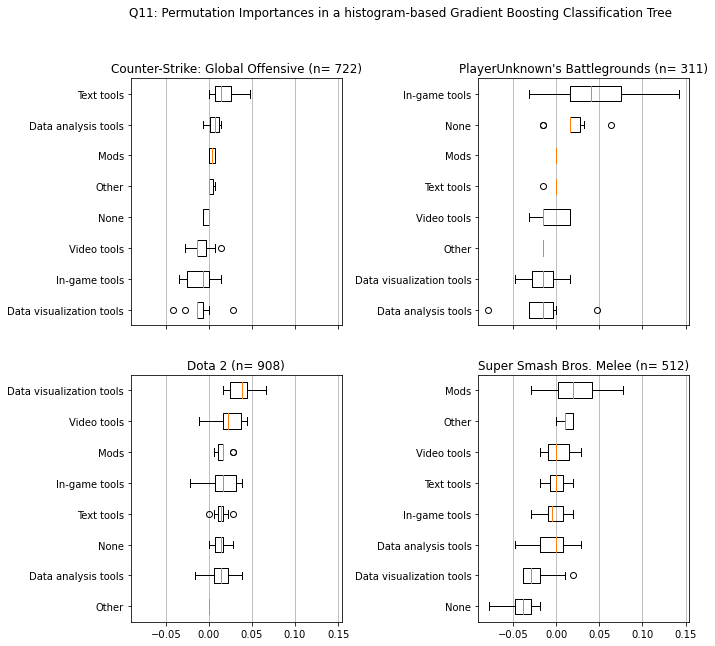

In [1457]:
q11Params = {'l2_regularization':0.5, 'learning_rate':0.95, 'max_depth':10, 'max_iter':10, 'min_samples_leaf':10}
PermutationImportancesPlot(qdf,qnum,q11Params,gameList,skillList)

## Question  12: What sort of spatial analytical methods are you familiar with that can be used for optimizing gameplay?
* Choose at least one

In [107]:
orderA = ["Thematic maps (showing information about a certain theme with colors or icons on a map)",
        "Point / Overlay maps (showing multiple layers of data on a map)",
        "Heatmaps", "Cluster / pattern analysis", "Surface / visibility analysis",
        "Distance metrics", "Network analysis", "Spatial buffer analysis", "None","Other"]
orderB = ["Thematic map", "Overlay map","Heatmap","Cluster analysis","Surface analysis",
          "Distance metrics", "Network analysis", "Buffer analysis", "None", "Other"]


suptitle = 'Q12: What spatial analytical methods are you familiar with?'
qnum = 'Q12'
qdf = SetupDf(df,qnum,orderA,orderB)

countsB=MakeCountsB(qdf, orderB)

In [108]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

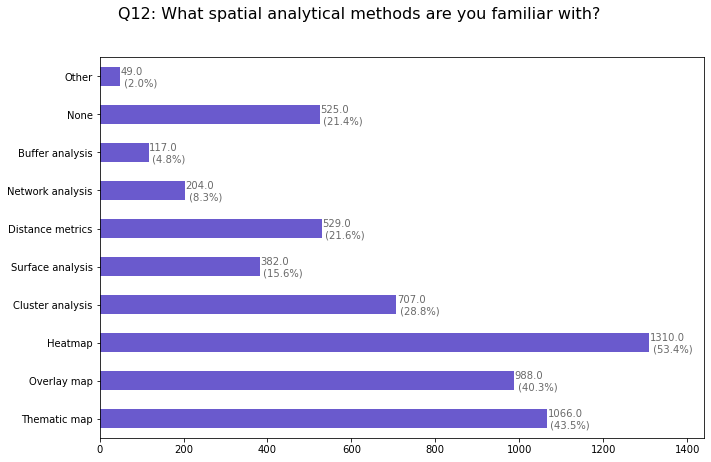

In [712]:
PlotBars(qdf,qnum,suptitle,orderB)

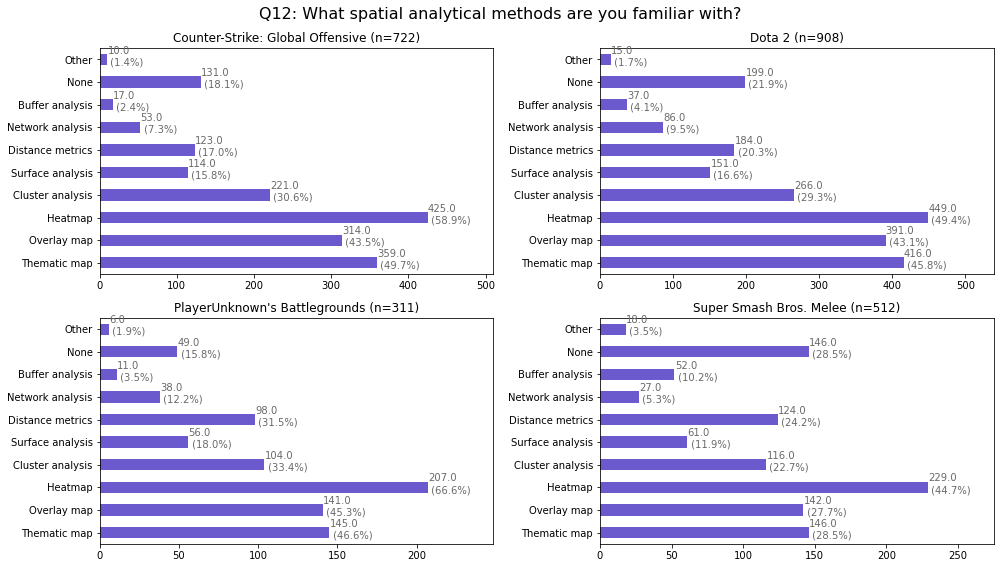

In [713]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

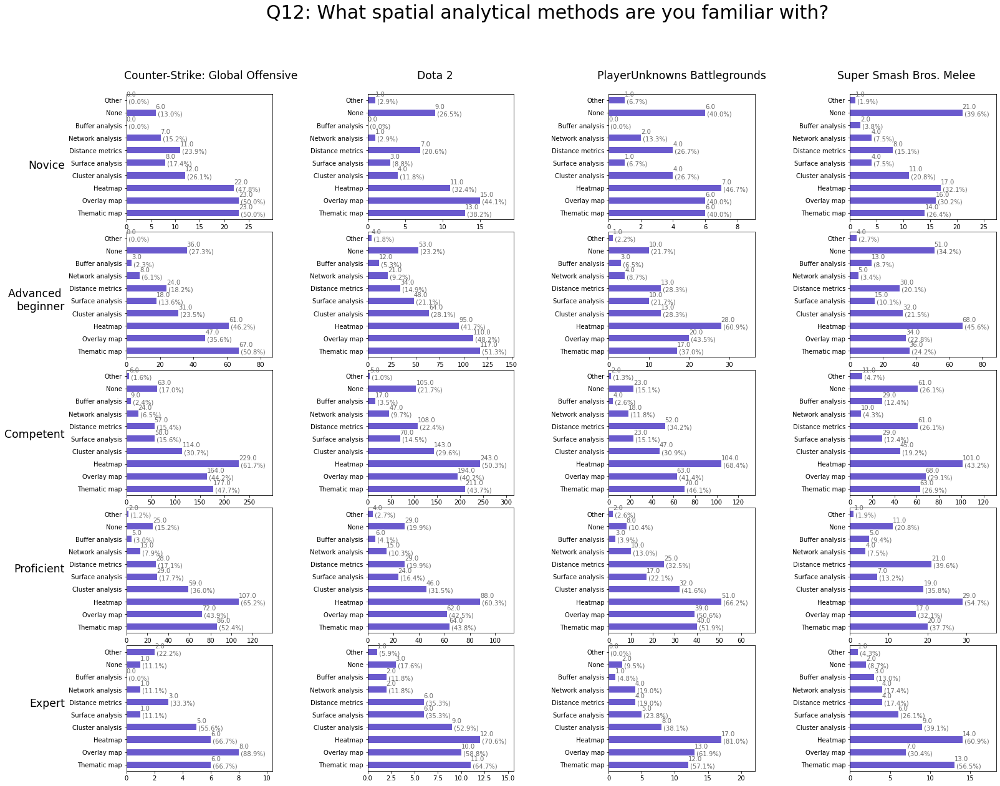

In [714]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

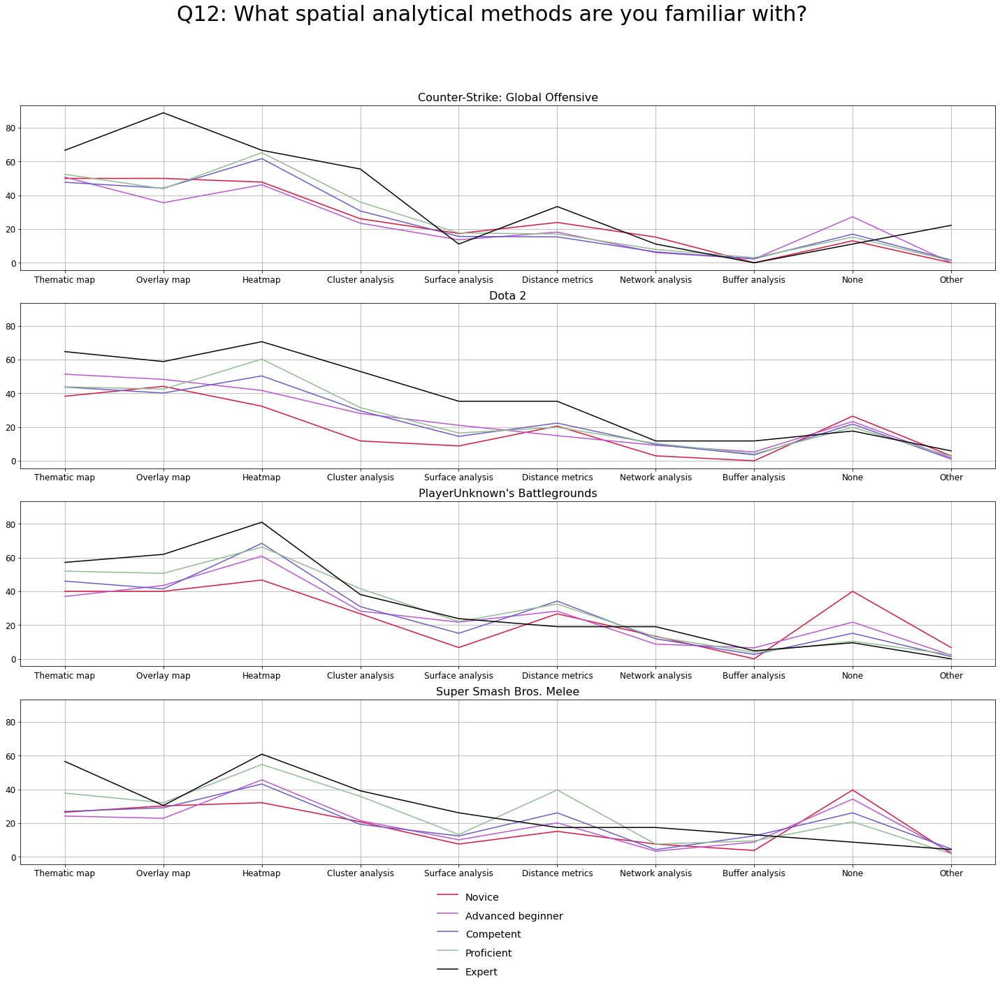

In [715]:
IndividualLines(suptitle,qnum,orderB,qdf)

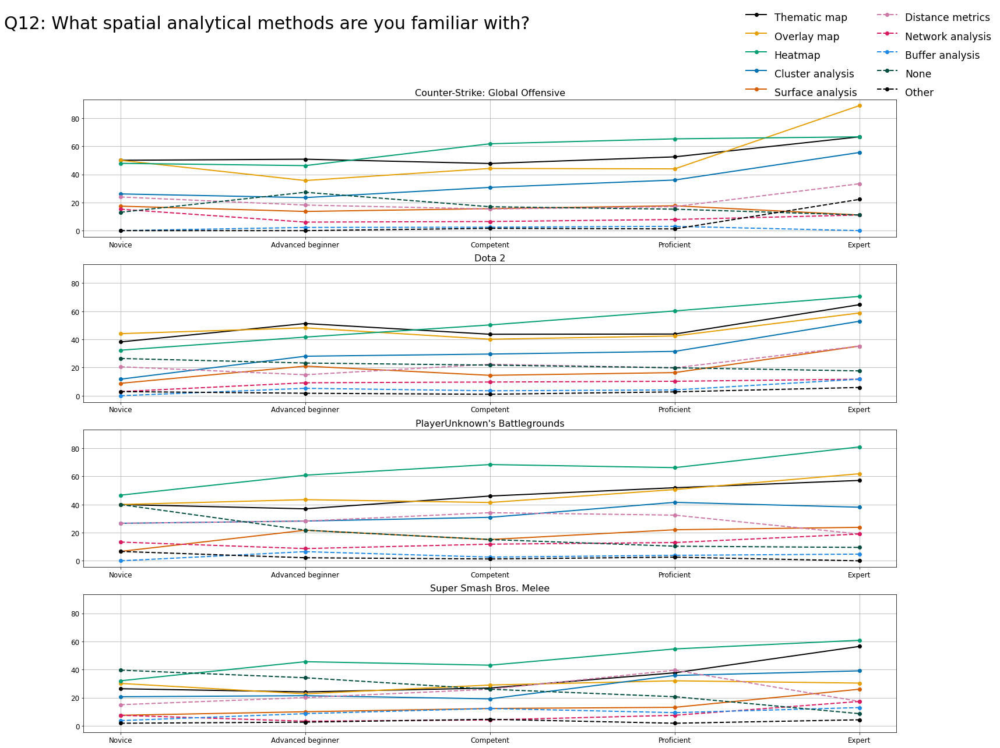

In [716]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

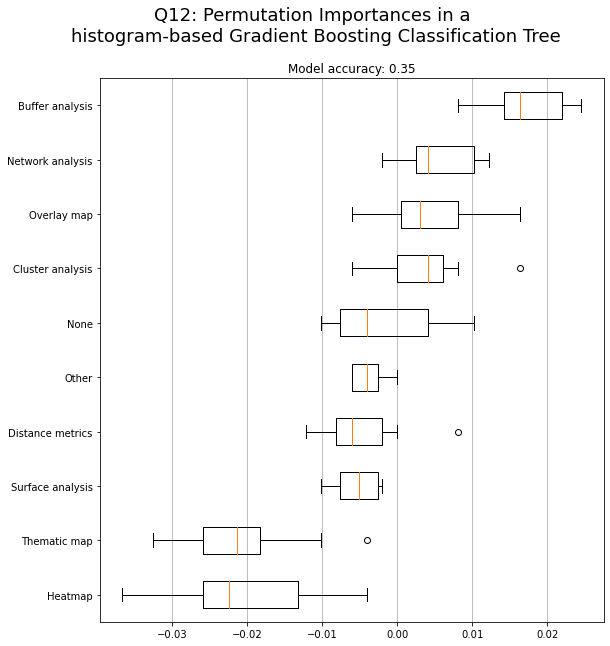

In [717]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':5, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [742]:
q12PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q12PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Novice,Q12,Buffer analysis,None
1,Counter-Strike: Global Offensive,Novice,Q12,Other,None
2,Counter-Strike: Global Offensive,Advanced beginner,Q12,Other,None
3,Counter-Strike: Global Offensive,Expert,Q12,Buffer analysis,None
4,Dota 2,Novice,Q12,Buffer analysis,None
5,PlayerUnknown's Battlegrounds,Novice,Q12,Buffer analysis,None
6,PlayerUnknown's Battlegrounds,Expert,Q12,Other,None


In [743]:
q12LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList, q12PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Buffer analysis']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['Buffer analysis']
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Buffer analysis']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Buffer analysis']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros. Melee
Skill levels: 

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


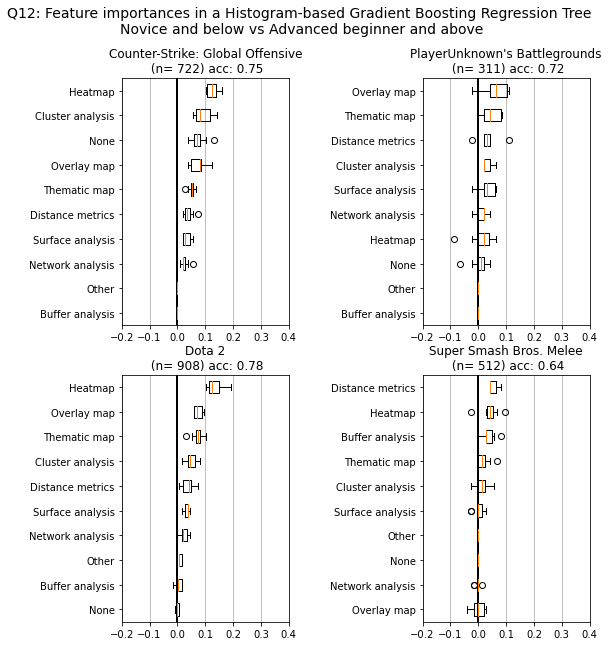

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


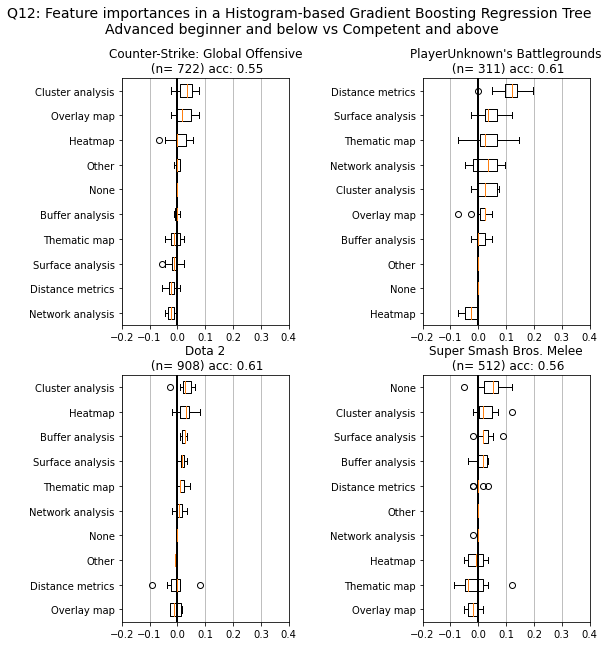

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


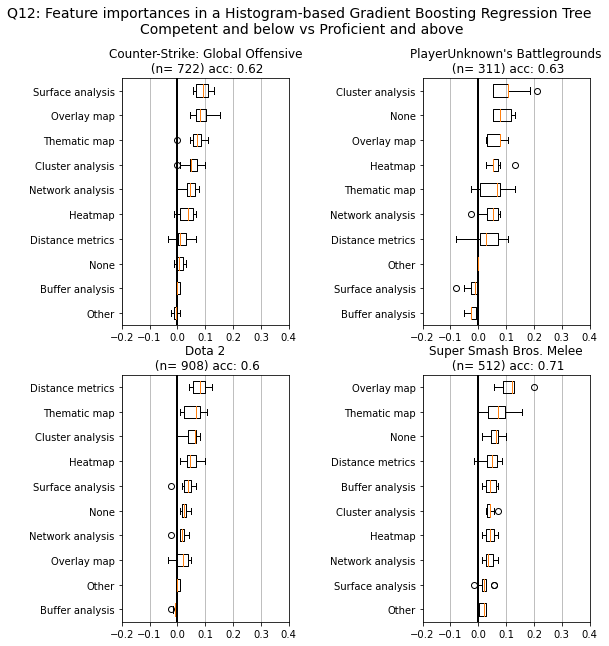

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


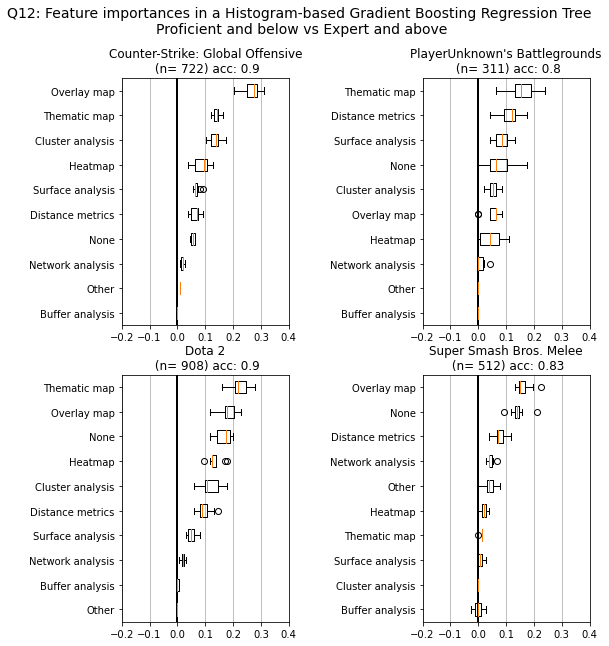

                      0      1      2      3
Thematic map      0.050  0.000  0.066  0.140
Overlay map       0.073  0.022  0.088  0.265
Heatmap           0.125  0.004  0.032  0.087
Cluster analysis  0.091  0.029  0.051  0.136
Surface analysis  0.034  0.000  0.090  0.068
Distance metrics  0.038  0.000  0.017  0.064
Network analysis  0.025  0.000  0.042  0.017
Buffer analysis   0.000  0.000  0.004  0.000
None              0.075  0.000  0.008  0.055
                      0      1      2      3
Thematic map      0.073  0.015  0.056  0.221
Overlay map       0.074  0.000  0.014  0.180
Heatmap           0.133  0.027  0.050  0.134
Cluster analysis  0.047  0.029  0.052  0.116
Surface analysis  0.032  0.018  0.034  0.050
Distance metrics  0.038  0.000  0.080  0.095
Network analysis  0.021  0.007  0.016  0.018
Buffer analysis   0.004  0.024  0.000  0.002
None              0.001  0.000  0.026  0.165
                      0      1      2      3
Thematic map      0.048  0.034  0.050  0.152
Overlay ma

In [744]:
q12Params = {'l2_regularization':0.2, 'learning_rate':0.2, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':5}
q12importances = getImportances2(qdf, qnum, orderB, q12Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

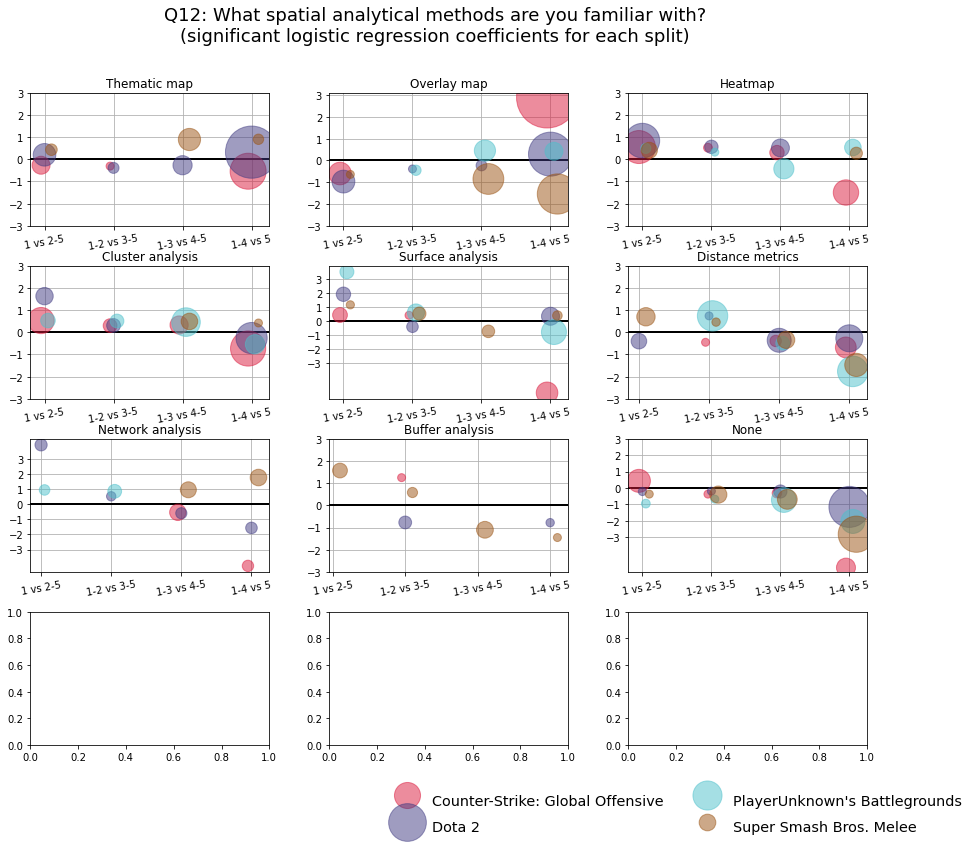

In [745]:
ScatterPlotImportances(suptitle, orderB, qnum, q12LogRegCollection, q12importances,gameList)

<Figure size 432x288 with 0 Axes>

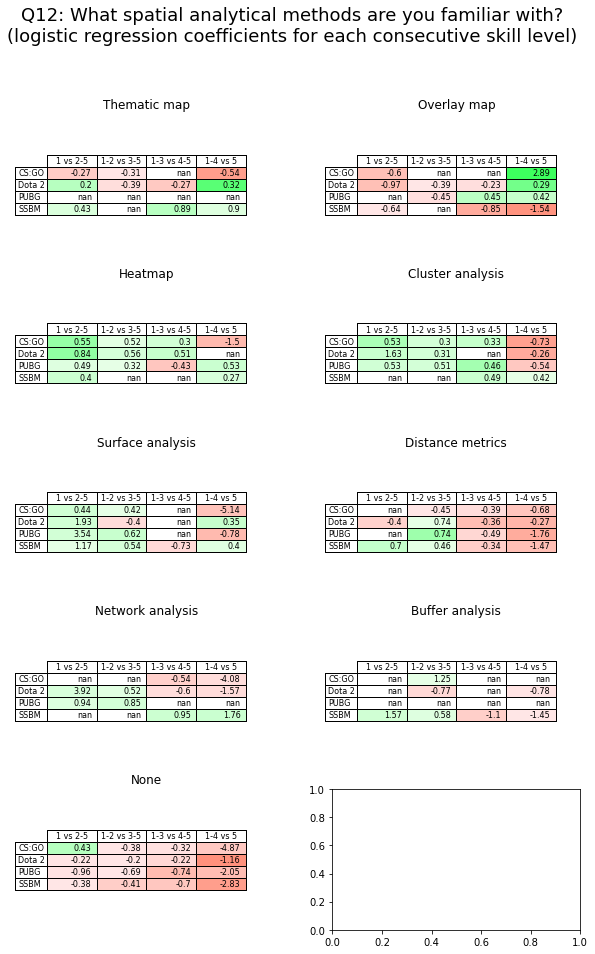

In [746]:
TablePlotImportances(suptitle, orderB, qnum, q12LogRegCollection, q12importances,gameList)

In [943]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [944]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.4807692307692308
[[-0.24475476  0.42662351 -0.45309579 -0.04960865 -0.2819584  -0.2020092
   0.4043595  -0.45573302  0.26001321 -0.1112371 ]
 [-0.17480037 -0.05241205  0.18196032 -0.17665664 -0.05436713  0.05493142
  -0.56838617  0.2050618   0.40970472  0.14312419]
 [-0.49912875  0.34060712 -0.13022798 -0.50380626 -0.00931719  0.20065955
  -0.64403527  0.39984573 -0.25270623  0.43800516]
 [ 0.24879118 -0.14766139 -0.07127882  0.26337351 -0.12194253  0.71602978
  -0.038119   -0.09729443 -0.0623649  -0.0510059 ]
 [ 0.6698927  -0.56715718  0.47264227  0.46669804  0.46758526 -0.76961154
   0.84618094 -0.05188009 -0.35464681 -0.41888635]]


In [1490]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[3]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i
            
# defining the dependent and independent variables 
Xtrain = testDf[orderB].astype(int)
ytrain = testDf[['skill']]/5

# building the model and fitting the data 
log_reg = sm.Logit(ytrain, Xtrain).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.610160
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                  skill   No. Observations:                  512
Model:                          Logit   Df Residuals:                      502
Method:                           MLE   Df Model:                            9
Date:                Thu, 11 Feb 2021   Pseudo R-squ.:                 -0.4236
Time:                        15:38:24   Log-Likelihood:                -312.40
converged:                       True   LL-Null:                       -219.44
Covariance Type:            nonrobust   LLR p-value:                     1.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Thematic map        -0.0657      0.221     -0.297      0.766      -0.499       0.368
Overlay map

In [945]:
# Ordinal logistic regression

In [926]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='probit')

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

NameError: name 'OrderedModel' is not defined

In [1074]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='logit')

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -868.84
Model:                   OrderedModel   AIC:                             1766.
Method:            Maximum Likelihood   BIC:                             1830.
Date:                Mon, 01 Feb 2021                                         
Time:                        11:06:51                                         
No. Observations:                 722                                         
Df Residuals:                     708                                         
Df Model:                          14                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Thematic map                   -0.0475      0.163     -0.292      0.770      -0.366       0.271
Overlay map                     0.0103      0.162      0.063      0.949      -0.308       0.329
Heatmap                         0.4891      0.177      2.765      0.006       0.142       0.836
Cluster analysis                0.2985      0.173      1.727      0.084      -0.040       0.637
Surface analysis                0.0514      0.214      0.240      0.810      -0.368       0.471
Distance metrics               -0.2777      0.211     -1.315      0.189      -0.692       0.136
Network analysis               -0.1943      0.300     -0.649      0.517      -0.781       0.393
Buffer analysis                 0.4739      0.481      0.985      0.325      -0.469       1.417
None                            0.0497      0.250      0.199      0.842      -0.440       0.539
Other                           1.3747      0.635      2.166      0.030       0.131       2.619
Novice/Advanced beginner       -2.3903      0.231    -10.337      0.000      -2.844      -1.937
Advanced beginner/Competent     0.4681      0.086      5.413      0.000       0.299       0.638
Competent/Proficient            0.8449      0.045     18.811      0.000       0.757       0.933
Proficient/Expert               1.1757      0.102     11.546      0.000       0.976       1.375
===============================================================================================
"""

In [1075]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

Fraction of correct skill predictions
0.5124653739612188


In [536]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Thematic map
Spearmans correlation coefficient: 0.019
Samples are uncorrelated (fail to reject H0) p=0.602
Kendall correlation coefficient: 0.018
Samples are uncorrelated (fail to reject H0) p=0.602
# Overlay map
Spearmans correlation coefficient: 0.047
Samples are uncorrelated (fail to reject H0) p=0.207
Kendall correlation coefficient: 0.044
Samples are uncorrelated (fail to reject H0) p=0.207
# Heatmap
Spearmans correlation coefficient: 0.132
*** Samples are correlated (reject H0) p=0.000
Kendall correlation coefficient: 0.123
*** Samples are correlated (reject H0) p=0.000
# Cluster analysis
Spearmans correlation coefficient: 0.098
*** Samples are correlated (reject H0) p=0.009
Kendall correlation coefficient: 0.091
*** Samples are correlated (reject H0) p=0.009
# Surface analysis
Spearmans correlation coefficient: 0.023
Samples are uncorrelated (fail to reject H0) p=0.543
Kendall corr

In [537]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Accuracy: 0.5205479452054794
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best model: 
Accuracy: 0.5342465753424658
Thematic map: 0.12
Overlay map: 0.08
Heatmap: 0.09
Cluster analysis: 0.18
Surface analysis: 0.1
Distance metrics: 0.17
Network analysis: 0.14
Buffer analysis: 0.03
None: 0.02
Other: 0.07


In [538]:
best12 = best_random
best12

GradientBoostingRegressor(criterion='mae', learning_rate=0.01, loss='huber',
                          max_depth=100, max_features='log2', n_estimators=10)

In [829]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [946]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.5


In [947]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[-1.66533454e-17  3.65384615e-02  9.80769231e-02  8.46153846e-02
  3.65384615e-02 -2.88461538e-02  9.61538462e-03 -7.69230769e-03
  2.88461538e-02  0.00000000e+00]
[0.03846154 0.03154081 0.04974045 0.01961161 0.02643794 0.01550434
 0.01550434 0.01762529 0.01970567 0.        ]


In [948]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],3)))
    i+=1

Thematic map: -0.0
Overlay map: 0.037
Heatmap: 0.098
Cluster analysis: 0.085
Surface analysis: 0.037
Distance metrics: -0.029
Network analysis: 0.01
Buffer analysis: -0.008
None: 0.029
Other: 0.0


In [949]:
best_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=10, random_state=2)

# l2_regularization lambda from gxboost
l2_regularization = [0.2, 0.5, 0.9]

# Try different learning rates
max_iter= [5, 10, 25, 50]

# Maximum number of levels in tree
max_depth = [2,5,10,None]

# Min samples leaf, recommended below 20
min_samples_leaf = [2,5,10,15]

# Find the base model predictions and print the accuracy with train data
best_pred = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(best_pred)

for i in range(10):
    for depth in max_depth:
        j =0
        for reg in l2_regularization:
            for iters in max_iter:
                for min_leaf in min_samples_leaf:
                    test_model = HistGradientBoostingClassifier(min_samples_leaf = min_leaf,max_iter= iters,learning_rate = (0.3*i)+0.05,max_depth = depth, l2_regularization = reg)
                    test_pred = BoostEvaluate(test_model, X_train, y_train,X_test,y_test)
                    if test_pred > best_pred:
                        best_pred = test_pred
                        best_model = test_model
                        print(best_model.score(X_test, y_test))
                        print(best_pred)
                    print("min_leaf: "+ str(min_leaf))
                print("Iters: "+ str(iters) + " (" + str(j)+"/4)")
            j+=1
        print("depth: "+ str(depth))
    print("completion: " + str((i+1)*10)+"%")

0.5
0.5192307692307693
0.5192307692307693
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_l

min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_

min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 2
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_l

min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (2/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (2/4)
depth: 10
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (0/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 5 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 10 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 25 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min_leaf: 15
Iters: 50 (1/4)
min_leaf: 2
min_leaf: 5
min_leaf: 10
min

In [950]:
besthist12= best_model

In [951]:
besthist12.score(X_test, y_test)

0.5961538461538461

In [952]:
besthist12

HistGradientBoostingClassifier(l2_regularization=0.2, learning_rate=0.35,
                               max_depth=5, max_iter=5, min_samples_leaf=2)

In [ ]:
q12cs = [l2_regularization=0.2, learning_rate=0.35, max_depth=5, max_iter=50, min_samples_leaf=2]

q12dota = [l2_regularization=0.2, learning_rate=2.15, max_depth=10, max_iter=10, min_samples_leaf=5]

q12pubg = [l2_regularization=0.9, learning_rate=1.8499999999999999, max_depth=10, max_iter=25, min_samples_leaf=5]

q12Melee = [l2_regularization=0.2, learning_rate=0.35, max_depth=5, max_iter=5, min_samples_leaf=2]
                               


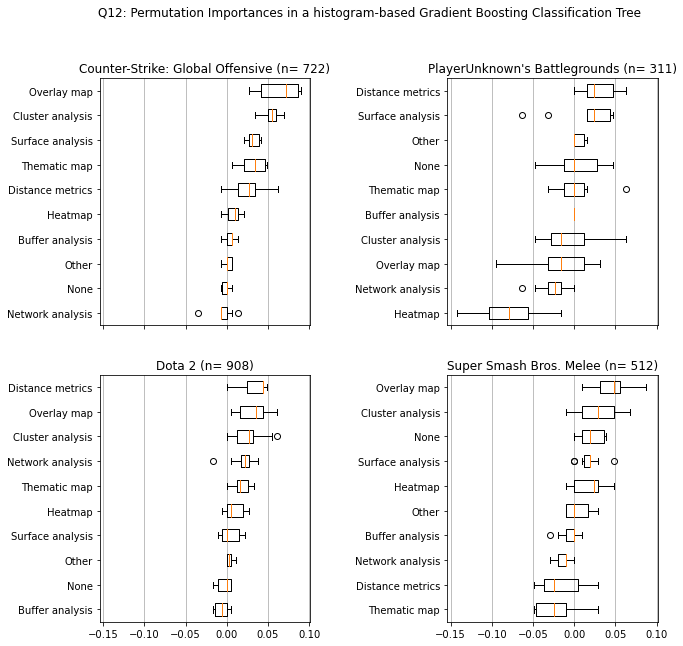

In [1462]:
q12Params = {'l2_regularization':0.2, 'learning_rate':0.95, 'max_depth':10, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot(qdf,qnum,q12Params,gameList,skillList)

## Question 13: Which improvements would you most hope to have in the game regarding SPATIAL analysis?
* Choose one

In [109]:
orderA = ["Better tools for acquiring data","Better tools for visualizing data",
          "Better tools for capturing video","Better tools for data analysis",
          "It's good as it is, no tools needed","Other"]
orderB = ["Data tools", "Visualization tools","Video tools",
          "Data analysis tools","Nothing", "Other"]


suptitle = 'Q13: Which improvements would you hope to have regarding SPATIAL analysis?'
qnum = 'Q13'
qdf = SetupDf(df,qnum,orderA,orderB)

countsB=MakeCountsB(qdf, orderB)

In [110]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

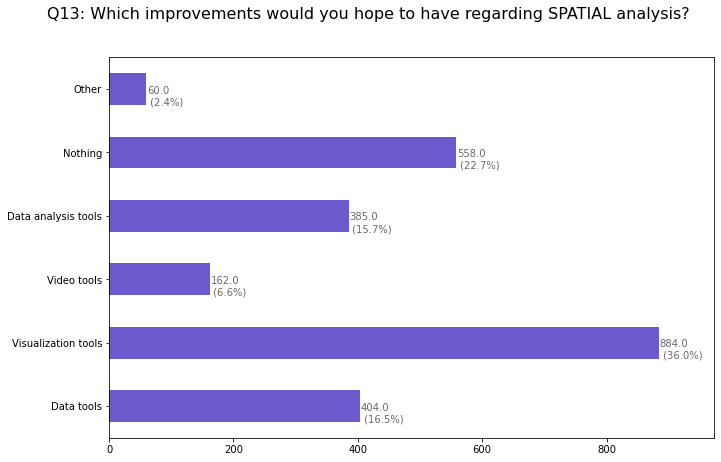

In [722]:
PlotBars(qdf,qnum,suptitle,orderB)

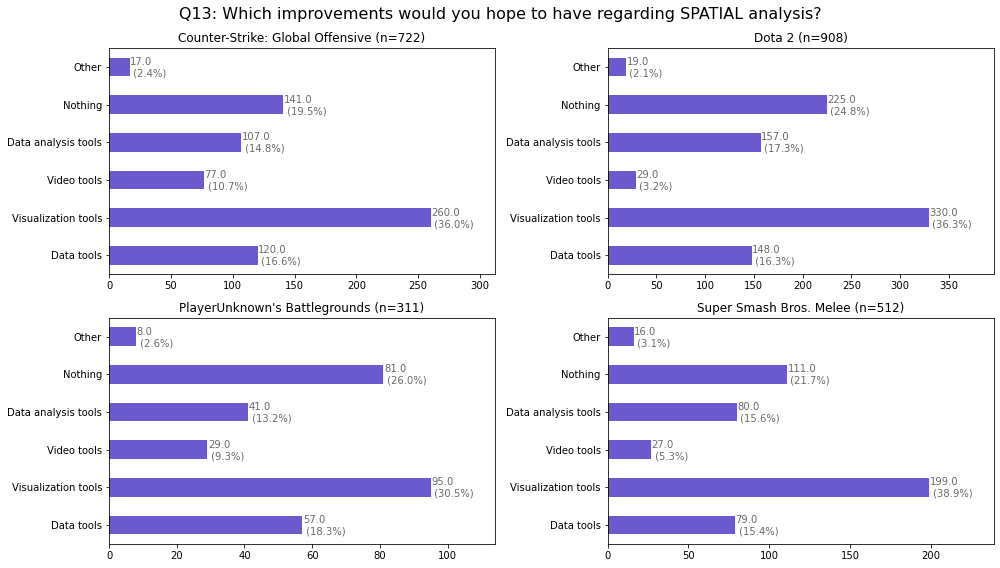

In [723]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

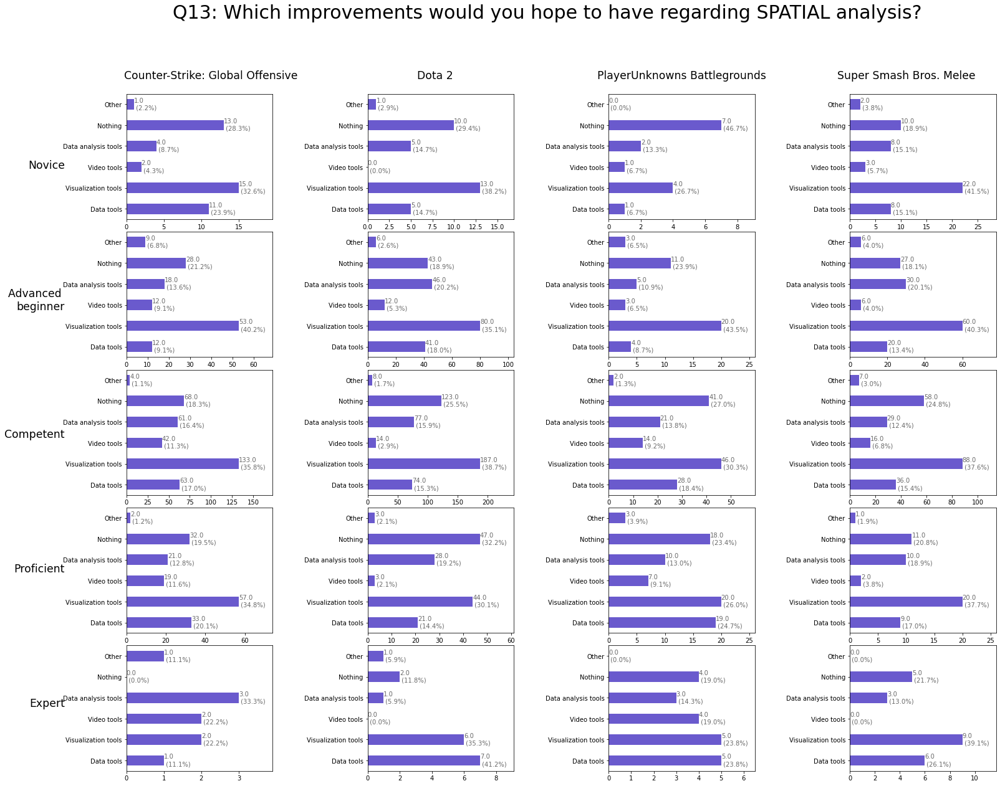

In [724]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

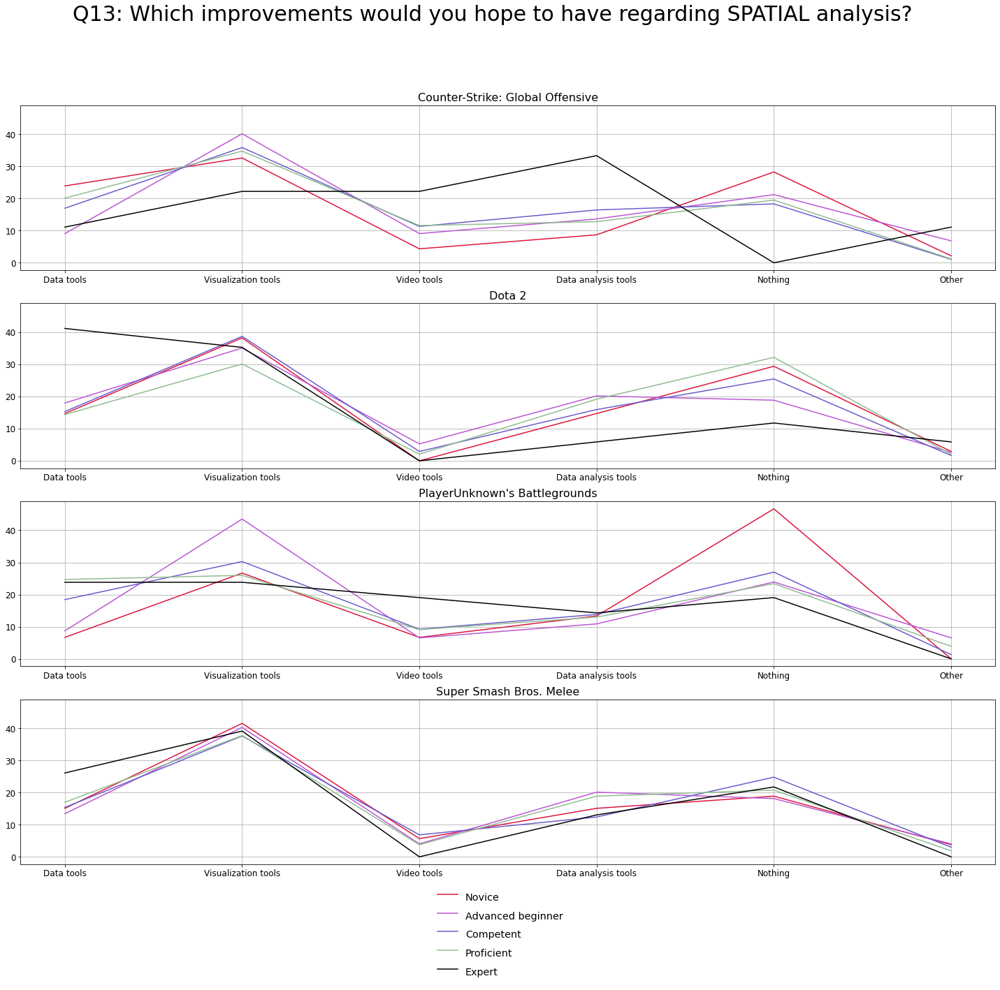

In [725]:
IndividualLines(suptitle,qnum,orderB,qdf)

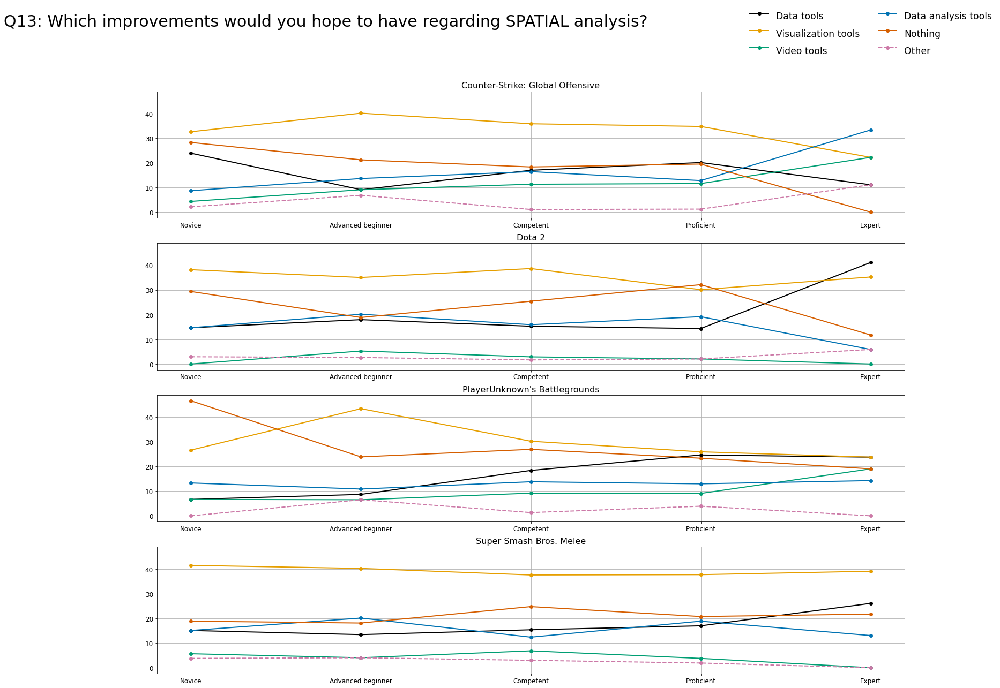

In [726]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

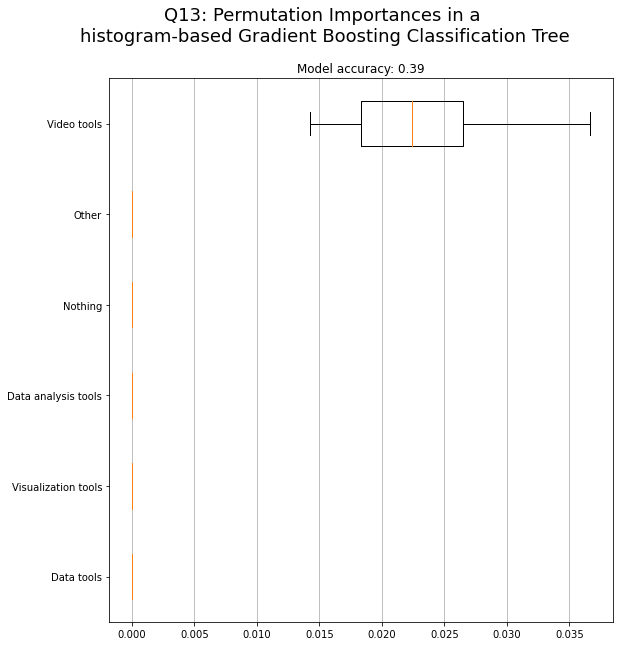

In [727]:
modelParams= {'l2_regularization':0.2, 'learning_rate':0.1, 'max_depth':10, 'max_iter':10, 'min_samples_leaf':5}
PermutationImportancesPlot_noSkill(qdf, qnum, orderB, modelParams, gameList, skillList)

In [748]:
q13PerfectSeparations = PerfectSeparations(qdf,qnum, orderB, gameList, skillList)
q13PerfectSeparations

,Q1,Q5,qnum,Question,AllNone
0,Counter-Strike: Global Offensive,Expert,Q13,Nothing,None
1,Dota 2,Novice,Q13,Video tools,None
2,Dota 2,Expert,Q13,Video tools,None
3,PlayerUnknown's Battlegrounds,Novice,Q13,Other,None
4,PlayerUnknown's Battlegrounds,Expert,Q13,Other,None
5,Super Smash Bros. Melee,Expert,Q13,Video tools,None
6,Super Smash Bros. Melee,Expert,Q13,Other,None


In [749]:
q13LogRegCollection = LogRegCollection2b(qdf,orderB,skillList,gameList,q13PerfectSeparations)

Counter-Strike: Global Offensive
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['Nothing']
Dota 2
Skill levels: Novice and below vs Advanced beginner and above
These will be dropped: ['Video tools']
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
These will be dropped: ['Video tools']
PlayerUnknown's Battlegrounds
Skill levels: Novice and below vs Advanced beginner and above
Skill levels: Advanced beginner and below vs Competent and above
Skill levels: Competent and below vs Proficient and above
Skill levels: Proficient and below vs Expert and above
Super Smash Bros. Melee
Skill levels: Novice and below vs Advanced beginner and above
Skill level

In [537]:
import math
q13oddratios = {}
for game in gameList:
    q13oddratios[game] = np.exp(q13LogRegCollection[game])

In [539]:
q13oddratios

{'Counter-Strike: Global Offensive':                              0         1         2         3
 Data tools            9.874938  4.220696  0.394554  0.011562
 Visualization tools  16.281020  2.829217  0.292293  0.007521
 Video tools          37.337568  4.481689  0.375311  0.023993
 Data analysis tools  26.049537  3.857426  0.289384  0.025733
 Nothing               9.874938  2.435130  0.292293       NaN,
 'Dota 2':                              0         1         2         3
 Data tools           28.502734  2.225541  0.232236  0.049292
 Visualization tools  24.288427  2.559981  0.179066  0.018500
 Video tools                NaN       NaN  0.115325       NaN
 Data analysis tools  30.265244  2.075081  0.225373  0.006539
 Nothing              21.541903  3.254374  0.278037  0.008915,
 "PlayerUnknown's Battlegrounds":                              0          1         2         3
 Data tools           55.701106  10.381237       NaN  0.096328
 Visualization tools  22.646380   2.944680  0.357

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


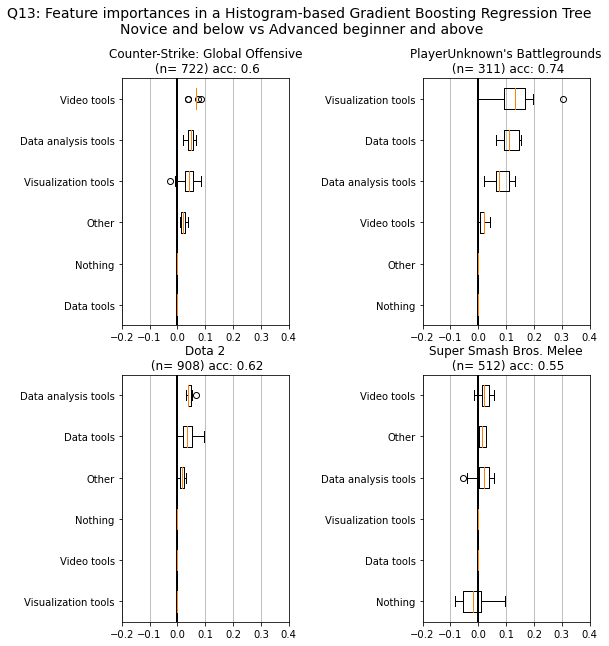

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


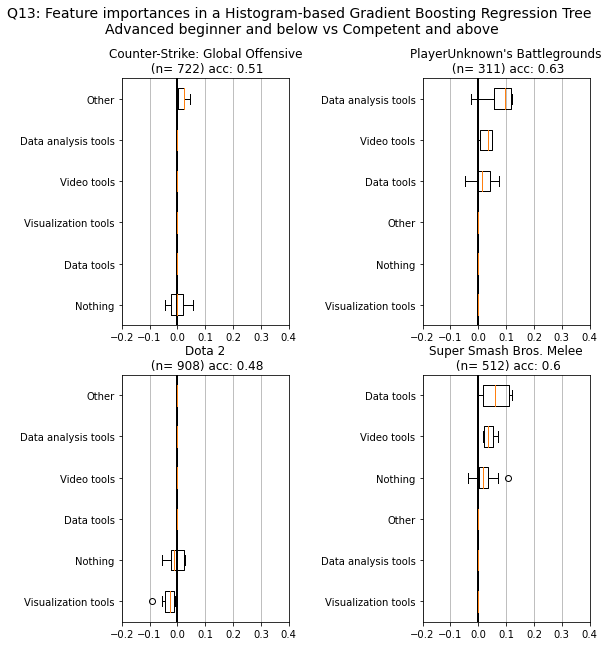

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


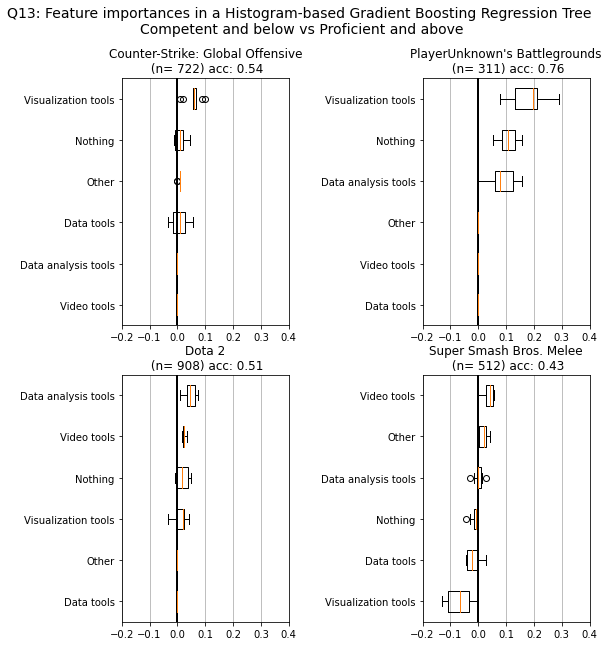

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


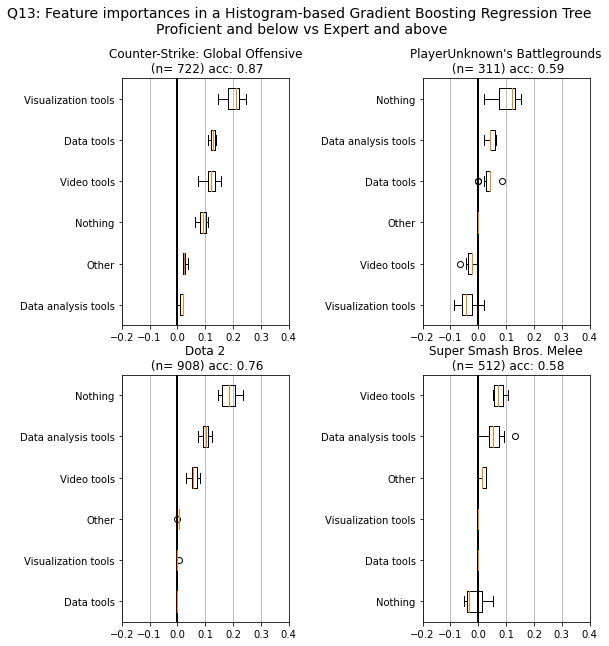

                         0    1      2      3
Data tools           0.000  0.0  0.008  0.128
Visualization tools  0.038  0.0  0.058  0.202
Video tools          0.063  0.0  0.000  0.118
Data analysis tools  0.045  0.0  0.000  0.013
Nothing              0.000  0.0  0.011  0.090
                         0    1      2      3
Data tools           0.038  0.0  0.000  0.000
Visualization tools  0.000  0.0  0.010  0.001
Video tools          0.000  0.0  0.024  0.058
Data analysis tools  0.041  0.0  0.047  0.100
Nothing              0.000  0.0  0.018  0.187
                         0      1      2      3
Data tools           0.115  0.017  0.000  0.037
Visualization tools  0.137  0.000  0.176  0.000
Video tools          0.017  0.029  0.000  0.000
Data analysis tools  0.080  0.078  0.089  0.046
Nothing              0.000  0.000  0.108  0.104
                         0      1      2      3
Data tools           0.000  0.060  0.000  0.000
Visualization tools  0.000  0.000  0.000  0.000
Video tools     

In [750]:
q13Params = {'l2_regularization':0.2, 'learning_rate':0.2, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':5}
q13importances = getImportances2(qdf, qnum, orderB, q13Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

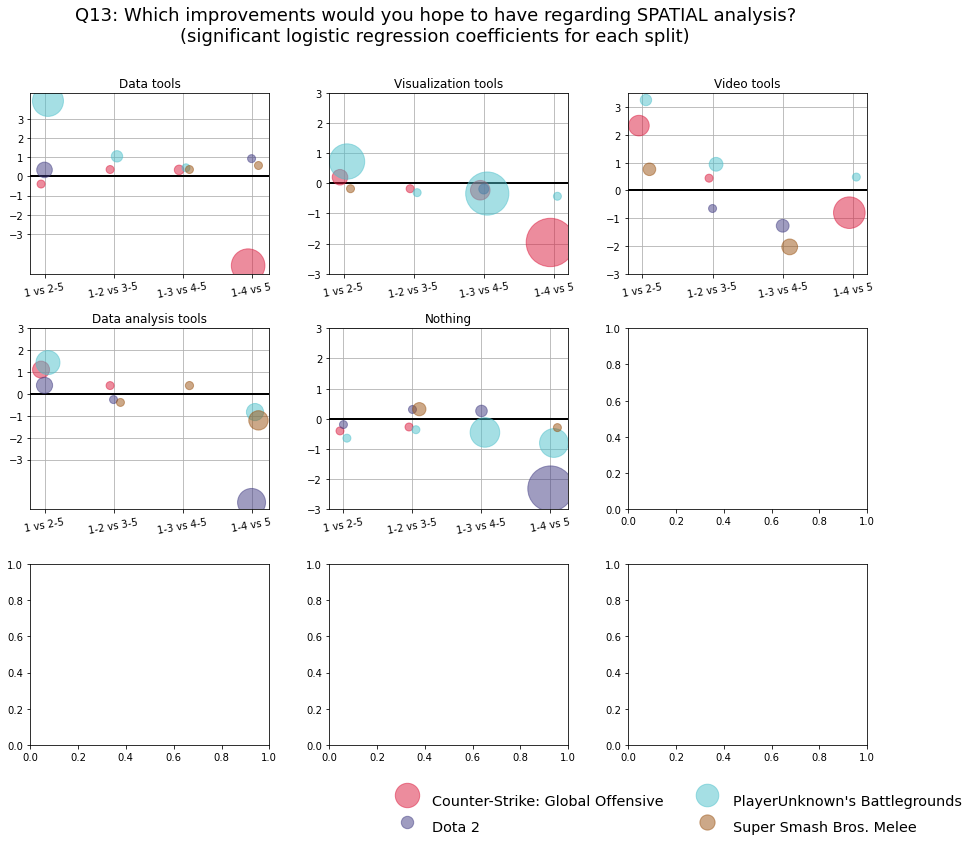

In [751]:
ScatterPlotImportances(suptitle, orderB, qnum, q13LogRegCollection, q13importances,gameList)

<Figure size 432x288 with 0 Axes>

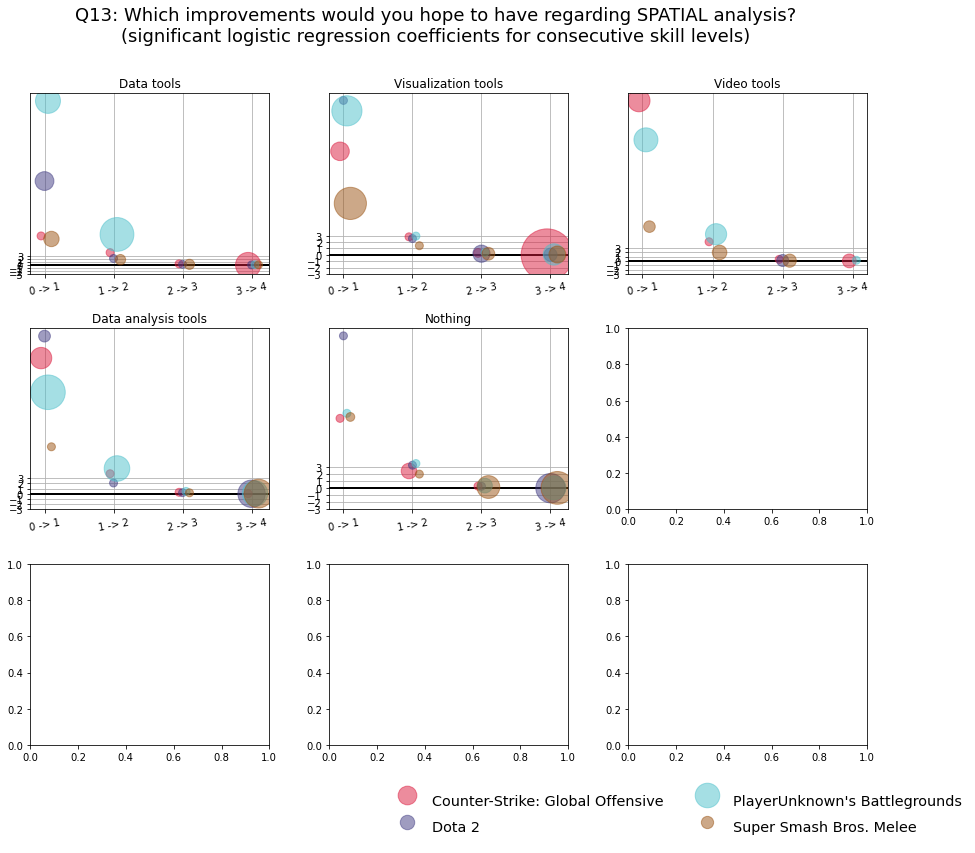

In [538]:
ScatterPlotImportances(suptitle, orderB, qnum, q13oddratios, q13importances,gameList)

<Figure size 432x288 with 0 Axes>

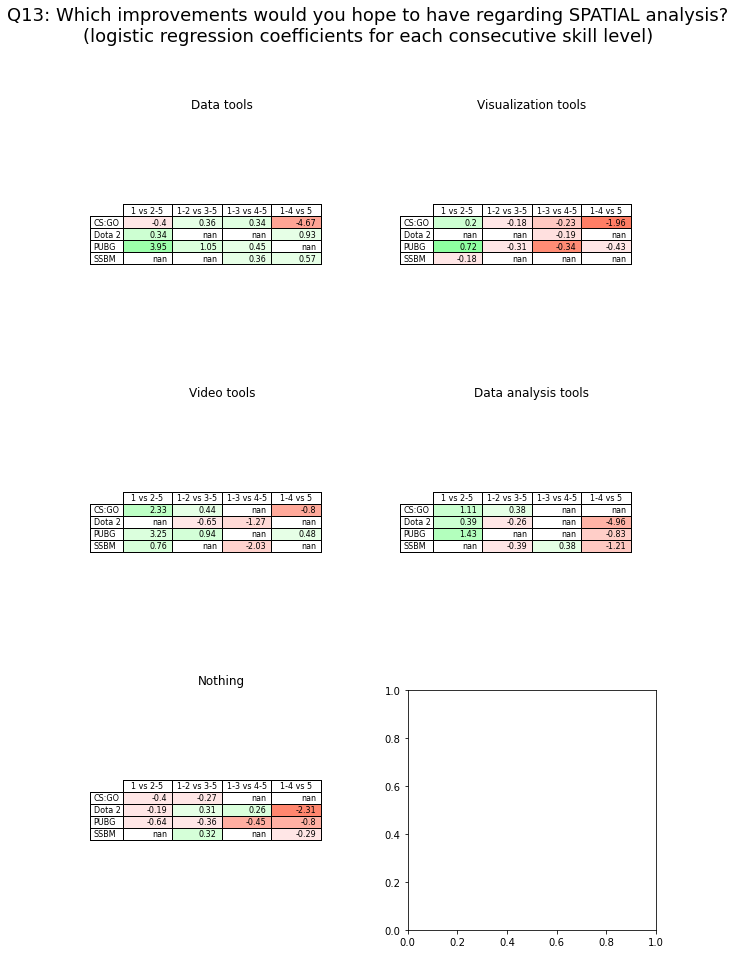

In [752]:
TablePlotImportances(suptitle, orderB,qnum, q13LogRegCollection, q13importances,gameList)

In [967]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[0]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [968]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5616438356164384
[[ 0.55238729  0.11735124 -0.50758039 -0.6411622   0.50843012 -0.02940623]
 [-0.47709373  0.02141375 -0.23172621  0.05163917  0.05916415  0.57700181]
 [ 0.17079753  0.09083075  0.06135216  0.25097436  0.07118677 -0.64455192]
 [ 0.36840032 -0.01075222  0.15002859 -0.07726145  0.07142484 -0.50121916]
 [-0.6144914  -0.21884352  0.52792585  0.41581012 -0.71020588  0.5981755 ]]


In [1100]:
# Ordinal logistic regression

In [1103]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB].drop('Other',axis=1),
                        distr='probit',
                        )

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

Optimization terminated successfully.
         Current function value: 1.290732
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -401.42
Model:                   OrderedModel   AIC:                             820.8
Method:            Maximum Likelihood   BIC:                             854.5
Date:                Mon, 01 Feb 2021                                         
Time:                        11:23:19                                         
No. Observations:                 311                                         
Df Residuals:                     302                                         
Df Model:                           9                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Data tools                      0.4780      0.397      1.206      0.228      -0.299       1.255
Visualization tools             0.0226      0.386      0.058      0.953      -0.733       0.778
Video tools                     0.4095      0.420      0.975      0.330      -0.414       1.233
Data analysis tools             0.2027      0.406      0.500      0.617      -0.592       0.998
Nothing                         0.0196      0.388      0.050      0.960      -0.741       0.781
Novice/Advanced beginner       -1.5293      0.383     -3.989      0.000      -2.281      -0.778
Advanced beginner/Competent    -0.1959      0.137     -1.427      0.153      -0.465       0.073
Competent/Proficient            0.3092      0.067      4.589      0.000       0.177       0.441
Proficient/Expert               0.0290      0.103      0.281      0.779      -0.173       0.232
===============================================================================================
"""

In [1104]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB].drop('Other',axis=1),
                        distr='logit')

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:           orderedSkill   Log-Likelihood:                -401.56
Model:                   OrderedModel   AIC:                             821.1
Method:            Maximum Likelihood   BIC:                             854.8
Date:                Mon, 01 Feb 2021                                         
Time:                        11:23:40                                         
No. Observations:                 311                                         
Df Residuals:                     302                                         
Df Model:                           9                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Data tools                      0.8397      0.722      1.163      0.245      -0.576       2.255
Visualization tools             0.0279      0.706      0.039      0.969      -1.356       1.412
Video tools                     0.6991      0.766      0.913      0.361      -0.802       2.200
Data analysis tools             0.3718      0.740      0.503      0.615      -1.078       1.821
Nothing                         0.0831      0.711      0.117      0.907      -1.310       1.477
Novice/Advanced beginner       -2.7283      0.716     -3.808      0.000      -4.133      -1.324
Advanced beginner/Competent     0.4632      0.150      3.092      0.002       0.170       0.757
Competent/Proficient            0.8053      0.071     11.390      0.000       0.667       0.944
Proficient/Expert               0.6278      0.113      5.552      0.000       0.406       0.849
===============================================================================================
"""

In [ ]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

In [546]:
qdf['Q5Code'] = qdf.apply(lambda row: Q5AnswersToCodes(row), axis=1)
for game in gameList:
    print("")
    print("--------------------------------------------------------------")
    print(game)
    krdf = qdf.loc[qdf['Q1']==game]
    
    for item in orderB:
        #MediansAndMeans(krdf, 'Q5Code', item)
        #KruskalTest(krdf, 'Q5Code', item)
        print("# "+item)
        NonParametricCorrelations(krdf['Q5Code'],krdf[item])


--------------------------------------------------------------
Counter-Strike: Global Offensive
# Data tools
Spearmans correlation coefficient: 0.053
Samples are uncorrelated (fail to reject H0) p=0.157
Kendall correlation coefficient: 0.049
Samples are uncorrelated (fail to reject H0) p=0.157
# Visualization tools
Spearmans correlation coefficient: -0.028
Samples are uncorrelated (fail to reject H0) p=0.460
Kendall correlation coefficient: -0.026
Samples are uncorrelated (fail to reject H0) p=0.459
# Video tools
Spearmans correlation coefficient: 0.053
Samples are uncorrelated (fail to reject H0) p=0.151
Kendall correlation coefficient: 0.050
Samples are uncorrelated (fail to reject H0) p=0.151
# Data analysis tools
Spearmans correlation coefficient: 0.022
Samples are uncorrelated (fail to reject H0) p=0.564
Kendall correlation coefficient: 0.020
Samples are uncorrelated (fail to reject H0) p=0.564
# Nothing
Spearmans correlation coefficient: -0.047
Samples are uncorrelated (fail to 

In [547]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Accuracy: 0.59375
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best model: 
Accuracy: 0.59375
Data tools: 0.69
Visualization tools: 0.0
Video tools: 0.2
Data analysis tools: 0.1
Nothing: 0.01
Other: 0.0


In [548]:
best13 = best_random
best13

GradientBoostingRegressor(learning_rate=0.01, max_depth=90, max_features='auto',
                          n_estimators=40)

In [829]:
# HistGradienBoostingClassifier! Multiple levels so this is better!

In [997]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=5)

# Create a base model for comparison 
print("Base model: ")
base_model = HistGradientBoostingClassifier(learning_rate=0.1, max_depth=2, random_state=5)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train,X_test,y_test)
print(base_preds)


Base model: 
0.5342465753424658


In [998]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(base_model, X_test, y_test, n_repeats=10, random_state=0)
print(imps.importances_mean)
print(imps.importances_std)


[0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0.]


In [999]:
# Print the importance scores for each individual variable
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps.importances_mean[i],3)))
    i+=1

Data tools: 0.0
Visualization tools: 0.0
Video tools: 0.0
Data analysis tools: 0.0
Nothing: 0.0
Other: 0.0


# Question 14. Tell about scenario where spatial analysis was beneficial

In [208]:
qnum = 'Q14'
suptitle = "Q14: HTell about scenario where spatial analysis was beneficial"

qdf = df[['Q1','Q5',qnum]]

In [183]:
qdf.head()

,Q1,Q5,Q14
0,Counter-Strike: Global Offensive,Novice,Knowing where the enemy was coming from from s...
1,Counter-Strike: Global Offensive,Advanced beginner,"knowing where the enemies can be, rotations, etc"
2,Counter-Strike: Global Offensive,Advanced beginner,Understanding which weapon is most effective t...
3,Counter-Strike: Global Offensive,Advanced beginner,mapping aim locations
4,Counter-Strike: Global Offensive,Advanced beginner,"Building tactics, game sense."


In [184]:
# METHOD BY: Praveen Dubey
# https://towardsdatascience.com/understand-text-summarization-and-create-your-own-summarizer-in-python-b26a9f09fc70

from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance
import numpy as np
import networkx as nx
import nltk
import re
 
def read_article(qdf, qnum):
    filedata = qdf.loc[qdf['Q1']==gameList[0]].loc[qdf['Q5']==skillList[1]][qnum].tolist()
    #articleb = [str(row).split(". ") for row in filedata]
    articleb= ""
    for row in filedata:
        # eliminate rows with short answers
        if len(str(row).split(" "))>=5:
            articleb = articleb + " " + row
    article = str(articleb).split(".")
    sentences = []

    for sentence in article:
        sentences.append(sentence.replace("[^a-zA-Z]", " ").split(" "))
    #sentences.pop()
    
    return sentences

def read_summary(fulltext):
    article = str(fulltext).split(".")
    sentences = []

    for sentence in article:
        sentences.append(sentence.replace("[^a-zA-Z]", " ").split(" "))
    #sentences.pop()
    
    return sentences


def sentence_similarity(sent1, sent2, stopwords=None):
    if stopwords is None:
        stopwords = []
 
    sent1 = [w.lower() for w in sent1]
    sent2 = [w.lower() for w in sent2]
 
    all_words = list(set(sent1 + sent2))
 
    vector1 = [0] * len(all_words)
    vector2 = [0] * len(all_words)
 
    # build the vector for the first sentence
    for w in sent1:
        if w in stopwords:
            continue
        vector1[all_words.index(w)] += 1
 
    # build the vector for the second sentence
    for w in sent2:
        if w in stopwords:
            continue
        vector2[all_words.index(w)] += 1
 
    return 1 - cosine_distance(vector1, vector2)
 
def build_similarity_matrix(sentences, stop_words):
    # Create an empty similarity matrix
    similarity_matrix = np.zeros((len(sentences), len(sentences)))
 
    for idx1 in range(len(sentences)):
        for idx2 in range(len(sentences)):
            if idx1 == idx2: #ignore if both are same sentences
                continue 
            similarity_matrix[idx1][idx2] = sentence_similarity(sentences[idx1], sentences[idx2], stop_words)

    return similarity_matrix


def generate_summary(qdf,qnum, top_n=5):
    nltk.download('stopwords')
    stop_words = stopwords.words('english')
    summarize_text = []

    # Step 1 - Read text anc split it
    sentences =  read_article(qdf, qnum)

    # Step 2 - Generate Similary Martix across sentences
    sentence_similarity_martix = build_similarity_matrix(sentences, stop_words)

    # Step 3 - Rank sentences in similarity martix
    sentence_similarity_graph = nx.from_numpy_array(sentence_similarity_martix)
    scores = nx.pagerank(sentence_similarity_graph)

    # Step 4 - Sort the rank and pick top sentences
    ranked_sentence = sorted(((scores[i],s) for i,s in enumerate(sentences)), reverse=True)      

    for i in range(top_n):
        summarize_text.append(" ".join(ranked_sentence[i][1]))

    # Step 5 - Offcourse, output the summarize texr
    print("Summarize Text: \n", ". ".join(summarize_text))

def summarize_summary(fulltext, top_n=5):
    nltk.download('stopwords')
    stop_words = stopwords.words('english')
    summarize_text = []

    # Step 1 - Read text anc split it
    sentences =  read_summary(fulltext)

    # Step 2 - Generate Similary Martix across sentences
    sentence_similarity_martix = build_similarity_matrix(sentences, stop_words)

    # Step 3 - Rank sentences in similarity martix
    sentence_similarity_graph = nx.from_numpy_array(sentence_similarity_martix)
    scores = nx.pagerank(sentence_similarity_graph)

    # Step 4 - Sort the rank and pick top sentences
    ranked_sentence = sorted(((scores[i],s) for i,s in enumerate(sentences)), reverse=True)      

    for i in range(top_n):
        summarize_text.append(" ".join(ranked_sentence[i][1]))

    # Step 5 - Offcourse, output the summarize texr
    print("Summarize Text: \n", ". ".join(summarize_text))


In [185]:
# let's begin
generate_summary(qdf,qnum, 8)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tipe_\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Summarize Text: 
 . .   One big aspect of the game is gaining information about the enemy strategy.  Where players tend to be.   Timing analysis (Where people will be when) which is related to space.  Enemy attacks to A.  Seeing where I was aiming.  Thats the attraction


In [41]:
# STACKABUSE METHOD
filedata = qdf.loc[qdf['Q1']==gameList[0]].loc[qdf['Q5']==skillList[1]][qnum].tolist()
articleb= ""
for row in filedata:
    # eliminate rows with short answers
    if len(str(row).split(" "))>=5:
        articleb = articleb + " " + row




In [186]:
def MakeArticleText(articleb):
    article_text = re.sub(r'\[[0-9]*\]', ' ', articleb)
    article_text = re.sub(r'\s+', ' ', article_text)
    return article_text

In [187]:
def MakeFormattedArticleText(articleb):
    formatted_article_text = re.sub('[^a-zA-Z]', ' ', articleb)
    formatted_article_text = re.sub(r'\s+', ' ', formatted_article_text)
    return formatted_article_text

In [188]:
def MakeSentenceList(article_text):
    sentence_list = nltk.sent_tokenize(article_text)
    return sentence_list

In [189]:
def MakeWordFrequencies(formatted_article_text):
    stopwords = nltk.corpus.stopwords.words('english')

    word_frequencies = {}
    for word in nltk.word_tokenize(formatted_article_text):
        if word not in stopwords:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1
    return word_frequencies

In [190]:
def AddKeys(word_frequencies):
    maximum_frequncy = max(word_frequencies.values())

    for word in word_frequencies.keys():
        word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
    return word_frequencies

In [191]:
def MakeSentenceScores(sentence_list,word_frequencies):
    sentence_scores = {}
    for sent in sentence_list:
        for word in nltk.word_tokenize(sent.lower()):
            if word in word_frequencies.keys():
                if len(sent.split(' ')) < 30:
                    if sent not in sentence_scores.keys():
                        sentence_scores[sent] = word_frequencies[word]
                    else:
                        sentence_scores[sent] += word_frequencies[word]
    return sentence_scores

In [220]:
def SummarizeStackabuse(sentence_scores):
    import heapq
    summary_sentences = heapq.nlargest(5, sentence_scores, key=sentence_scores.get)

    summary = ' '.join(summary_sentences)
    return summary

In [193]:
def MakeSummaryStackabuse(fulltext):
    article_text = MakeArticleText(fulltext)
    formatted_article_text = MakeFormattedArticleText(fulltext)
    sentence_list = MakeSentenceList(article_text)
    word_frequencies = MakeWordFrequencies(formatted_article_text)
    words_keys = AddKeys(word_frequencies)
    sentence_scores=  MakeSentenceScores(sentence_list,word_frequencies)
    summary = SummarizeStackabuse(sentence_scores)
    return summary
    

In [54]:
generate_summary(qdf,qnum, 10)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tipe_\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Summarize Text: 
 . .   One big aspect of the game is gaining information about the enemy strategy.  Where players tend to be.   Timing analysis (Where people will be when) which is related to space.  Enemy attacks to A.  Seeing where I was aiming.  Thats the attraction.   Spatial Analytics would be very helpful in developing gamesense for CSGO, as the game is very dependant on gamesense.   Learning grenade throwing positions/patterns from videos Grenade explosion range vs


In [55]:
#print(qdf.loc[qdf['Q5']==skillList[0]].loc[qdf['Q1']==gameList[0]][qnum][:10])
csnovice = qdf.loc[qdf['Q5']==skillList[1]].loc[qdf['Q1']==gameList[0]][qnum]
for row in csnovice:
    if len(str(row).split(" "))>=5:
        print(row)
        print("--------------------------------------------")

knowing where the enemies can be, rotations, etc
--------------------------------------------
Understanding which weapon is most effective to use at which distance.
--------------------------------------------
Adversial AI generation based on location of player
--------------------------------------------
Understanding and expecting possible timings of actions from teammates and opponents 
--------------------------------------------
A skybox option for the match replay in game would be good, especially to analyze the merits of specificera utility usage.
--------------------------------------------
Knowing timings for wallbangs in nuke for example during the first few seconds of the round, you can wallbang a CT in heaven from t spawn using a boost.
--------------------------------------------
Minimizing visible hitbox/model of self while maximizing visibility onto possible/known enemy placements
--------------------------------------------
Placing throwable items from one area of the m

In [91]:
from transformers import BartForConditionalGeneration, BartTokenizer, BartConfig

In [92]:
tokenizer=BartTokenizer.from_pretrained('facebook/bart-large-cnn')
model=BartForConditionalGeneration.from_pretrained('facebook/bart-large-cnn')

In [ ]:
article_text

In [98]:
# STACKABUSE METHOD
filedata = qdf.loc[qdf['Q1']==gameList[0]].loc[qdf['Q5']==skillList[1]][qnum].tolist()
articleb= ""
for row in filedata[100:]:
    # eliminate rows with short answers
    if len(str(row).split(" "))>=5:
        articleb = articleb + " " + row

In [99]:
article_text = re.sub(r'\[[0-9]*\]', ' ', articleb)
article_text = re.sub(r'\s+', ' ', article_text)

In [194]:
def encodeBart(article_text):
    # Encoding the inputs and passing them to model.generate()
    inputs = tokenizer.batch_encode_plus([article_text], return_tensors='pt')
    summary_ids = model.generate(inputs['input_ids'], early_stopping=True)
    return summary_ids

In [195]:
def decodeBart(summary_ids):
    # Decoding and printing the summary
    bart_summary = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return bart_summary


In [196]:
def summarizeBart(article_text):
    summary_ids = encodeBart(article_text)
    bart_summary = decodeBart(summary_ids)
    return bart_summary

In [197]:
def summarizeOpenField(qdf, qnum, gameList, skillList, game, skill):
    filedata = qdf.loc[qdf['Q1']==game].loc[qdf['Q5']==skill][qnum].tolist()
    
    # Text variable containing the whole text of all summarized texts of one skill level
    fullText = ""
    
    # 20 answers in one loop are summarized
    loops = len(filedata)//20
    print(str(loops) + " loops will be made")
    lowLim = 0
    
    for n in range(loops):
        print(str(n) + "/" +str(loops))
        upLim = (n+1)*20
        # Choose the 20 answers based on the limits
        partition = filedata[lowLim:upLim]
        articleb= ""
        
        #Go through each answer
        for row in partition:
            # eliminate rows with short answers
            if len(str(row).split(" "))>=5:
                articleb = articleb + " " + row
        
        article_text = re.sub(r'\[[0-9]*\]', ' ', articleb)
        article_text = re.sub(r'\s+', ' ', article_text)
        
        # Summarize using bart
        try:
            oneText = summarizeBart(article_text)
            print(oneText)
            fullText += oneText
        except IndexError as e:
            print(e)
            # Sometimes tokens exceed limit, split into two and process in two parts
            print("error, splitting into two")
            for k in range(2):
                # Choose the 10 answers based on the limits
                if not k:
                    partition = filedata[lowLim:(upLim-10)]
                else:
                    partition = filedata[(upLim -10):upLim]
                    
                articleb= ""

                #Go through each answer
                for row in partition:
                    # eliminate rows with short answers
                    if len(str(row).split(" "))>=5:
                        articleb = articleb + " " + row

                article_text = re.sub(r'\[[0-9]*\]', ' ', articleb)
                article_text = re.sub(r'\s+', ' ', article_text)

                oneText = summarizeBart(article_text)
                print(oneText)
                fullText += oneText      
            
        lowLim = upLim
    
    # Check for even split or if only one is left
    if len(filedata)%20 ==0:
        return fullText
    
    # Final remaining answers are handled
    print("final loop")
    partition = filedata[loops*20:]
    articleb= ""
    for row in partition:
        # eliminate rows with short answers
        if len(str(row).split(" "))>=5:
            articleb = articleb + " " + row
    article_text = re.sub(r'\[[0-9]*\]', ' ', articleb)
    article_text = re.sub(r'\s+', ' ', article_text)
    oneText = summarizeBart(article_text)
    print(oneText)
    fullText += oneText
    return fullText

In [198]:
# DEEP LEARNING METHOD
q14summaries = {}
f= open(MakeFileName(qnum,"summaryText"),"w+")
for game in gameList:
    q14summaries[game] = {}
    print("---------------------- START OF GAME " + game + " ----------------------")
    f.write("---------------------- START OF GAME " + game + " ----------------------")
    
    for skill in skillList:
        print("------------ START OF SKILL " + skill + " ------------")
        f.write("------------ START OF SKILL " + skill + " ------------")
        
        q14summaries[game][skill] = summarizeOpenField(qdf,qnum,gameList,skillList,game,skill)
        f.write(q14summaries[game][skill])
        
        print("------------ END OF SKILL " + skill + " ------------")
        f.write("------------ END OF SKILL " + skill + " ------------")
        
    print("---------------------- END OF GAME " + game + " ----------------------")
    f.write("---------------------- END OF GAME " + game + " ----------------------")
f.close()

---------------------- START OF GAME Counter-Strike: Global Offensive ----------------------
------------ START OF SKILL Novice ------------
2 loops will be made
0/2
A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Knowing how attacker / defender positioning affects fight win-loss percentage. Knowing where to throw smoke and where to shoot through walls. If I get killed from somewhere disproportionately many times Ranges & distances between 2 points & how efficient different weapons would be.
1/2
YPRAC's maps give a good basic idea for the popular maps. Seeing what positions on a map I have most success in, as well as which ones I do not play often and should become more familiar with. Combining player location with where they are looking could help show what areas are covered by CT.
final loop
Learn crucial positions to hold, how certain situations play out & how to succeed when they do. View my death locations on the map an

I can see spatial analytics being very helpful in really specific occasions for individual pro-level players. For instance I can imagine a team prepping for a match against a specific other team and figuring out which spots and angles players of the enemy team are most likely to play/hold. With the right tools, especially for acquiring the required data, there might be more general aspects that could be interesting/useful for amateur player too.
14/18
Having good knowledge of distance is useful for knowing how much damage your weapons will do at different ranges. Some sort of tool to show how far grenades will travel would be useful for learning smoke lineups and popflashes. It could be beneficial to see more data apart from the downloaded demo so you can improve in the weaker areas.
15/18
K/D per unit space over a map has helped me identify where I need to focus improving my methodology for taking fights. In CS:GO, timings are super important, so knowing how long it takes to traverse 

Would love a circle for hero range when you press alt, even in demo mode. Would be nice to know where fights happen and who "wins" them more. Ward heatmaps are a common way to learn the habits of your opponents, new places to ward, or new ideas for where to deward.
7/11
 Positioning is so extremly important in this game, it’s hard for it to not be important. It would be good to know where to stand in certain situations, or what is the max distance I should be from certain enemies when playing different characters. Utilizing range tools in DotA (holding alt), I can easily plan out areas of the map that are safer to ward.
8/11
The map itself although its a feature for the dota plus members the map can show where to pull to make an stack camp and where to put vision to make a play. Identifying player core pattern and most death areas or danger zones based on individual play..predict successful areas to gank and stuff.
9/11
 heatmaps/trails for specific roles would be very informative, i.e

Dota needs postgame analysis of all SPATIAL mechanics. This will allow for more accurate match making. Locations of wards, how to predict and efficiently deward overlay of enemy vision while not seeing enemy vision in replays. Positioning in regards to enemies, team movements around the map at certain times, and micro movements during laning stage.
20/24
A Probability of Dying vs Range to ___ (enemy heroes, specific heroes, etc.) would have been pretty cool to see. In Dota, ward maps can be useful (showing where wards are generally placed) Map data on teamfights and their outcomes could also be useful. Maps that show common warding areas for optimal vision is helpful.
21/24
Any kind of information I have over my enemies is an advantage, even if it's just statistical knowledge. If I know where wards are typically placed on a heatmap by my enemies, I'll have a higher chance at succeeding in something typically considered near-random than normal. Analysing which paths players are likely t

In pubg, if you understand player movement and circle shifts you can get a good position with low risk. I use replay tools to see what I could have done better in game. I can analyze where I should have moved to get the best result and where all the teams can see from their location. Its not easy for me to calculate distance in PUBG. Not sure if this has changed, have not played since april 2020.
4/7
New players could learn advanced mechanics faster. Studying weapon ballistics to identify lead distances when shooting. How teams move in a game. Overall view. Best position for the end fight. It would be nice if I can check data analysis where I've been killed. Example next on the road or how many times I have bad position when I've got killed.
5/7
Knowing certain surface shapes will give big advantages against other players. In knowing "hotspots" of certain maps to position myself and the team better. For PUBG it would be rotations and typical player positions amid certain circumstances.

Knowing if your position is ‘winning’ or ‘losing’ Understanding a sort of heat map in a specific pvp could help so much. Knowing exact hitboxes to know where a move hits, and also knowing where sweet/sour spots are.
1/11
Being able to overlay hitboxes to see which outranges the other would be useful. Realizing that in certain match-ups it can be very beneficial to stay at distances which make an enemy approach react-able Track every time I or my opponent got hit, and see a distribution of our relative distances for each hit.
2/11
Spacial analytics are very important for seeing and understanding a characters moveset, and how to best implement it. All attacks carry different frame data, and some react differently based upon distance, point of contact, or based upon what exact frame makes contact. Learning the ranges where attacks are safe on shield is the key to getting good at neutral in melee.
3/11
A generic punish game for every cardinal di permutation would be fabulous. It would be c

In [164]:
print(q14summaries[gameList[0]][skillList[0]])

A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Knowing how attacker / defender positioning affects fight win-loss percentage. Knowing where to throw smoke and where to shoot through walls. If I get killed from somewhere disproportionately many times Ranges & distances between 2 points & how efficient different weapons would be.YPRAC's maps give a good basic idea for the popular maps. Seeing what positions on a map I have most success in, as well as which ones I do not play often and should become more familiar with. Combining player location with where they are looking could help show what areas are covered by CT.Learn crucial positions to hold, how certain situations play out & how to succeed when they do. View my death locations on the map and analyze where I should watch for enemy players. Correcting your mistakes and recognizing the weaker aspects of your game peeking angles for different parts of the map Estimate where

In [165]:
doubleSummary = summarizeBart(q14summaries[gameList[0]][skillList[0]])

In [166]:
print(doubleSummary)

A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Knowing how attacker / defender positioning affects fight win-loss percentage. Knowing where to throw smoke and where to shoot through walls. If I get killed from somewhere disproportionately many times. Ranges & distances between 2 points & how efficient different weapons would be.


In [170]:
summarize_summary(q14summaries[gameList[0]][skillList[0]], top_n=5)

Summarize Text: 
  Seeing what positions on a map I have most success in, as well as which ones I do not play often and should become more familiar with.  Correcting your mistakes and recognizing the weaker aspects of your game peeking angles for different parts of the map Estimate where opponent might be at certain time I honestly have no clue what that is lol.  Knowing where to throw smoke and where to shoot through walls.  View my death locations on the map and analyze where I should watch for enemy players.  Knowing how attacker / defender positioning affects fight win-loss percentage


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tipe_\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [168]:
sasummary = MakeSummaryStackabuse(q14summaries[gameList[0]][skillList[0]])

In [169]:
print(sasummary)

A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Seeing what positions on a map I have most success in, as well as which ones I do not play often and should become more familiar with. View my death locations on the map and analyze where I should watch for enemy players. Knowing how attacker / defender positioning affects fight win-loss percentage. Knowing where to throw smoke and where to shoot through walls.


In [217]:
pubgfix = q14summaries[gameList[2]][skillList[4]]
splitpubg = pubgfix.split("CNN.com will")
pubgfix = splitpubg[0]
pubgfix

"Knowing the map and playable/non playable areas in the map is literally do or die. In Competitive PUBG, knowing all the tiny terrain pieces and ridges are really helpful especially when you're running out of options. It is critical for building strategies in a lobby to understand how the other team is prioritizing highground, central compounds, playing edge, doing splits."

In [218]:
q14summaries[gameList[2]][skillList[4]] = pubgfix

In [221]:
q14SummaryBartSummary = {}
q14SummaryNLTKSummary = {}
f= open(MakeFileName("Q14","summary_summary"),"w+")
for game in gameList:
    q14SummaryBartSummary[game] = {}
    q14SummaryNLTKSummary[game] = {}
    print("---------------------- START OF GAME " + game + " ----------------------" + "\n")
    f.write("---------------------- START OF GAME " + game + " ----------------------"+ "\n")
    
    for skill in skillList:
        print("------------ START OF SKILL " + skill + " ------------" + "\n")
        f.write("------------ START OF SKILL " + skill + " ------------"+ "\n")
        print("---- BART Summary ----"+ "\n")
        f.write("---- BART Summary ----"+ "\n")
        try:
            q14SummaryBartSummary[game][skill] = summarizeBart(q14summaries[game][skill])
            f.write(q14SummaryBartSummary[game][skill] + "\n")
            print(q14SummaryBartSummary[game][skill]+ "\n")
            
        except IndexError as e:
            print(e)
            print("ERROR; SPLITTING IN TWO")
            splitText = q14summaries[game][skill].split(". ")
            firstHalf = ""
            secondHalf = ""
            for i in range(len(splitText)):
                if i < len(splitText)//2:
                    firstHalf += splitText[i] +". "
                else:
                    secondHalf += splitText[i] + ". "
            
            joinText = summarizeBart(firstHalf)+" "
            joinText += summarizeBart(secondHalf)
            q14SummaryBartSummary[game][skill] = joinText
            f.write(q14SummaryBartSummary[game][skill] + "\n")
            print(q14SummaryBartSummary[game][skill]+ "\n")

        
        print("---- NLTK Summary ----"+ "\n")
        f.write("---- NLTK Summary ----"+ "\n")
        
        q14SummaryNLTKSummary[game][skill]= MakeSummaryStackabuse(q14summaries[game][skill])
        f.write(q14SummaryNLTKSummary[game][skill]+ "\n")
        print(q14SummaryNLTKSummary[game][skill]+ "\n")
        
        print("------------ END OF SKILL " + skill + " ------------"+ "\n")
        f.write("------------ END OF SKILL " + skill + " ------------"+ "\n")
        
    print("---------------------- END OF GAME " + game + " ----------------------"+ "\n")
    f.write("---------------------- END OF GAME " + game + " ----------------------"+ "\n")
f.close()

---------------------- START OF GAME Counter-Strike: Global Offensive ----------------------

------------ START OF SKILL Novice ------------

---- BART Summary ----

A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Knowing how attacker / defender positioning affects fight win-loss percentage. Knowing where to throw smoke and where to shoot through walls. If I get killed from somewhere disproportionately many times. Ranges & distances between 2 points & how efficient different weapons would be.

---- NLTK Summary ----

A tool that analyzes available angles (angle meaning sightline )from certain positions could be very helpful. Seeing what positions on a map I have most success in, as well as which ones I do not play often and should become more familiar with. View my death locations on the map and analyze where I should watch for enemy players. Knowing how attacker / defender positioning affects fight win-loss percentage. Kno

Ward location heatmaps, Time and place for rotations of supports f.e. Heat map of specific role position at a given time Warding spots in Dota 2 can be studied by observing where profesional players prefer to place their wards and this can be applied by other players. Detailed after-game tabulation of the game.

---- NLTK Summary ----

They have common ward (an item that makes the map able to be seen at a fixed location for some time) location suggestions which is great. Analysing your movement here can be beneficial to your gameplay, however can't see a tool helping to improve the game itself. No amount of 3rd party can make a person good, as shown by the fact cheaters get wrecked in high mmr cause they cannot control their characters. Incorporating more in-game learning tools to help teach the community as a whole will continue to grow the average skill level of the dota community. Ward heatmaps, where winning team fights most likely take place.

------------ END OF SKILL Proficient 

Hot box visualizers s as a native function would be amazing. Knowing what options I have to hit my enemy with and their ranges in different situations. Heat map could show naturally advantageous positions on a map. Or where KO's most often happen. Learning timers for Randall on Yoshi’s how to recover off stage.

---- NLTK Summary ----

Characters can conserve their momentum in smash through certain actions, being able to determine the optimal inputs for such velocity storage will help players tighten their technical skills. Identifying danger zones against specific characters, ie where kills or strong combos begin most frequently.Hot box visualizers s as a native function would be amazing. The Slippi mod for Super Smash Bros Melee allows for reviewing gameplay and analysis of openings, neutral exchanges won, and damage done. Heat map could show naturally advantageous positions on a map Or where KO's most often happen. Knowing what options I have to hit my enemy with and their ranges in

In [211]:
qdf.loc[qdf['Q1']==gameList[2]].loc[qdf['Q5']==skillList[4]]

,Q1,Q5,Q14
1855,PlayerUnknown's Battlegrounds,Expert,Effective holding agles from compounds with pe...
1857,PlayerUnknown's Battlegrounds,Expert,it is important to understand all areas of the...
1858,PlayerUnknown's Battlegrounds,Expert,All of PUBG
1859,PlayerUnknown's Battlegrounds,Expert,It's really beneficial when you can pin point ...
1860,PlayerUnknown's Battlegrounds,Expert,Team positioning during the game
1861,PlayerUnknown's Battlegrounds,Expert,Understanding better what kind of splits(posit...
1862,PlayerUnknown's Battlegrounds,Expert,"PUBG, Understanding where games end most of th..."
1863,PlayerUnknown's Battlegrounds,Expert,Rotations around compounds that may or not be ...
1865,PlayerUnknown's Battlegrounds,Expert,Understanding the map and playable/non playabl...
1866,PlayerUnknown's Battlegrounds,Expert,"Maps within PUBG, knowing space and dips withi..."


# Question 15: Tell about your thoughts on the example visualization

In [199]:
qnum = 'Q15'
suptitle= "Q15: Tell about your thoughts on the example visualization"

qdf = df[['Q1','Q5',qnum]]

In [200]:
qdf.head()

,Q1,Q5,Q15
0,Counter-Strike: Global Offensive,Novice,I feel like the movement data is more usefull ...
1,Counter-Strike: Global Offensive,Advanced beginner,"Every match its different, its interesting but..."
2,Counter-Strike: Global Offensive,Advanced beginner,They make sense and are what I'd expect to see.
3,Counter-Strike: Global Offensive,Advanced beginner,nice
4,Counter-Strike: Global Offensive,Advanced beginner,"Interesting, not sure how I, as an individual ..."


In [201]:
# DEEP LEARNING METHOD
q15summaries = {}
f= open(MakeFileName(qnum,"summaryText"),"w+")
for game in gameList:
    q15summaries[game] = {}
    print("---------------------- START OF GAME " + game + " ----------------------")
    f.write("---------------------- START OF GAME " + game + " ----------------------")
    
    for skill in skillList:
        print("------------ START OF SKILL " + skill + " ------------")
        f.write("------------ START OF SKILL " + skill + " ------------")
        
        q15summaries[game][skill] = summarizeOpenField(qdf,qnum,gameList,skillList,game,skill)
        f.write(q15summaries[game][skill])
        
        print("------------ END OF SKILL " + skill + " ------------")
        f.write("------------ END OF SKILL " + skill + " ------------")
        
    print("---------------------- END OF GAME " + game + " ----------------------")
    f.write("---------------------- END OF GAME " + game + " ----------------------")
f.close()

---------------------- START OF GAME Counter-Strike: Global Offensive ----------------------
------------ START OF SKILL Novice ------------
2 loops will be made
0/2
The aim heat map will provide insight on aim patterns and biases, and the movement heat map makes learning highly traversed areas easier and faster. The CS:GO information is useful. It seems that people don't go for the centre of mass a lot and try to land headshots. The movement tool allows you to understand maps better.
1/2
The heatmap was perfect. I would love to use it to analyse and improve. The movement aggregation was confusing because it looked like cars in a nightime highway. It would be better if it wasn't so overlapped. Maybe it would work better with tracers with a moving 2/3 dimensional icon representing a player.
final loop
Player movement aggregation map would be beneficial towards team play review and player aim heatmap is more useful for personal analysis. useful for strategizing and analysis for improveme

The aim heatmap is not very helpful, the visualisation is too specific: positioning, choice of weapon and the current point in the spray down all affect it. The movement aggregation map is really interesting, because it gives more information about how a map is played, what the most likely rotations and chosen paths are and so on.
15/18
The aim heatmap is useful for showing one's tendencies to over or under aim. The movement map is good for showing players where they will get the most engagements/meeting points and where to spam through smokes. The heatmap might be helpful to determine your sprayaccuracy with different weapons and the other one could maybe be used for demoanalysis.
16/18
The aim map doesn't really mean much, I think. Looks good, overlay of Ct and t on the same map is optimal the cobble movement map could be useful if it was for a map in the competitive map pool. People hold their crosshairs too low when taking a fight initially. Head armor not as important.
17/18
The p

The 'encounter heatmap' for DotA is from over seven years ago, due to the layout. Looks like a normal Radiant Dominant match, Early stages; Players kept their focus on their lanes mostly. Moving towards middle game things moved to Dire map since they are dominating. In final picture Teams just goes for mid to end the game since there is no point moving to other lanes.
7/11
The first one for Dota is good, specially the heatmap. Obvious to anyone who has played more than 100 hours and not very helpful. The other one is crap. Info that could be of great use and benefit if one put in the time and effort to study Is helpful if can be visualised like this for each fane.
8/11
 Heat maps might be more useful for advanced players if we could see the plot with a game-time slider and on a per-rank basis. 1st permits to understand what happens in different time of game or different rank strategies. 2 is a must-know for every player. Second map really gives nothing New.
9/11
Heatmaps are for more a

It would be better to see heat maps of pro players' movements/hero-specific movements during different time intervals. Tree pathing maps are very useful but much better, detailed ones can be found online with info like where to enter/exit, useful trees to quell for juking, etc.
18/24
 heatmaps are very effective at revealing what parts of the map are more preferred, either by design or by player. Terrain map misses asymmetric vision dynamic, and is useful only for reference/beginners, pathing level decisions have to be faster than that, must be unconscious. It's basic knowledge for anyone who've played more than once.
19/24
The heatmap seems pretty useful to me, since it can help to identify important/dangerous areas of the map at the various times. The pathable areas map is very useful in determining where you can and can't go (hidden paths through trees, up and down between different z-levels). Very useful for optimizing gameplay.
20/24
The data shown is definetly something I already

The PUBG chicken dinner heatmap is relatively good for showing where zones are likely to be, and therefore you can take this into account when planning rotations and team positioning. Video is less useful, it doesn't really show anything as you can't tell where zone was, and this is such a driving factor in pubg.
2/7
I'm not sure the pictures give much meaningful information that a seasoned player doesn't already know from the game. The movements of 10,000 players doesn't seem too useful as it's not in relation to airplane path or circle locations. The heat map help show familiar patterns in zones so you have a general idea of where its going to end.
3/7
The first one could help figure out hot drop locations or where the final circles, where the most kills are usually gotten, tend to go. The heat map appears to be mostly random in placements, outside of the main algorithmic feature of the zone centres, which always have to be inland.
4/7
The heatmaps suggest movement goals based on his

The Puff heatmap is very interesting. Complicated, very hard to understand as a novice. Hard to make good use of information like where puff gets the most kills without other context like kill percentages, frame timings, etc. probably only helpful at really high levels of play Knowing my options OOS and being able to see the potential consequences of each option would be extremely helpful.
------------ END OF SKILL Advanced beginner ------------
------------ START OF SKILL Competent ------------
11 loops will be made
0/11
Confusing at a glance and only slightly informative once understood tbh the first dota heat maps didn't look that useful because it show both teams in the same heat map. It might be more useful if it showed the movement of the different teams separate or even for different characters.
1/11
The fox one is especially useful as it gives a sense of how to attack a shielding opponent. The Jigglypuff data is interesting but not specifically useful. The OOS options visualiza

In [222]:
q15SummaryBartSummary = {}
q15SummaryNLTKSummary = {}
f= open(MakeFileName("Q15","summary_summary"),"w+")
for game in gameList:
    q15SummaryBartSummary[game] = {}
    q15SummaryNLTKSummary[game] = {}
    print("---------------------- START OF GAME " + game + " ----------------------" + "\n")
    f.write("---------------------- START OF GAME " + game + " ----------------------"+ "\n")
    
    for skill in skillList:
        print("------------ START OF SKILL " + skill + " ------------" + "\n")
        f.write("------------ START OF SKILL " + skill + " ------------"+ "\n")
        print("---- BART Summary ----"+ "\n")
        f.write("---- BART Summary ----"+ "\n")
        try:
            q15SummaryBartSummary[game][skill] = summarizeBart(q15summaries[game][skill])
            f.write(q15SummaryBartSummary[game][skill] + "\n")
            print(q15SummaryBartSummary[game][skill]+ "\n")
            
        except IndexError as e:
            print(e)
            print("ERROR; SPLITTING IN TWO")
            splitText = q15summaries[game][skill].split(". ")
            firstHalf = ""
            secondHalf = ""
            for i in range(len(splitText)):
                if i < len(splitText)//2:
                    firstHalf += splitText[i] +". "
                else:
                    secondHalf += splitText[i] + ". "
            
            joinText = summarizeBart(firstHalf)+" "
            joinText += summarizeBart(secondHalf)
            q15SummaryBartSummary[game][skill] = joinText
            f.write(q15SummaryBartSummary[game][skill] + "\n")
            print(q15SummaryBartSummary[game][skill]+ "\n")

        
        print("---- NLTK Summary ----"+ "\n")
        f.write("---- NLTK Summary ----"+ "\n")
        
        q15SummaryNLTKSummary[game][skill]= MakeSummaryStackabuse(q15summaries[game][skill])
        f.write(q15SummaryNLTKSummary[game][skill]+ "\n")
        print(q15SummaryNLTKSummary[game][skill]+ "\n")
        
        print("------------ END OF SKILL " + skill + " ------------"+ "\n")
        f.write("------------ END OF SKILL " + skill + " ------------"+ "\n")
        
    print("---------------------- END OF GAME " + game + " ----------------------"+ "\n")
    f.write("---------------------- END OF GAME " + game + " ----------------------"+ "\n")
f.close()

---------------------- START OF GAME Counter-Strike: Global Offensive ----------------------

------------ START OF SKILL Novice ------------

---- BART Summary ----

The aim heat map will provide insight on aim patterns and biases, and the movement heat map makes learning highly traversed areas easier and faster. It seems that people don't go for the centre of mass a lot and try to land headshots. The movement aggregation was confusing because it looked like cars in a nightime highway.

---- NLTK Summary ----

The aim heat map will provide insight on aim patterns and biases, and the movement heat map makes learning highly traversed areas easier and faster. Aim is concentrated on the head area and movement is concentrated in the sites. The movement aggregation was confusing because it looked like cars in a nightime highway. The movement tool allows you to understand maps better.The heatmap was perfect. It seems that people don't go for the centre of mass a lot and try to land headshots

Pathable data map on imgur isn't very useful for high level players. Pathable areas- not very helpful, not detailed enough and hard to understand if you dont put it next to the original map. Heat map might be useful if specific to each of the 5 Dota 2 positions are particular points in the game.

---- NLTK Summary ----

The pathing map is mostly useless for dota unless you are very new, but the encounter heat map is and always will be useful. Pathable areas map is actually very easy to understand and very helpful for any new players, because many of the players doesn't know all the paths you can go. The heat maps based on time period in game are super interesting although not particularly insightful if you already know a lot about the game.The heatmaps are quite obvious. Pathable data map on imgur isn't very useful for high level players. Heatmap for encountering might be usefull, when taking data from spesific games, but the pathable areas map in useless.

------------ END OF SKILL Pr

Fox's hitbox spatial visualization is clear, well labeled, and helpful to understanding fox's options with respect of frames and distance. Jigglypuff kills more on the right side of the stage due to the asymetry of the GameCube controller. The Fox options are interesting, indicating where you could be more likely to get a punish out of shield. The puff killmap is fascinating and also indicative of puff gameplay.

---- NLTK Summary ----

Jigglypuff kill heatmap is interesting but not particularly helpful to understand kill options for puff and how often they are used. You can lose an exchange anywhere.The hitbox visualization is definitely useful, the jigglypuff killing blows heatmap not so much to me as an average player. Ikneedata is always hard to parse, but it's accurate; the second figure is much easier to parse in comparison.I like the out of shield options visualization. The heatmap from ikneedata is helpful to learn threat ranges for OOS options, which can definitely help a lot 

## Question 16: If you could have access to tools for this kind of spatial analysis of your own play data, would you use them?

In [111]:
orderA = ["Would use often","Would use sometimes","Probably would not use","Would not use"]
orderB = ["Often", "Sometimes","Probably not","Never"]


suptitle = 'Q16: If you had access to spatial analysis tools of your own play data, would you use them?'
qnum = 'Q16'
qdf = SetupDf(df,qnum,orderA,orderB)

countsB=MakeCountsB(qdf, orderB)

In [112]:
countsDf = MakeCountsDb(qdf,skillList,gameList,qnum,orderB)
countsDf.to_csv(MakeFileNameCsv(qnum,"skillCounts"))

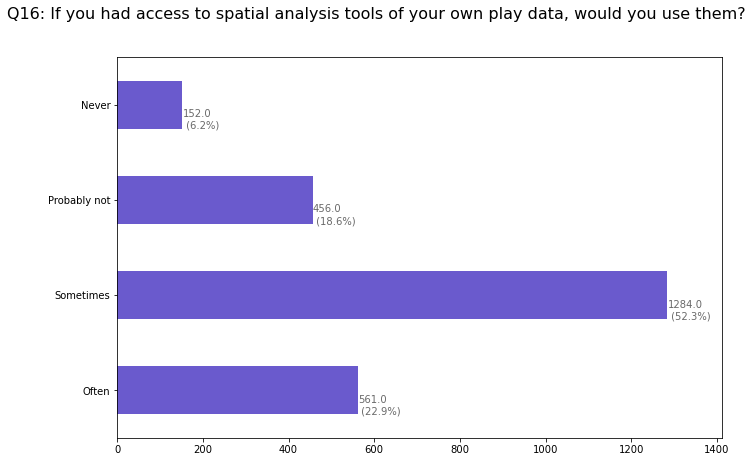

In [732]:
PlotBars(qdf,qnum,suptitle,countsB)

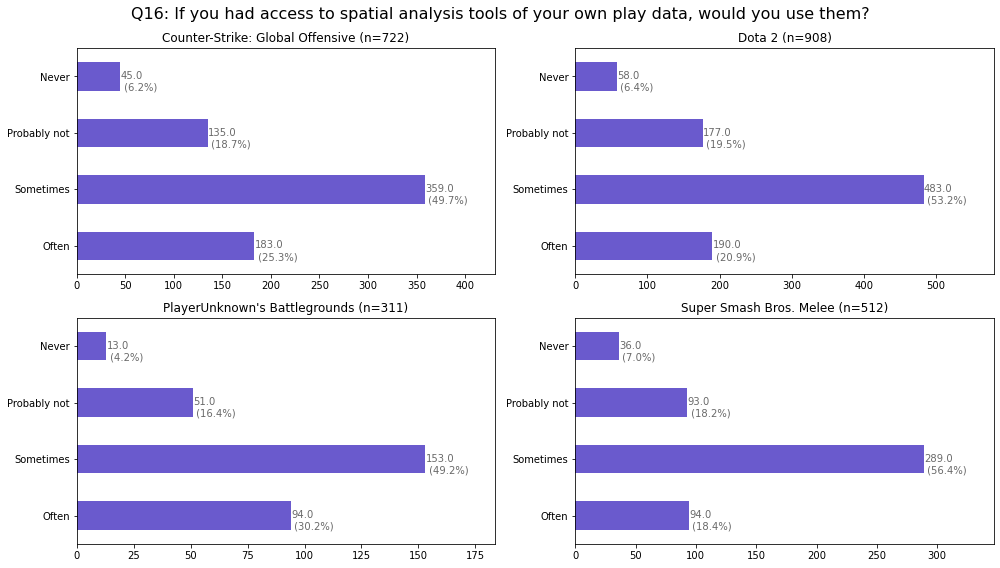

In [733]:
IndividualGraphsB(suptitle, qnum, orderB, qdf, gameList, counts)

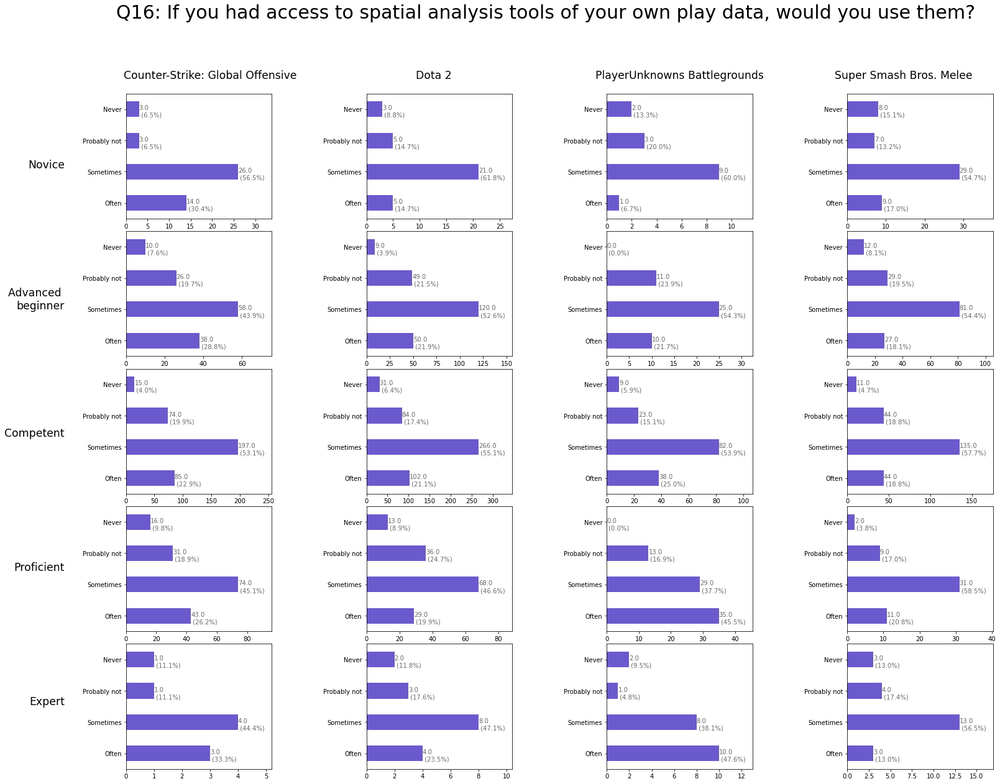

In [734]:
IndividualGraphsC(suptitle, qnum, orderB, qdf)

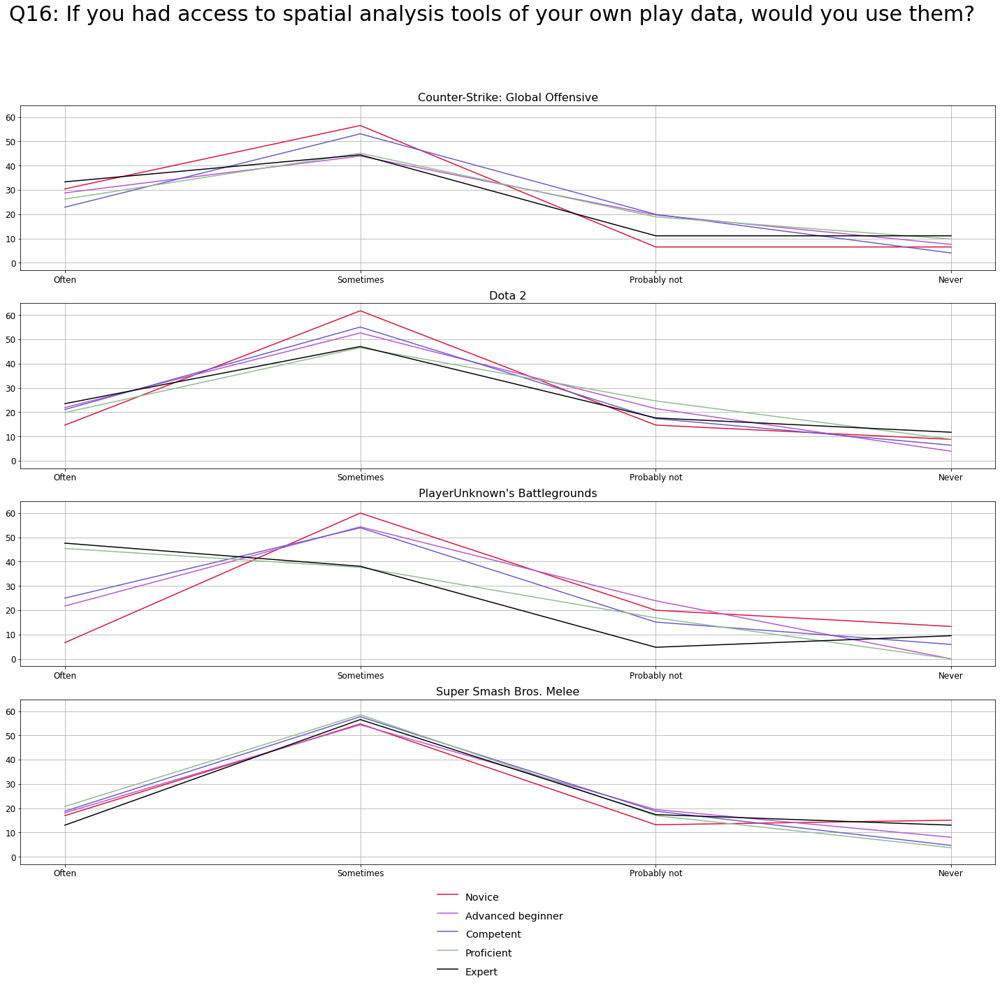

In [735]:
IndividualLines(suptitle,qnum,orderB,qdf)

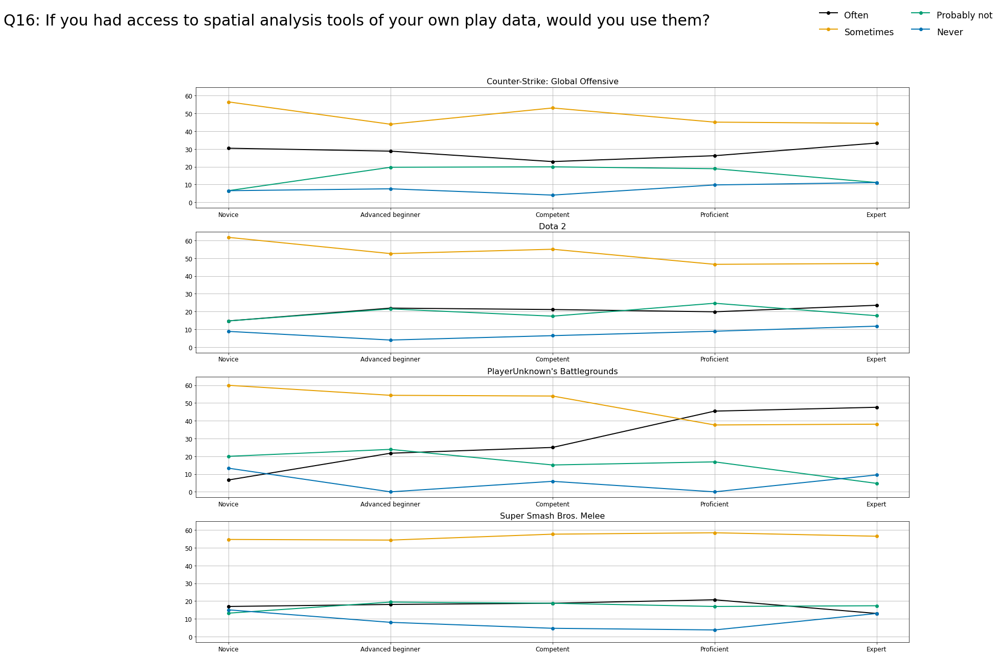

In [736]:
IndividualLinesSkill(suptitle, qnum, order, qdf)

In [710]:
q16df = pd.DataFrame()
q16df['Q16'] = df['Q16'].copy()
q16df['Q5'] = df['Q5'].copy()
q16df['Q1'] = df['Q1']
q16df['Q16'].unique().tolist()

['Would use sometimes',
 'Probably would not use',
 'Would use often',
 'Would not use']

In [711]:
def Q16AnswersToCodes(row):
    if row['Q16'] == "Would not use":
        return 0
    elif row['Q16'] == "Probably would not use":
        return 1
    elif row['Q16'] == "Would use sometimes":
        return 2
    else:
        return 3

In [712]:
q16df['Q16Code'] = q16df.apply(lambda row: Q16AnswersToCodes(row), axis=1)
q16df['Q5Code'] = q16df.apply(lambda row: Q5AnswersToCodes(row), axis=1)
q16df

,Q16,Q5,Q1,Q16Code,Q5Code
0,Would use sometimes,Novice,Counter-Strike: Global Offensive,2,0
1,Would use sometimes,Advanced beginner,Counter-Strike: Global Offensive,2,1
2,Probably would not use,Advanced beginner,Counter-Strike: Global Offensive,1,1
3,Would use sometimes,Advanced beginner,Counter-Strike: Global Offensive,2,1
4,Probably would not use,Advanced beginner,Counter-Strike: Global Offensive,1,1
...,...,...,...,...,...
2468,Would use sometimes,Proficient,Super Smash Bros. Melee,2,3
2469,Would use sometimes,Proficient,Super Smash Bros. Melee,2,3
2470,Would use often,Proficient,Super Smash Bros. Melee,3,3
2471,Would use sometimes,Proficient,Super Smash Bros. Melee,2,3


In [713]:
q16LogRegCollection=LogRegCollectionOne(q16df,['Q16Code'],skillList,gameList)

Counter-Strike: Global Offensive
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Dota 2
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
PlayerUnknown's Battlegrounds
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Super Smash Bros. Melee
Skill levels: Novice and Advanced beginner
Skill levels: Advanced beginner and Competent
Skill levels: Competent and Proficient
Skill levels: Proficient and Expert
Counter-Strike: Global Offensive
            0   1   2     3
Q16Code -0.04 NaN NaN -0.06
Dota 2
          0   1     2     3
Q16Code NaN NaN -0.05 -0.05
PlayerUnknown's Battlegrounds
            0   1     2   3
Q16Code  0.16 NaN  0.08 NaN
Super Smash 

Skill 0 first: Counter({1: 676, 0: 46})
Ratio: 0.06804733727810651
Ratio first: 0.06804733727810651
Ratio after: 0.77
Skill 0 after: Counter({1: 532, 0: 520})
Skill 0 first: Counter({1: 874, 0: 34})
Ratio: 0.038901601830663615
Ratio first: 0.038901601830663615
Ratio after: 0.76
Skill 0 after: Counter({1: 680, 0: 664})
Skill 0 first: Counter({1: 296, 0: 15})
Ratio: 0.05067567567567568
Ratio first: 0.05067567567567568
Ratio after: 0.76
Skill 0 after: Counter({1: 229, 0: 224})
Skill 0 first: Counter({1: 459, 0: 53})
Ratio: 0.11546840958605664
Ratio first: 0.11546840958605664
Ratio after: 0.78
Skill 0 after: Counter({1: 366, 0: 358})


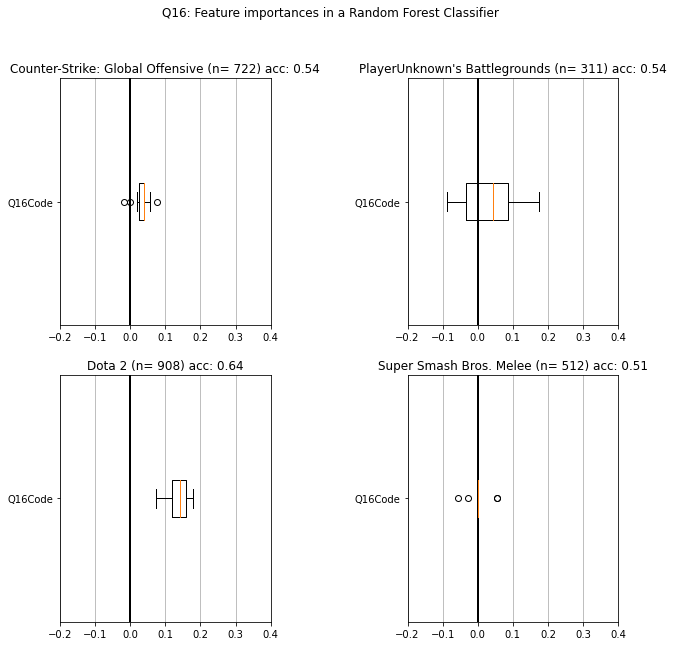

Skill 0 first: Counter({1: 544, 0: 178})
Ratio: 0.3272058823529412
Ratio first: 0.3272058823529412
Ratio after: 0.83
Skill 0 after: Counter({1: 458, 0: 451})
Skill 0 first: Counter({1: 646, 0: 262})
Ratio: 0.4055727554179567
Ratio first: 0.4055727554179567
Ratio after: 0.85
Skill 0 after: Counter({1: 557, 0: 549})
Skill 0 first: Counter({1: 250, 0: 61})
Ratio: 0.244
Ratio first: 0.244
Ratio after: 0.81
Skill 0 after: Counter({1: 205, 0: 202})
Skill 0 first: Counter({1: 310, 0: 202})
Ratio: 0.6516129032258065
Ratio first: 0.6516129032258065
Ratio after: 0.91
Skill 0 after: Counter({1: 284, 0: 282})


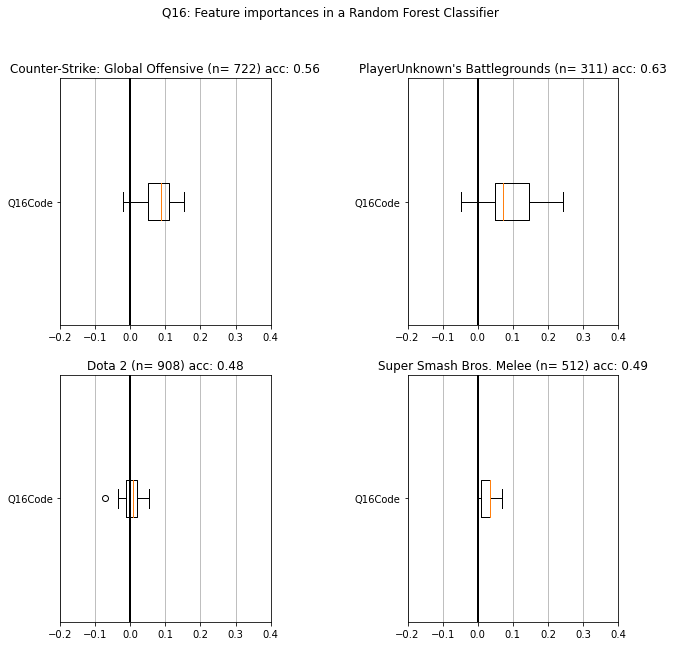

Skill 0 first: Counter({0: 549, 1: 173})
Ratio: 3.1734104046242773
Ratio first: 0.3151183970856102
Ratio after: 0.83
Skill 0 after: Counter({0: 462, 1: 455})
Skill 0 first: Counter({0: 745, 1: 163})
Ratio: 4.570552147239264
Ratio first: 0.21879194630872484
Ratio after: 0.8
Skill 0 after: Counter({0: 608, 1: 596})
Skill 0 first: Counter({0: 213, 1: 98})
Ratio: 2.173469387755102
Ratio first: 0.460093896713615
Ratio after: 0.87
Skill 0 after: Counter({0: 187, 1: 185})
Skill 0 first: Counter({0: 436, 1: 76})
Ratio: 5.7368421052631575
Ratio first: 0.1743119266055046
Ratio after: 0.79
Skill 0 after: Counter({0: 351, 1: 344})


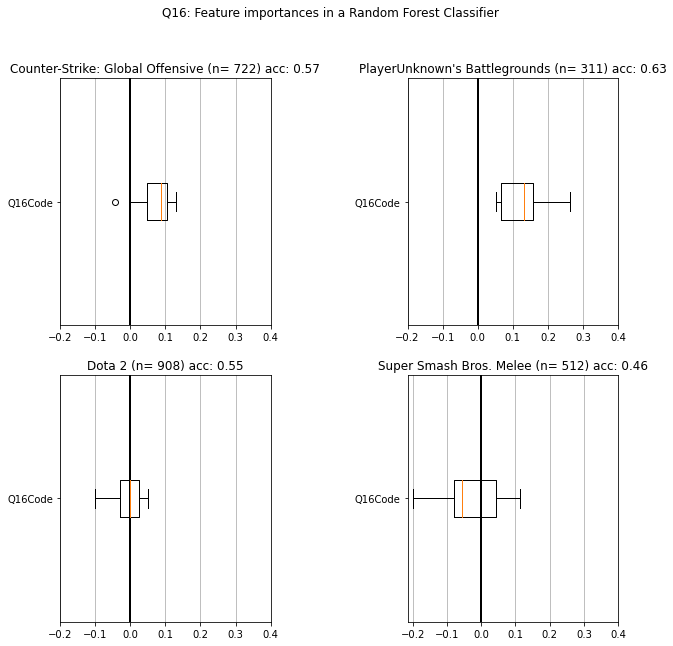

Skill 0 first: Counter({0: 713, 1: 9})
Ratio: 79.22222222222223
Ratio first: 0.012622720897615708
Ratio after: 0.75
Skill 0 after: Counter({0: 547, 1: 534})
Skill 0 first: Counter({0: 891, 1: 17})
Ratio: 52.411764705882355
Ratio first: 0.019079685746352413
Ratio after: 0.75
Skill 0 after: Counter({0: 685, 1: 668})
Skill 0 first: Counter({0: 290, 1: 21})
Ratio: 13.80952380952381
Ratio first: 0.07241379310344828
Ratio after: 0.77
Skill 0 after: Counter({0: 228, 1: 223})
Skill 0 first: Counter({0: 489, 1: 23})
Ratio: 21.26086956521739
Ratio first: 0.04703476482617587
Ratio after: 0.76
Skill 0 after: Counter({0: 380, 1: 371})


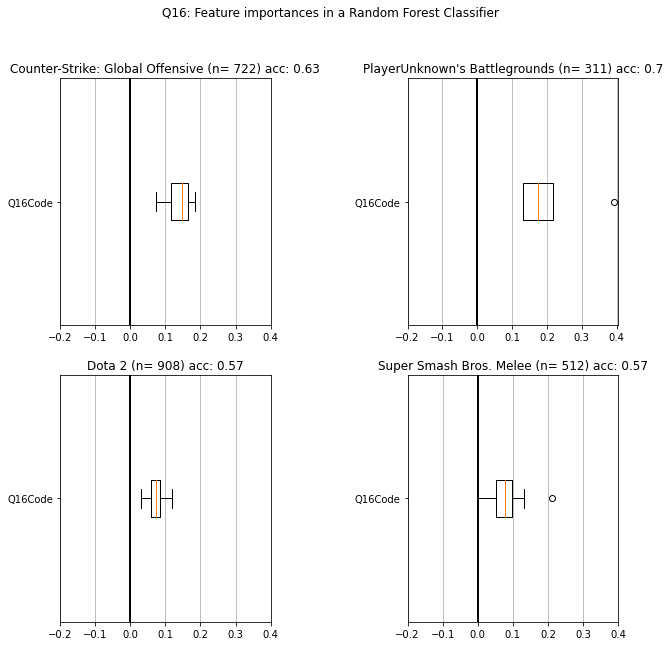

             0      1     2      3
Q16Code  0.032  0.077  0.07  0.139
             0      1    2      3
Q16Code  0.136  0.002  0.0  0.072
             0      1      2      3
Q16Code  0.039  0.093  0.126  0.191
             0      1    2      3
Q16Code  0.003  0.032  0.0  0.079


In [714]:
q16Params = {'l2_regularization':0.2, 'learning_rate':0.9, 'max_depth':10, 'max_iter':20, 'min_samples_leaf':10}
q16importances= getImportancesOne(q16df, qnum, ['Q16Code'], q16Params, gameList, skillList, 10)

<Figure size 432x288 with 0 Axes>

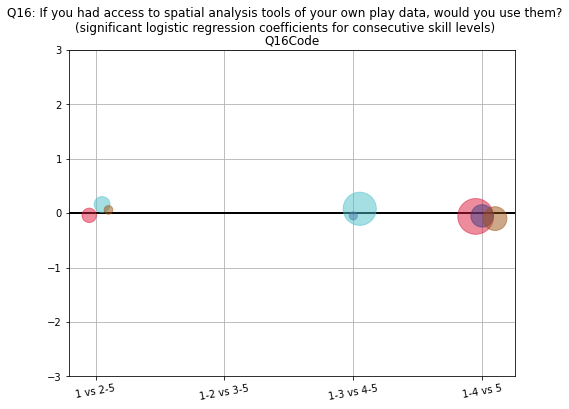

In [715]:
ScatterPlotImportancesOne(suptitle, ['Q16Code'],qnum, q16LogRegCollection, q16importances, gameList)

<Figure size 432x288 with 0 Axes>

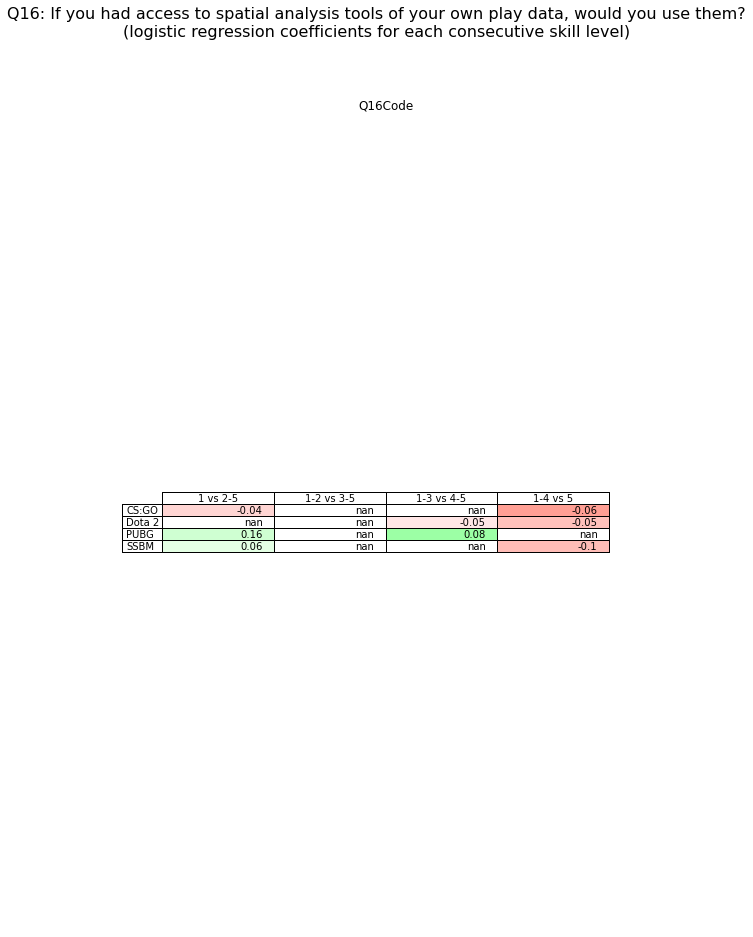

In [718]:
TablePlotImportancesOne(suptitle, ['Q16Code'], qnum,q16LogRegCollection, q16importances,gameList)

In [572]:
NonParametricStats(q16df,'Q5Code','Q16Code')

Rank 0 mean: 1.86 median: 2.0
Rank 1 mean: 1.91 median: 2.0
Rank 2 mean: 1.93 median: 2.0
Rank 3 mean: 1.92 median: 2.0
Rank 4 mean: 1.93 median: 2.0
Kruskal Statistic: 5.689159342987428 p: 0.01707003004527708
*** Kruskal success (reject H0) p=0.017
Wilcoxon Statistic: 557112.0 p: 0.14550371248515215
Wilcoxon failure p=0.146
Mann-Whitney U Statistic: 2899758.0 p: 0.008535269242848467
*** Mann-Whitney U success (reject H0) p=0.009


In [573]:
NonParametricCorrelations(q16df['Q5Code'], q16df['Q16Code'])

Spearmans correlation coefficient: 0.019
Samples are uncorrelated (fail to reject H0) p=0.337
Kendall correlation coefficient: 0.017
Samples are uncorrelated (fail to reject H0) p=0.335


In [574]:
# Wilcoxon rank-sum test
# Also for bigger datasets, but too strong?

wilcoxon(q16df['Q5Code'], q16df['Q16Code'])

WilcoxonResult(statistic=557112.0, pvalue=0.14550371248515215)

In [575]:
# Mann-Whitney U test
# Only for smaller datasets?
mannwhitneyu(q16df['Q5Code'], q16df['Q16Code'])

MannwhitneyuResult(statistic=2899758.0, pvalue=0.008535269242848467)

In [576]:
skill, target = 'Q5Code','Q16Code'
for game in gameList:
    print(game)
    print("")
    NonParametricStats(q16df.loc[q16df['Q1']==game],skill,target)
    
    print("")
    NonParametricCorrelations(q16df.loc[q16df['Q1']==game][skill],q16df.loc[q16df['Q1']==game][target])
    
    print("")

Counter-Strike: Global Offensive

Rank 0 mean: 2.11 median: 2.0
Rank 1 mean: 1.94 median: 2.0
Rank 2 mean: 1.95 median: 2.0
Rank 3 mean: 1.88 median: 2.0
Rank 4 mean: 2.0 median: 2.0
Kruskal Statistic: 0.04117471595115527 p: 0.8392010486048248
Kruskal failure p=0.839
Wilcoxon Statistic: 50901.0 p: 0.8472931371079033
Wilcoxon failure p=0.847
Mann-Whitney U Statistic: 259159.5 p: 0.4196272705409084
Mann-Whitney U failure p=0.420

Spearmans correlation coefficient: -0.042
Samples are uncorrelated (fail to reject H0) p=0.263
Kendall correlation coefficient: -0.037
Samples are uncorrelated (fail to reject H0) p=0.260

Dota 2

Rank 0 mean: 1.82 median: 2.0
Rank 1 mean: 1.93 median: 2.0
Rank 2 mean: 1.91 median: 2.0
Rank 3 mean: 1.77 median: 2.0
Rank 4 mean: 1.82 median: 2.0
Kruskal Statistic: 1.7706015932209334 p: 0.1833076446642984
Kruskal failure p=0.183
Wilcoxon Statistic: 77240.0 p: 0.6662975274756884
Wilcoxon failure p=0.666
Mann-Whitney U Statistic: 398671.5 p: 0.09166189835832728
Mann

In [577]:
for game in gameList:
    print(game)
    print("")
    NonParametricStatsCross(q16df.loc[q16df['Q1']==game], skill, target)
    
    print("")


Counter-Strike: Global Offensive

Rank 0 mean: 2.11 median: 2.0
Rank 1 mean: 1.94 median: 2.0
Rank 2 mean: 1.95 median: 2.0
Rank 3 mean: 1.88 median: 2.0
Rank 4 mean: 2.0 median: 2.0
Kruskal, skills: 0/1. Stat: 1.3065796203248743 p: 0.2530148687059169
Kruskal failure p=0.253
Mann-Whitney U Statistic: 2716.0 p: 0.12687856005257386
Mann-Whitney U failure p=0.127
Kruskal, skills: 0/2. Stat: 2.548308332513585 p: 0.11041241926323415
Kruskal failure p=0.110
Mann-Whitney U Statistic: 7413.5 p: 0.0552858019156539
Mann-Whitney U failure p=0.055
Kruskal, skills: 0/3. Stat: 2.401011813813825 p: 0.1212567997968636
Kruskal failure p=0.121
Mann-Whitney U Statistic: 3246.5 p: 0.06080566670367127
Mann-Whitney U failure p=0.061
Kruskal, skills: 0/4. Stat: 0.041013929588857925 p: 0.8395110367292107
Kruskal failure p=0.840
Mann-Whitney U Statistic: 199.0 p: 0.4247088209212211
Mann-Whitney U failure p=0.425
Kruskal, skills: 1/2. Stat: 0.051310461560994794 p: 0.8207984627991689
Kruskal failure p=0.821
Mann

In [564]:
qdf['orderedSkill'] = df['orderedSkill']
testDf= qdf.loc[qdf['Q1']==gameList[0]]
testDf['skill'] = 0
for index, row in testDf.iterrows():
    for i in range(5):
        if row['Q5']==skillList[i]:
            testDf.at[index,'skill']=i

x = testDf[orderB]
y= testDf['skill']

In [565]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=2)
classifier = logisticRegr.fit(x_train, y_train)
# Returns a NumPy Array
# Predict for One Observation (image)
predictions = logisticRegr.predict(x_test)
# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)
print(logisticRegr.coef_)

0.5342465753424658
[[ 0.21848611  0.29560377 -0.48722772 -0.02492182]
 [-0.0918123  -0.26738132  0.12396079  0.23567369]
 [-0.11821948  0.09414829  0.27320273 -0.24971352]
 [-0.12446423 -0.28583053  0.0932193   0.31715147]
 [ 0.11600989  0.1634598  -0.0031551  -0.27818983]]


In [566]:
# Ordinal logistic regression

In [1015]:
mod_prob = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='probit')

res_prob = mod_prob.fit(method='bfgs')
res_prob.summary()

ValueError: there should not be a constant in the model

In [1016]:
mod_log = OrderedModel(testDf['orderedSkill'],
                        testDf[orderB],
                        distr='logit')

res_log = mod_log.fit(method='bfgs', disp=False)
res_log.summary()

ValueError: there should not be a constant in the model

In [1017]:
predicted = res_log.model.predict(res_log.params, exog=testDf[orderB])
pred_choice = predicted.argmax(1)
print('Fraction of correct skill predictions')
print((np.asarray(testDf['orderedSkill'].values.codes) == pred_choice).mean())

ValueError: matrices are not aligned

In [567]:
# Create a split of the data
X_train, X_test, y_train, y_test = train_test_split(testDf[orderB].astype(int), testDf['skill'].astype(int), 
                                                    train_size=0.9, test_size=0.1, random_state=2)

# Create a base model for comparison 
print("Base model: ")
base_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=10, random_state=0)

# Find the base model predictions and print the accuracy with train data
base_preds = BoostEvaluate(base_model, X_train, y_train, X_test, y_test)

# Search for the best model with randomized parameters
model_random.fit(X_train,y_train)

# Get the best model from the searched random models. The arguments have been defined in q7
best_random = model_random.best_estimator_

# Find the best predictions and print the accuracy
print("Best model: ")
best_preds = BoostEvaluate(best_random,X_train,y_train, X_test, y_test)

# Print the importance scores for each individual variable
imps = best_random.feature_importances_
i = 0
for column in X_train:
    print(column+ ": " + str(round(imps[i],2)))
    i+=1

Base model: 
Accuracy: 0.5342465753424658
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best model: 
Accuracy: 0.5342465753424658
Often: 0.12
Sometimes: 0.5
Probably not: 0.28
Never: 0.1


In [568]:
best16 = best_random
best16

GradientBoostingRegressor(criterion='mae', learning_rate=0.01, max_depth=None,
                          max_features='auto', n_estimators=30,
                          warm_start=True)